# Propensity analysis

### Imports

In [1]:
import copy
import itertools
import random
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns  # Note will call statsmodels for kde if installed on system, otherwise will use scipy
from collections import OrderedDict

In [2]:
sns.set()

### Functions and variable definitions

In [3]:
# Defines dictionary of amino acid abbreviations
aa_dict = OrderedDict({'A': 'Ala',
                       'R': 'Arg',
                       'N': 'Asn',
                       'D': 'Asp',
                       'C': 'Cys',
                       'Q': 'Gln',
                       'E': 'Glu',
                       'G': 'Gly', 
                       'H': 'His',
                       'I': 'Ile',
                       'L': 'Leu',
                       'K': 'Lys',
                       'M': 'Met',
                       'F': 'Phe',
                       'P': 'Pro',
                       'S': 'Ser',
                       'T': 'Thr',
                       'W': 'Trp',
                       'Y': 'Tyr',
                       'V': 'Val'})

In [4]:
def define_dict(dict_vals):
    """
    Defines a dictionary of amino acid properties. Allows quick definition of new property dictionaries (can
    simply copy and paste the new property values from e.g. the Amino Axid Index) 
    Input: a list (dict_vals) of property values for the 20 (alphabetically ordered) amino acids
    Returns: a dictionary of these property values
    """
    aa_dict =  OrderedDict({'A': dict_vals[0],
                            'R': dict_vals[1],
                            'N': dict_vals[2],
                            'D': dict_vals[3],
                            'C': dict_vals[4],
                            'Q': dict_vals[5],
                            'E': dict_vals[6],
                            'G': dict_vals[7],
                            'H': dict_vals[8],
                            'I': dict_vals[9],
                            'L': dict_vals[10],
                            'K': dict_vals[11],
                            'M': dict_vals[12],
                            'F': dict_vals[13],
                            'P': dict_vals[14],
                            'S': dict_vals[15],
                            'T': dict_vals[16],
                            'W': dict_vals[17],
                            'Y': dict_vals[18],
                            'V': dict_vals[19]})
    return aa_dict

In [5]:
def remove_nan(prop_list):
    """
    Removes all instances of '', 'NaN' and np.nan from an input list
    Input: a list (prop_list) to be filtered
    Returns: the filtered list
    """
    prop_remove_list = ['', 'NaN', np.nan]
    for prop_remove in prop_remove_list:
        if prop_remove in prop_list:
            prop_list = [x for x in prop_list if x != prop_remove]
    return prop_list

In [6]:
def calc_distribution(df, aa_dict):
    """
    Counts the number of each amino acid in dataframe of barrel / sandwich properties
    Input: dataframe of barrel / sandwich properties and dictionary of amino acid abbreviations
    Returns: dataframe of count data
    """
    distribution_list = ['']*len(aa_dict.keys())
    for aa in list(aa_dict.keys()):
        count = df['fasta_seq'].tolist().count(aa)
        distribution_list[list(aa_dict.keys()).index(aa)] = count / df.shape[0]

    df_dict = {'FASTA': list(aa_dict.keys())}
    df_dict['Normalised frequency'] = distribution_list

    distribution_df = pd.DataFrame(df_dict)
    return distribution_df

In [7]:
def calc_indv_property_propensities(df, prop, aa_dict):
    """
    Calculates propensities of the amino acids listed in the input dictionary for a feature of interest (e.g.
    'interior' or 'exterior')
    Input: dataframe of barrel / sandwich properties, name of the (categorical) feature of interest (specified via
           the name of the corresponding column in the input dataframe), and dictionary of amino acid abbreviations
    Returns: dataframe of propensity values, plus dataframes of the frequencies and normalised frequencies (since
             extreme propensity values can result from low counts)
    """
    prop_list = list(set(df[prop].tolist()))
    prop_list = remove_nan(prop_list)

    temp_lists = {}
    for prop_val in prop_list:
        temp_lists['{}_propensity_list'.format(prop_val)] = ['']*len(list(aa_dict.keys()))
        temp_lists['{}_frequency_list'.format(prop_val)] = ['']*len(list(aa_dict.keys()))
        temp_lists['{}_normed_frequency_list'.format(prop_val)] = ['']*len(list(aa_dict.keys()))

        temp_lists['total_{}_count'.format(prop_val)] = df[prop].tolist().count(prop_val)

    for aa in list(aa_dict.keys()):
        aa_df = df[df['fasta_seq'] == aa]
        aa_df = aa_df.reset_index(drop=True)

        for prop_val in prop_list:
            try:
                temp_lists['{}_{}_count'.format(prop_val, aa)] = aa_df[prop].tolist().count(prop_val)
                temp_lists['{}_{}_propensity'.format(prop_val, aa)] = ((temp_lists['{}_{}_count'.format(prop_val, aa)] / temp_lists['total_{}_count'.format(prop_val)])
                                                                       / (aa_df.shape[0] / df.shape[0]))
                temp_lists['{}_propensity_list'.format(prop_val)][list(aa_dict.keys()).index(aa)] = temp_lists['{}_{}_propensity'.format(prop_val, aa)]

                temp_lists['{}_{}_frequency'.format(prop_val, aa)] = copy.copy(temp_lists['{}_{}_count'.format(prop_val, aa)])
                temp_lists['{}_frequency_list'.format(prop_val)][list(aa_dict.keys()).index(aa)] = temp_lists['{}_{}_frequency'.format(prop_val, aa)]

                temp_lists['{}_{}_normed_frequency'.format(prop_val, aa)] = temp_lists['{}_{}_count'.format(prop_val, aa)] / temp_lists['total_{}_count'.format(prop_val)]
                temp_lists['{}_normed_frequency_list'.format(prop_val)][list(aa_dict.keys()).index(aa)] = temp_lists['{}_{}_normed_frequency'.format(prop_val, aa)]
            except ZeroDivisionError:
                temp_lists['{}_propensity_list'.format(prop_val)][list(aa_dict.keys()).index(aa)] = np.nan
                temp_lists['{}_frequency_list'.format(prop_val)][list(aa_dict.keys()).index(aa)] = np.nan
                temp_lists['{}_normed_frequency_list'.format(prop_val)][list(aa_dict.keys()).index(aa)] = np.nan

    df_propensity_dict = {'FASTA': list(aa_dict.keys())}
    df_frequency_dict = {'FASTA': list(aa_dict.keys())}
    df_normed_frequency_dict = {'FASTA': list(aa_dict.keys())}
    for prop_val in prop_list:
        df_propensity_dict[prop_val] = temp_lists['{}_propensity_list'.format(prop_val)]
        df_frequency_dict[prop_val] = temp_lists['{}_frequency_list'.format(prop_val)]
        df_normed_frequency_dict[prop_val] = temp_lists['{}_normed_frequency_list'.format(prop_val)]

    propensity_df = pd.DataFrame(df_propensity_dict)
    frequency_df = pd.DataFrame(df_frequency_dict)
    normed_frequency_df = pd.DataFrame(df_normed_frequency_dict)
    
    return propensity_df, frequency_df, normed_frequency_df

In [8]:
def calc_combined_property_propensities(df, prop_comb, aa_dict):
    """
    Calculates propensities of the amino acids listed in the input dictionary for two or more features of interest
    (e.g. 'interior' and 'transmembrane', 'interior' and 'external', 'exterior' and 'transmembrane', or 'exterior'
    and 'external')
    Input: dataframe of barrel / sandwich properties, list of names of the (categorical) features of interest
           (specified via the names of the corresponding columns in the input dataframe), and dictionary of amino
           acid abbreviations
    Returns: dataframe of propensity values, plus dataframes of the frequencies and normalised frequencies (since
             extreme propensity values can result from low counts)
    """
    amalgamate_list = []
    for prop in prop_comb:
        filtered_list = list(set(df[prop].tolist()))
        filtered_list = remove_nan(filtered_list)
        amalgamate_list.append(filtered_list)
    combinations = list(itertools.product(*amalgamate_list))
    combinations = ['_'.join(tup) for tup in combinations]

    for prop in prop_comb:
        df[prop] = [str(x) for x in df[prop].tolist()]
    df_prop_comb = pd.DataFrame({'combination': df[prop_comb].apply('_'.join, axis=1),
                                 'FASTA': df['fasta_seq']})

    temp_lists = {}
    for combination in combinations:
        temp_lists['{}_propensity_list'.format(combination)] = ['']*len(list(aa_dict.keys()))
        temp_lists['{}_frequency_list'.format(combination)] = ['']*len(list(aa_dict.keys()))
        temp_lists['{}_normed_frequency_list'.format(combination)] = ['']*len(list(aa_dict.keys()))

        temp_lists['total_{}_count'.format(combination)] = df_prop_comb['combination'].tolist().count(combination)

        for aa in list(aa_dict.keys()):
            aa_df = df_prop_comb[df_prop_comb['FASTA'] == aa]
            aa_df = aa_df.reset_index(drop=True)

            try:
                temp_lists['{}_{}_count'.format(combination, aa)] = aa_df['combination'].tolist().count(combination)
                temp_lists['{}_{}_propensity'.format(combination, aa)] = ((temp_lists['{}_{}_count'.format(combination, aa)] / temp_lists['total_{}_count'.format(combination)])
                                                                          / (aa_df.shape[0] / df.shape[0]))
                temp_lists['{}_propensity_list'.format(combination)][list(aa_dict.keys()).index(aa)] = temp_lists['{}_{}_propensity'.format(combination, aa)]

                temp_lists['{}_{}_frequency'.format(combination, aa)] = copy.copy(temp_lists['{}_{}_count'.format(combination, aa)])
                temp_lists['{}_frequency_list'.format(combination)][list(aa_dict.keys()).index(aa)] = temp_lists['{}_{}_frequency'.format(combination, aa)]

                temp_lists['{}_{}_normed_frequency'.format(combination, aa)] = temp_lists['{}_{}_count'.format(combination, aa)] / temp_lists['total_{}_count'.format(combination)]
                temp_lists['{}_normed_frequency_list'.format(combination)][list(aa_dict.keys()).index(aa)] = temp_lists['{}_{}_normed_frequency'.format(combination, aa)]
            except ZeroDivisionError:
                temp_lists['{}_propensity_list'.format(combination)][list(aa_dict.keys()).index(aa)] = np.nan
                temp_lists['{}_frequency_list'.format(combination)][list(aa_dict.keys()).index(aa)] = np.nan
                temp_lists['{}_normed_frequency_list'.format(combination)][list(aa_dict.keys()).index(aa)] = np.nan

    df_propensity_dict = {'FASTA': list(aa_dict.keys())}
    df_frequency_dict = {'FASTA': list(aa_dict.keys())}
    df_normed_frequency_dict = {'FASTA': list(aa_dict.keys())}
    for combination in combinations:
        df_propensity_dict[combination] = temp_lists['{}_propensity_list'.format(combination)]
        df_frequency_dict[combination] = temp_lists['{}_frequency_list'.format(combination)]
        df_normed_frequency_dict[combination] = temp_lists['{}_normed_frequency_list'.format(combination)]

    propensity_df = pd.DataFrame(df_propensity_dict)
    frequency_df = pd.DataFrame(df_frequency_dict)
    normed_frequency_df = pd.DataFrame(df_normed_frequency_dict)

    return propensity_df, frequency_df, normed_frequency_df

In [9]:
def calc_aa_pair_propensities(df, prop, aa_dict):
    """
    Calculates propensities of the amino acids listed in the input dictionary to form pairwise interactions at 
    e.g. a particular location (e.g. HB vs. NHB positions) or via a particular type of interaction (e.g. cation-pi,
    hydrogen bonds, van der Waals interactions, etc.)
    Input: dataframe of barrel / sandwich properties, name of the interaction type / location of interest (specified via
           the name of the corresponding column in the input dataframe), and dictionary of amino acid abbreviations
    Returns: dataframe of propensity values, plus dataframes of the frequencies and normalised frequencies (since
             extreme propensity values can result from low counts)
    """
    neighbours_list = [fasta for fasta_list in df['{}'.format(prop)].tolist() for fasta in fasta_list]

    temp_lists = {}
    for aa_1 in list(aa_dict.keys()):
        temp_lists['{}_propensity_list'.format(aa_1)] = ['']*len(list(aa_dict.keys()))
        temp_lists['{}_frequency_list'.format(aa_1)] = ['']*len(list(aa_dict.keys()))
        temp_lists['{}_normed_frequency_list'.format(aa_1)] = ['']*len(list(aa_dict.keys()))

        aa1_df = df[df['fasta_seq'] == aa_1]
        aa1_df = aa1_df.reset_index(drop=True)
        temp_lists['{}_neighbours_list'.format(aa_1)] = [fasta for fasta_list in aa1_df['{}'.format(prop)].tolist() for fasta in fasta_list]
        temp_lists['{}_neighbours_count'.format(aa_1)] = len(temp_lists['{}_neighbours_list'.format(aa_1)])

        for aa_2 in list(aa_dict.keys()):
            try:
                temp_lists['{}_{}_count'.format(aa_1, aa_2)] = temp_lists['{}_neighbours_list'.format(aa_1)].count(aa_2)
                temp_lists['{}_{}_propensity'.format(aa_1, aa_2)] = ((temp_lists['{}_{}_count'.format(aa_1, aa_2)] / temp_lists['{}_neighbours_count'.format(aa_1)])
                                                                     / (neighbours_list.count(aa_2) / len(neighbours_list)))
                temp_lists['{}_propensity_list'.format(aa_1)][list(aa_dict.keys()).index(aa_2)] = temp_lists['{}_{}_propensity'.format(aa_1, aa_2)]

                temp_lists['{}_{}_frequency'.format(aa_1, aa_2)] = copy.copy(temp_lists['{}_{}_count'.format(aa_1, aa_2)])
                temp_lists['{}_frequency_list'.format(aa_1)][list(aa_dict.keys()).index(aa_2)] = temp_lists['{}_{}_frequency'.format(aa_1, aa_2)]

                temp_lists['{}_{}_normed_frequency'.format(aa_1, aa_2)] = temp_lists['{}_{}_count'.format(aa_1, aa_2)] / temp_lists['{}_neighbours_count'.format(aa_1)]
                temp_lists['{}_normed_frequency_list'.format(aa_1)][list(aa_dict.keys()).index(aa_2)] = temp_lists['{}_{}_normed_frequency'.format(aa_1, aa_2)]
            except ZeroDivisionError:
                temp_lists['{}_propensity_list'.format(aa_1)][list(aa_dict.keys()).index(aa_2)] = np.nan
                temp_lists['{}_frequency_list'.format(aa_1)][list(aa_dict.keys()).index(aa_2)] = np.nan
                temp_lists['{}_normed_frequency_list'.format(aa_1)][list(aa_dict.keys()).index(aa_2)] = np.nan

    df_propensity_dict = OrderedDict({'FASTA': list(aa_dict.keys())})
    df_frequency_dict = OrderedDict({'FASTA': list(aa_dict.keys())})
    df_normed_frequency_dict = OrderedDict({'FASTA': list(aa_dict.keys())})
    for aa_1 in list(aa_dict.keys()):
        df_propensity_dict[aa_1] = temp_lists['{}_propensity_list'.format(aa_1)]
        df_frequency_dict[aa_1] = temp_lists['{}_frequency_list'.format(aa_1)]
        df_normed_frequency_dict[aa_1] = temp_lists['{}_normed_frequency_list'.format(aa_1)]

    propensity_df = pd.DataFrame(df_propensity_dict)
    frequency_df = pd.DataFrame(df_frequency_dict)
    normed_frequency_df = pd.DataFrame(df_normed_frequency_dict)

    return propensity_df, frequency_df, normed_frequency_df

In [10]:
def plot_bar_graphs(df, propensity_or_frequency):
    """
    Plots a bar graph of property / propensity of interest vs. amino acid identity
    Input: dataframe of barrel / sandwich properties, and the name of the property / propensity of interest
           (specified via the name of the corresponding column in the input dataframe)
    """
    reshaped_df = pd.melt(df, id_vars='FASTA', var_name='Property', value_name=propensity_or_frequency)
    reshaped_df = reshaped_df.dropna()

    plt.clf()
    sns.factorplot(x='FASTA', y=propensity_or_frequency, hue='Property', data=reshaped_df, kind='bar', size=15)
    plt.show()

In [11]:
def plot_heat_map(df):
    """
    Plots a heat map
    Input: dataframe of propensity / count data of property of interest vs. amino acid identity (which must be in
           a column labelled 'FASTA')
    """
    df = df.set_index('FASTA', drop=True)

    plt.clf()
    plt.figure(figsize=(20, 10))
    sns.heatmap(df)
    plt.show()

In [12]:
def plot_aa_kdes(df, cont_prop, indv_or_comp, aa_dict):
    """
    Plots kernel density estimate of the distribution of each amino acid of interest vs. a continuous property of
    interest (typically z-coordinate)
    Input: dataframe of barrel / sandwich properties, name of continuous property of interest (specified via the
           name of the corresponding column in the input dataframe), whether to plot the distribution of the amino
           acid alone ('individual') or whether to also plot the distribution of all amino acids ('comparison'),
           and dictionary of amino acid abbreviations
    """
    for aa in list(aa_dict.keys()):
        print(aa)
        
        plt.clf()
        plt.figure(figsize=(10, 5))
        axes = plt.gca()
        axes.set_xlim([-40,60])

        if indv_or_comp == 'comparison':
            sns.distplot(df[cont_prop], hist=False, kde_kws={'bw':'scott'})
        
        aa_df = df[df['fasta_seq'] == aa]
        aa_df = aa_df.reset_index(drop=True)
        sns.distplot(aa_df[cont_prop], hist=False, rug=True, kde_kws={'bw':'scott'}, rug_kws={'alpha': 0.1})

        plt.show()

In [13]:
def plot_propensities(df, cont_prop, aa_dict):
    """
    Plots propensity of each amino acid of interest vs. a continuous property of interest (typically z-coordinate)
    Input: dataframe of barrel / sandwich properties, name of continuous property of interest (specified via the
           name of the corresponding column in the input dataframe), and dictionary of amino acid abbreviations
    """
    for aa in list(aa_dict.keys()):
        print(aa)
        
        plt.clf()
        plot_overall = sns.distplot(df[cont_prop], kde_kws={'bw':'scott'})
        xy_values_overall = plot_overall.get_lines()[0].get_data()
        x_values_overall = xy_values_overall[0].tolist()
        y_values_overall = xy_values_overall[1].tolist()

        # Keep separate from code for first plot - only one can be held in memory at a time!
        aa_df = df[df['fasta_seq'] == aa]
        aa_df = aa_df.reset_index(drop=True)
        plt.clf()
        plot_indv = sns.distplot(aa_df[cont_prop], kde_kws={'bw':'scott'})
        xy_values_indv = plot_indv.get_lines()[0].get_data()
        x_values_indv = xy_values_indv[0].tolist()
        y_values_indv = xy_values_indv[1].tolist()
        
        x_values_indv_copy = copy.copy(x_values_indv)

        propensities = ['']*len(x_values_indv)
        for index_1, value_1 in enumerate(x_values_indv):
            x_indv = x_values_indv[index_1]
            y_indv = y_values_indv[index_1]
            
            x_overall_interpolate = []
            if x_values_overall[0] > x_indv:
                x_overall_interpolate.append('')
                x_values_indv_copy[index_1] = ''
            elif x_values_overall[-1] < x_indv:
                x_overall_interpolate.append('')
                x_values_indv_copy[index_1] = ''
            else:
                for index_2, value_2 in enumerate(x_values_overall):
                    if x_values_overall[index_2] == x_indv:
                        x_overall_interpolate.append(index_2)
                        break
                    elif index_2 < (len(x_values_overall) - 1):
                        if x_values_overall[index_2] < x_indv and x_values_overall[index_2+1] > x_indv:
                            x_overall_interpolate.append(index_2)
                            x_overall_interpolate.append(index_2+1)
                            break

            if x_overall_interpolate != ['']:
                if len(x_overall_interpolate) == 1:
                    y_overall = y_values_overall[x_overall_interpolate[0]]
                    print(y_overall)
                elif len(x_overall_interpolate) == 2:
                    x_1 = x_values_overall[x_overall_interpolate[0]]
                    x_2 = x_values_overall[x_overall_interpolate[1]]
                    y_1 = y_values_overall[x_overall_interpolate[0]]
                    y_2 = y_values_overall[x_overall_interpolate[1]]

                    y_1_weight = abs(x_2 - x_indv) / abs(x_2 - x_1)
                    y_2_weight = abs(x_indv - x_1) / abs(x_2 - x_1)

                    y_overall = (y_1*y_1_weight) + (y_2*y_2_weight)

                propensity = y_indv / y_overall
                propensities[index_1] = propensity

        x_values_indv_copy = [x for x in x_values_indv_copy if x != '']
        propensities = [y for y in propensities if y != '']

        plt.clf()
        plt.figure(figsize=(10, 5))
        axes = plt.gca()
        axes.set_xlim([-40,60])
        axes.set_ylim([0,10])
        plt.plot(np.array(x_values_indv_copy), np.array(propensities))
        plt.show()

In [14]:
def plot_discrete_prop_frequency_kdes(df, cont_prop, discrete_props):
    """
    Plots kernel density estimate of the distribution of a discrete property (e.g. the number of interactions of a
    particular type (e.g. hydrogen bonds) formed by an amino acid)  vs. a continuous property (typically z-coordinate)
    Input: dataframe of barrel / sandwich properties, name of continuous property of interest (specified via the
           name of the corresponding column in the input dataframe), and list of discrete properties (each discrete
           property is considered individually, in a separate kde plot)
    """
    for discrete_prop in discrete_props:
        print(discrete_prop)

        discrete_prop_count = []
        for row in range(df.shape[0]):
            interaction_num = len(df[discrete_prop][row])
            count = 0
            while count < interaction_num:
                count += 1
                discrete_prop_count.append(df[cont_prop][row])

        plt.clf()
        plt.figure(figsize=(10, 5))
        sns.distplot(pd.DataFrame({cont_prop: discrete_prop_count}), hist=False, rug=True, kde_kws={'bw':'scott'},
                     rug_kws={'alpha': 0.1})
        plt.show()

In [15]:
def plot_prop_vs_prop(df, cont_prop_1, cont_prop_dict_2, cont_prop_2, bw_1, bw_2):
    """
    Plots the 2D kernel desity estimate of two continuous properties
    Input: dataframe of barrel / sandwich properties, name of first continuous property of interest (specified via
           the name of the corresponding column in the input dataframe), dictionary of amino acid identities vs.
           their values of the second continuous property of interest, the name of the second continuous property
           of interest, the kernel bandwidth of the first property and the kernel bandwidth of the second continuous
           bandwidth
    """
    prop_list = ['']*df.shape[0]
    unprocessed_indices = []

    for row in range(df.shape[0]):
        fasta = df['fasta_seq'][row]

        if fasta in cont_prop_dict_2:
            prop_list[row] = cont_prop_dict_2[fasta]
        else:
            unprocessed_indices.append(row)

    cont_prop_1_list = [val for index, val in enumerate(df[cont_prop_1].tolist()) if not index in unprocessed_indices]
    prop_list = [val for index, val in enumerate(prop_list) if not index in unprocessed_indices]

    prop_df = pd.DataFrame({cont_prop_1: cont_prop_1_list,
                            cont_prop_2: prop_list})

    plt.clf()
    plt.figure(figsize=(10, 10))
    sns.kdeplot(prop_df[cont_prop_1], prop_df[cont_prop_2], bw=(bw_1,bw_2), shade=True, cbar=True)
    # plt.scatter(prop_df[cont_prop_1], prop_df[cont_prop_2], marker='.', c='y')
    plt.show()

In [16]:
def plot_prop_vs_dihedral(df, cont_prop, dihedral):
    """
    Plots the 2D kernel desity estimate of a continuous property of interest vs. a dihedral angle
    Input: dataframe of barrel / sandwich properties, name of continuous property of interest (specified via
           the name of the corresponding column in the input dataframe), name of dihedral angle of interest
           (specified via the name of the corresponding column in the input dataframe)
    """
    df = df[df[dihedral] != '']
    df = df.reset_index(drop=True)

    dihedral_df = pd.DataFrame({cont_prop: df[cont_prop].tolist(),
                                dihedral: df[dihedral].tolist()})

    plt.clf()
    plt.figure(figsize=(10, 10))
    sns.kdeplot(dihedral_df[cont_prop], dihedral_df[dihedral], bw='scott', shade=True, cbar=True)
    plt.show()

In [381]:
def calc_dist(df, cont_prop):
    """
    Generates ordered array of a (numeric) property of interest in the input dataframe, without '', 'NaN' and
    np.nan values
    Input: dataframe of barrel / sandwich properties, name of property of interest (specified via the name of
           the corresponding column in the input dataframe)
    Returns: ordered numpy array of the property of interest
    """
    cont_prop_vals = df[cont_prop].tolist()
    cont_prop_vals = remove_nan(cont_prop_vals)
    cont_prop_vals = np.array(sorted(cont_prop_vals))

    return cont_prop_vals


def gen_random_array(ordered_array):
    """
    Generates a random array by sampling, with replacement, an input array
    Input: ordered array
    Returns: ordered array, of the same length as the input array, generated by sampling the input array with
             replacement
    """
    random_array_indices = np.empty(len(ordered_array),)

    for num in range(len(ordered_array)):
        rand_index = random.randint(0, (len(ordered_array)-1))
        rand_z_coord = ordered_array[rand_index]
        random_array_indices[num] = rand_z_coord

    return np.sort(random_array_indices)


def run_ks_2samp_test(df, cont_prop, aa, bootstrap):
    """
    Runs the 1D 2 sample Kolmogorov-Smirnov test with scipy to calculate the likelihood that two samples come from
    the same distribution (where sample 1 is the distribution of an individual amino acid with respect to a
    continuous property of interest (typically z-coordinate), and sample 2 is the distribution of all amino acids
    with respect to that property)
    Input: dataframe of barrel / sandwich properties, name of the continuous property of interest (specified via
           the name of the corresponding column in the input dataframe), the name of the individual amino acid, and
           whether this test is being run as part of a bootstrap test or not
    """
    aa_df = df[df['fasta_seq'] == aa]
    aa_df = aa_df.reset_index(drop=True)

    indv_aa_cont_prop_vals = remove_nan(aa_df[cont_prop].tolist())
    indv_aa_cont_prop_vals = np.array(sorted(indv_aa_cont_prop_vals))

    # If performing bootstrap analysis, generate a random array from the df[cont_prop] distribution
    if bootstrap:
        indv_aa_cont_prop_vals = gen_random_array(indv_aa_cont_prop_vals)

    D, p = scipy.stats.ks_2samp(indv_aa_cont_prop_vals, calc_dist(df, cont_prop))

    return D, p


def initial_ks_test(df, cont_prop, ks_func, aa_dict):
    """
    Wrapper to run the 1D 2 sample Kolmogorov-Smirnov test for the original (i.e. not resampled) individual amino
    acid distribution and the overall amino acid distribution
    Input: dataframe of barrel / sandwich properties, name of the continuous property of interest (typically
           z-coordinate) (specified via the name of the corresponding column in the input dataframe), the function
           to run the KS test, and dictionary of amino acid abbreviations
    Returns: dictionaries of D and p values output from KS test
    """
    D_dict = OrderedDict()
    p_dict = OrderedDict()

    for aa in list(aa_dict.keys()):
        D_dict[aa] = []
        p_dict[aa] = []

    for aa in list(aa_dict.keys()):
        D, p = ks_func(df, cont_prop, aa, False)
        D_dict[aa].append(D)
        p_dict[aa].append(p)

    return D_dict, p_dict

def bootstrap_ks_test(df, cont_prop, bootstrap_num, ks_func, aa_dict):
    """
    Wrapper to run the 1D 2 sample Kolmogorov-Smirnov test a specified number of times on different resamplings
    of the original individual amino acid distribution and the overall amino acid distribution
    Input: dataframe of barrel / sandwich properties, name of the continuous property of interest (typically
           z-coordinate) (specified via the name of the corresponding column in the input dataframe), the number
           of KS tests to run (i.e. the size of the bootstrap), the function
           to run the KS test, dictionary of amino acid abbreviations
    Returns: dictionaries of D and p values output from KS test
    """
    D_dict = OrderedDict()
    p_dict = OrderedDict()

    for aa in list(aa_dict.keys()):
        D_dict[aa] = []
        p_dict[aa] = []

    for num in range(bootstrap_num):
        for aa in list(aa_dict.keys()):
            D, p = ks_func(df, cont_prop, aa, True)
            D_dict[aa].append(D)
            p_dict[aa].append(p)

    return D_dict, p_dict


def draw_plot(plot_type, stat_dict, x_list, x_label, y_label):
    """
    Generates swarmplot of D / p values vs. amino acid identity
    Input: dictionary of D or p values, list of amino acid identities, label for x-axis (e.g. 'FASTA'), label for
           y-axis (e.g. 'D' or 'p')
    """
    plt.clf()
    plt.figure(figsize=(15,10))

    x_values = []
    y_values = []    
    for x in x_list:
        for y in stat_dict[x]:
            x_values.append(x)
            y_values.append(y)

    # "Melted" df of aa vs. stat (either p or D)
    df = pd.DataFrame({'{}'.format(x_label): x_values,
                       '{}'.format(y_label): y_values})

    plot_type(x='{}'.format(x_label), y='{}'.format(y_label), data=df)

    plt.show()


def calc_95_conf_limits(initial_stat_dict, bootstrap_stat_dict):
    """
    Calculates 95% confidence limits on D / p from a bootstrap sample
    Input: dictionary of D / p values for original individual amino acid samples, dictionary of D / p values for
           bootstrapped individual amino acid samples
    Returns: dictionary of 95% confidence intervals for D / p
    """
    conf_int_dict = OrderedDict()

    for aa in list(initial_stat_dict.keys()):
        initial_stat = initial_stat_dict[aa][0]
        bootstrap_stat_values = np.sort(np.array(bootstrap_stat_dict[aa]))

        # Crude method of calculating 95% confidence interval, but good enough for my purposes (to complement
        # "by eye" analysis)
        lower_percentile = np.percentile(bootstrap_stat_values, 2.5)
        upper_percentile = np.percentile(bootstrap_stat_values, 97.5)

        conf_int_dict[aa] = [lower_percentile, initial_stat, upper_percentile]
        
    return conf_int_dict


def iterate_bootstrap_conf_limits(df, cont_prop, ks_func, bootstrap_range, aa_dict):
    """
    Performs KS test with increasing number of bootstrap samples and plots output to allow user to determine when the
    confidence intervals converge (and so the minimum number of bootstrap samples they need to run)
    Input: dataframe of barrel / sandwich properties, name of the continuous property of interest (typically
           z-coordinate) (specified via the name of the corresponding column in the input dataframe), the function
           to run the KS test, list of numbers of bootstrap samples to test (e.g. [100, 300, 1000, 3000, 10000, 30000,
           100000]), dictionary of amino acid abbreviations
    """
    initial_D_dict, initial_p_dict = initial_ks_test(df, cont_prop, ks_func, aa_dict)

    bootstrap_D_dict = OrderedDict()
    bootstrap_p_dict = OrderedDict()

    for num in bootstrap_range:
        print(num)
        D_dict, p_dict = bootstrap_ks_test(df, cont_prop, num, ks_func, aa_dict)
        bootstrap_D_dict[num] = D_dict
        bootstrap_p_dict[num] = p_dict

    bootstrap_conf_intv_D_dict = OrderedDict()
    bootstrap_conf_intv_p_dict = OrderedDict()
    for num in bootstrap_range:
        conf_int_D_dict = calc_95_conf_limits(initial_D_dict, bootstrap_D_dict[num])
        bootstrap_conf_intv_D_dict[num] = conf_int_D_dict
        conf_int_p_dict = calc_95_conf_limits(initial_p_dict, bootstrap_p_dict[num])
        bootstrap_conf_intv_p_dict[num] = conf_int_p_dict

    for aa in list(aa_dict.keys()):
        aa_bootstrap_D_dict = OrderedDict()
        aa_bootstrap_p_dict = OrderedDict()
        
        for num in bootstrap_range:
            aa_bootstrap_D_dict[num] = bootstrap_conf_intv_D_dict[num][aa]
            aa_bootstrap_p_dict[num] = bootstrap_conf_intv_p_dict[num][aa]
        
        print(aa)
        draw_plot(sns.swarmplot, aa_bootstrap_p_dict, bootstrap_range, 'Num_bootstrap_samples', 'p')

In [18]:
def calc_pair_proportions(df, pair_type, aa_dict):
    """
    For every pairwise combination of amino acids listed in the input dictionary of amino acid abbreviations, aa1aa2,
    calculates proportions of amino acid pairs at a location of interest (e.g. HB, or NHB, pairs) that are of that
    identity (note that order is not taken into account, hence aa1aa2 == aa2aa1)
    Input: dataframe of sandwich / barrel properties, name of amino acid pair type of interest (specified via the
           name of its corresponding column in the input dataframe), and dictionary of amino acid abbreviations
    Returns: dictionary of aa1aa2 pair count, total number of amino acid pairs of type of interest
    """
    res_id_pairs = []
    fasta_pairs = []

    for row in range(df.shape[0]):
        res_id_1 = df['res_ids'][row]
        fasta_1 = df['fasta_seq'][row]
        res_num_1 = df['res_nums'][row]

        res_id_2 = np.nan
        fasta_2 = np.nan
        res_num_2 = np.nan
        if len(df[pair_type][row]) == 1:
            if df[pair_type][row][0] in df['res_ids'].tolist():
                res_id_2 = df[pair_type][row][0]
                fasta_2 = df['{}_fasta_intra'.format(pair_type)][row][0]
                res_num_2 = df['res_nums'][df['res_ids'].tolist().index(res_id_2)]

        if (
                res_id_2 != np.nan
            and fasta_2 != np.nan
            and res_num_2 != np.nan
            and fasta_1 in list(aa_dict.keys())
            and fasta_2 in list(aa_dict.keys())
        ):
            if (
                    res_num_1 < res_num_2
                and not [res_id_1, res_id_2] in res_id_pairs
            ):
                res_id_pairs.append([res_id_1, res_id_2])
                fasta_pairs.append([fasta_1, fasta_2])
            elif (
                    res_num_1 > res_num_2
                and not [res_id_2, res_id_1] in res_id_pairs
            ):
                res_id_pairs.append([res_id_2, res_id_1])
                fasta_pairs.append([fasta_2, fasta_1])

    pairs_count_dict = OrderedDict()
    for aa_pair in itertools.combinations_with_replacement(list(aa_dict.keys()), 2):
        aa_pair = '{}_{}'.format(aa_pair[0], aa_pair[1])
        pairs_count_dict[aa_pair] = 0

    for aa_pair in fasta_pairs:
        aa_pair = list(aa_pair)
        fwd_aa_pair = '{}_{}'.format(aa_pair[0], aa_pair[1])
        rev_aa_pair = '{}_{}'.format(aa_pair[1], aa_pair[0])

        if fwd_aa_pair in list(pairs_count_dict.keys()):
            pairs_count_dict[fwd_aa_pair] += 1
        elif rev_aa_pair in list(pairs_count_dict.keys()):
            pairs_count_dict[rev_aa_pair] += 1
        else:
            print('Error: Pair not in standard FASTA list')

    pairs_total = len(res_id_pairs)
    for aa_pair in list(pairs_count_dict.keys()):
        pairs_count_dict[aa_pair] = pairs_count_dict[aa_pair] / pairs_total

    return pairs_count_dict, pairs_total


def gen_dek_sandwich_dicts(aa_dict, hb_or_nhb):
    """
    Reads beta-sandwich HB / NHB count data from Dek's 1998 paper (which is stored in two separate csv files in
    the BetaStats directory) into a dictionary
    Input: dictionary of amino acid abbreviations, whether to read in HB (hb_or_nhb = 'hb') or NHB (hb_or_nhb = 'nhb')
           count data
    Returns: dictionary of amino acid pair proportions, total number of HB (hb_or_nhb = 'hb') or NHB
             (hb_or_nhb = 'nhb') amino acid pairs
    """
    pairs_count_dict = OrderedDict()
    for aa_pair in itertools.combinations_with_replacement(list(aa_dict.keys()), 2):
        aa_pair = '{}_{}'.format(aa_pair[0], aa_pair[1])
        pairs_count_dict[aa_pair] = 0
        
    file_name = 'Beta_{}_count_data_Hutchinson_et_al_1998.csv'.format(hb_or_nhb.upper())
    df = pd.read_csv(file_name, header=0, index_col=0)
    for col in df.columns.values.tolist():
        df[col] = pd.to_numeric(df[col].tolist())
        
    pairs_total = df.values.sum()

    for aa_pair in list(pairs_count_dict.keys()):
        aa_1 = aa_pair.split('_')[0]
        aa_2 = aa_pair.split('_')[1]
        count = df[aa_1][aa_2]
        pairs_count_dict[aa_pair] = count / pairs_total
        
    return pairs_count_dict, pairs_total


def calc_std_error_proportion(aa_dict, hb_pairs_count_dict, nhb_pairs_count_dict, hb_pairs_total,
                              nhb_pairs_total):
    """
    Calculates standard error of proportion of amino acid pairs that form HB as compared with NHB pairs. These
    results can be used to determine if there is a significant difference between the proportion of aa1aa2 pairs
    at HB positions as compared to NHB positions.
    Input: dataframe of barrel / sandwich properties, dictionary of amino acid abbreviations
    Returns: dictionary of z scores, dictionary of ratios of proportion of aa1aa2 pairs at HB sites to proportion
             of aa1aa2 pairs at NHB sites
    """
    z_score_dict = OrderedDict()
    ratios_dict = OrderedDict()
    for aa_pair in itertools.combinations_with_replacement(list(aa_dict.keys()), 2):
        aa_pair = '{}_{}'.format(aa_pair[0], aa_pair[1])
        z_score_dict[aa_pair] = np.nan
        ratios_dict[aa_pair] = np.nan

    for aa_pair in list(hb_pairs_count_dict):
        p_hb = hb_pairs_count_dict[aa_pair]
        p_nhb = nhb_pairs_count_dict[aa_pair]
        
        if p_hb > 0 and p_nhb > 0:
            variance_hb = (p_hb*(1-p_hb)) / hb_pairs_total
            variance_nhb = (p_nhb*(1-p_nhb)) / nhb_pairs_total

            std_dev = (variance_hb + variance_nhb)**0.5
            z = (p_hb - p_nhb) / std_dev
            z_score_dict[aa_pair] = z
            
            ratios_dict[aa_pair] = p_hb / p_nhb

    return z_score_dict, ratios_dict


def print_significant_z_scores(z_score_dict):
    """
    Prints z-scores above / below 95 and 99% confidence limits
    Input: dictionary of z scores
    """
    for aa_pair, score in z_score_dict.items():
        if score > 2.58:
            print('Outside 99% confidence limit, favours HB: {}'.format(aa_pair))
        elif 1.96 < score <= 2.58:
            print('Outside 95% confidence limit, favours HB: {}'.format(aa_pair))
        elif score < -2.58:
            print('Outside 99% confidence limit, favours NHB: {}'.format(aa_pair))
        elif -2.58 <= score < -1.96:
            print('Outside 95% confidence limit, favours NHB: {}'.format(aa_pair))


def calc_z_diff(z_score_dict, dek_sandwich_z_dict):
    """
    Calculates the difference in area underneath the normal distribution curve between two z-scores
    Input: first dictionary of z scores, second dictionary of z scores
    Returns: dictionary of differences
    """
    z_diff_dict = OrderedDict()

    for aa_pair in list(z_score_dict.keys()):
        z_score_old = dek_sandwich_z_dict[aa_pair]
        z_score_new = z_score_dict[aa_pair]
        
        p_old = scipy.stats.norm.cdf(z_score_old)
        p_new = scipy.stats.norm.cdf(z_score_new)
        
        area_diff = abs(p_new - p_old)
        z_diff_dict[aa_pair] = area_diff

    return z_diff_dict

## Beta_barrels

### Specify input dataframe location:

In [19]:
barrel_file_loc = (
    '/Users/ks17361/Lab_work_DW/Beta_structure/Parametrisation/My_beta_sandwich_and_barrel_datasets/seqid_40/'
    'CATH_2.40.160_2.40.170_2.40.128_2.40.230_resn_2.5_rfac_0.3_ba/Beta_res_dataframe.pkl'
)

In [20]:
barrel_df = pd.read_pickle(barrel_file_loc)
barrel_df = barrel_df[barrel_df['fasta_seq'].isin(list(aa_dict.keys()))]
barrel_df = barrel_df.reset_index(drop=True)

In [21]:
barrel_df.head()

,domain_strand_ids,tilt_angle,total_strand_number,indv_strand_number,shear_number,res_ids,res_nums,fasta_seq,z_coords,tm_pos,...,van_der_waals_fasta_inter_sc_sc,h_bonds_fasta_inter_sc_sc,ionic_fasta_inter_sc_sc,ss_bonds_fasta_inter_sc_sc,pi_pi_stacking_fasta_inter_sc_sc,pi_pi_stacking_fasta_inter_sc_sc_p,pi_pi_stacking_fasta_inter_sc_sc_n,pi_pi_stacking_fasta_inter_sc_sc_l,pi_pi_stacking_fasta_inter_sc_sc_t,cation_pi_fasta_inter_sc_sc
0,2x55A00_strand_1,2,13.0,1.0,,A32,32.0,Y,34.364,,...,[],[],[],[],[],[],[],[],[],[]
1,2x55A00_strand_1,2,13.0,1.0,,A31,31.0,L,33.709,,...,[],[],[],[],[],[],[],[],[],[]
2,2x55A00_strand_1,2,13.0,1.0,,A30,30.0,M,30.590,,...,[],[],[],[],[],[],[],[],[],[]
3,2x55A00_strand_1,2,13.0,1.0,,A29,29.0,E,28.561,,...,[],[],[],[],[],[],[],[],[],[]
4,2x55A00_strand_1,2,13.0,1.0,,A28,28.0,H,26.001,,...,[],[],[],[],[],[],[],[],[],[]


### Amino acid distribution in beta-barrels

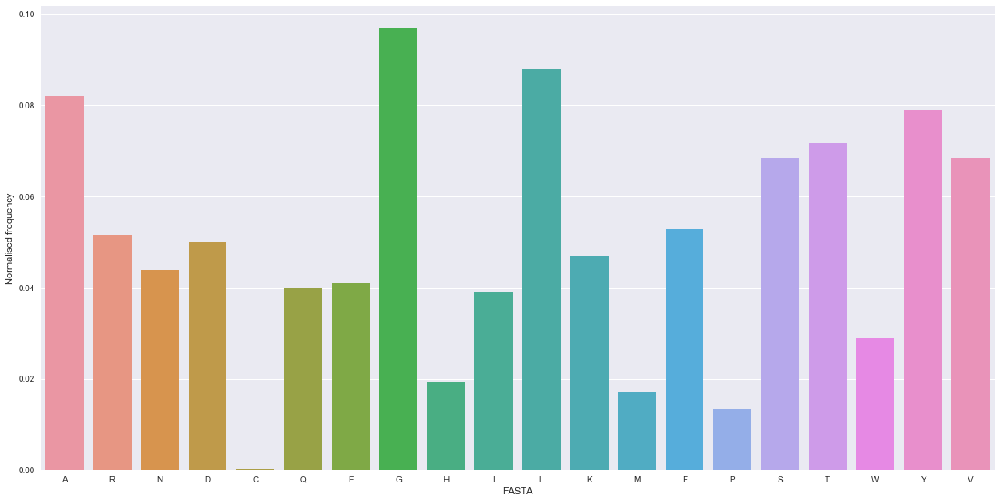

In [22]:
barrel_distribution = calc_distribution(barrel_df, aa_dict)

plt.clf()
plt.figure(figsize=(20, 10))
sns.barplot(x='FASTA', y='Normalised frequency', data=barrel_distribution)
plt.show()

In [23]:
for aa in list(aa_dict.keys()):
    print(aa + ': ' + str(barrel_df['fasta_seq'].tolist().count(aa)))

A: 608
R: 383
N: 326
D: 372
C: 2
Q: 297
E: 305
G: 718
H: 144
I: 290
L: 652
K: 348
M: 128
F: 392
P: 100
S: 508
T: 532
W: 215
Y: 585
V: 507


Too few Cys residues for meaningful analysis => discounted from further analysis

In [24]:
aa_dict_no_cys = copy.copy(aa_dict)
aa_dict_no_cys.pop('C')

barrel_df = barrel_df[barrel_df['fasta_seq'] != 'C']
barrel_df = barrel_df.reset_index(drop=True)

In [25]:
aa_dict_no_cys

OrderedDict([('A', 'Ala'),
             ('R', 'Arg'),
             ('N', 'Asn'),
             ('D', 'Asp'),
             ('Q', 'Gln'),
             ('E', 'Glu'),
             ('G', 'Gly'),
             ('H', 'His'),
             ('I', 'Ile'),
             ('L', 'Leu'),
             ('K', 'Lys'),
             ('M', 'Met'),
             ('F', 'Phe'),
             ('P', 'Pro'),
             ('S', 'Ser'),
             ('T', 'Thr'),
             ('W', 'Trp'),
             ('Y', 'Tyr'),
             ('V', 'Val')])

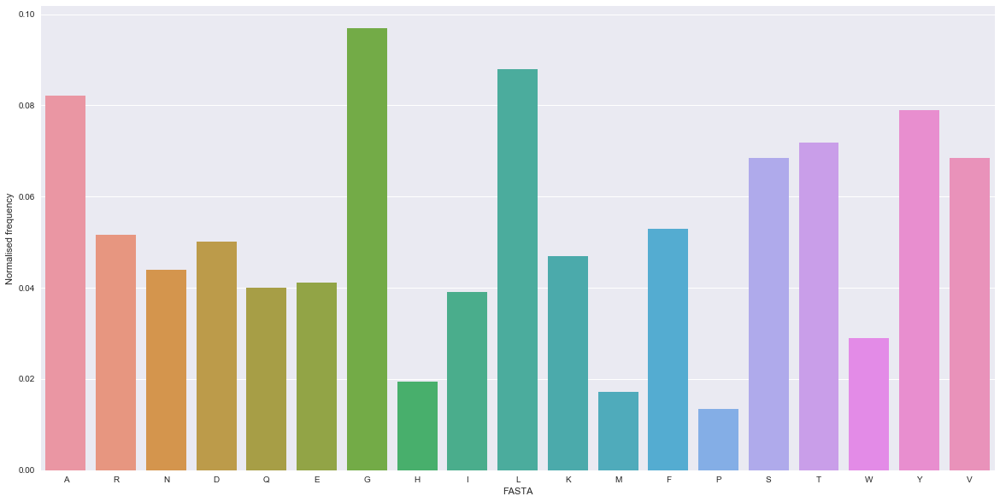

In [26]:
barrel_distribution = calc_distribution(barrel_df, aa_dict_no_cys)

plt.clf()
plt.figure(figsize=(20, 10))
sns.barplot(x='FASTA', y='Normalised frequency', data=barrel_distribution)
plt.show()

In [27]:
for aa in list(aa_dict_no_cys.keys()):
    print(aa + ': ' + str(barrel_df['fasta_seq'].tolist().count(aa)))

A: 608
R: 383
N: 326
D: 372
Q: 297
E: 305
G: 718
H: 144
I: 290
L: 652
K: 348
M: 128
F: 392
P: 100
S: 508
T: 532
W: 215
Y: 585
V: 507


How does this distribution compare to those previously determined?

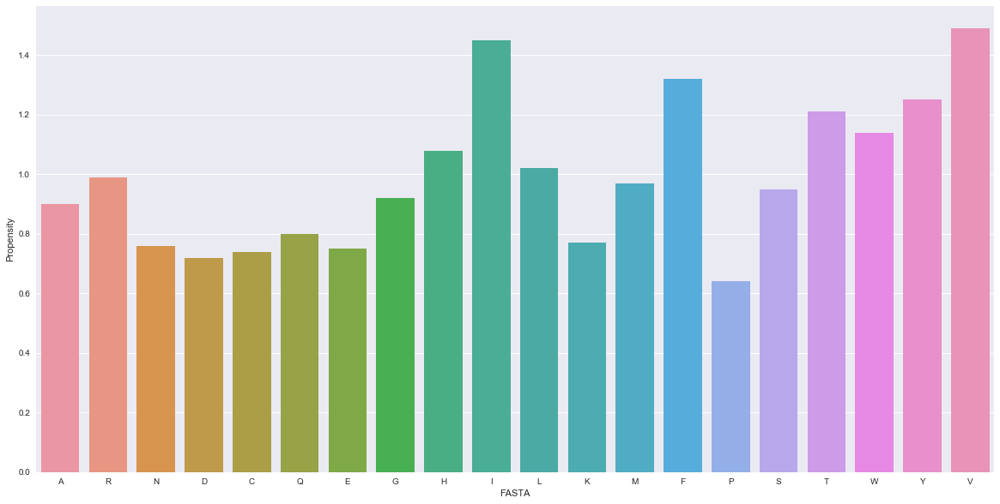

In [28]:
levitt_dict = OrderedDict({'A': 0.900, 'R': 0.990, 'N': 0.760, 'D': 0.720, 'C': 0.740, 'Q': 0.800, 'E': 0.750,
                           'G': 0.920, 'H': 1.080, 'I': 1.450, 'L': 1.020, 'K': 0.770, 'M': 0.970, 'F': 1.320,
                           'P': 0.640, 'S': 0.950, 'T': 1.210, 'W': 1.140, 'Y': 1.250, 'V': 1.490})
levitt_df = pd.DataFrame({'FASTA': list(levitt_dict.keys()),
                          'Propensity': list(levitt_dict.values())})

plt.clf()
plt.figure(figsize=(20, 10))
sns.barplot(x='FASTA', y='Propensity', data=levitt_df)
plt.show()

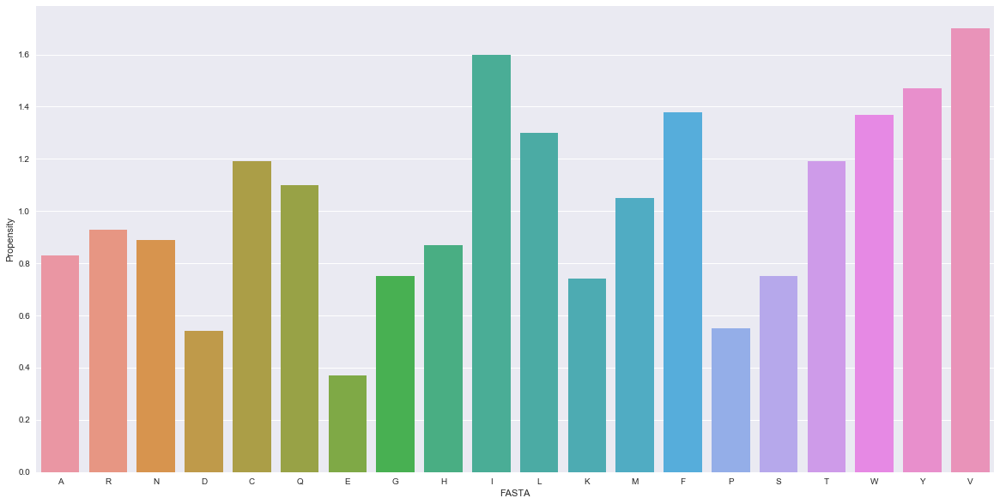

In [29]:
chou_fasman_dict = OrderedDict({'A': 0.830, 'R': 0.930, 'N': 0.890, 'D': 0.540, 'C': 1.190, 'Q': 1.100, 'E': 0.370,
                                'G': 0.750, 'H': 0.870, 'I': 1.600, 'L': 1.300, 'K': 0.740, 'M': 1.050, 'F': 1.380, 
                                'P': 0.550, 'S': 0.750, 'T': 1.190, 'W': 1.370, 'Y': 1.470, 'V': 1.700})
chou_fasman_df = pd.DataFrame({'FASTA': list(chou_fasman_dict.keys()),
                               'Propensity': list(chou_fasman_dict.values())})

plt.clf()
plt.figure(figsize=(20, 10))
sns.barplot(x='FASTA', y='Propensity', data=chou_fasman_df)
plt.show()

### Interior / exterior propensity

In [30]:
int_ext_propensity, int_ext_frequency, int_ext_normed_frequencies = calc_indv_property_propensities(
    barrel_df, 'int_ext', aa_dict_no_cys
)

In [31]:
int_ext_propensity

,FASTA,exterior,interior
0,A,1.073561,0.923853
1,R,0.533859,1.482528
2,N,0.723695,1.286018
3,D,0.877318,1.126995
4,Q,0.562671,1.452703
5,E,0.489898,1.528035
6,G,0.665386,1.346377
7,H,1.324346,0.664252
8,I,1.342330,0.645635
9,L,1.537852,0.443239


In [32]:
int_ext_frequency

,FASTA,exterior,interior
0,A,332,276
1,R,104,279
2,N,120,206
3,D,166,206
4,Q,85,212
5,E,76,229
6,G,243,475
7,H,97,47
8,I,198,92
9,L,510,142


In [33]:
int_ext_normed_frequencies

,FASTA,exterior,interior
0,A,0.088087,0.075803
1,R,0.027594,0.076627
2,N,0.031839,0.056578
3,D,0.044044,0.056578
4,Q,0.022552,0.058226
5,E,0.020164,0.062895
6,G,0.064473,0.130459
7,H,0.025736,0.012909
8,I,0.052534,0.025268
9,L,0.135314,0.039000


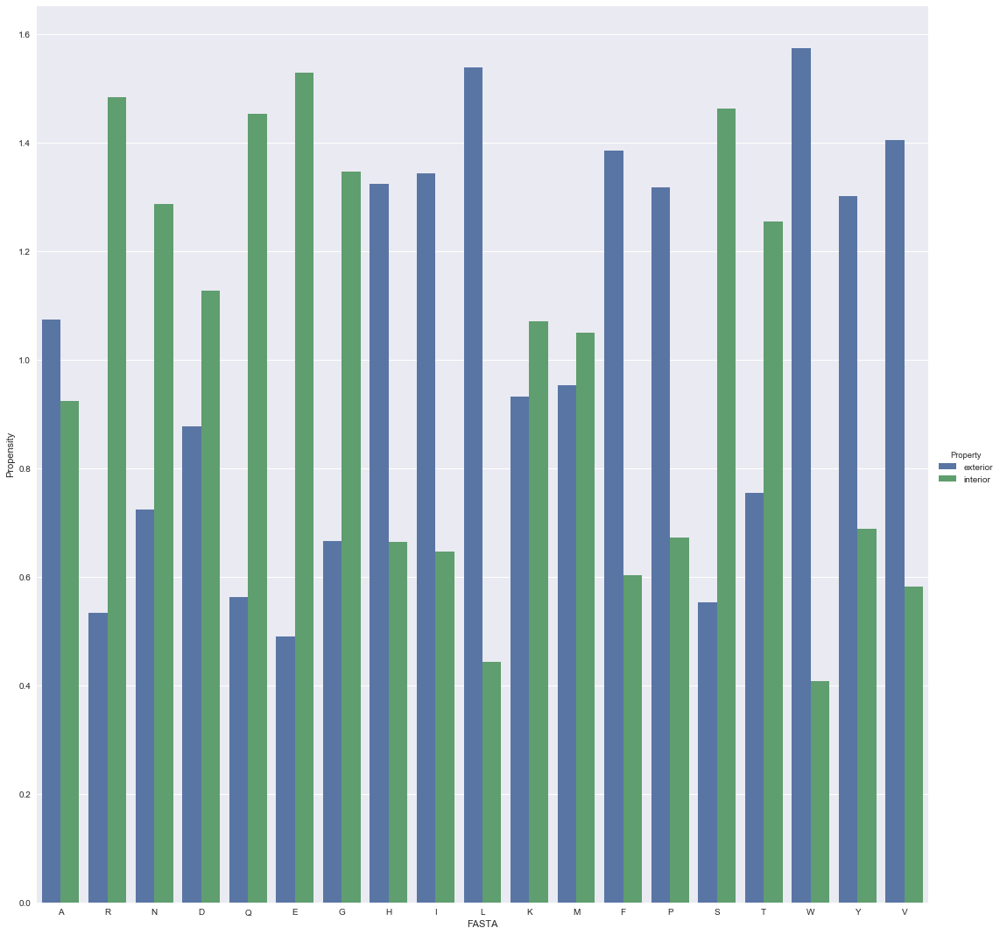

In [34]:
plot_bar_graphs(int_ext_propensity, 'Propensity')

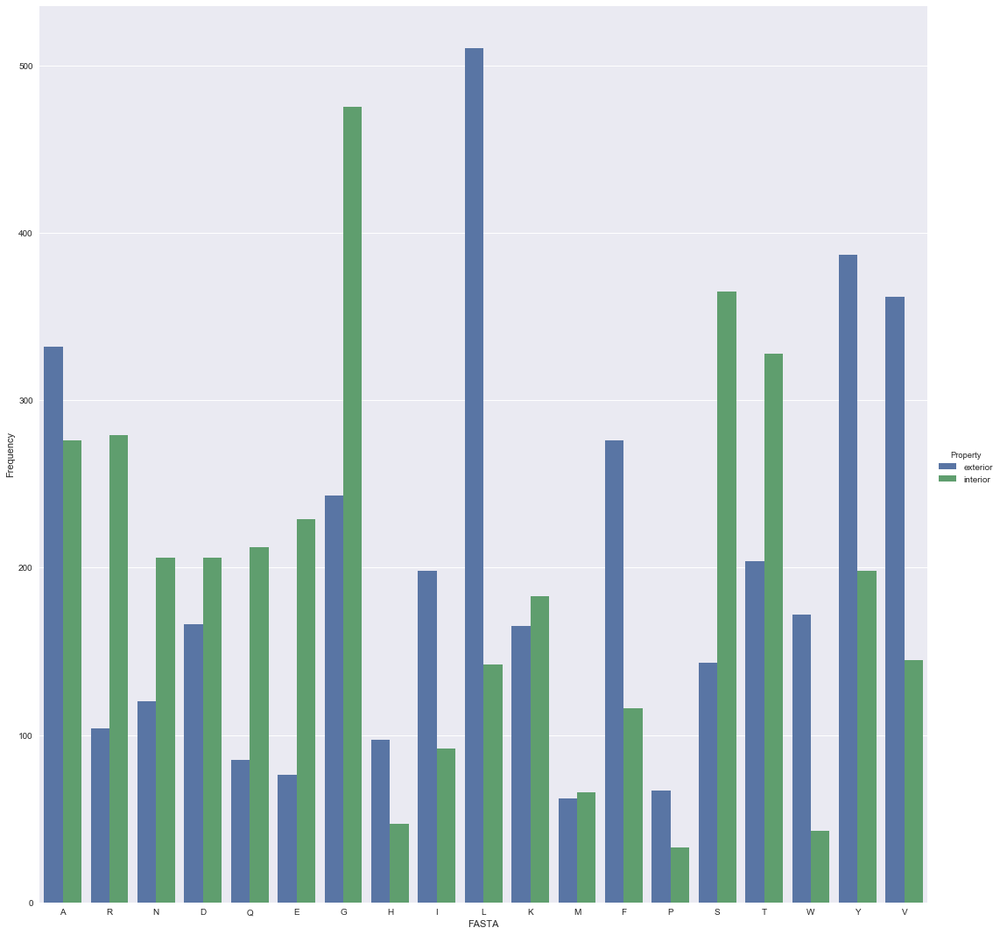

In [35]:
plot_bar_graphs(int_ext_frequency, 'Frequency')

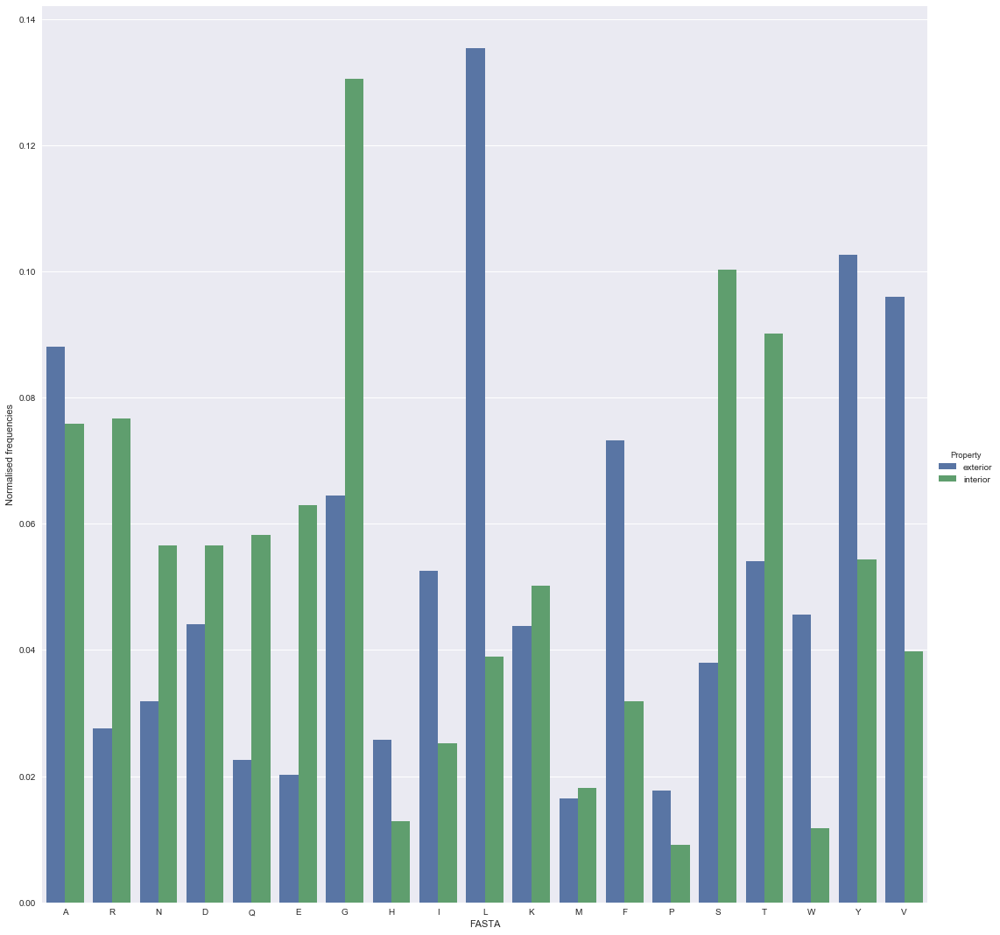

In [36]:
plot_bar_graphs(int_ext_normed_frequencies, 'Normalised frequencies')

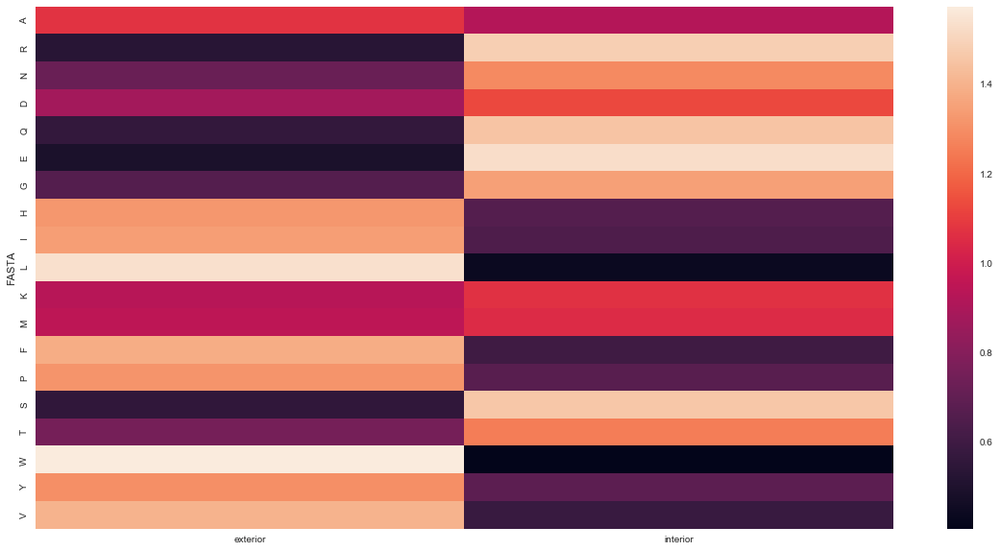

In [37]:
plot_heat_map(int_ext_propensity)

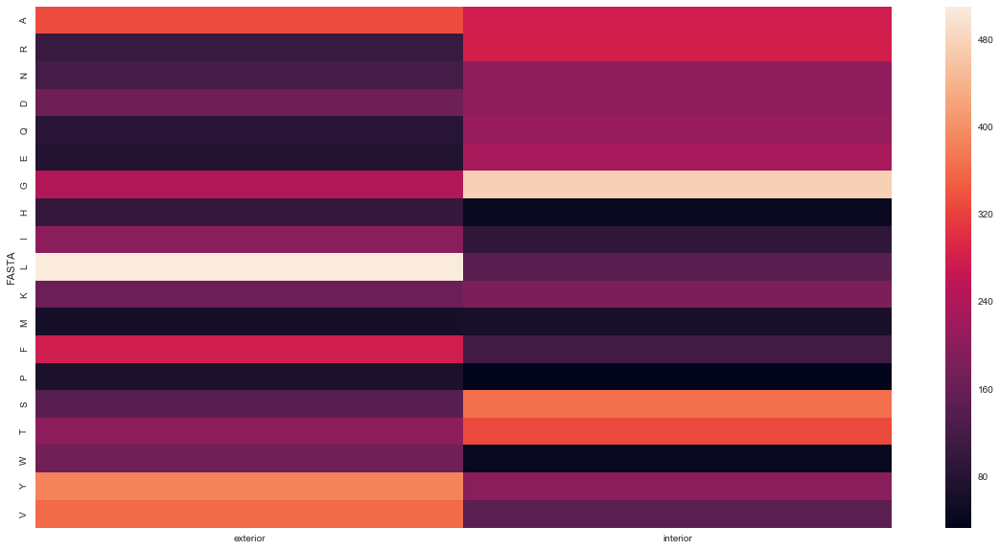

In [38]:
plot_heat_map(int_ext_frequency)

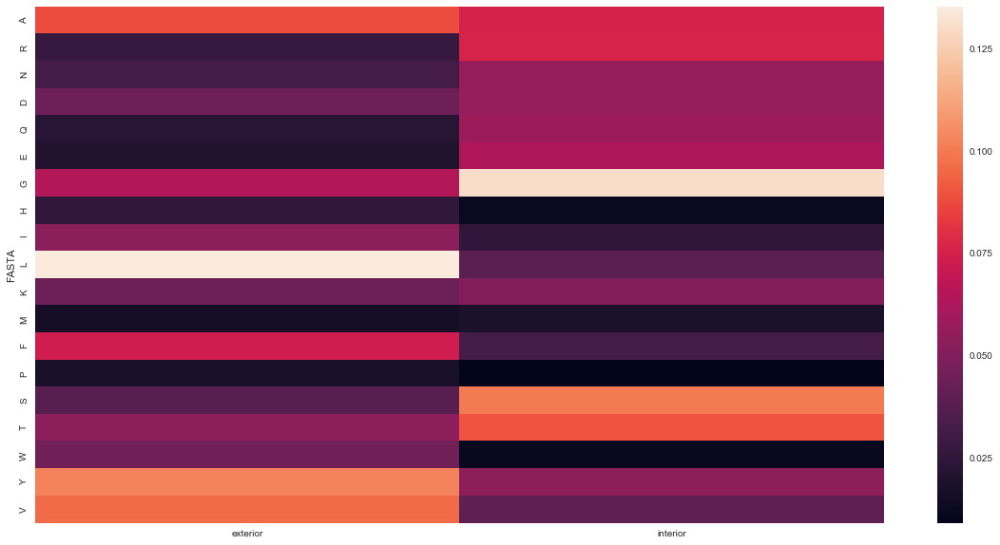

In [39]:
plot_heat_map(int_ext_normed_frequencies)

### Transmembrane / external propensity

In [40]:
tm_ext_propensity, tm_ext_frequency, tm_ext_normed_frequencies = calc_indv_property_propensities(
    barrel_df, 'tm_ext', aa_dict_no_cys
)

In [41]:
tm_ext_propensity

,FASTA,external,transmembrane
0,A,0.671915,1.153132
1,R,1.329201,0.846347
2,N,1.474851,0.778365
3,D,1.731751,0.658458
4,Q,1.364921,0.829674
5,E,1.401243,0.812721
6,G,0.617119,1.178708
7,H,1.483955,0.774116
8,I,0.888567,1.052011
9,L,0.573553,1.199042


In [42]:
tm_ext_frequency

,FASTA,external,transmembrane
0,A,130,478
1,R,162,221
2,N,153,173
3,D,205,167
4,Q,129,168
5,E,136,169
6,G,141,577
7,H,68,76
8,I,82,208
9,L,119,533


In [43]:
tm_ext_normed_frequencies

,FASTA,external,transmembrane
0,A,0.055131,0.094616
1,R,0.068702,0.043745
2,N,0.064885,0.034244
3,D,0.086938,0.033056
4,Q,0.054707,0.033254
5,E,0.057676,0.033452
6,G,0.059796,0.114212
7,H,0.028838,0.015044
8,I,0.034775,0.041172
9,L,0.050466,0.105503


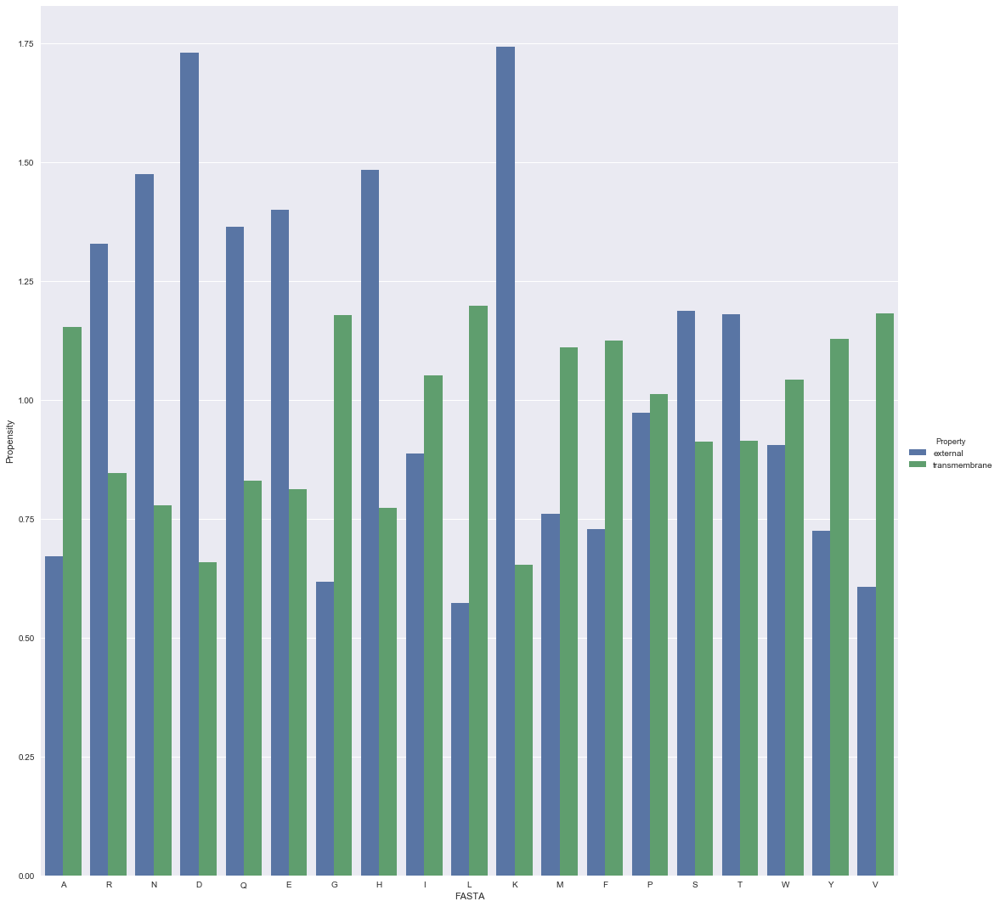

In [44]:
plot_bar_graphs(tm_ext_propensity, 'Propensity')

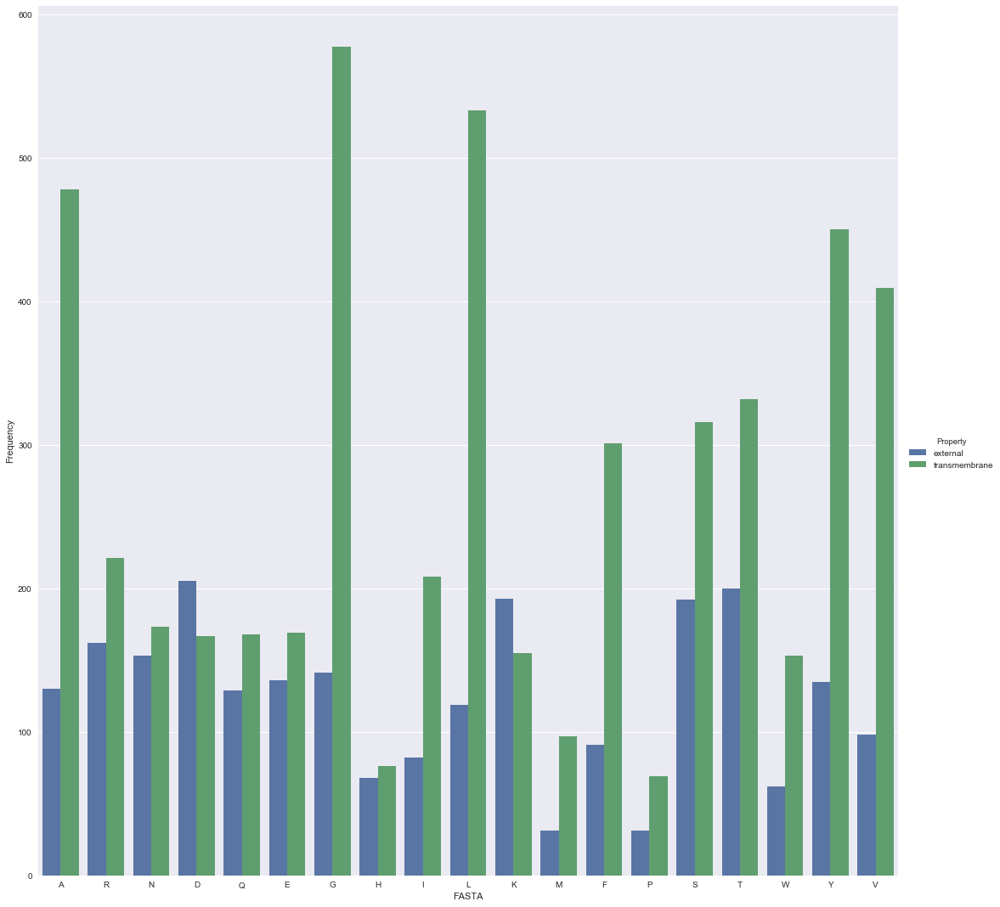

In [45]:
plot_bar_graphs(tm_ext_frequency, 'Frequency')

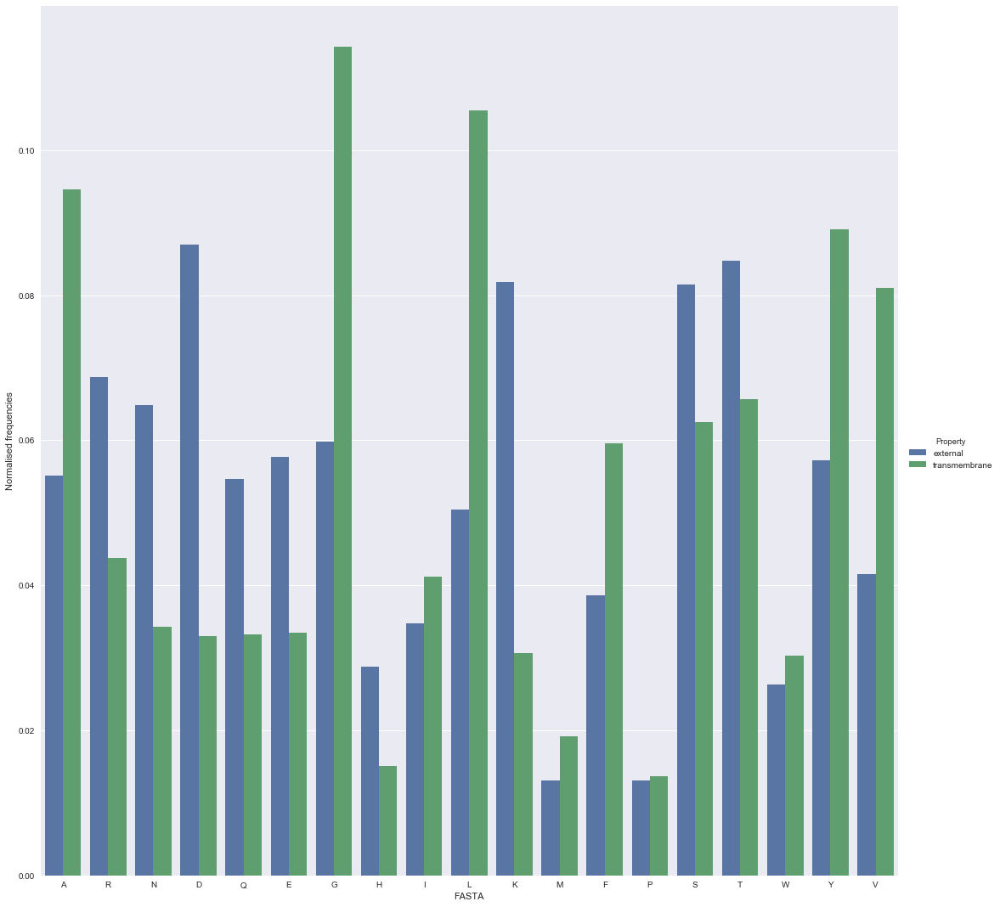

In [46]:
plot_bar_graphs(tm_ext_normed_frequencies, 'Normalised frequencies')

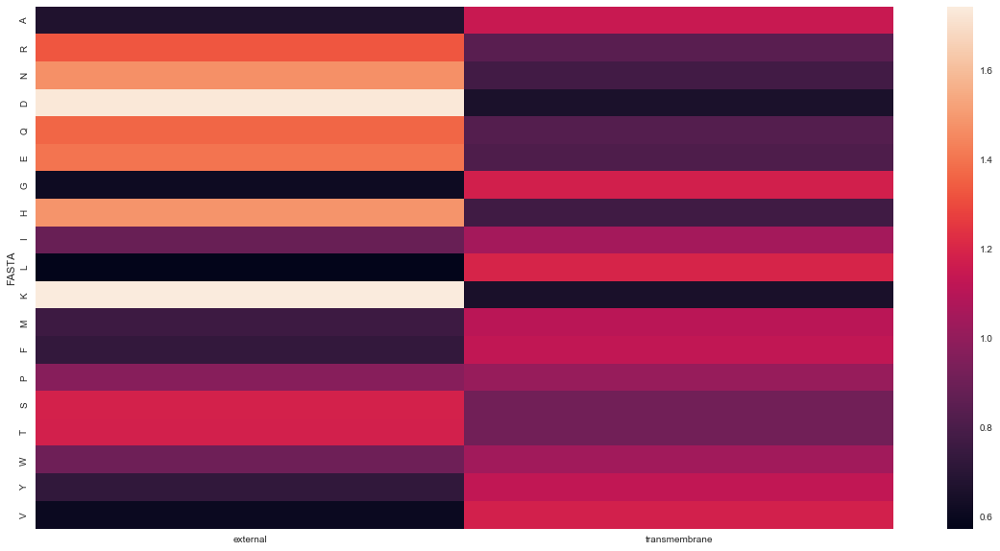

In [47]:
plot_heat_map(tm_ext_propensity)

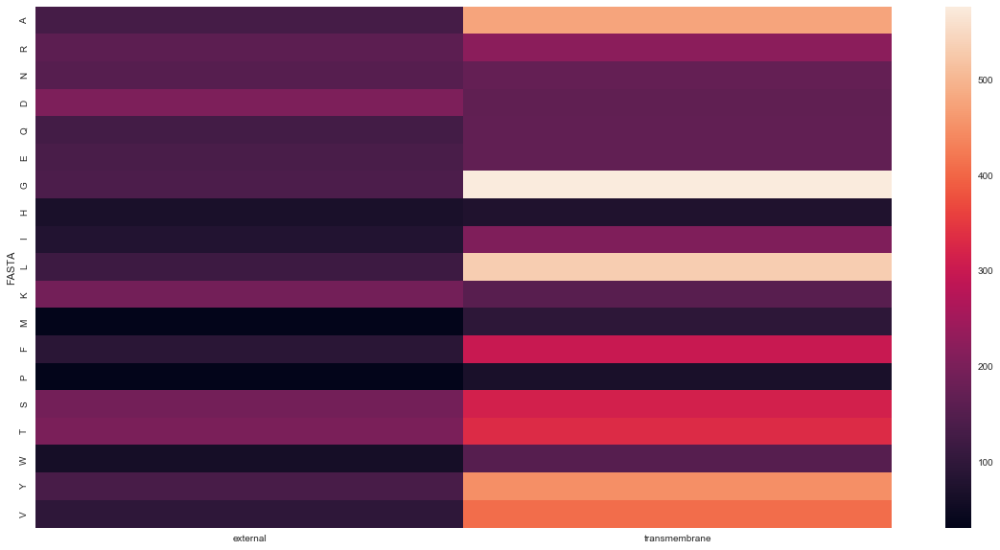

In [48]:
plot_heat_map(tm_ext_frequency)

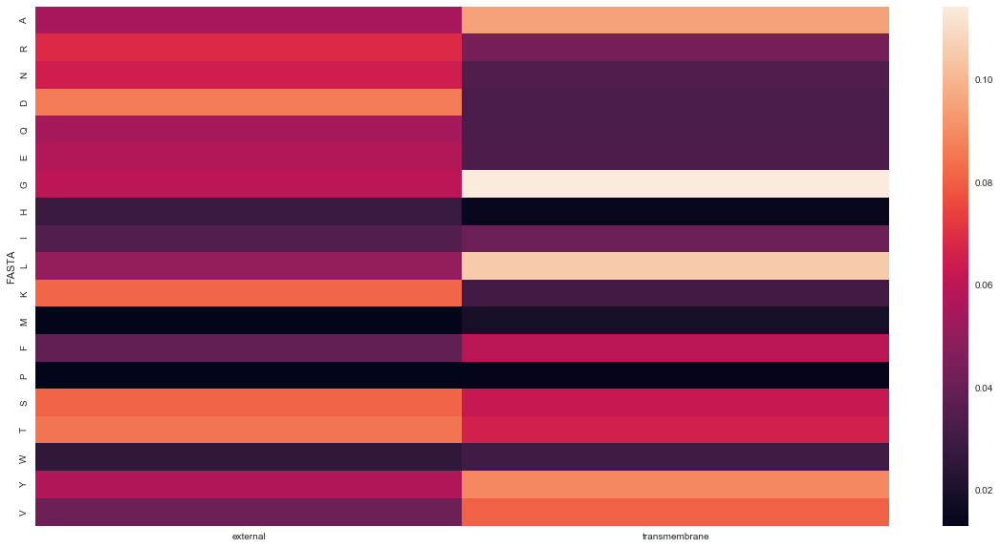

In [49]:
plot_heat_map(tm_ext_normed_frequencies)

### All combinations propensities

In [50]:
(int_ext_tm_ext_propensity, int_ext_tm_ext_frequency, int_ext_tm_ext_normed_frequencies
 ) = calc_combined_property_propensities(barrel_df, ['int_ext', 'tm_ext'], aa_dict_no_cys)

In [51]:
int_ext_tm_ext_propensity

,FASTA,exterior_external,exterior_transmembrane,interior_external,interior_transmembrane
0,A,0.367155,1.401515,0.985060,0.895127
1,R,1.457116,0.105230,1.197767,1.616175
2,N,1.845034,0.203105,1.094483,1.375912
3,D,2.450331,0.147035,0.993399,1.189695
4,Q,1.085668,0.319865,1.651858,1.359234
5,E,1.382482,0.075509,1.420521,1.578494
6,G,0.431813,0.773825,0.807524,1.599277
7,H,2.282252,0.879630,0.663693,0.664514
8,I,0.513173,1.727273,1.274291,0.350589
9,L,0.504056,2.017801,0.644963,0.348564


In [52]:
int_ext_tm_ext_frequency

,FASTA,exterior_external,exterior_transmembrane,interior_external,interior_transmembrane
0,A,36,296,94,182
1,R,90,14,72,207
2,N,97,23,56,150
3,D,147,19,58,148
4,Q,52,33,77,135
5,E,68,8,68,161
6,G,50,193,91,384
7,H,53,44,15,32
8,I,24,174,58,34
9,L,53,457,66,76


In [53]:
int_ext_tm_ext_normed_frequencies

,FASTA,exterior_external,exterior_transmembrane,interior_external,interior_transmembrane
0,A,0.030126,0.114996,0.080825,0.073446
1,R,0.075314,0.005439,0.061909,0.083535
2,N,0.081172,0.008936,0.048151,0.060533
3,D,0.123013,0.007382,0.049871,0.059726
4,Q,0.043515,0.012821,0.066208,0.054479
5,E,0.056904,0.003108,0.058469,0.064972
6,G,0.041841,0.074981,0.078246,0.154964
7,H,0.044351,0.017094,0.012898,0.012914
8,I,0.020084,0.067599,0.049871,0.013721
9,L,0.044351,0.177545,0.056750,0.030670


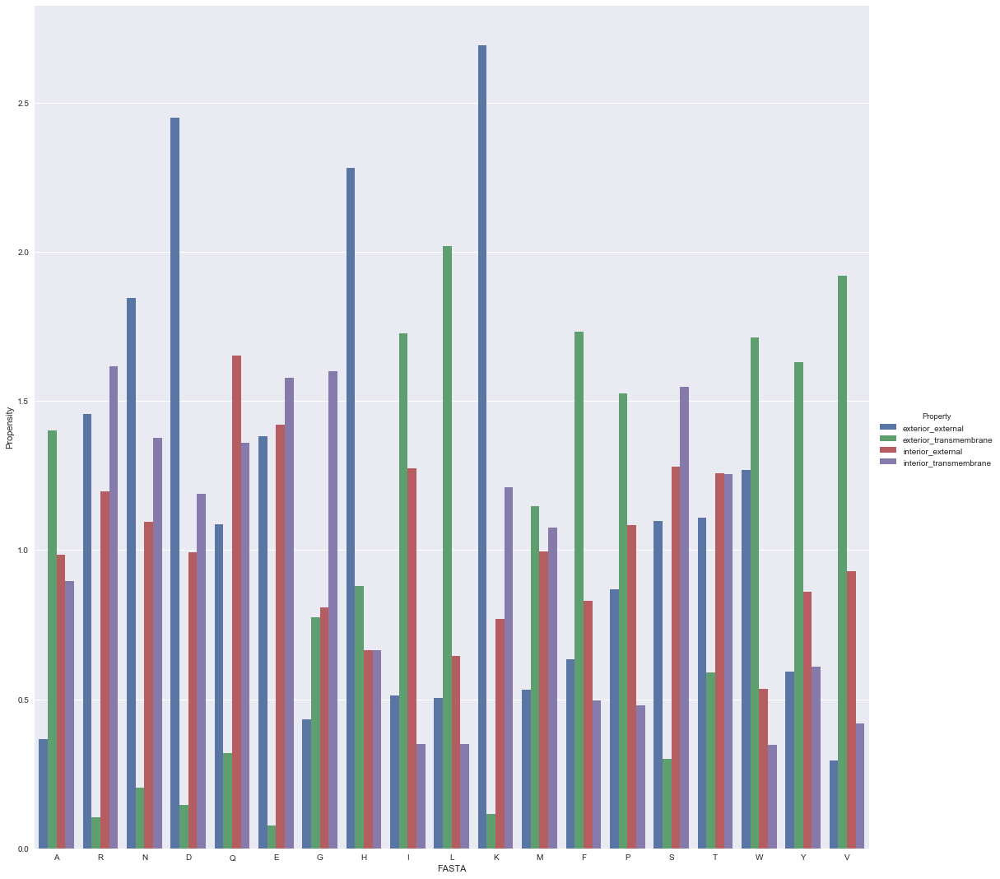

In [54]:
plot_bar_graphs(int_ext_tm_ext_propensity, 'Propensity')

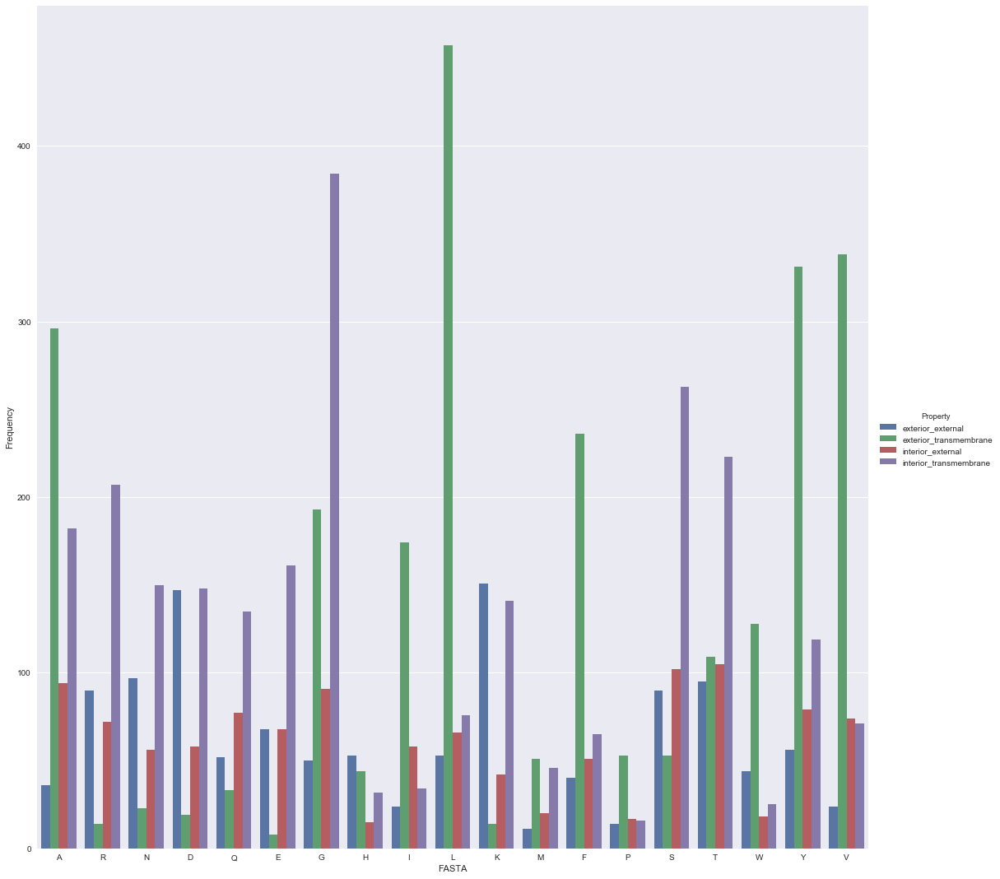

In [55]:
plot_bar_graphs(int_ext_tm_ext_frequency, 'Frequency')

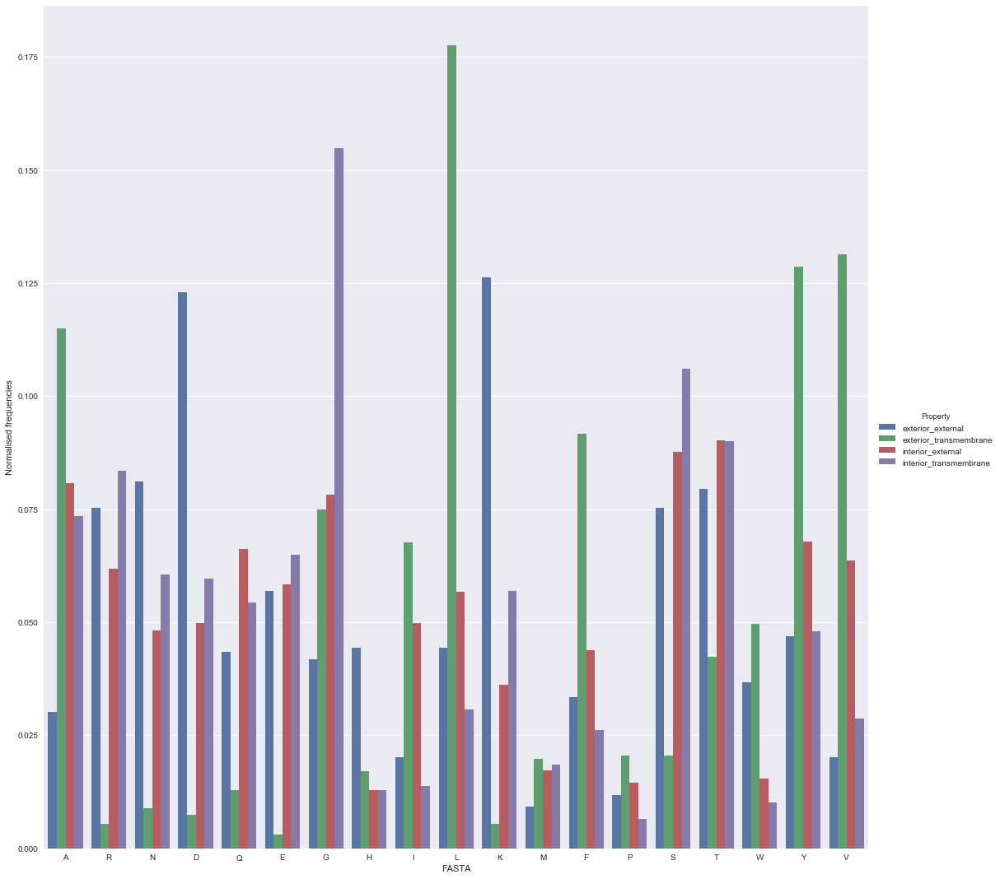

In [56]:
plot_bar_graphs(int_ext_tm_ext_normed_frequencies, 'Normalised frequencies')

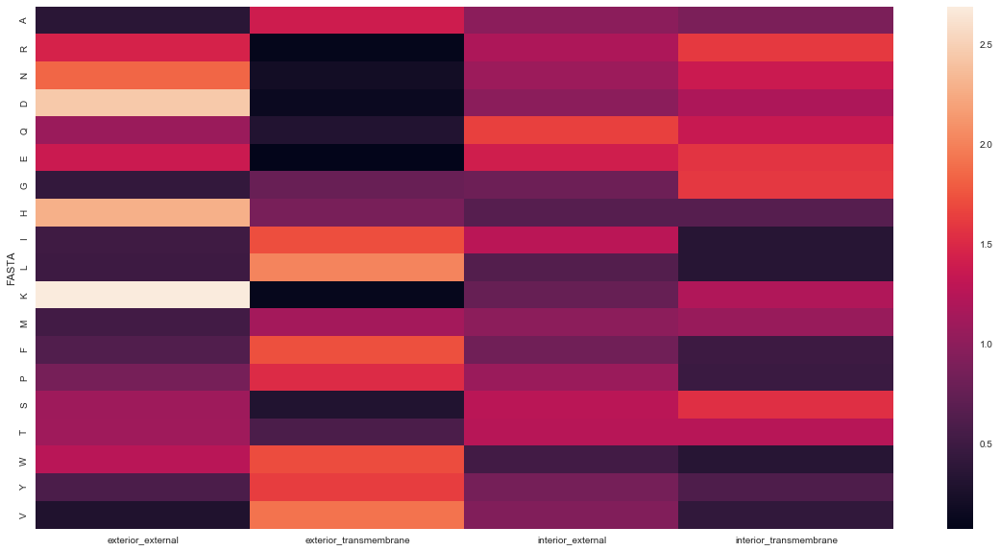

In [57]:
plot_heat_map(int_ext_tm_ext_propensity)

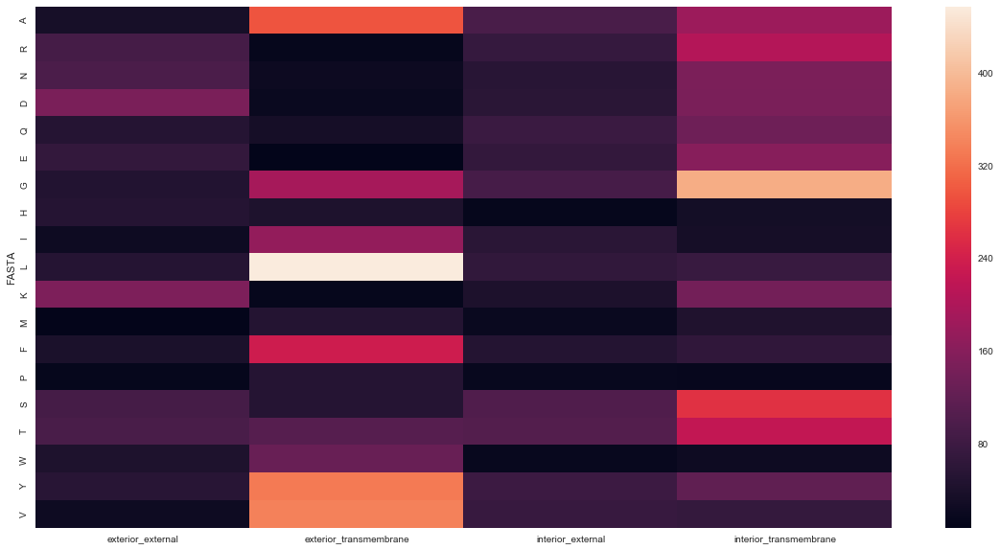

In [58]:
plot_heat_map(int_ext_tm_ext_frequency)

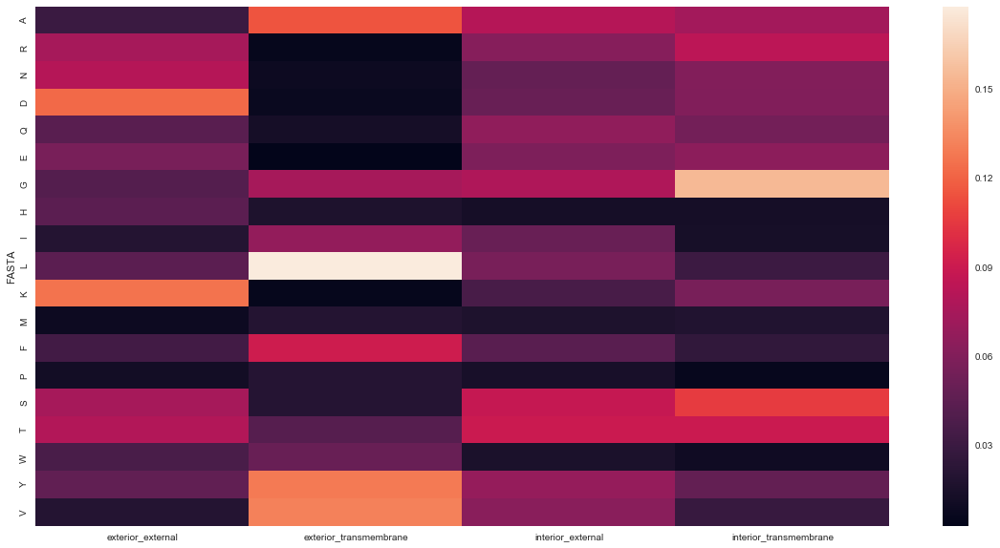

In [59]:
plot_heat_map(int_ext_tm_ext_normed_frequencies)

### Z-coordinate amino acid KDEs

A


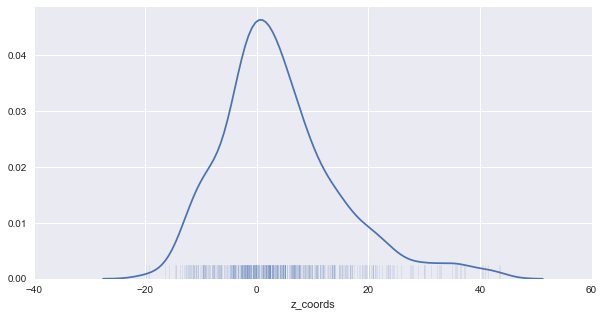

R


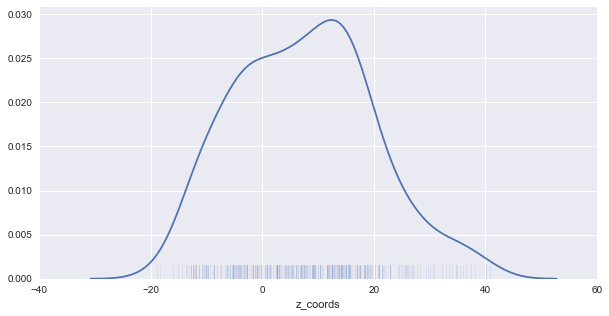

N


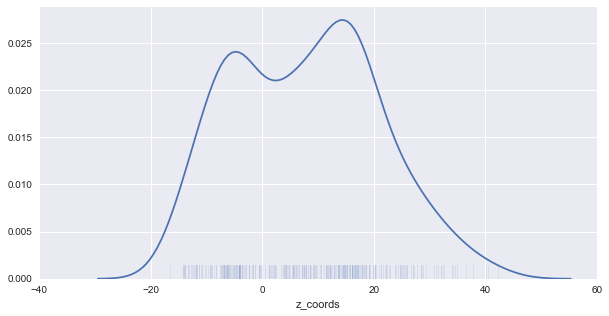

D


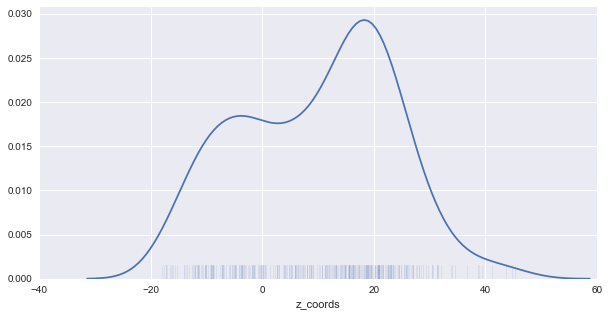

Q


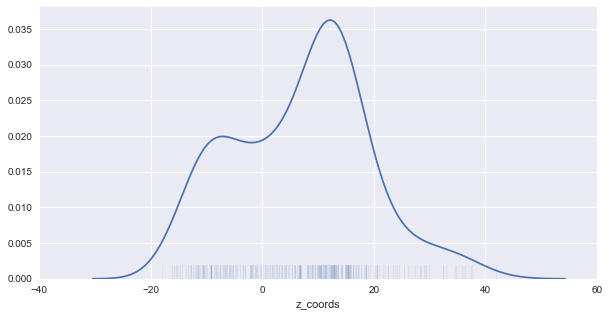

E


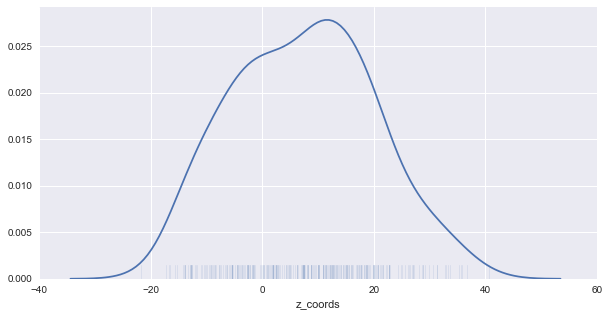

G


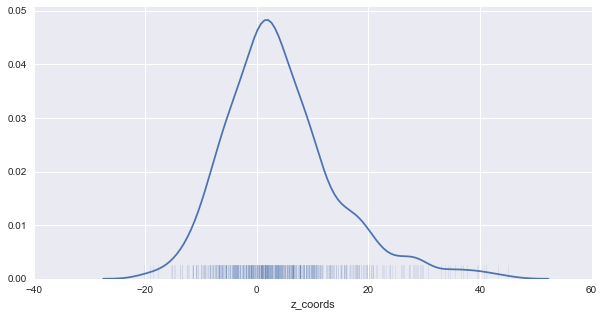

H


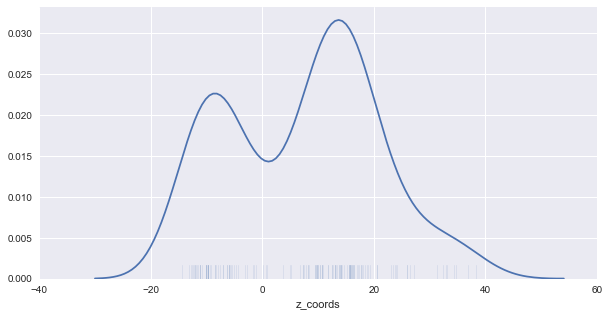

I


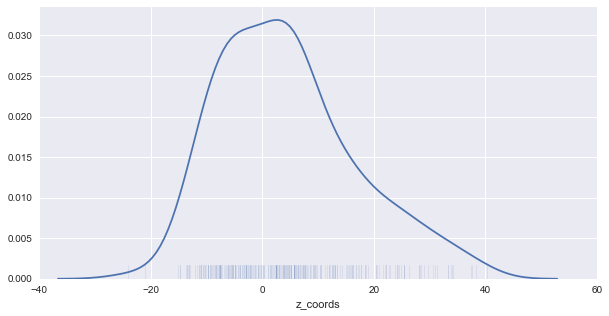

L


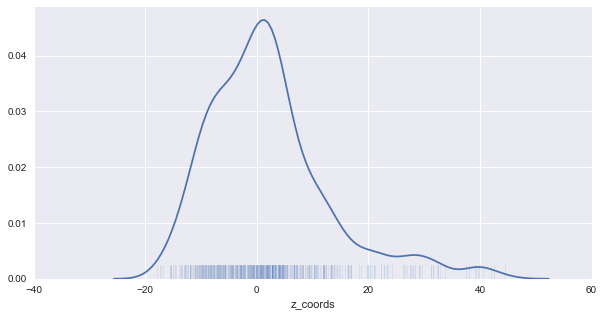

K


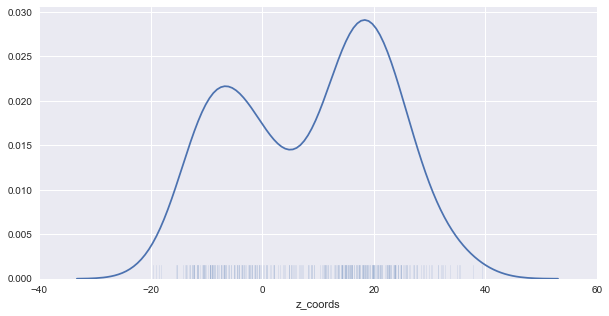

M


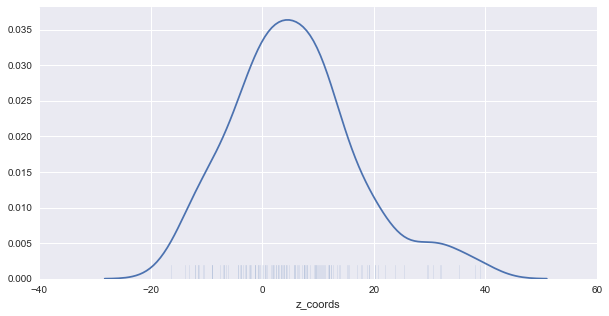

F


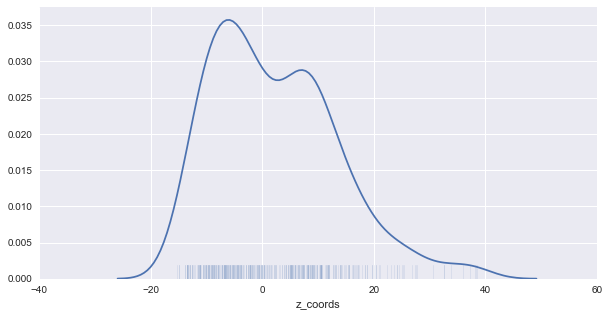

P


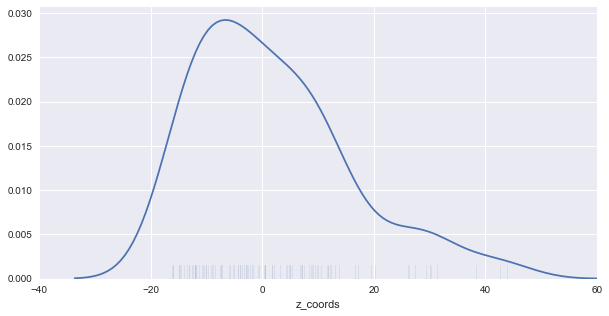

S


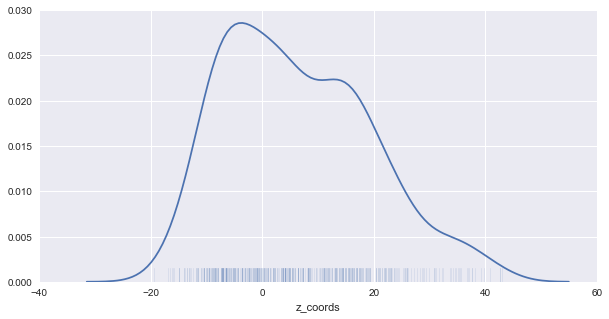

T


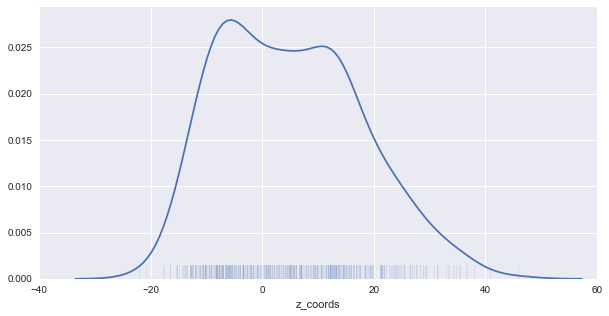

W


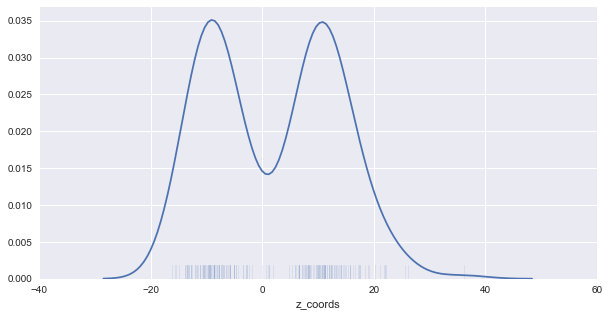

Y


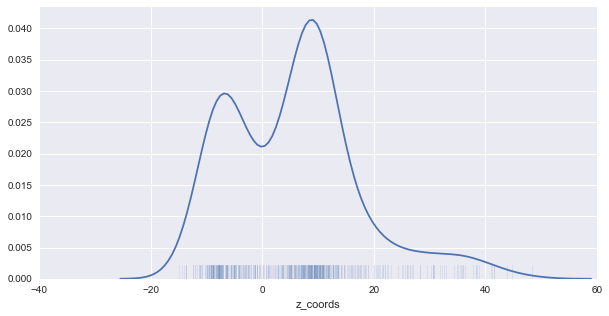

V


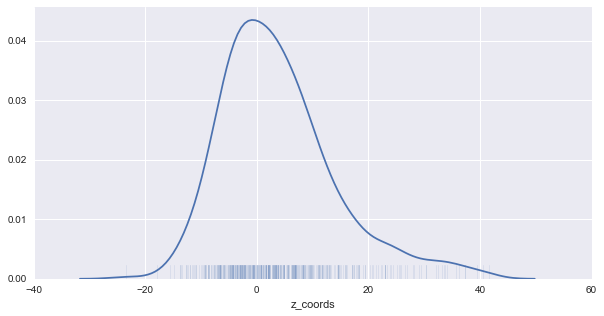

In [60]:
plot_aa_kdes(barrel_df, 'z_coords', 'individual', aa_dict_no_cys)

A


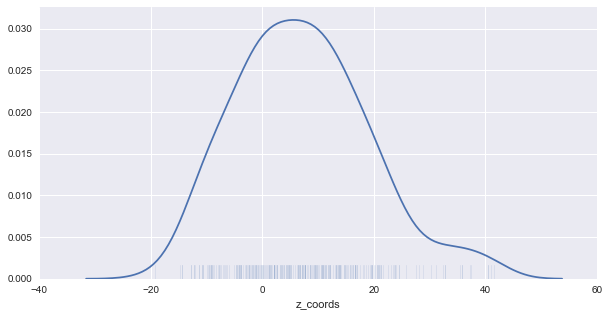

R


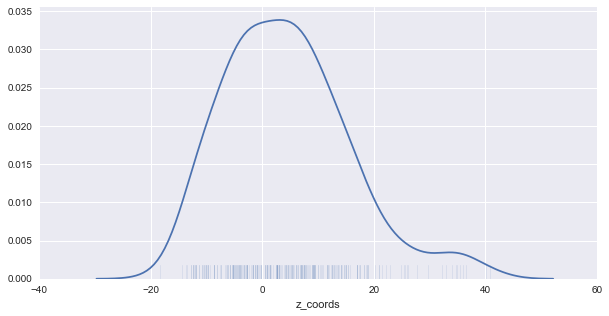

N


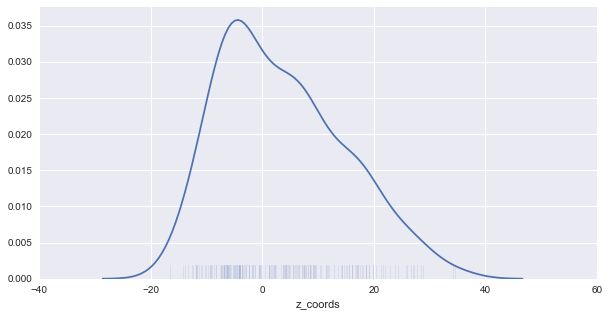

D


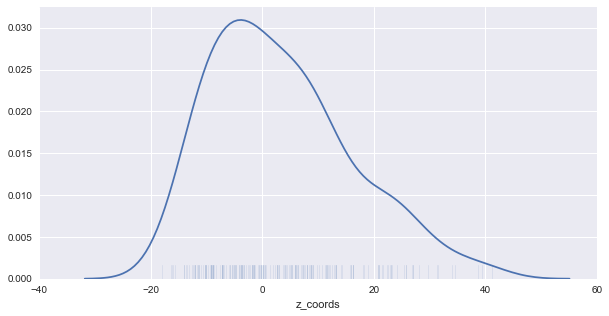

Q


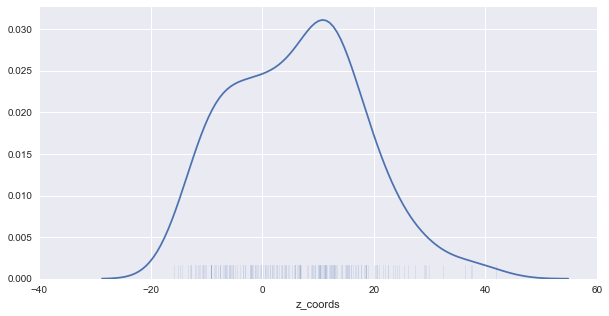

E


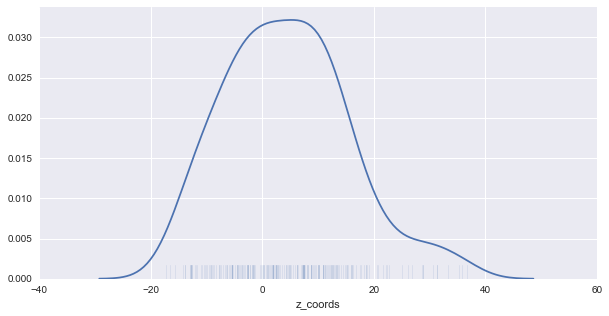

G


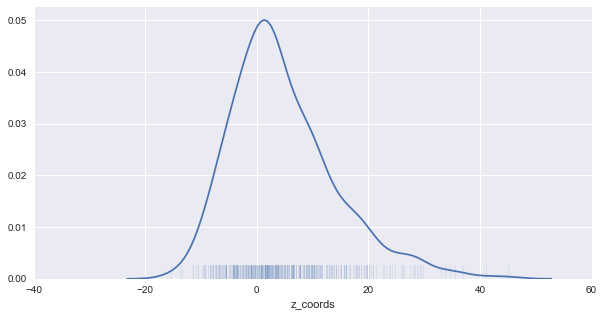

H


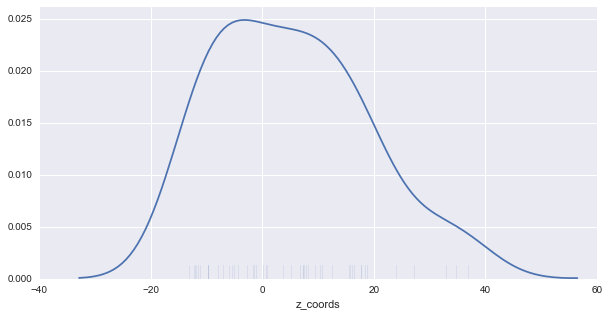

I


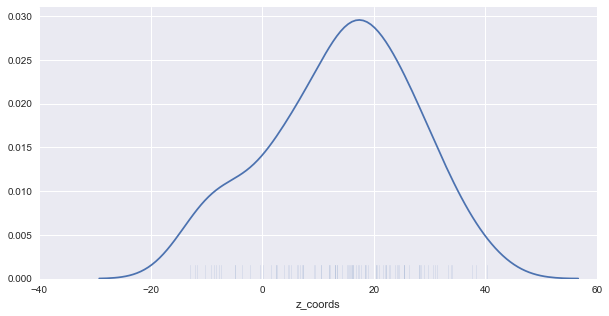

L


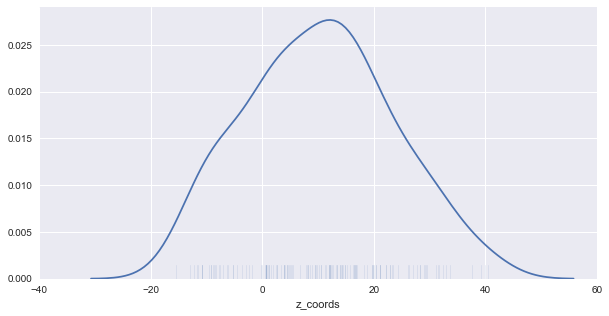

K


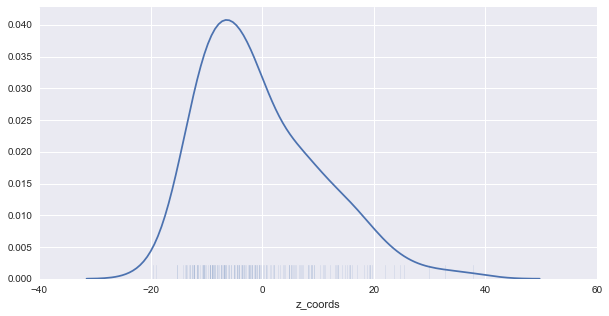

M


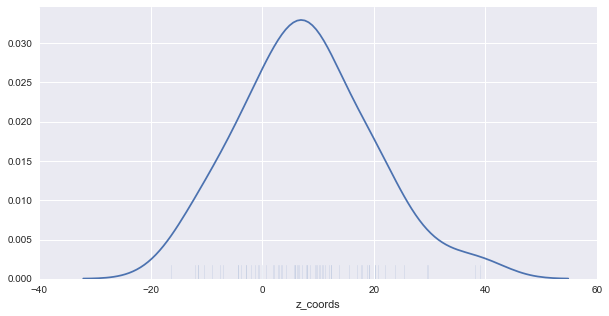

F


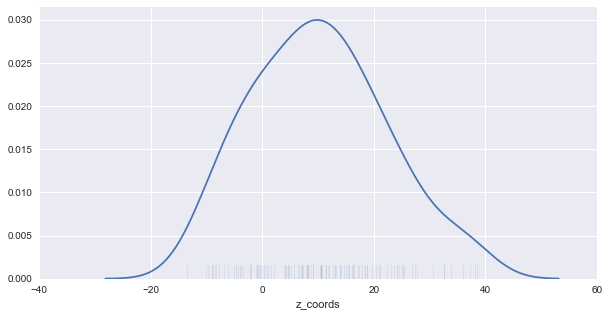

P


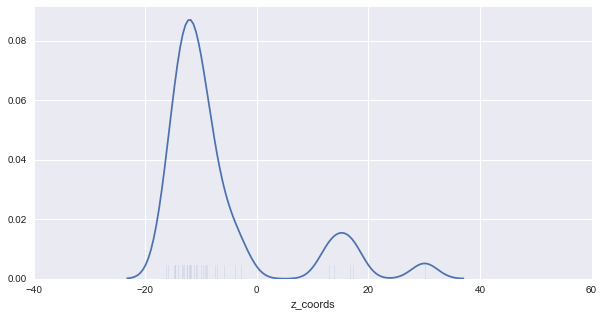

S


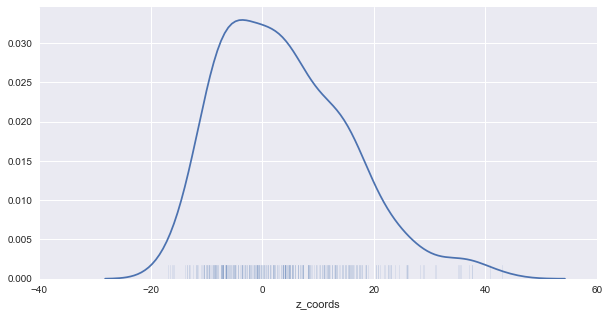

T


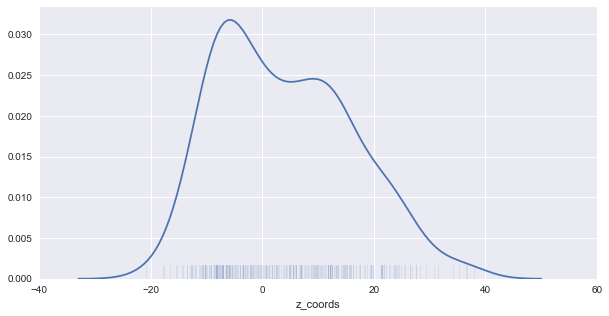

W


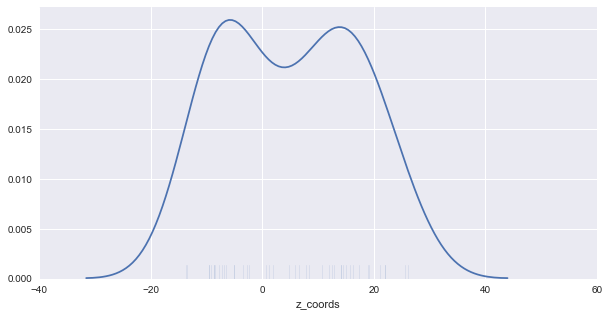

Y


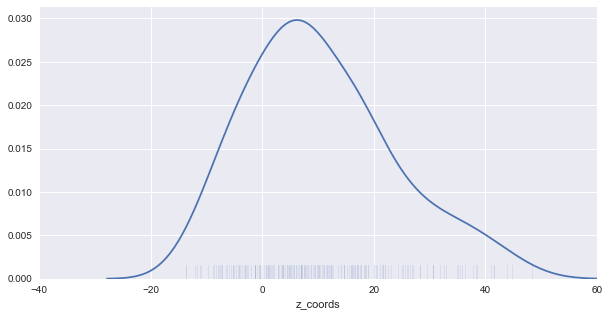

V


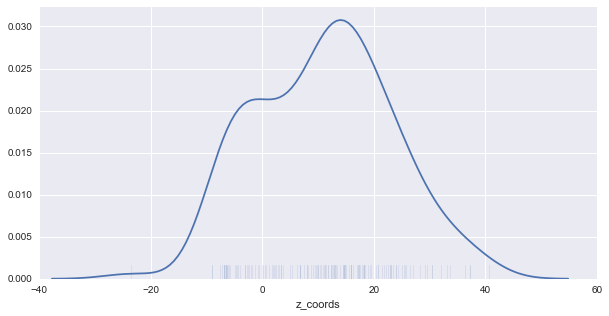

In [61]:
int_barrel_df = barrel_df[barrel_df['int_ext'] == 'interior']
int_barrel_df = int_barrel_df.reset_index(drop=True)
plot_aa_kdes(int_barrel_df, 'z_coords', 'individual', aa_dict_no_cys)

A


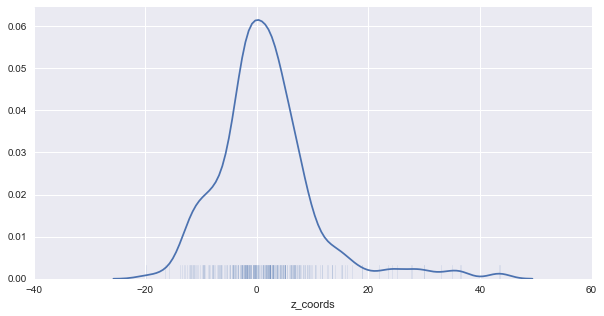

R


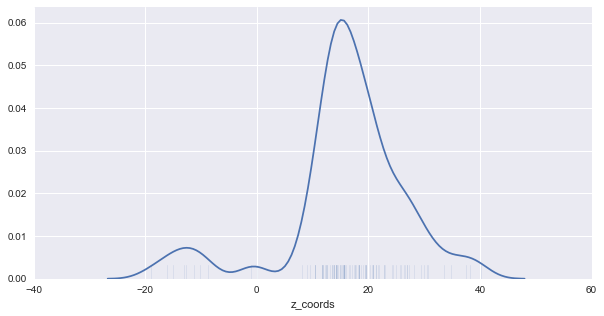

N


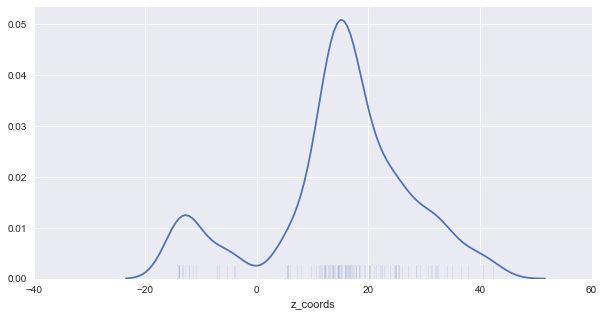

D


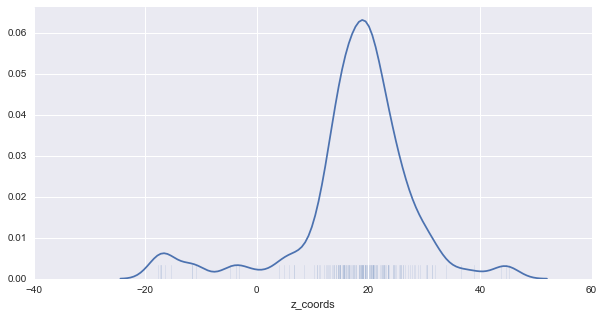

Q


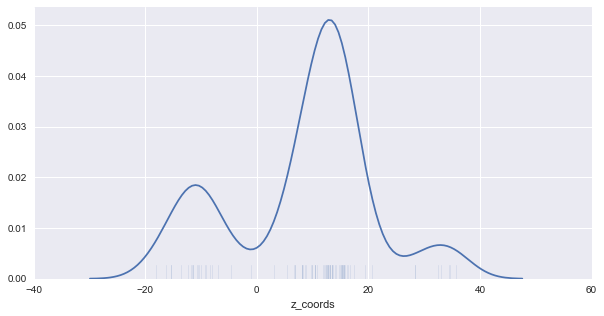

E


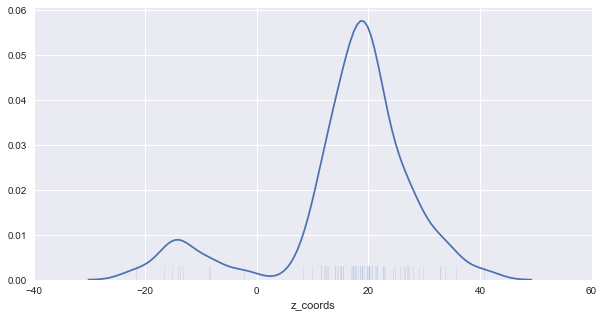

G


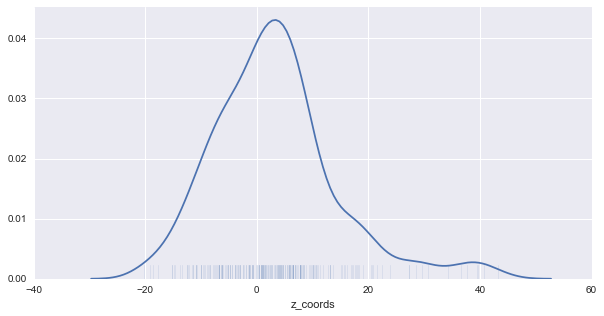

H


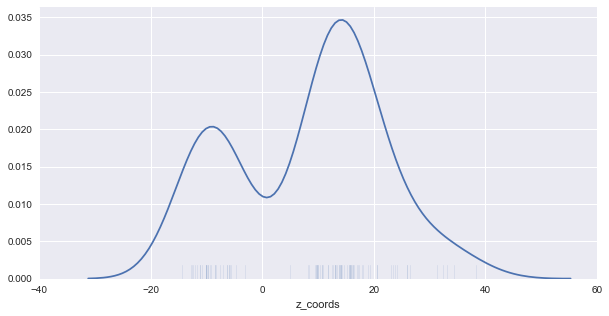

I


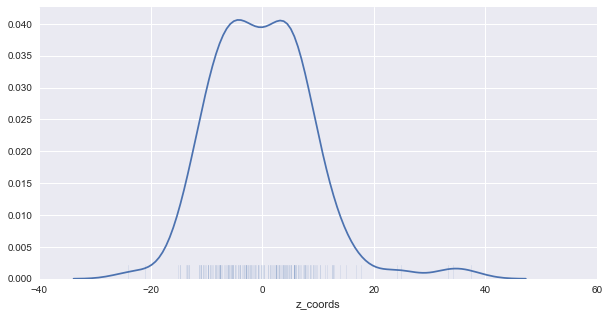

L


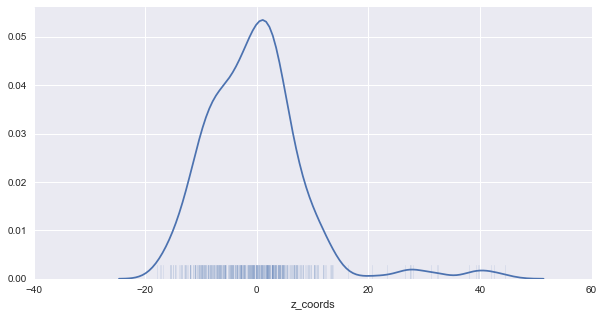

K


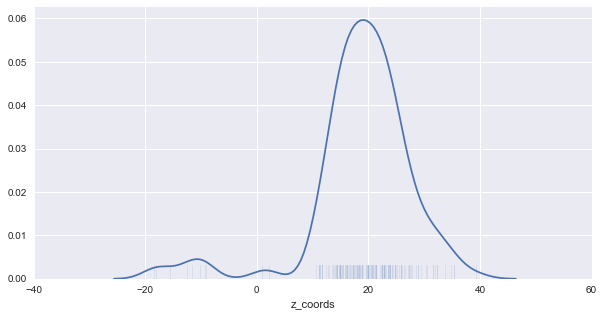

M


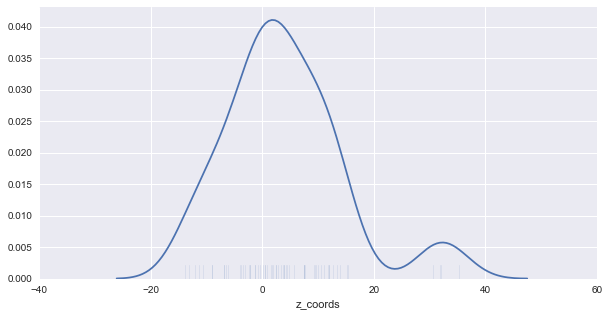

F


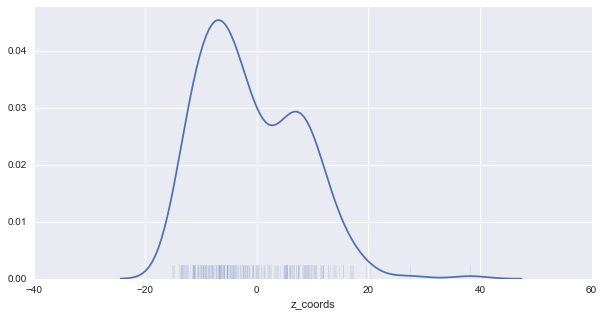

P


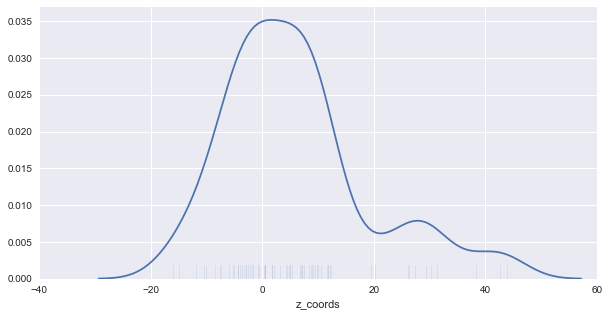

S


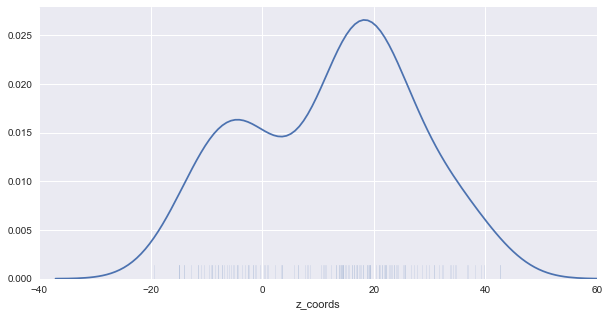

T


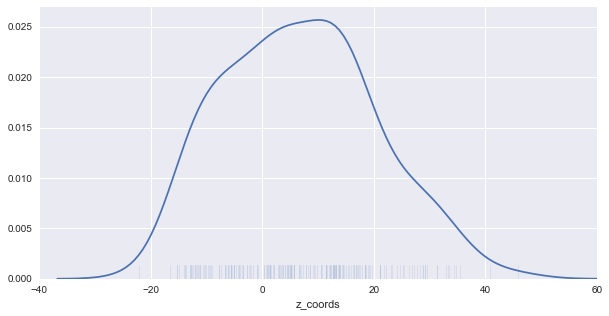

W


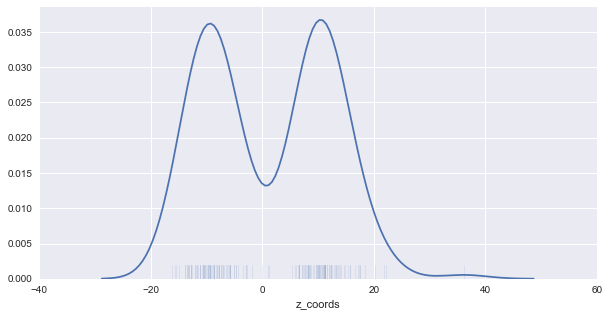

Y


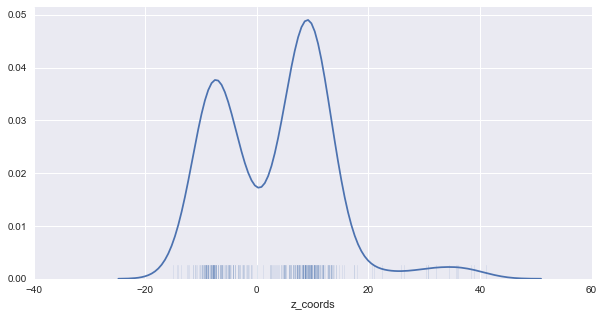

V


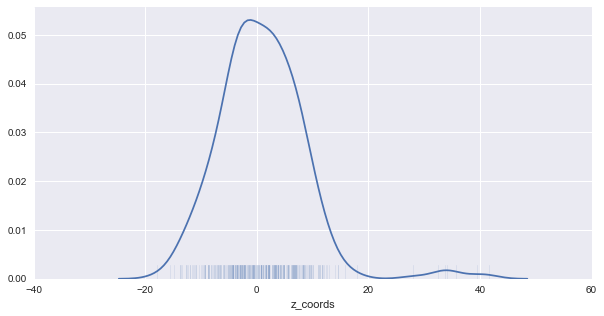

In [62]:
ext_barrel_df = barrel_df[barrel_df['int_ext'] == 'exterior']
ext_barrel_df = ext_barrel_df.reset_index(drop=True)
plot_aa_kdes(ext_barrel_df, 'z_coords', 'individual', aa_dict_no_cys)

A


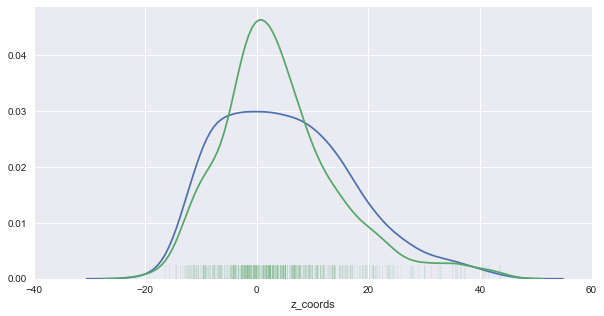

R


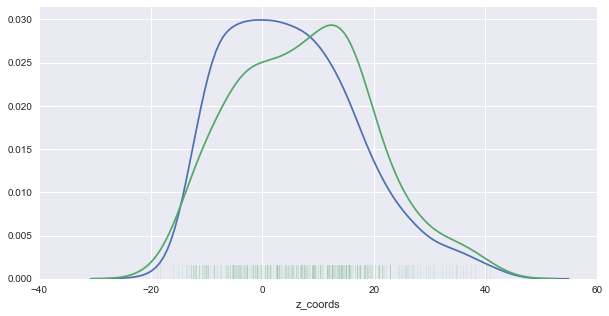

N


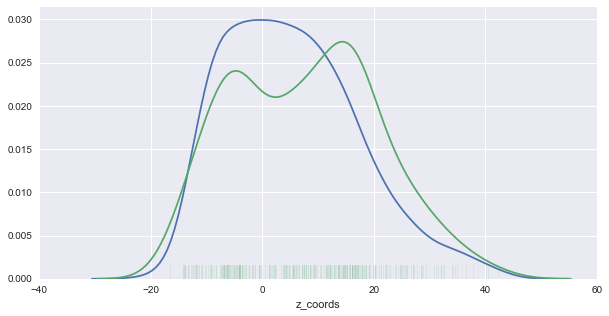

D


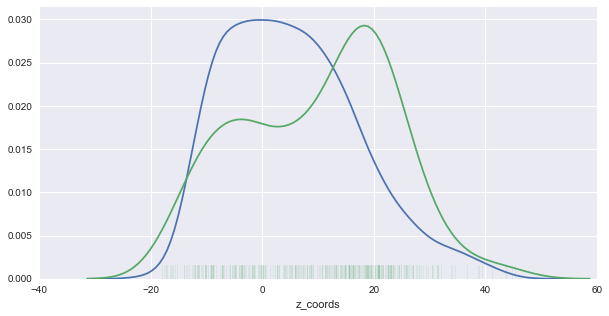

Q


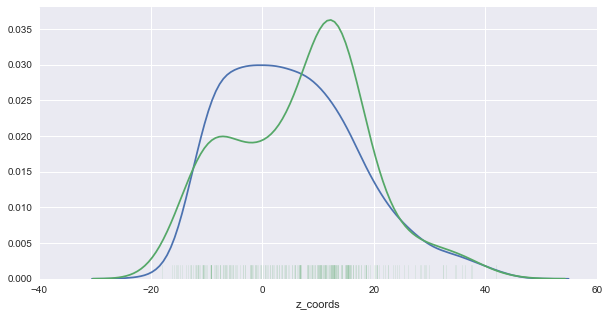

E


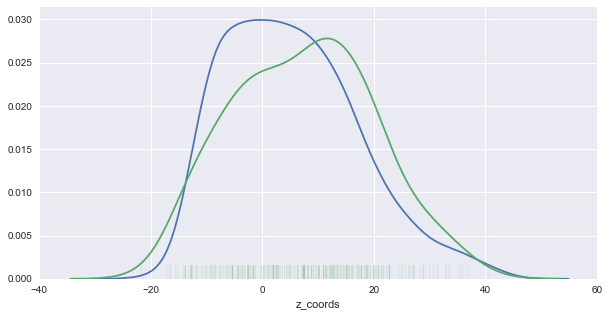

G


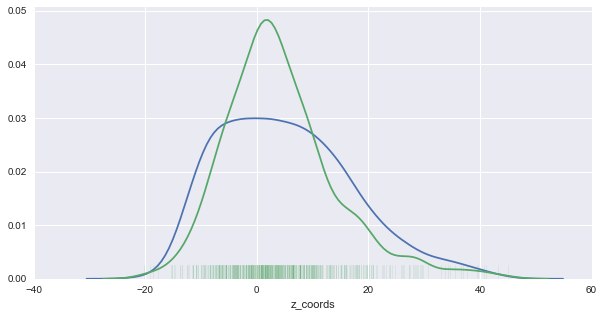

H


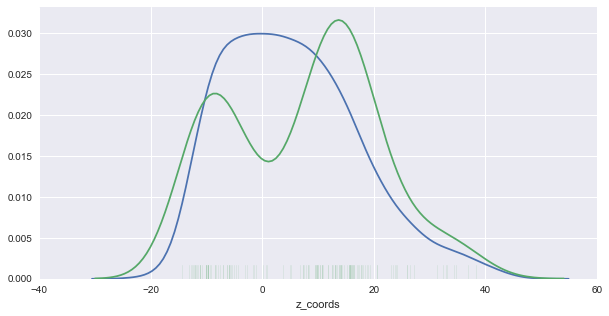

I


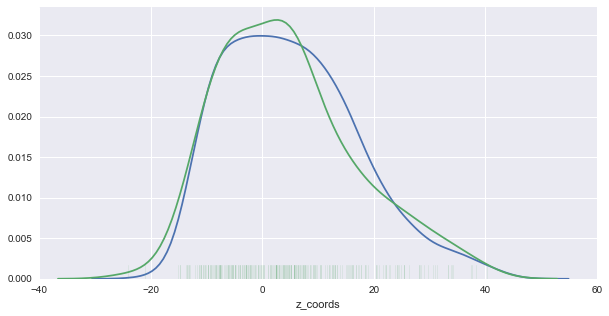

L


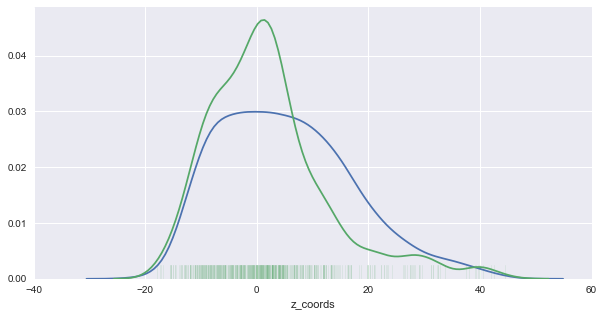

K


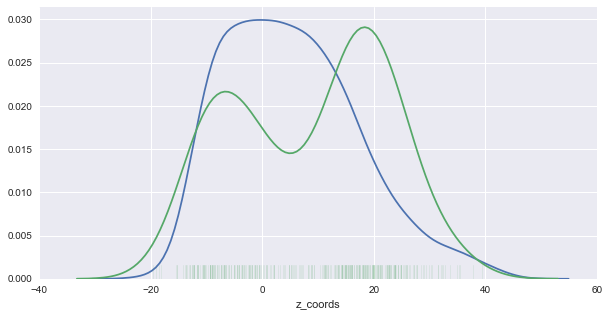

M


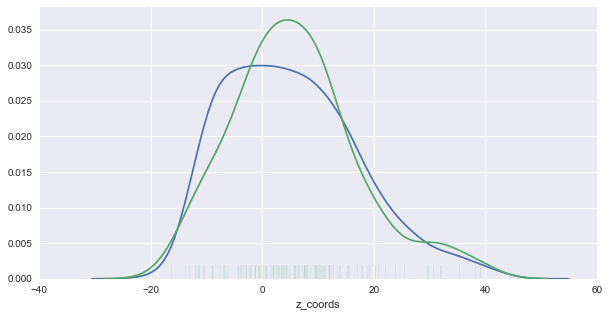

F


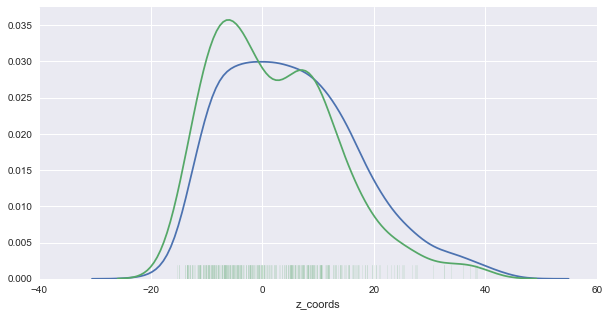

P


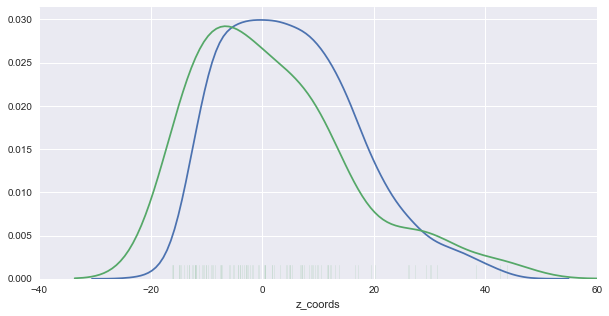

S


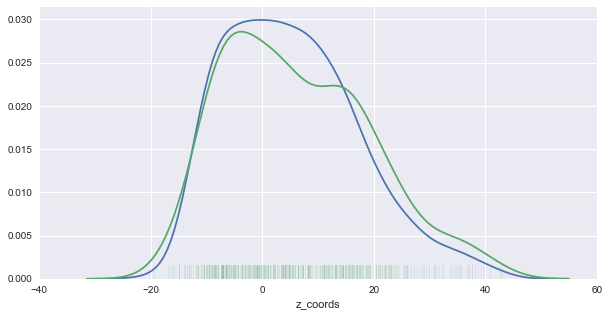

T


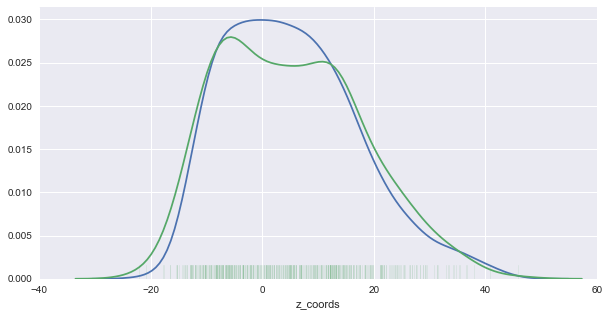

W


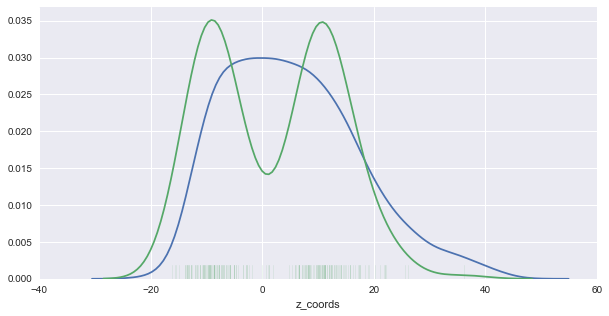

Y


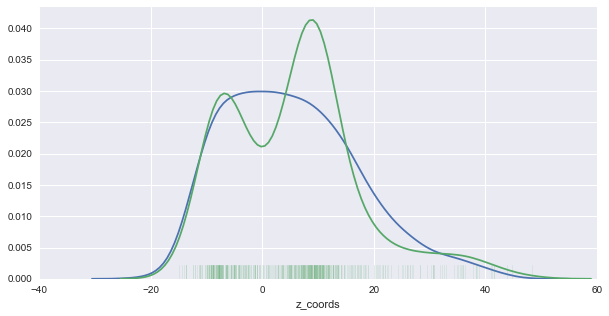

V


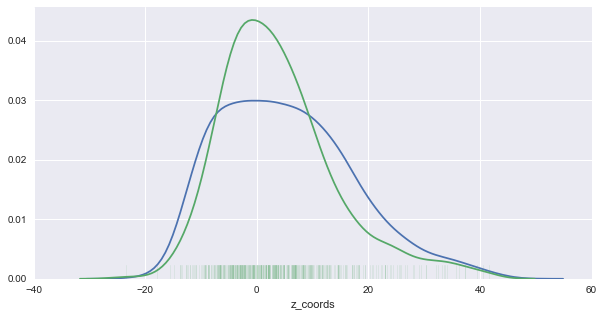

In [63]:
plot_aa_kdes(barrel_df, 'z_coords', 'comparison', aa_dict_no_cys)

A


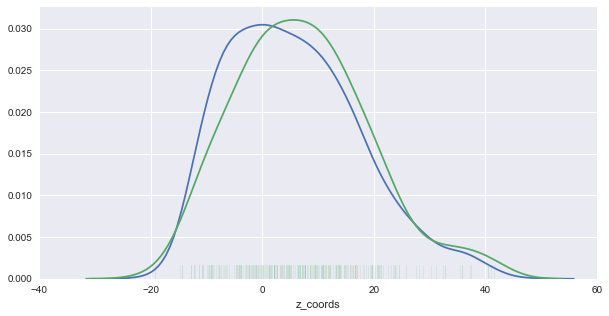

R


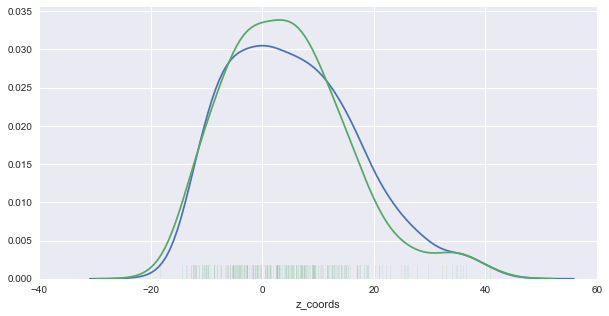

N


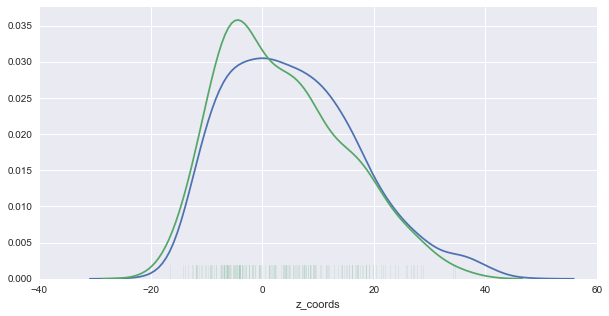

D


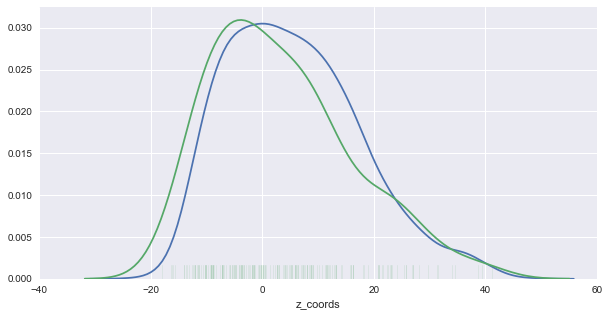

Q


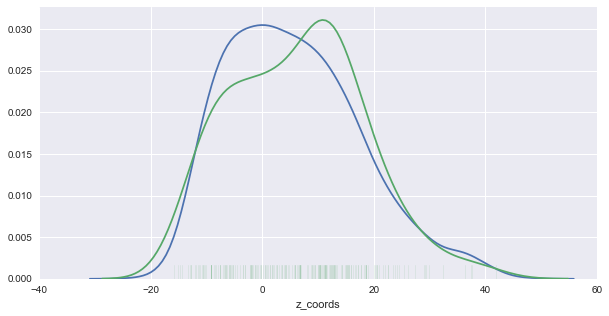

E


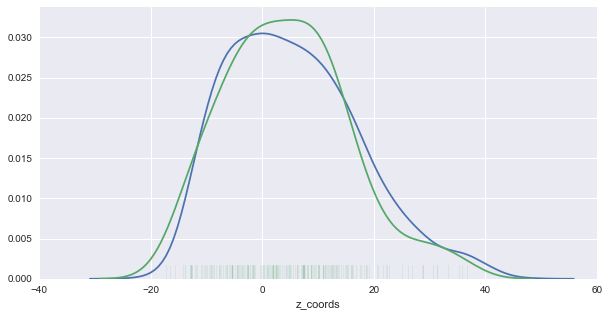

G


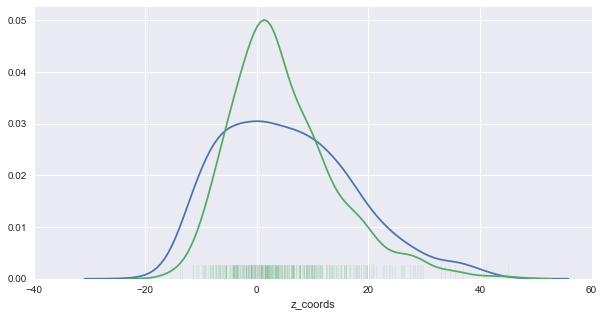

H


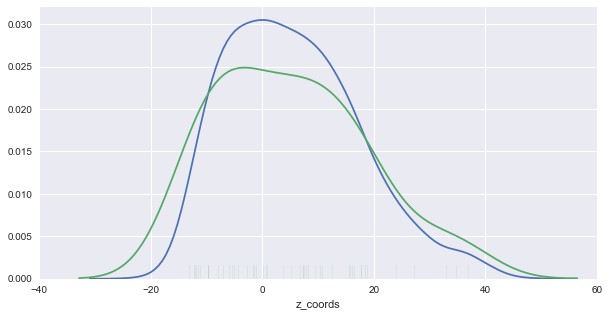

I


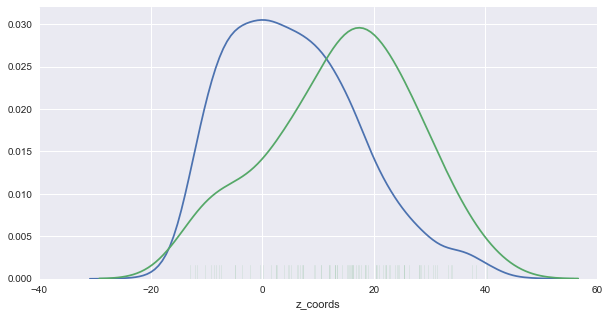

L


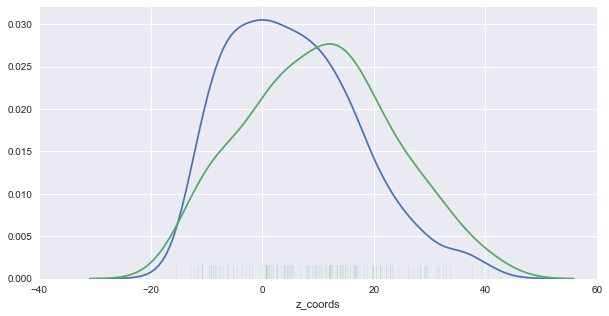

K


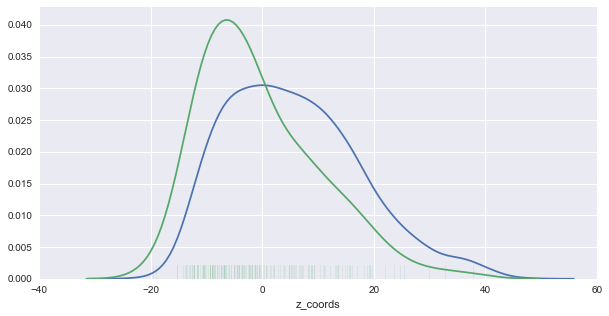

M


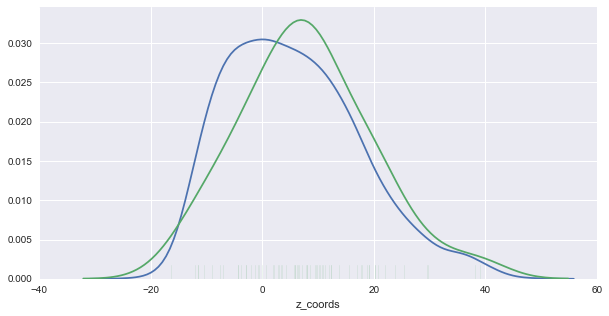

F


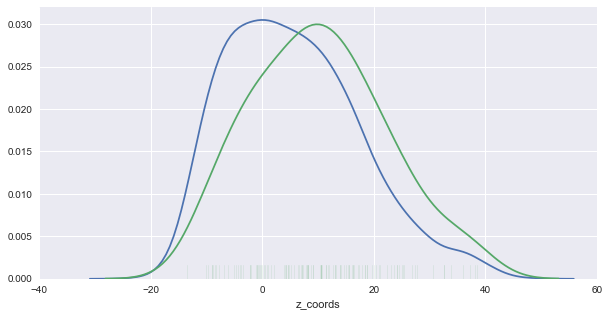

P


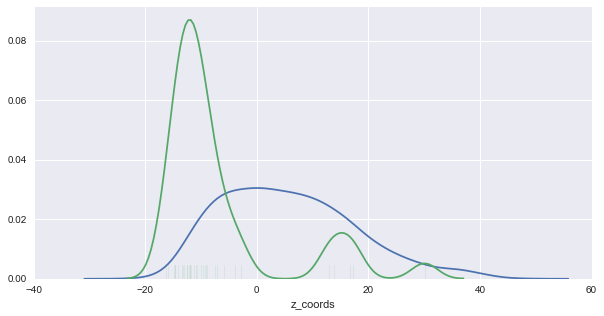

S


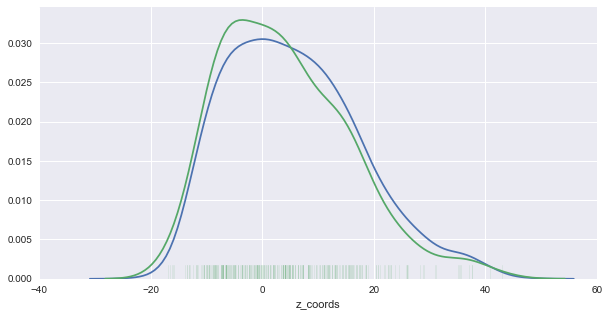

T


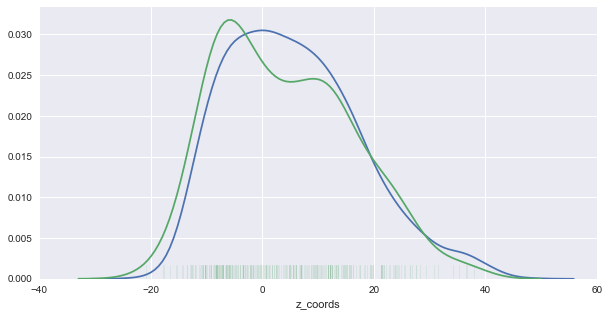

W


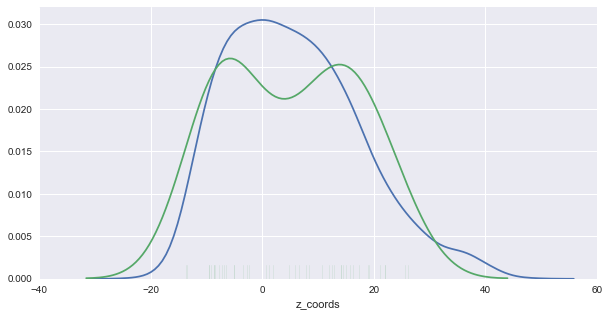

Y


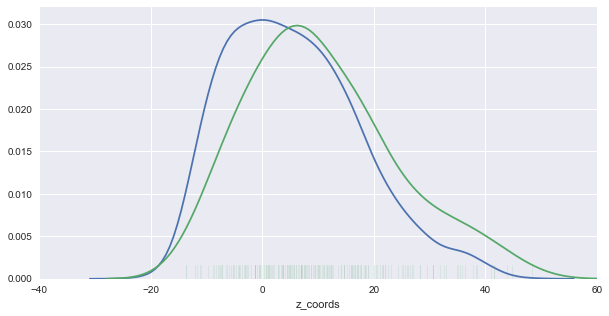

V


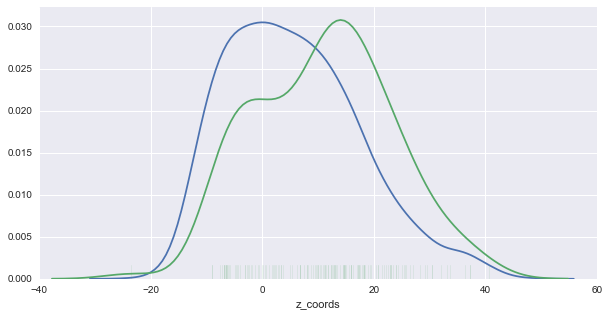

In [64]:
plot_aa_kdes(int_barrel_df, 'z_coords', 'comparison', aa_dict_no_cys)

A


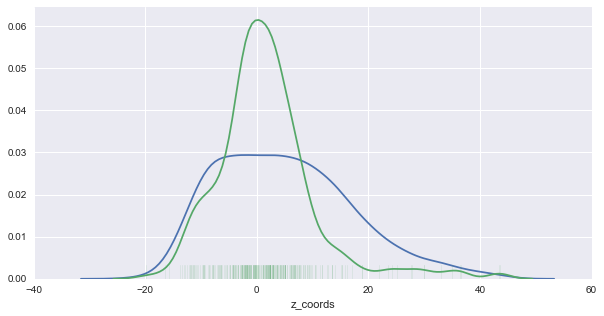

R


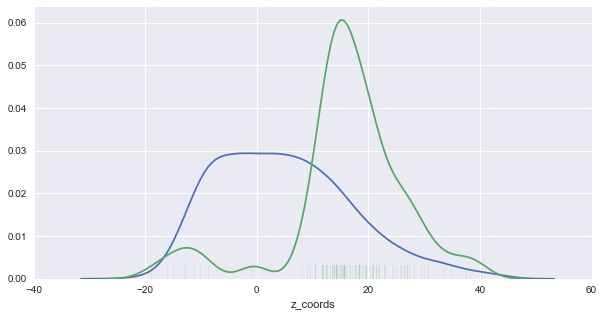

N


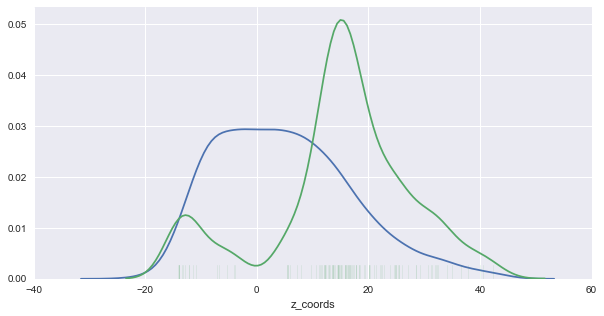

D


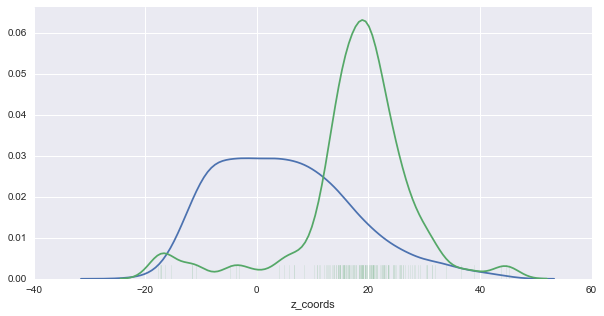

Q


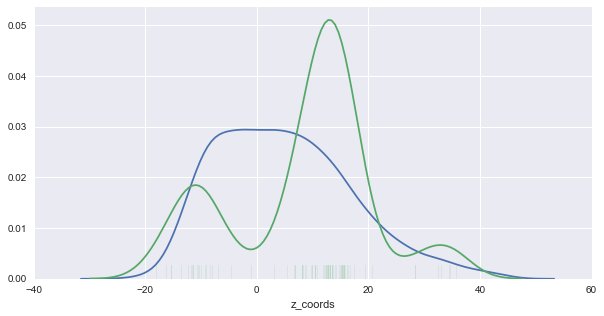

E


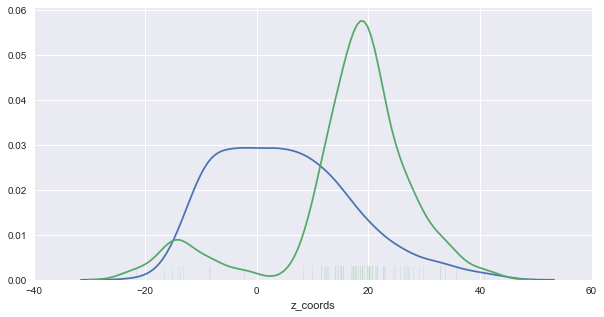

G


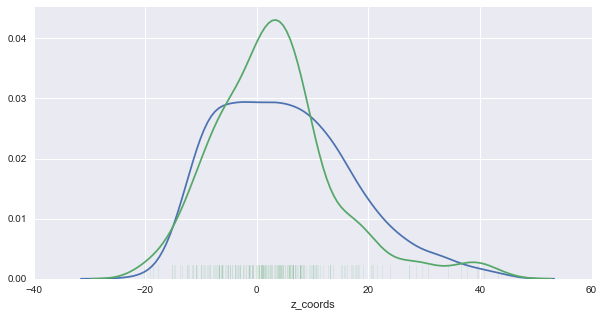

H


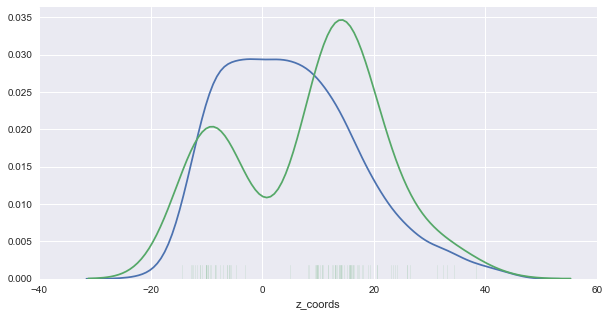

I


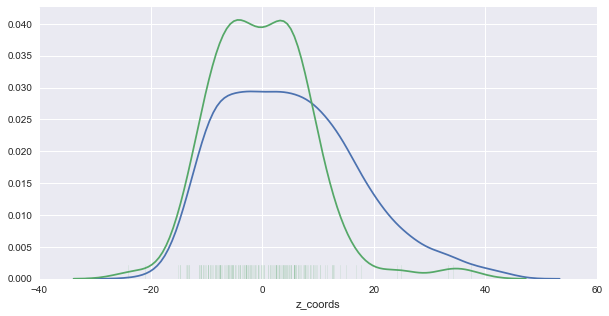

L


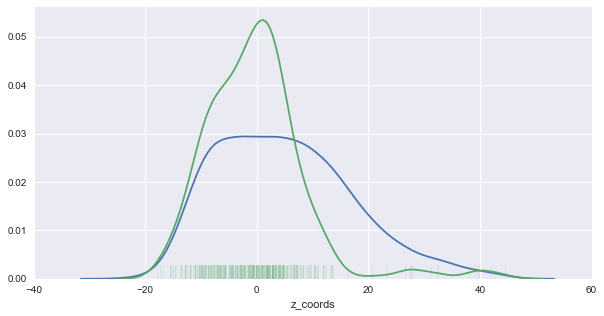

K


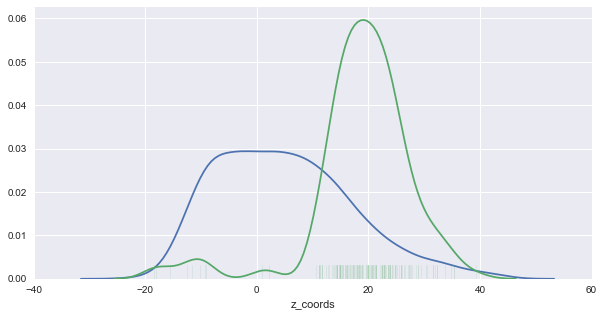

M


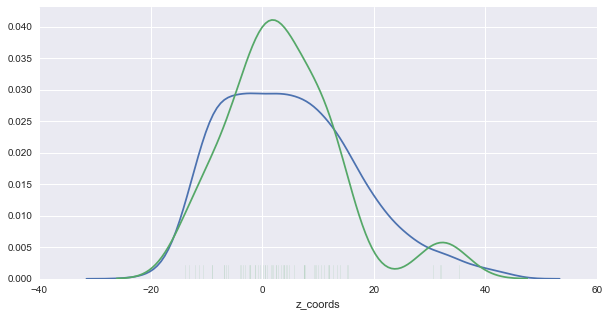

F


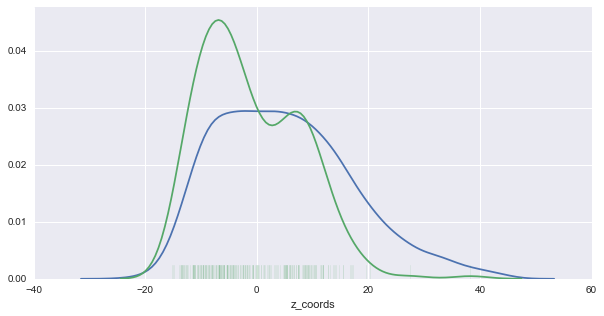

P


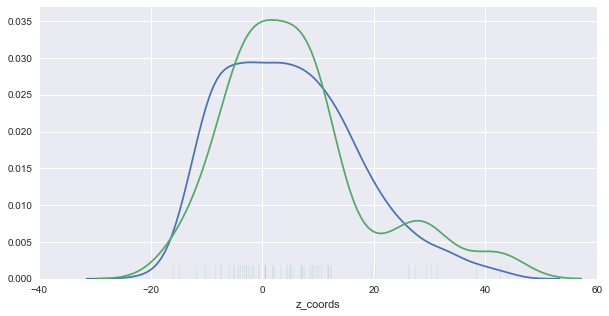

S


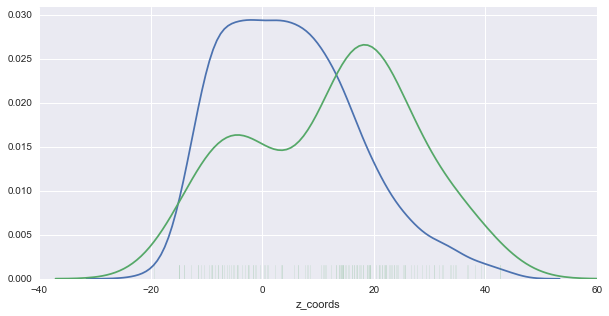

T


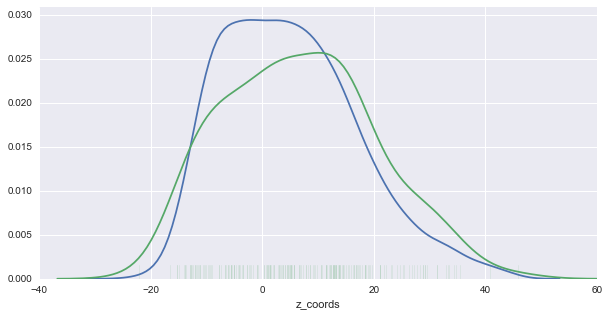

W


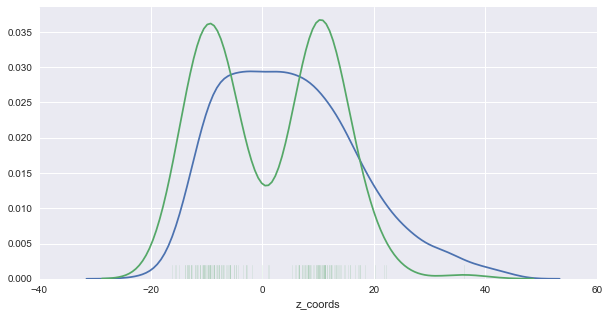

Y


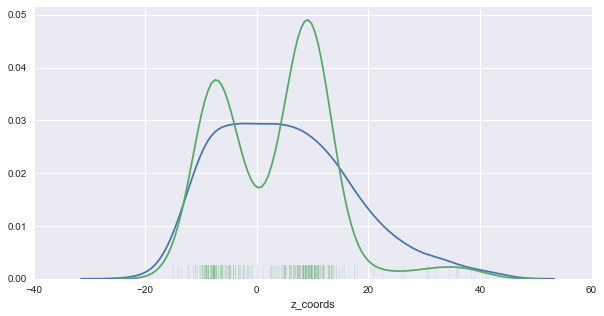

V


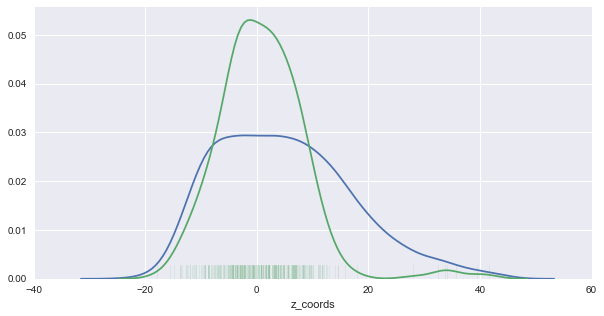

In [65]:
plot_aa_kdes(ext_barrel_df, 'z_coords', 'comparison', aa_dict_no_cys)

A


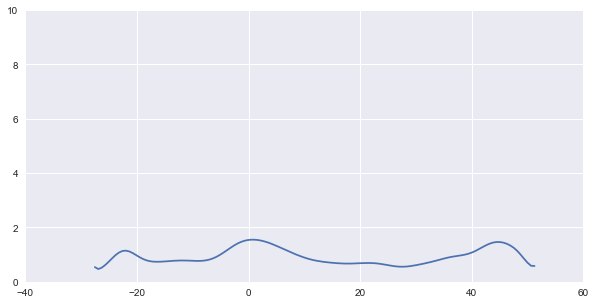

R


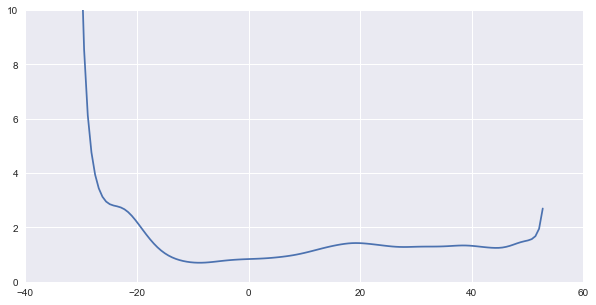

N


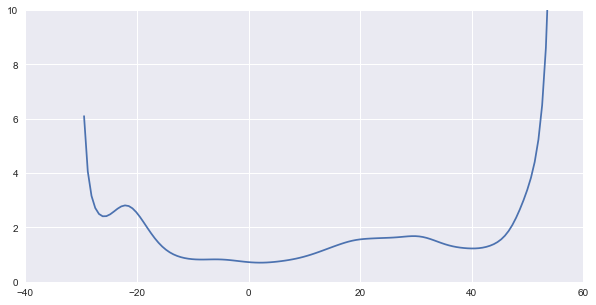

D


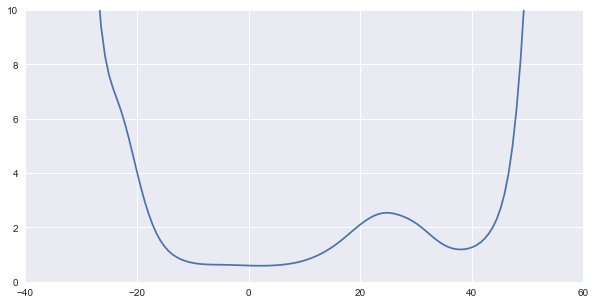

Q


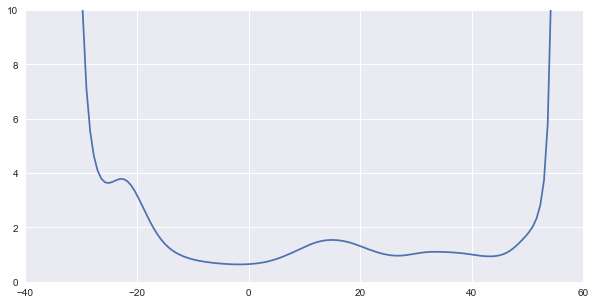

E


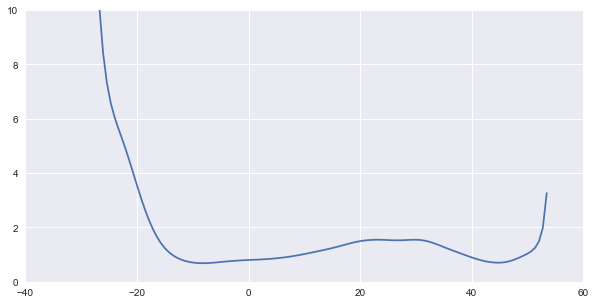

G


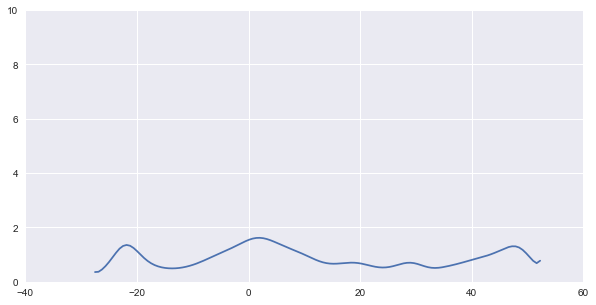

H


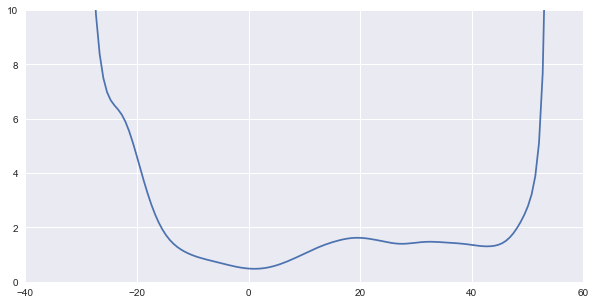

I


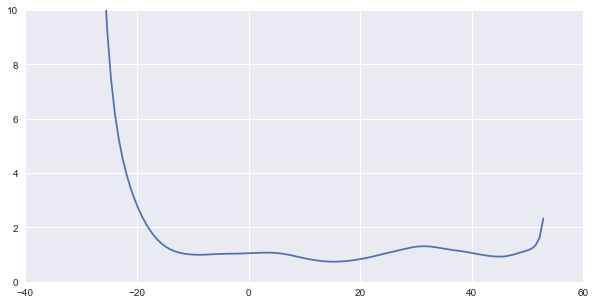

L


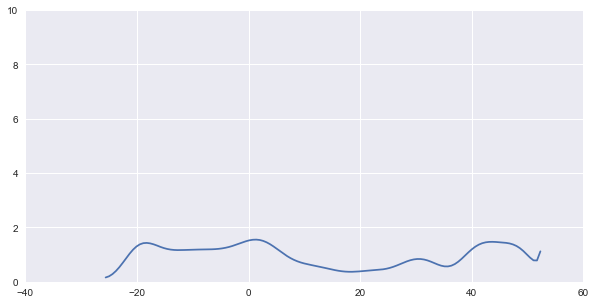

K


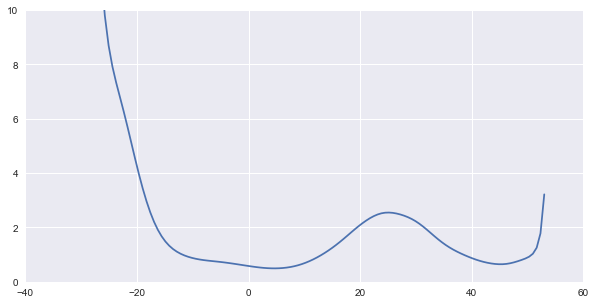

M


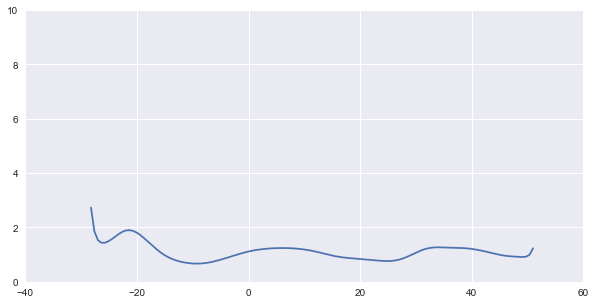

F


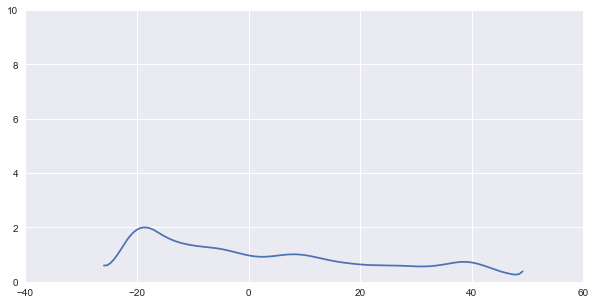

P


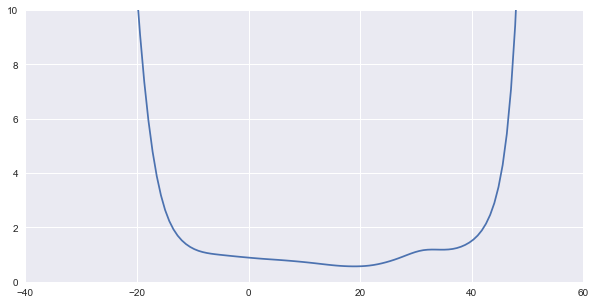

S


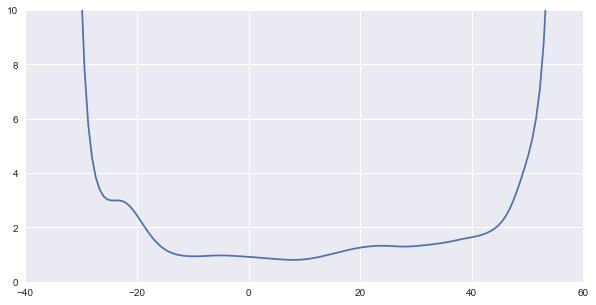

T


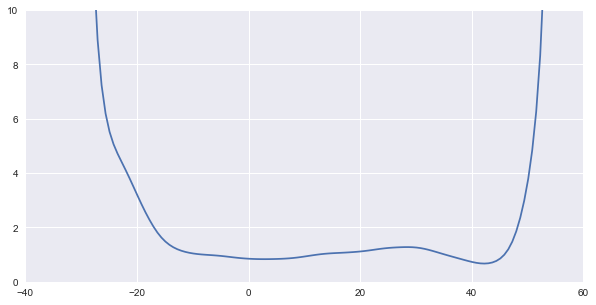

W


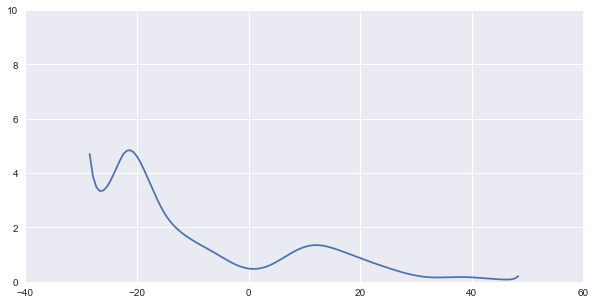

Y


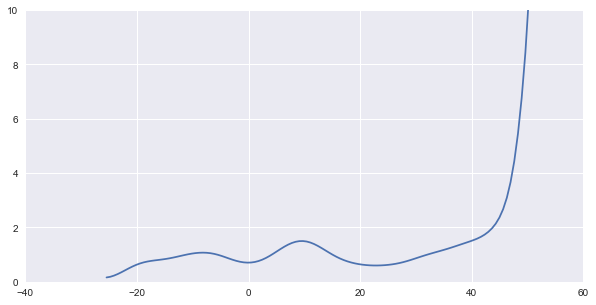

V


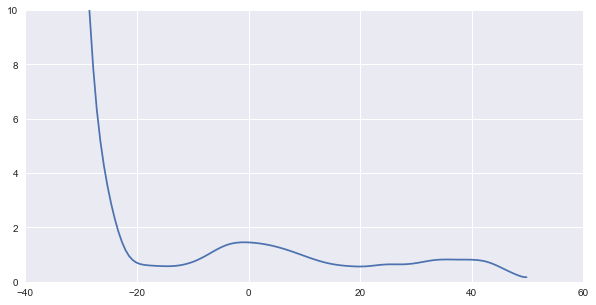

In [66]:
plot_propensities(barrel_df, 'z_coords', aa_dict_no_cys)

A


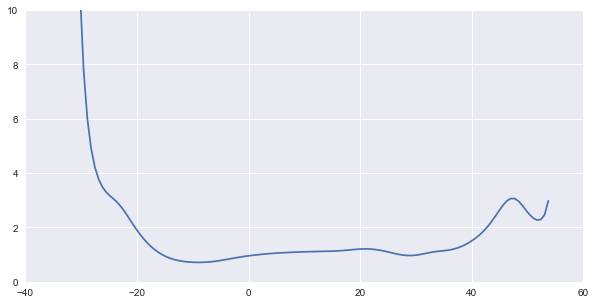

R


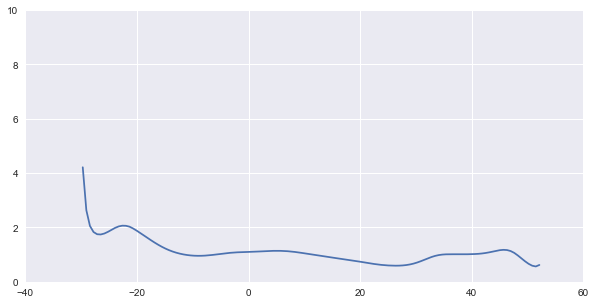

N


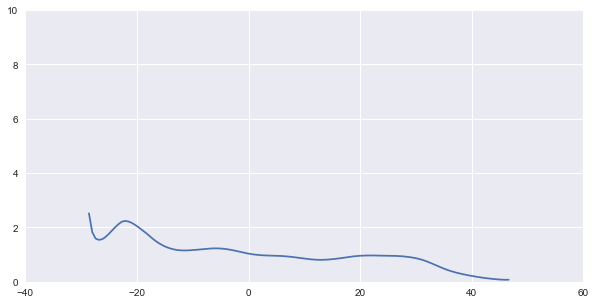

D


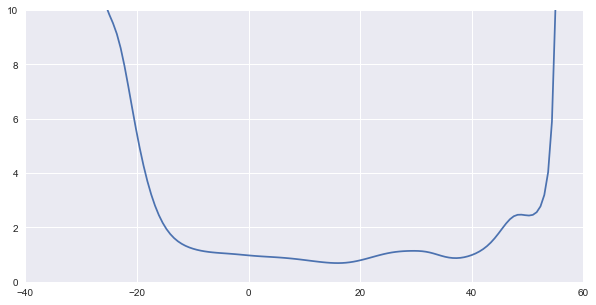

Q


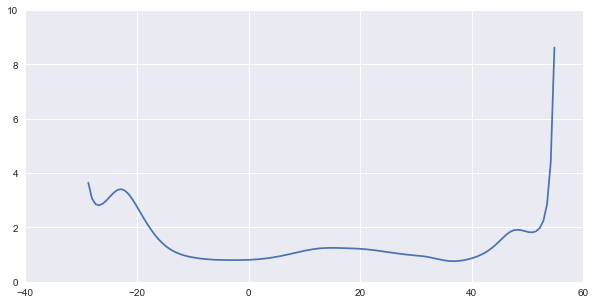

E


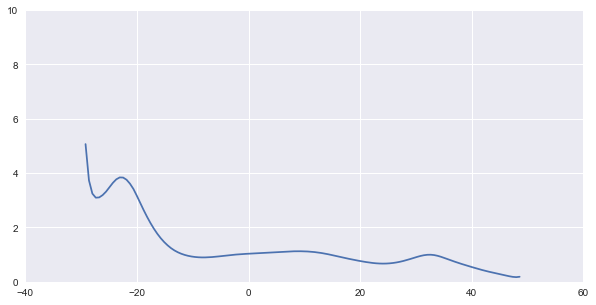

G


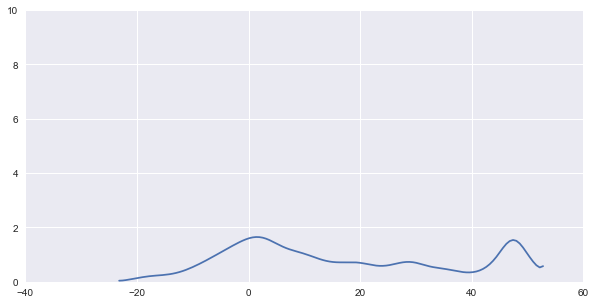

H


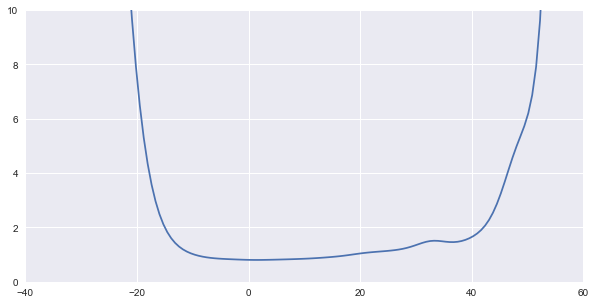

I


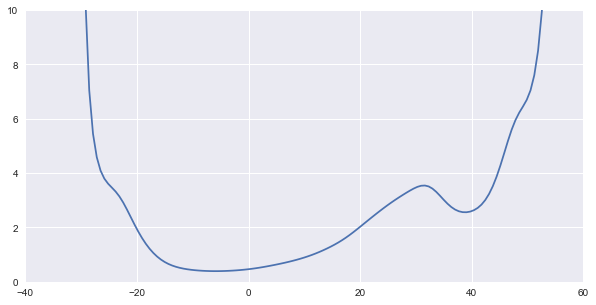

L


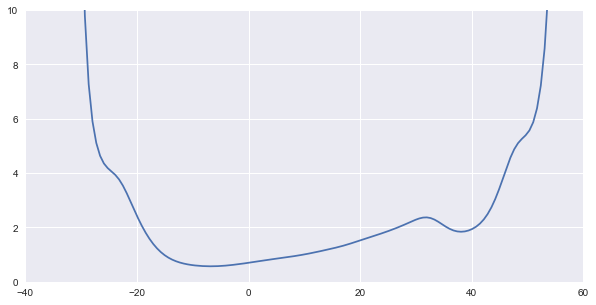

K


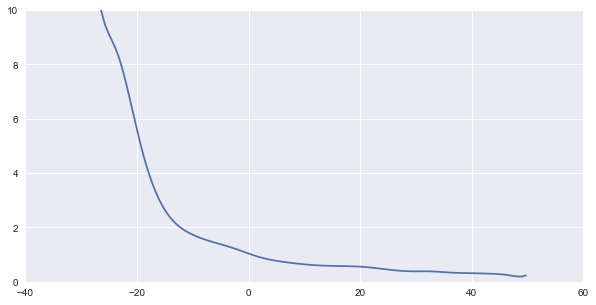

M


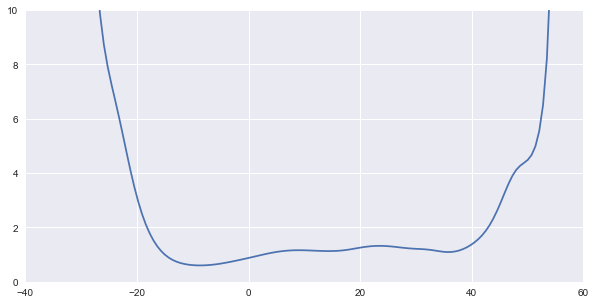

F


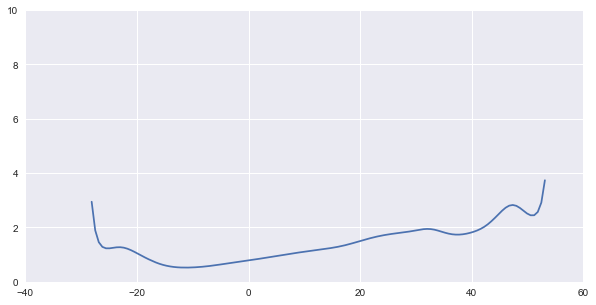

P


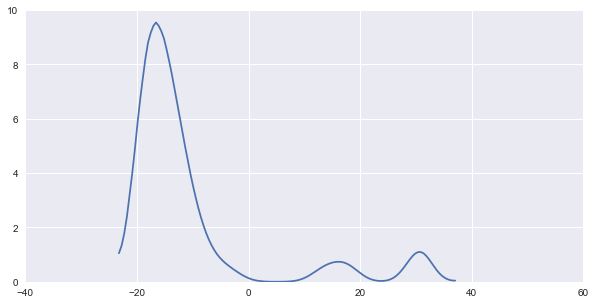

S


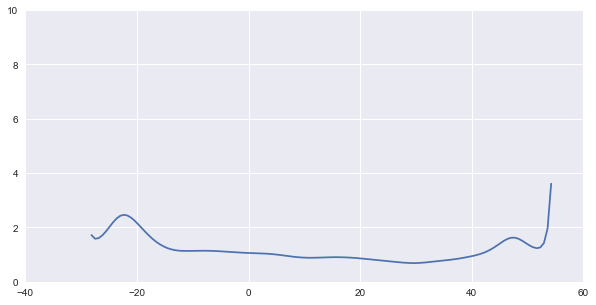

T


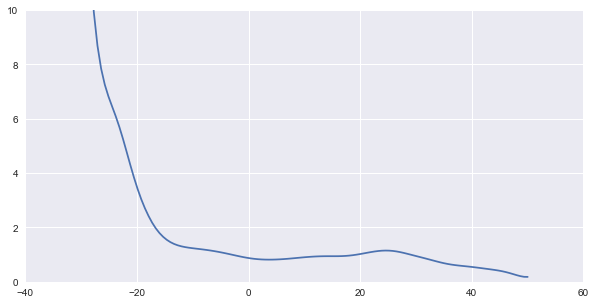

W


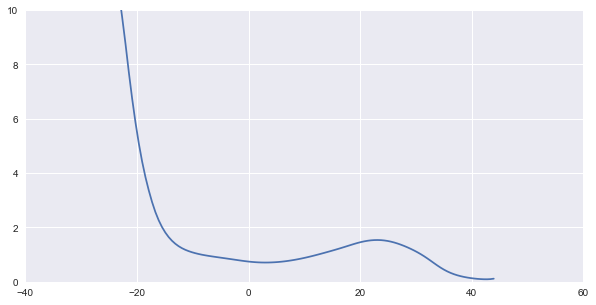

Y


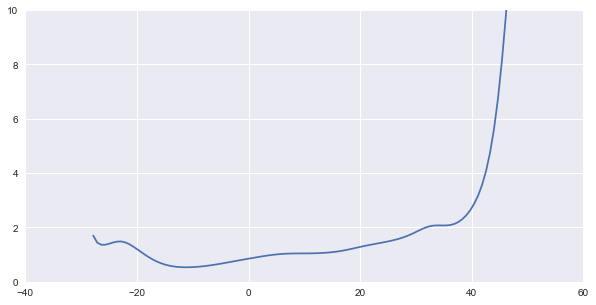

V


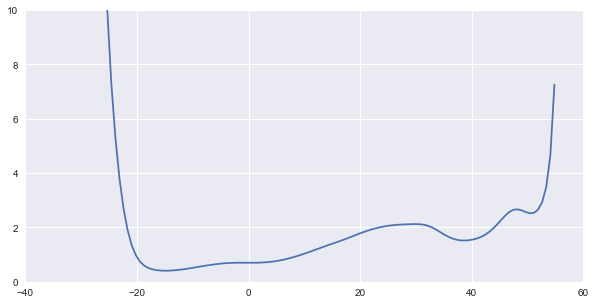

In [67]:
plot_propensities(int_barrel_df, 'z_coords', aa_dict_no_cys)

A


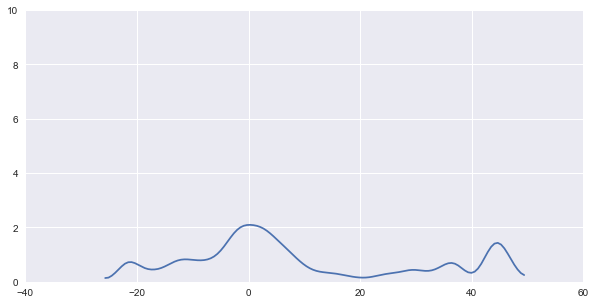

R


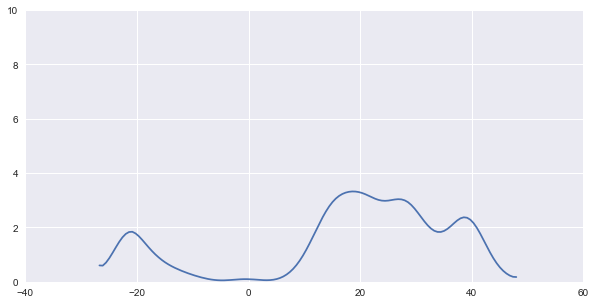

N


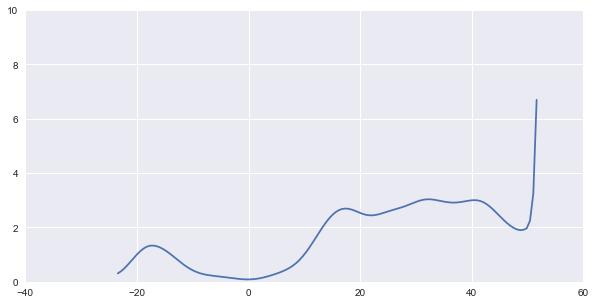

D


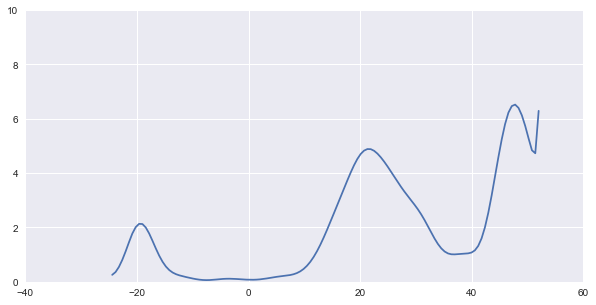

Q


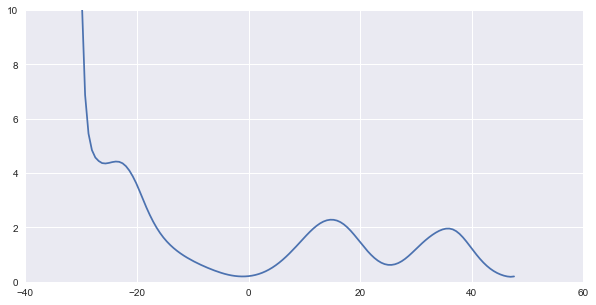

E


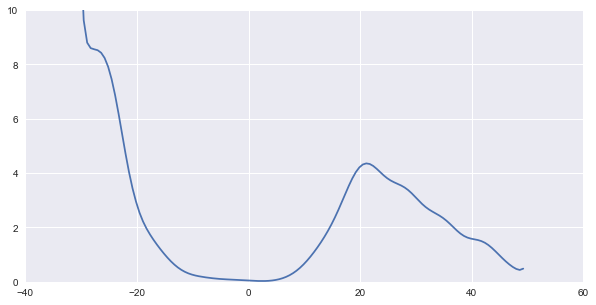

G


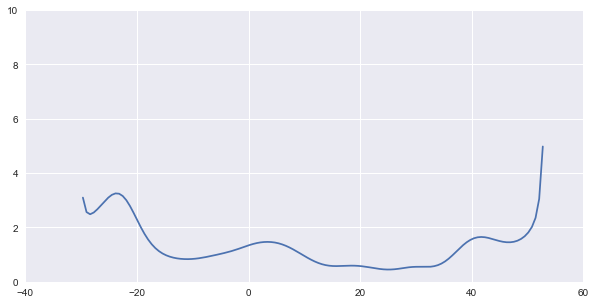

H


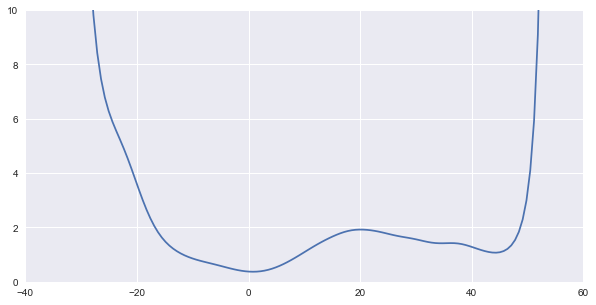

I


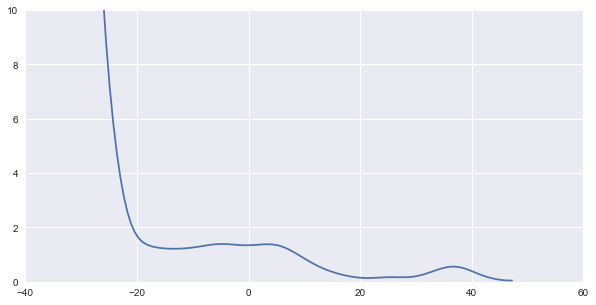

L


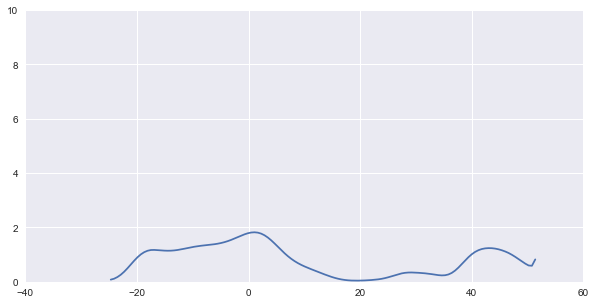

K


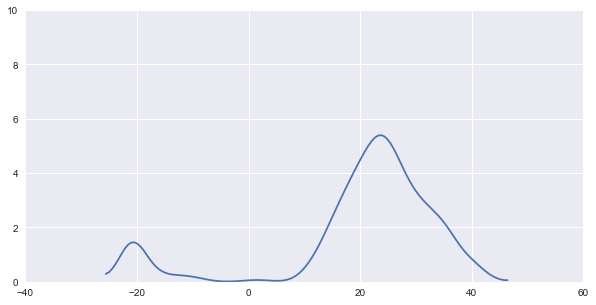

M


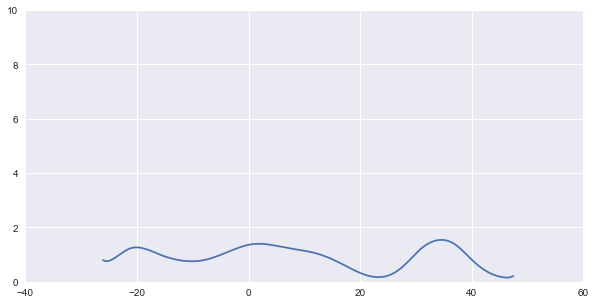

F


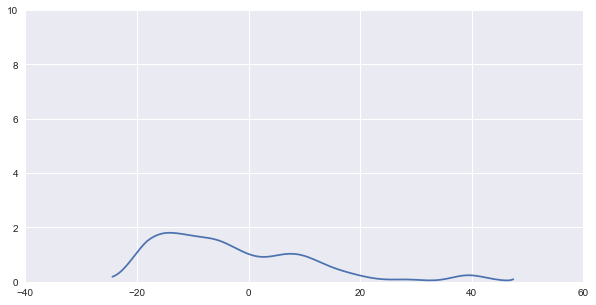

P


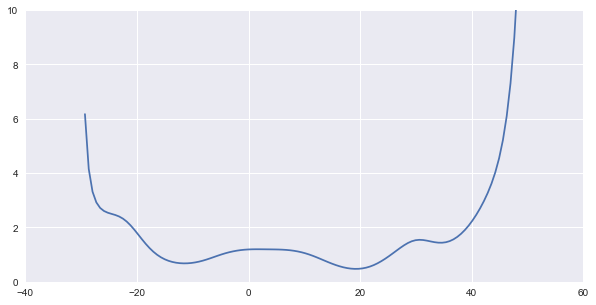

S


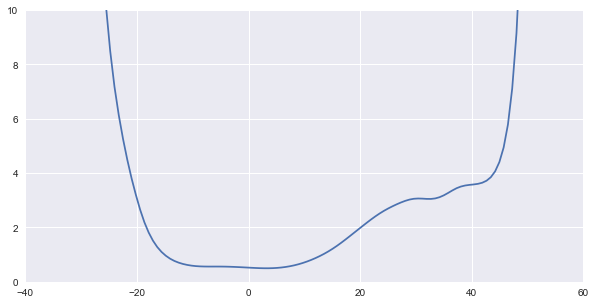

T


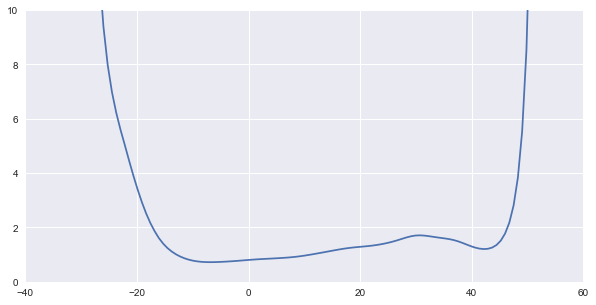

W


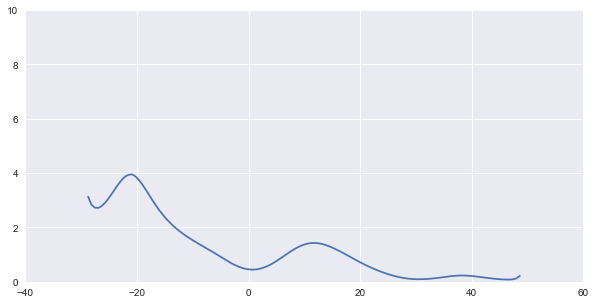

Y


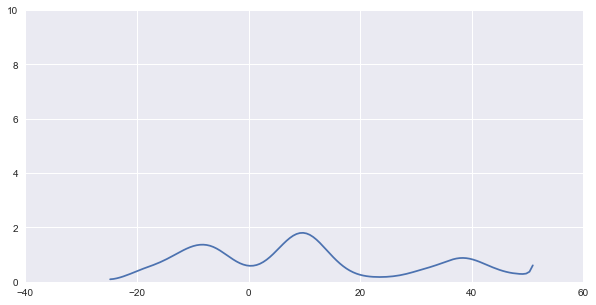

V


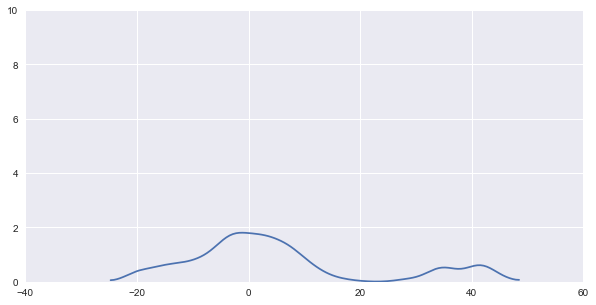

In [68]:
plot_propensities(ext_barrel_df, 'z_coords', aa_dict_no_cys)

### 2D Kolmogorov-Smirnov test to compare individual and overall amino acid z-coordinate distributions

How many bootstrap samples should I use (all residues)?

100
300
1000
3000
10000
30000
100000
A


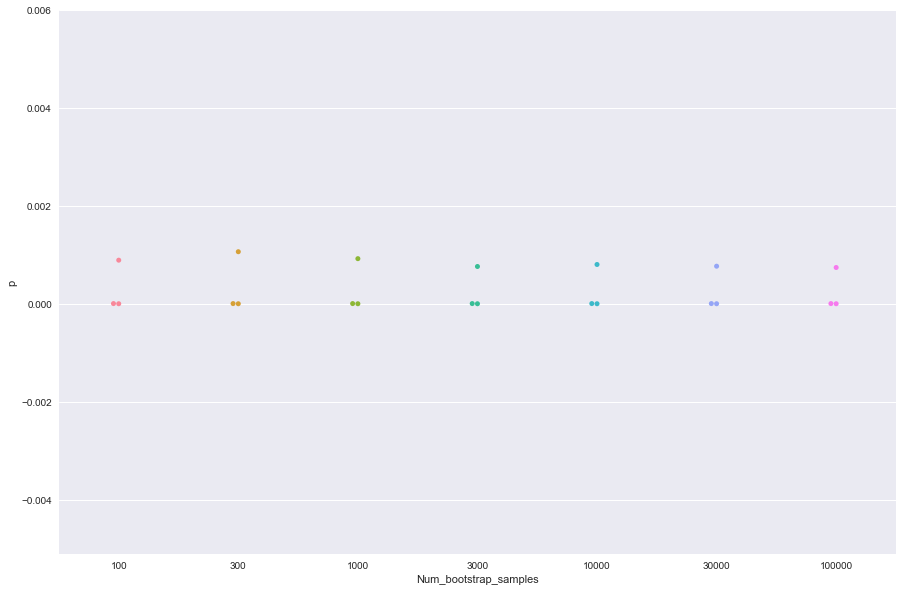

R


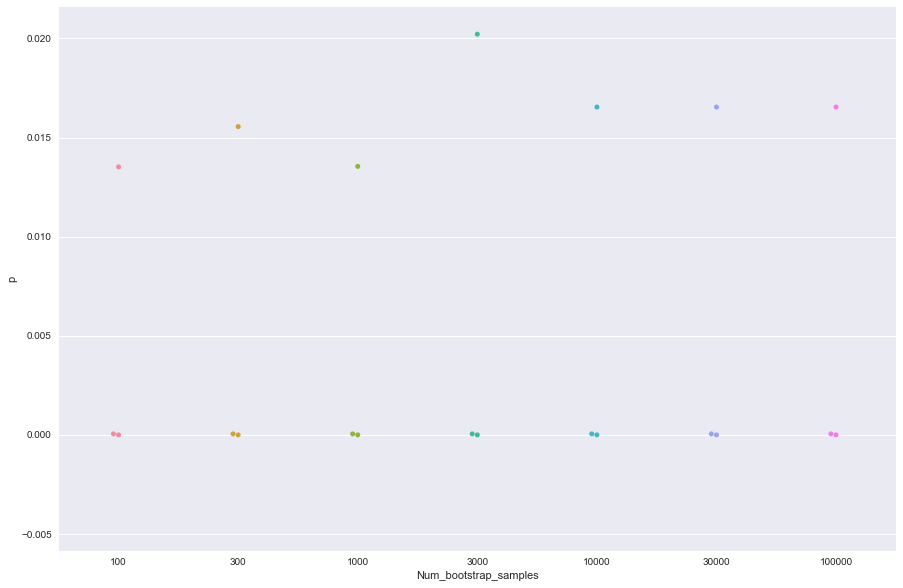

N


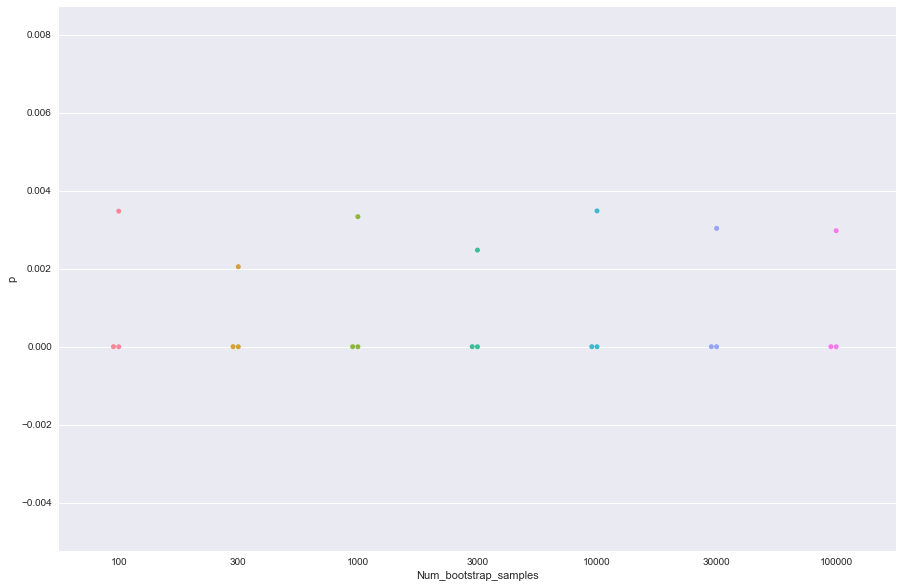

D


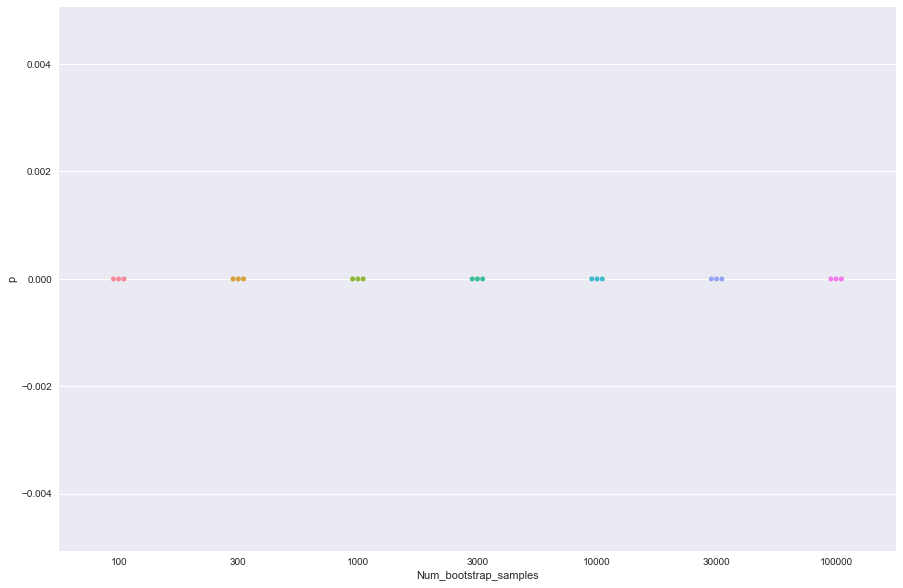

Q


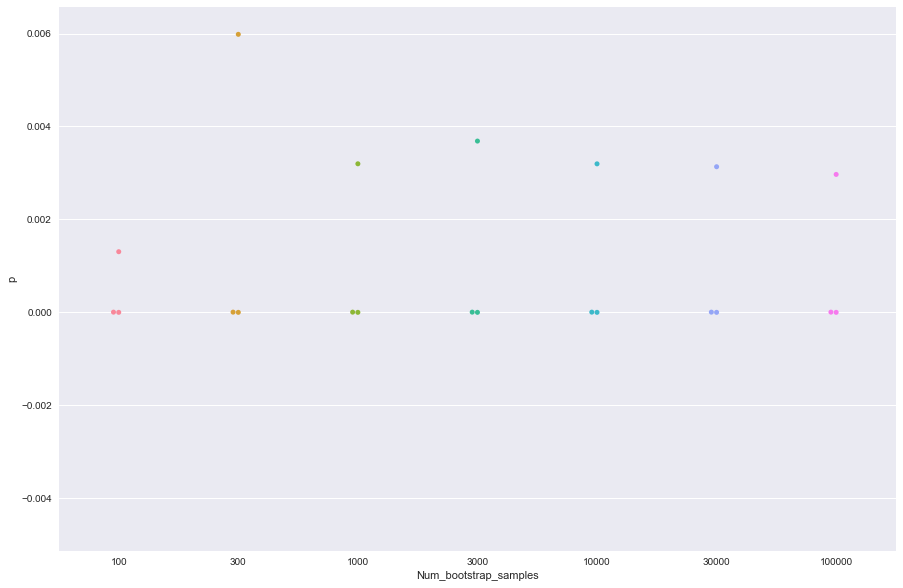

E


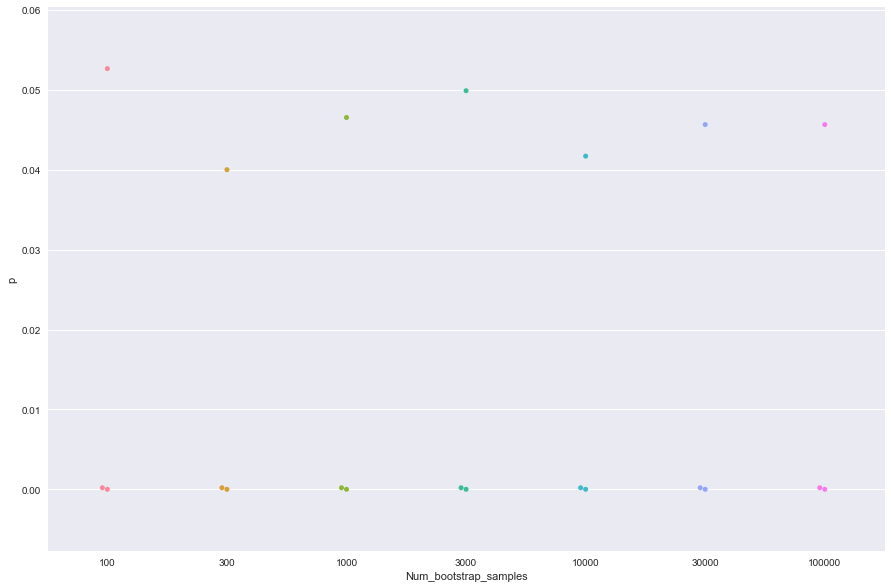

G


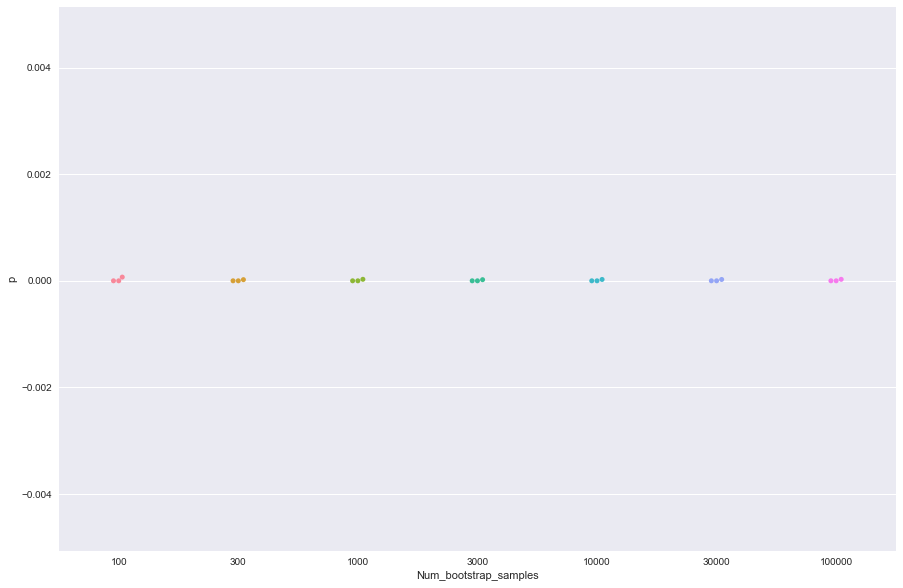

H


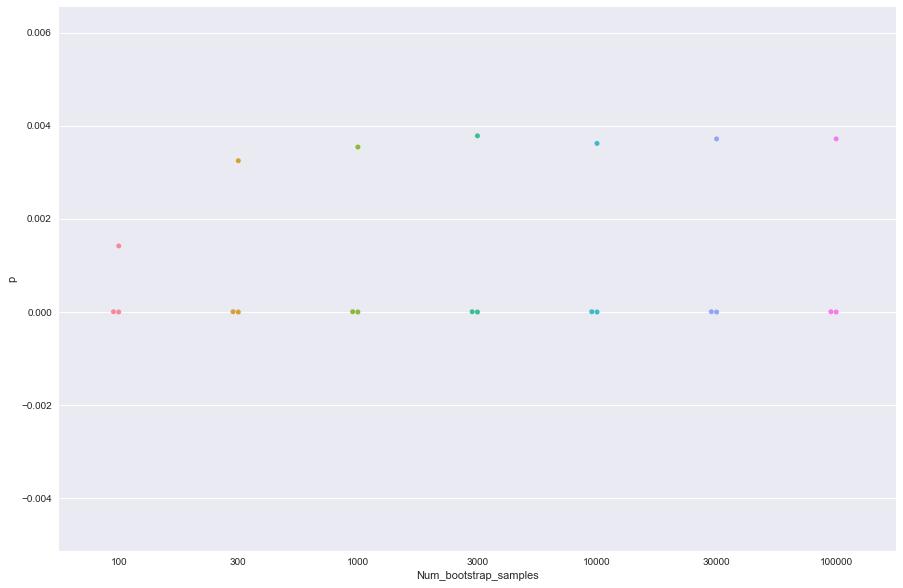

I


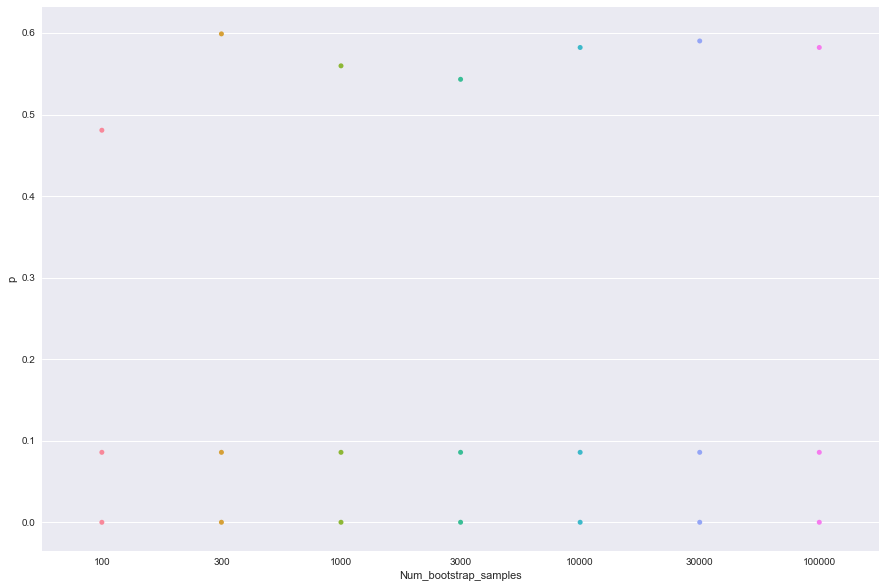

L


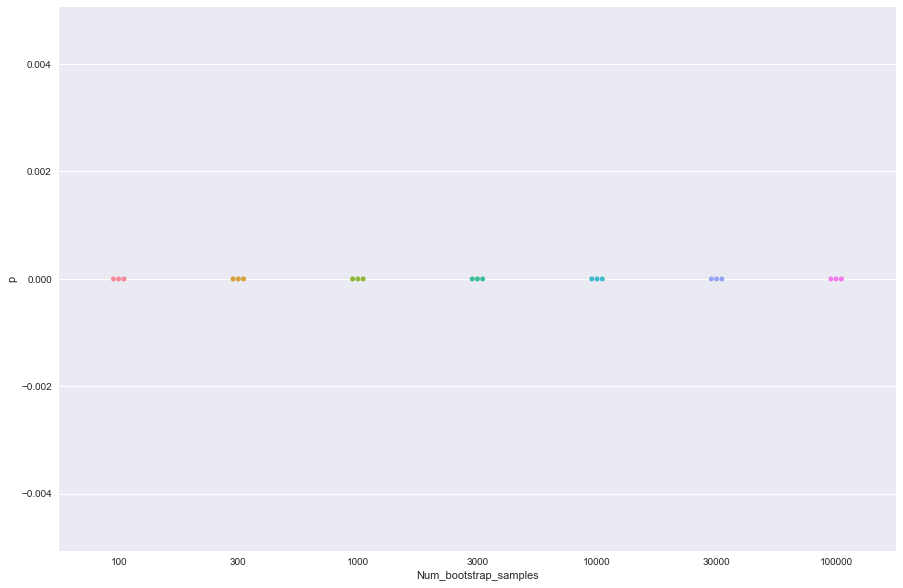

K


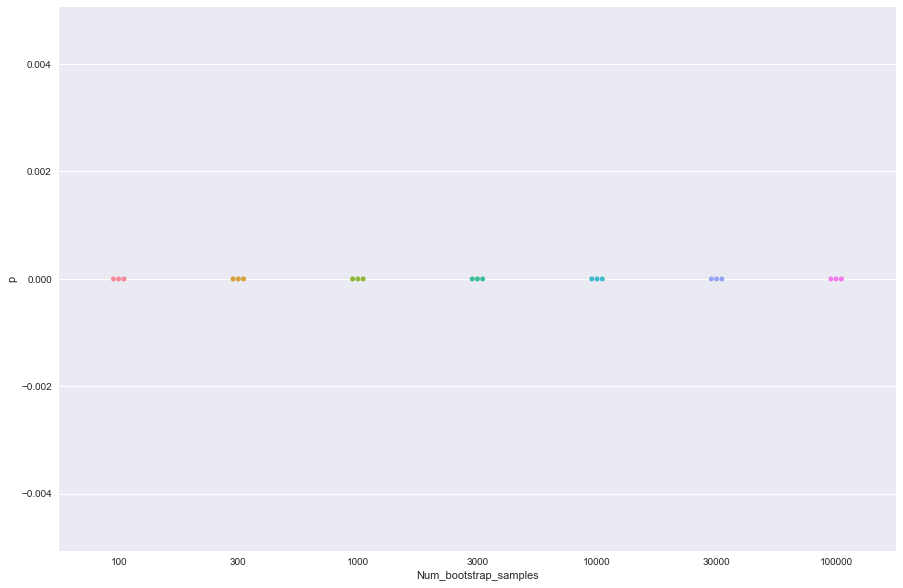

M


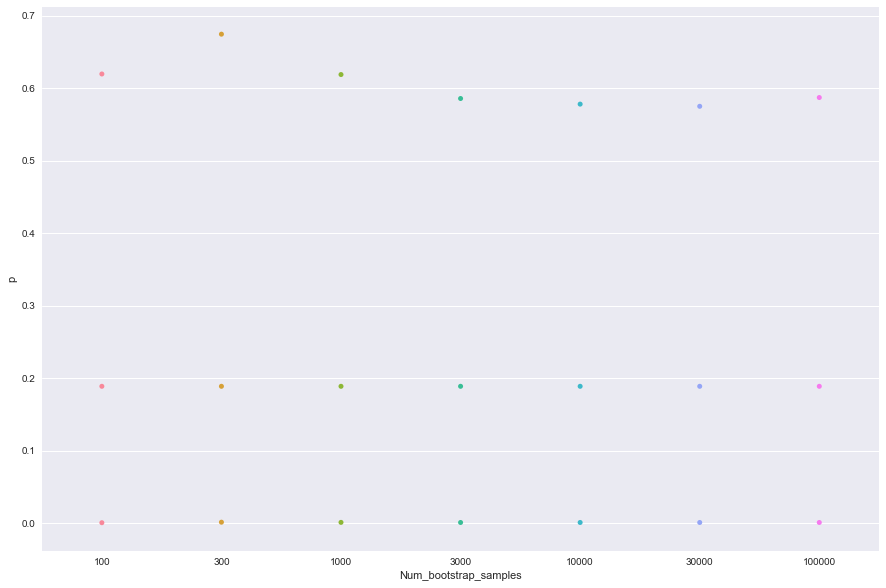

F


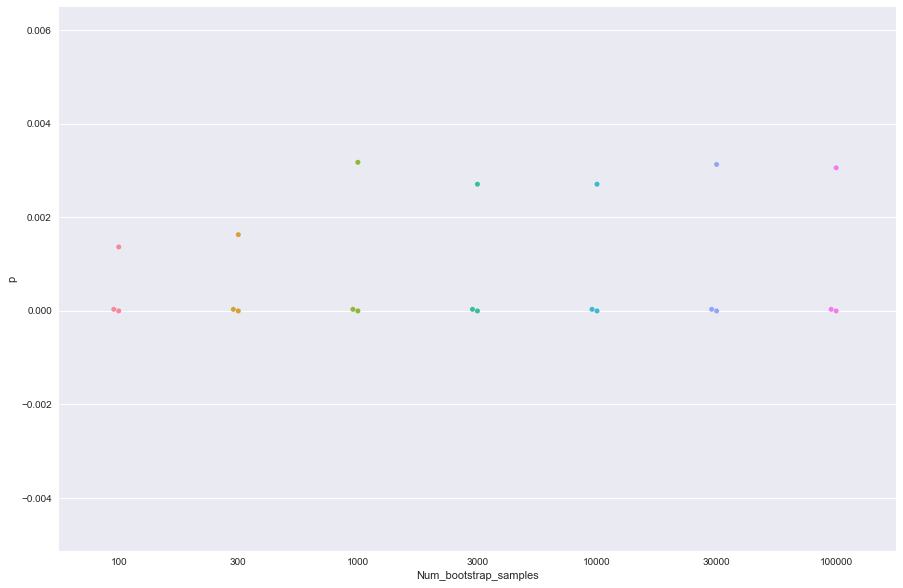

P


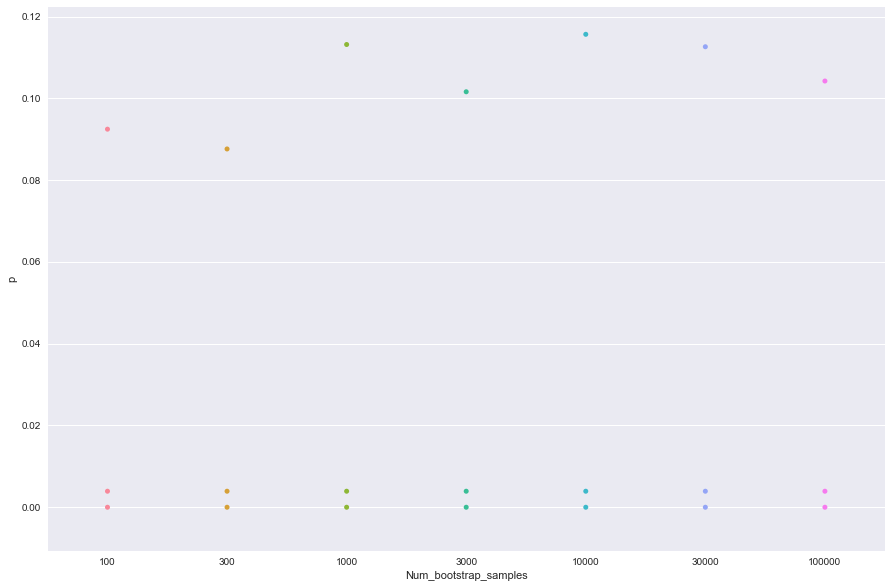

S


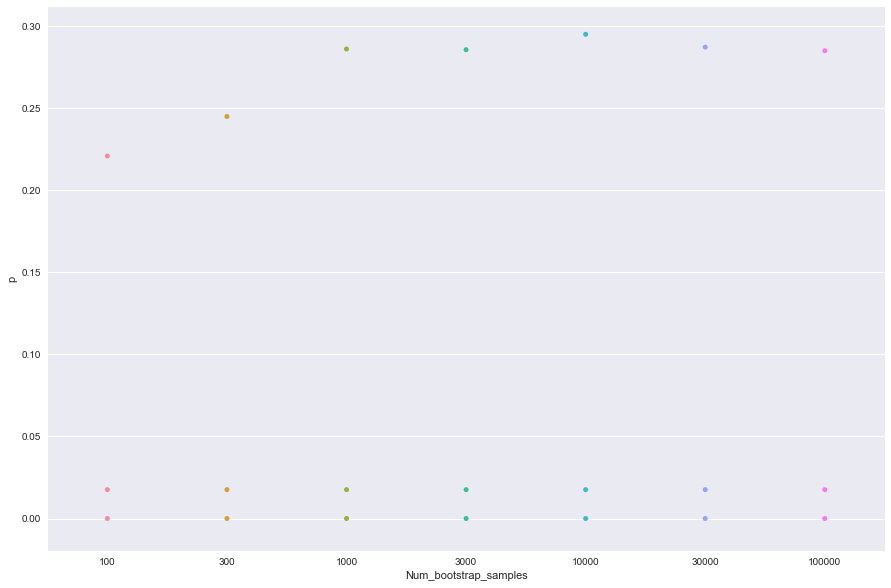

T


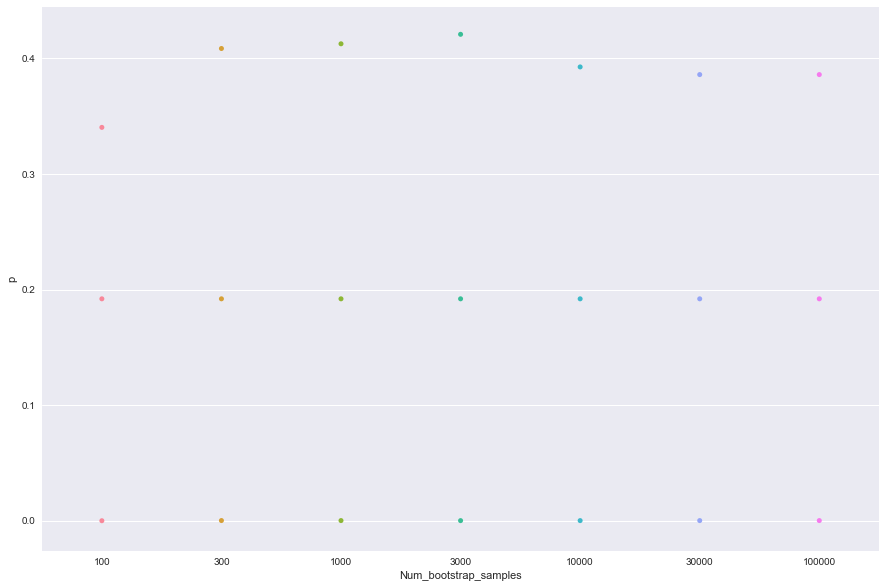

W


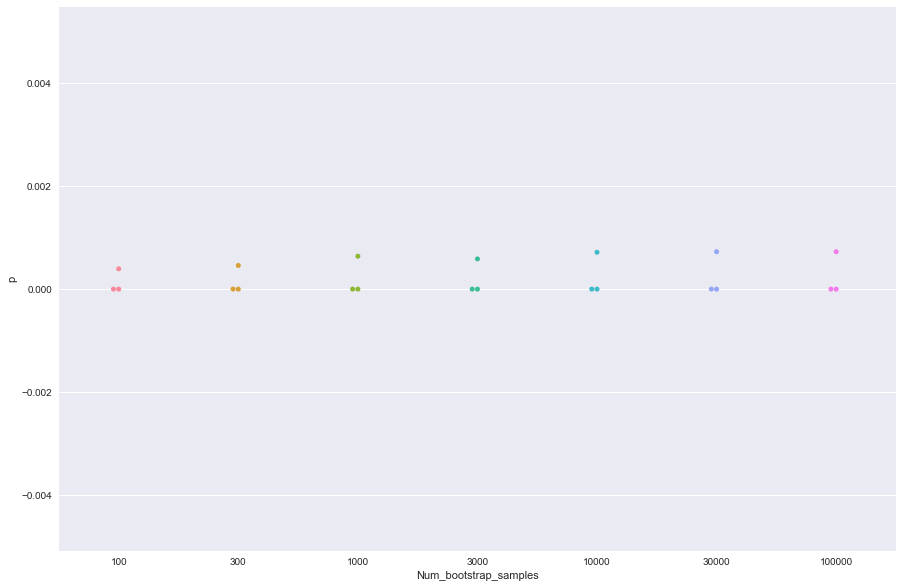

Y


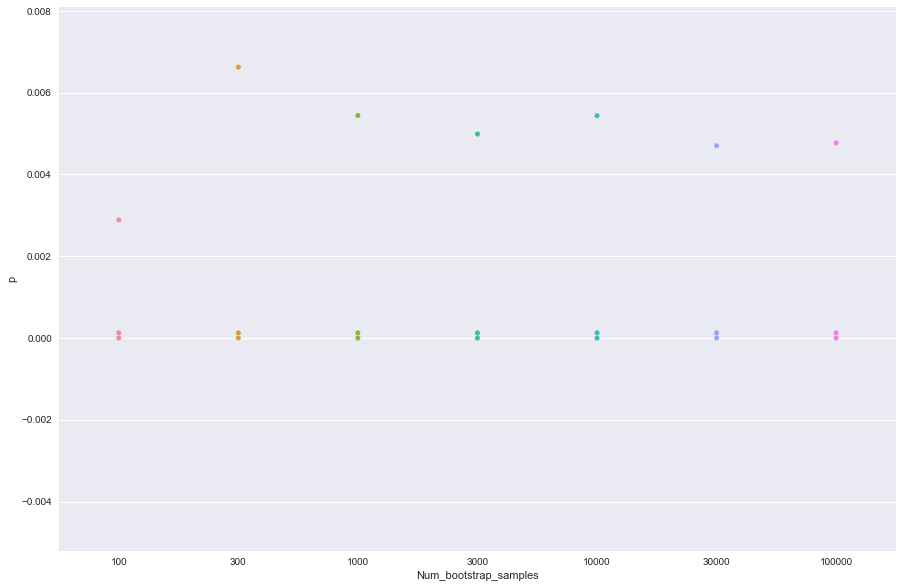

V


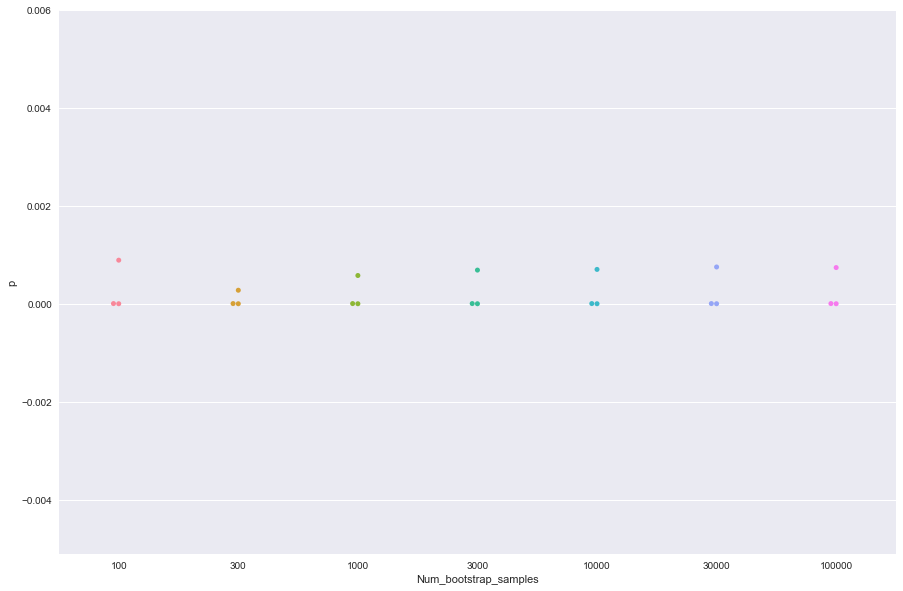

In [377]:
iterate_bootstrap_conf_limits(
    barrel_df, 'z_coords', run_ks_2samp_test, [100, 300, 1000, 3000, 10000, 30000, 100000], aa_dict_no_cys
)

Are the differences I observe between individual amino acid and overall amino acid distributions significant?

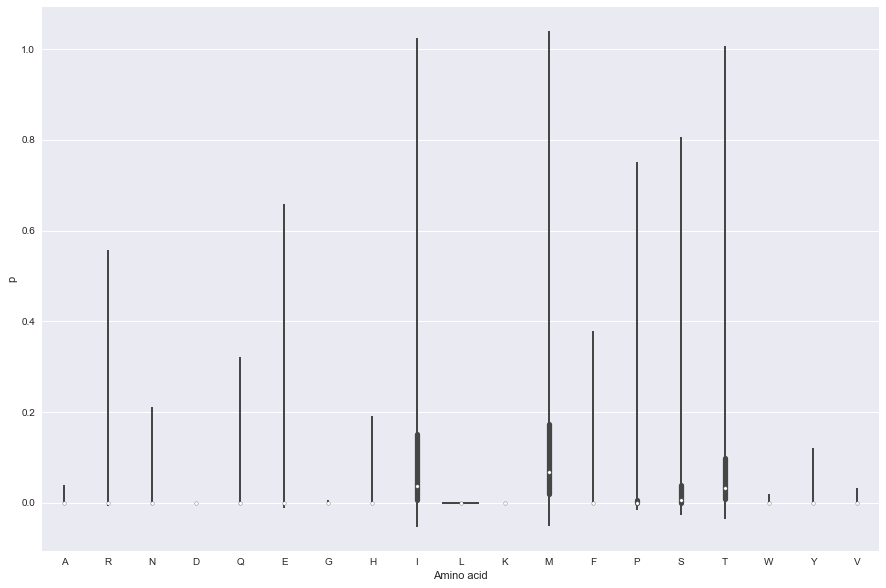

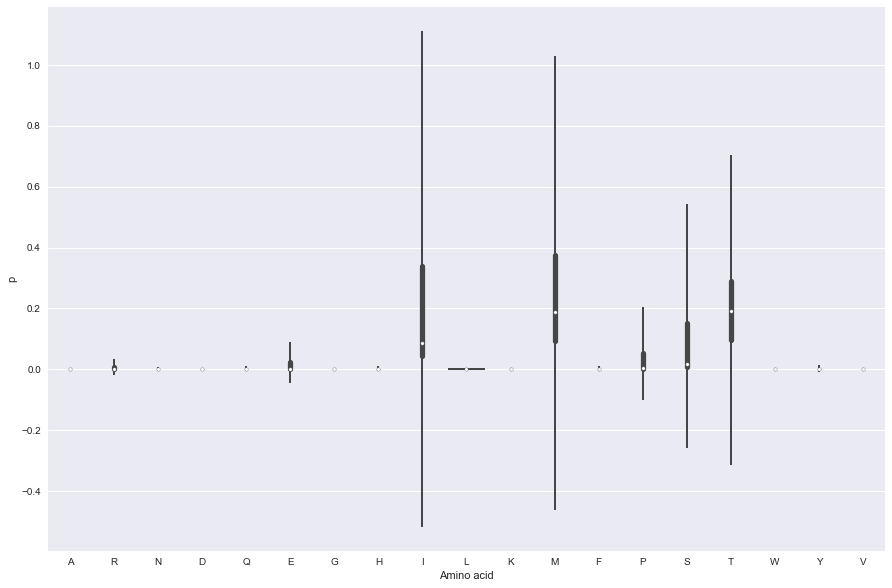

In [382]:
initial_D_dict, initial_p_dict = initial_ks_test(barrel_df, 'z_coords', run_ks_2samp_test, aa_dict_no_cys)

D_dict_bootstrap, p_dict_bootstrap = bootstrap_ks_test(barrel_df, 'z_coords', 10000, run_ks_2samp_test, aa_dict_no_cys)
draw_plot(sns.violinplot, p_dict_bootstrap, list(aa_dict_no_cys.keys()), 'Amino acid', 'p')

barrel_conf_intv_p_dict = calc_95_conf_limits(initial_p_dict, p_dict_bootstrap)
draw_plot(sns.violinplot, barrel_conf_intv_p_dict, list(aa_dict_no_cys.keys()), 'Amino acid', 'p')

How many bootstrap samples should I use (interior residues)?

100
300
1000
3000
10000
30000
100000
A


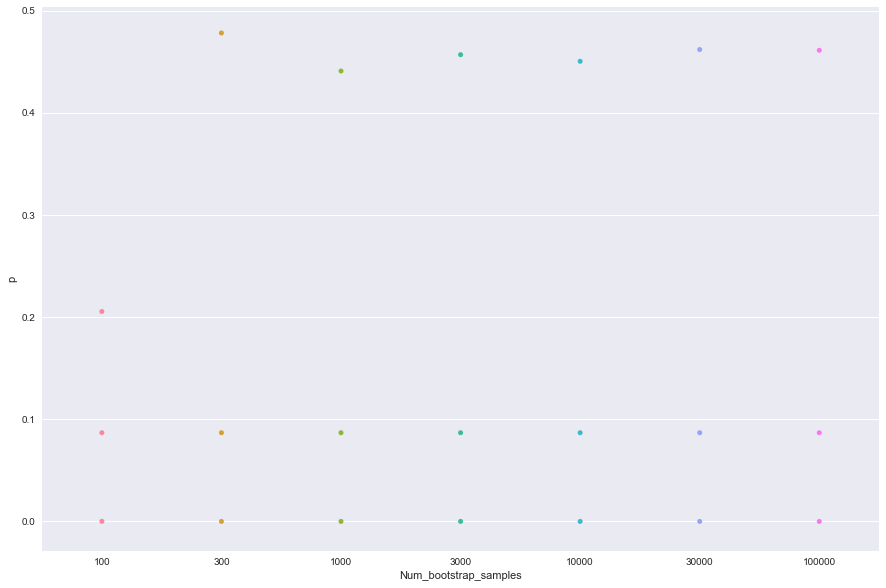

R


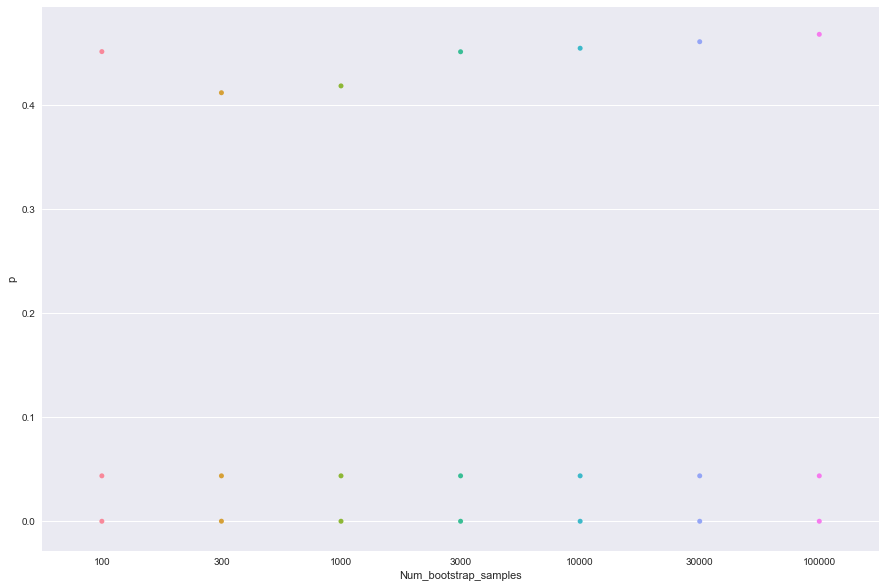

N


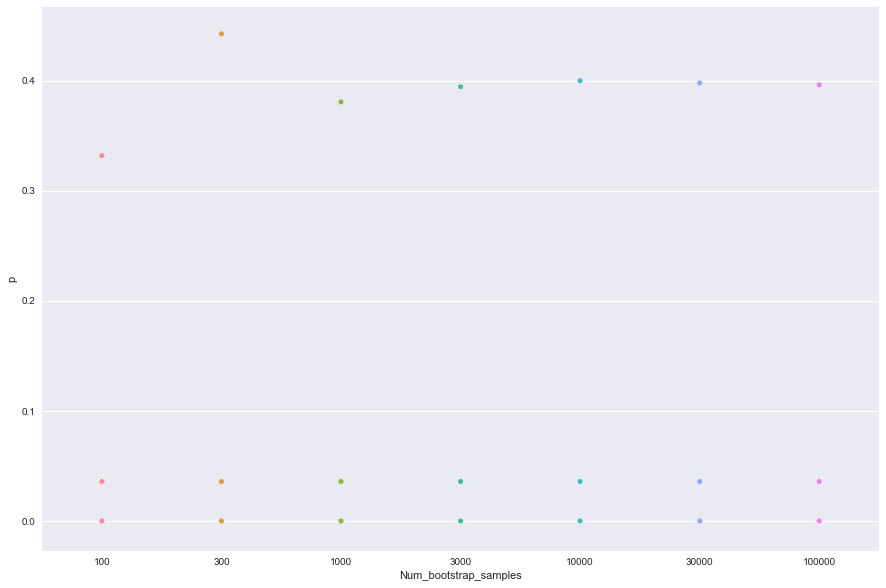

D


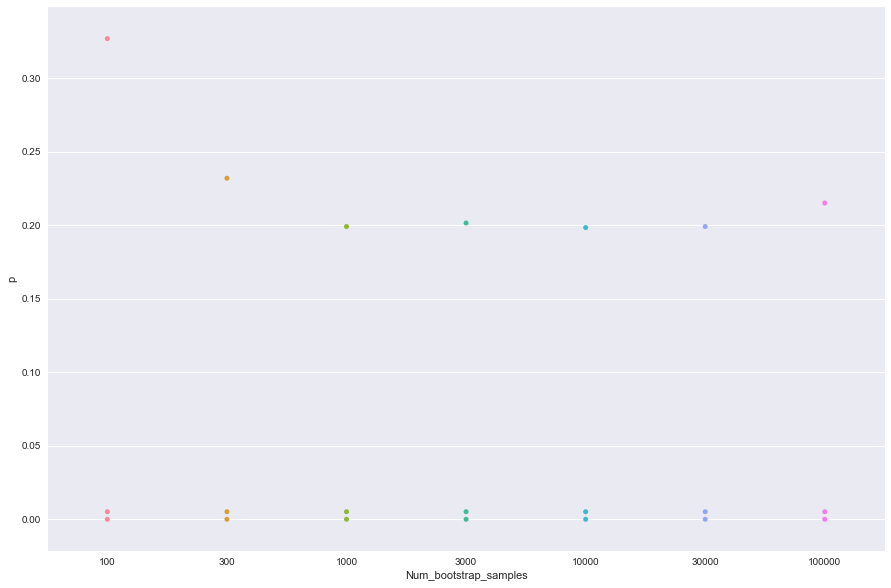

Q


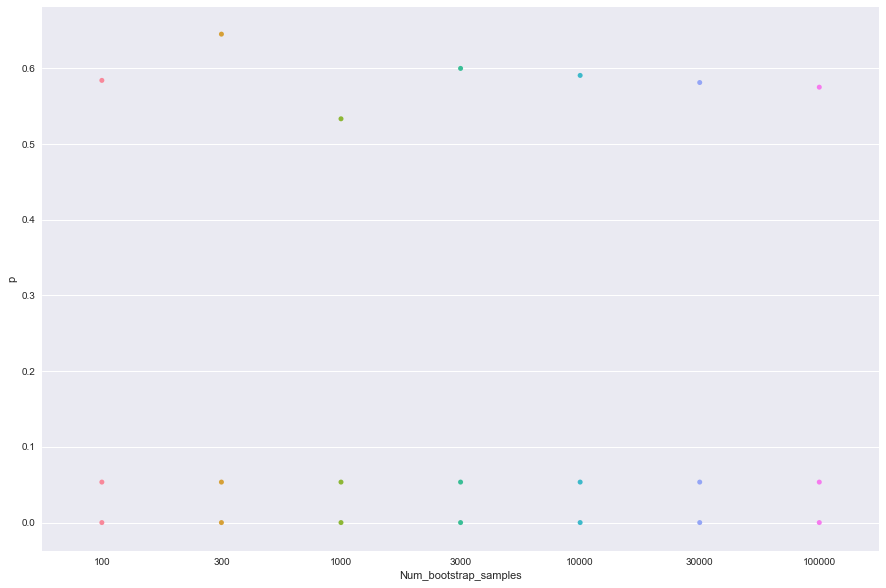

E


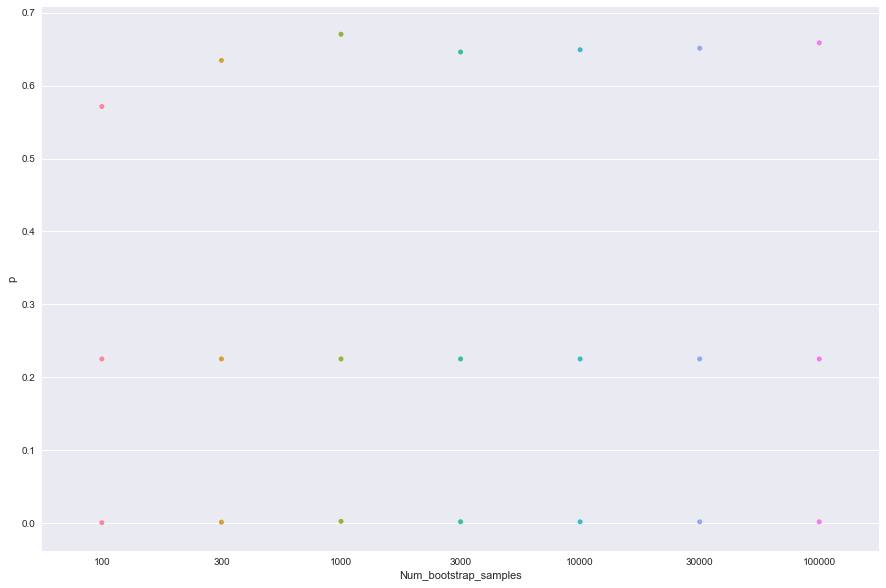

G


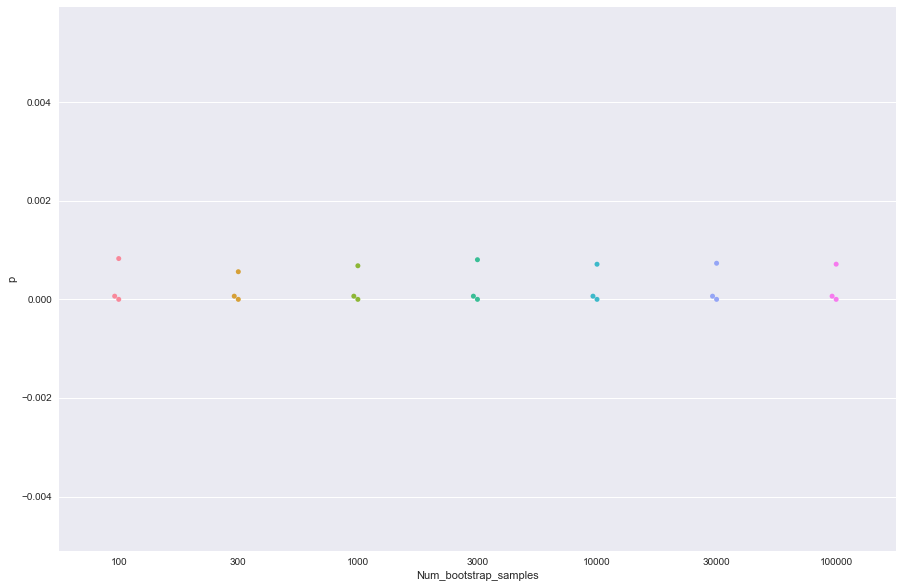

H


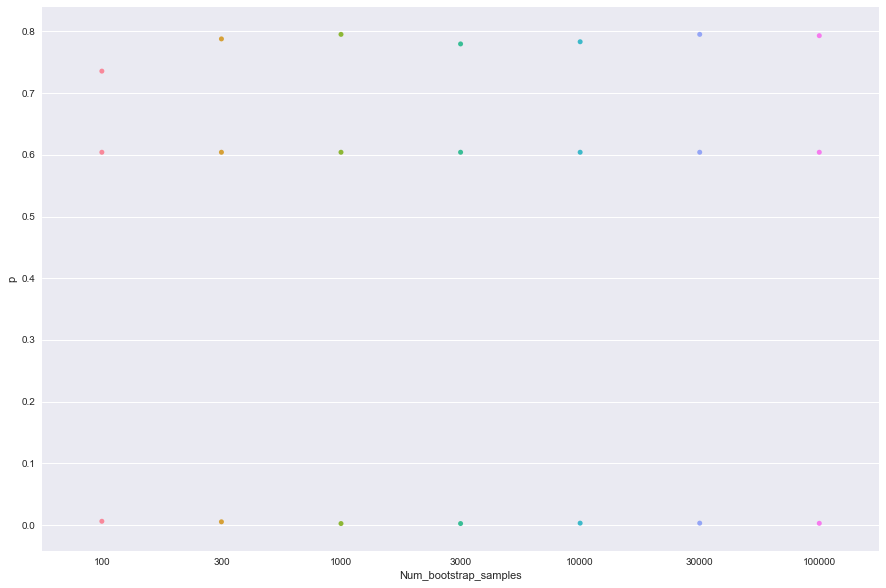

I


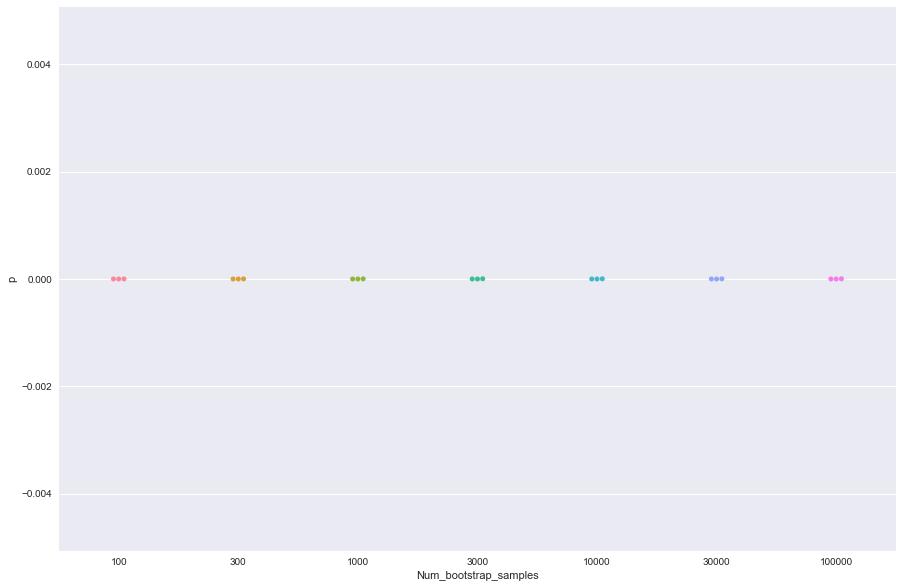

L


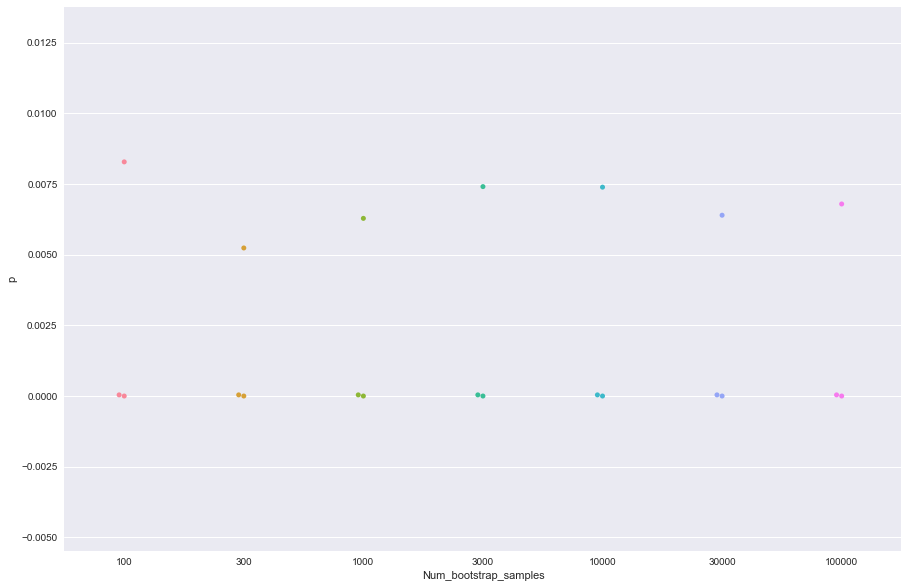

K


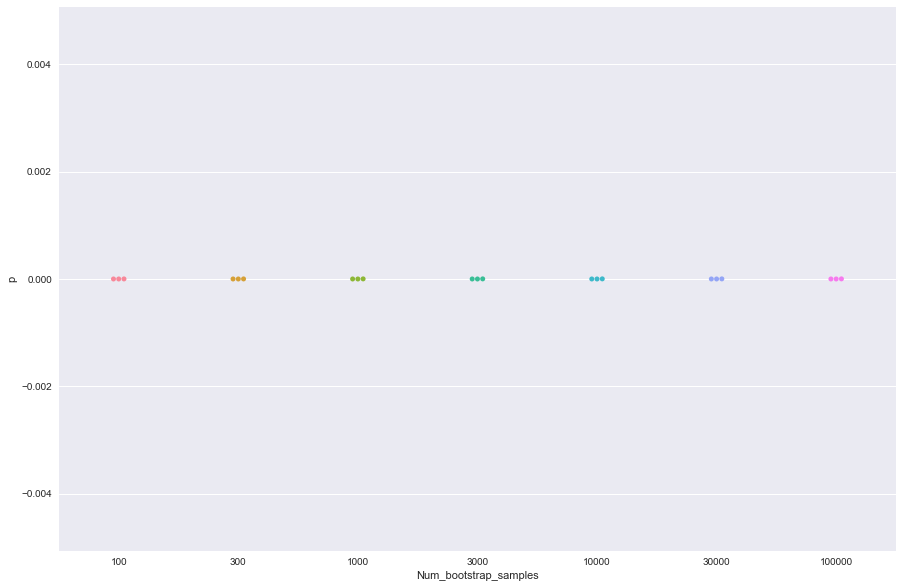

M


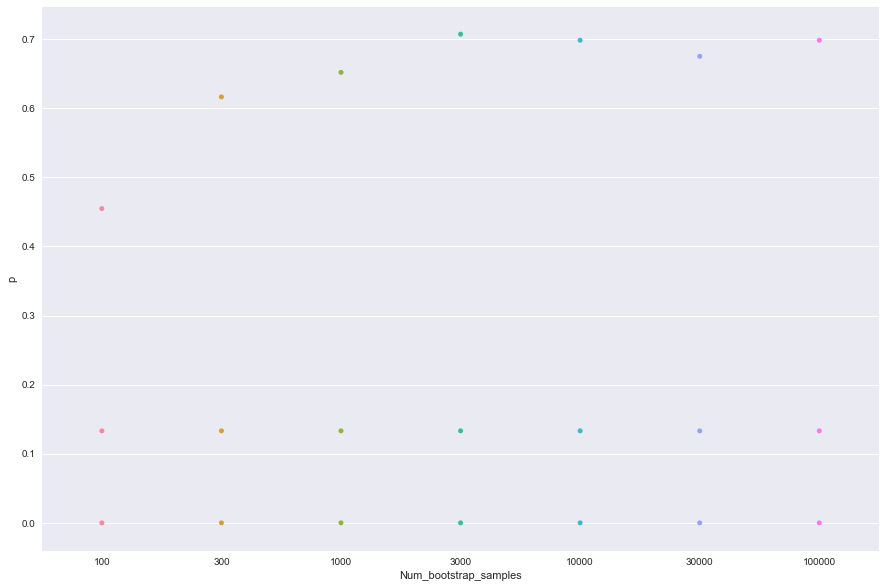

F


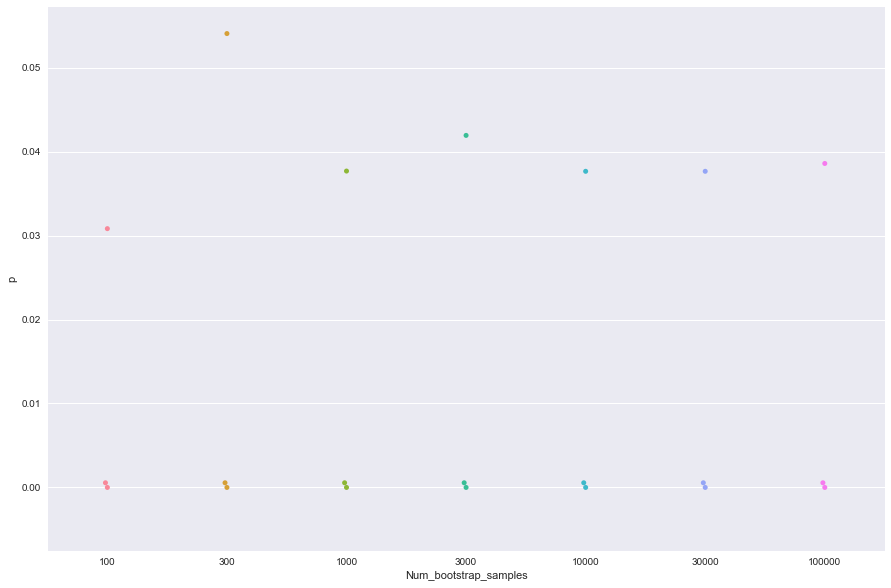

P


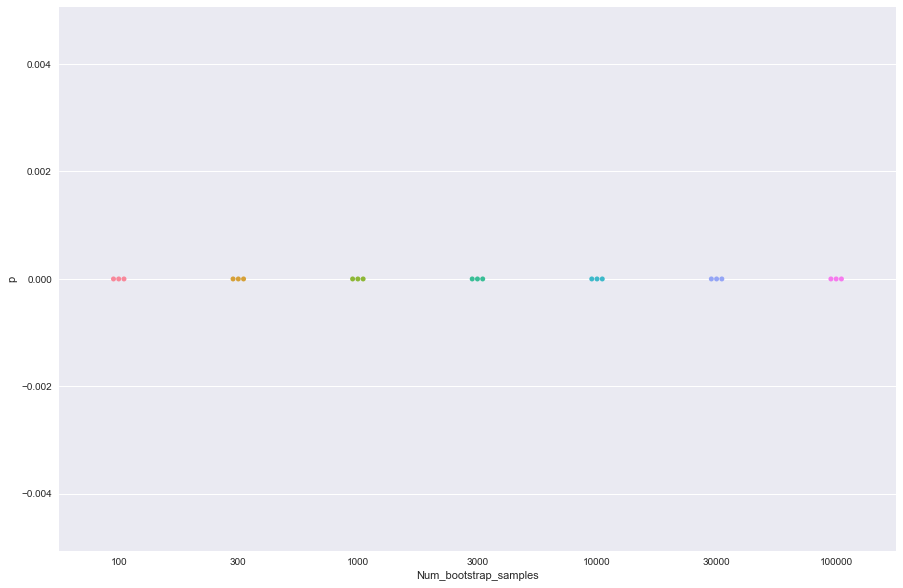

S


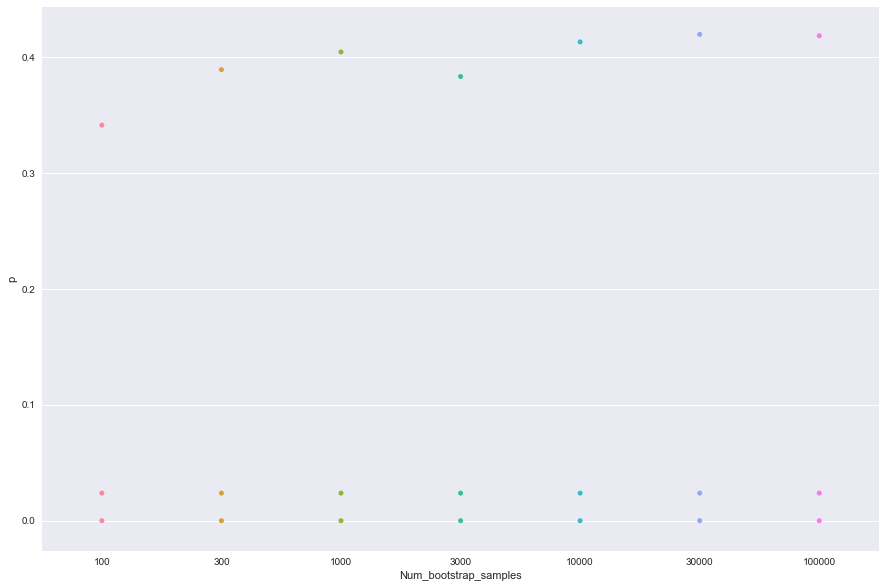

T


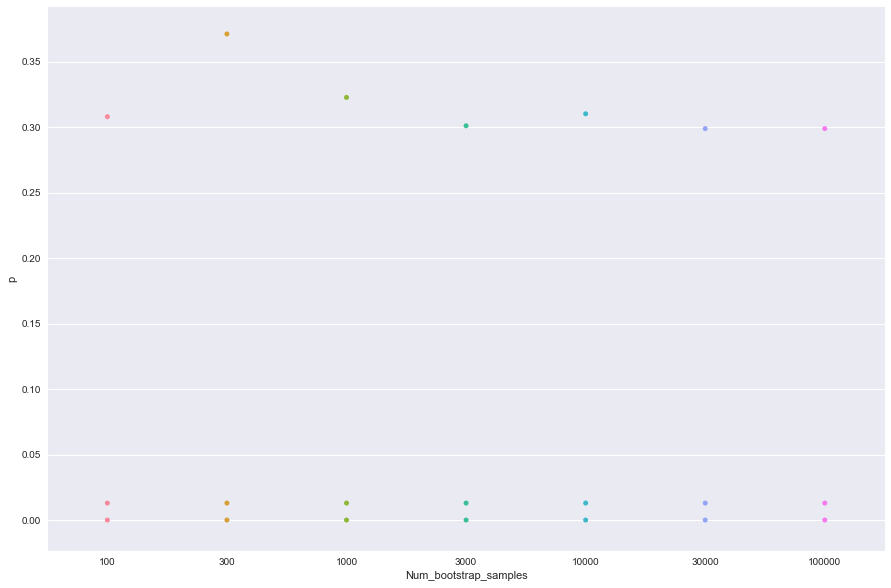

W


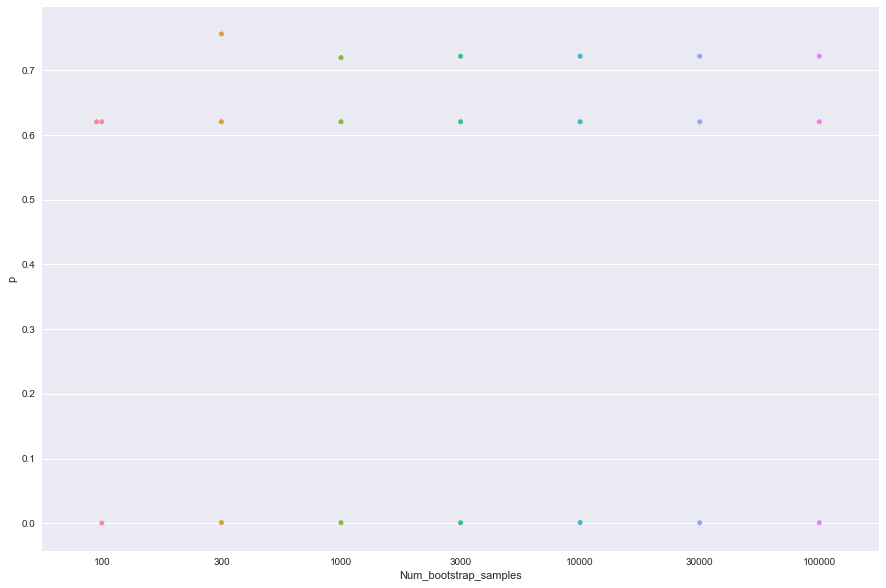

Y


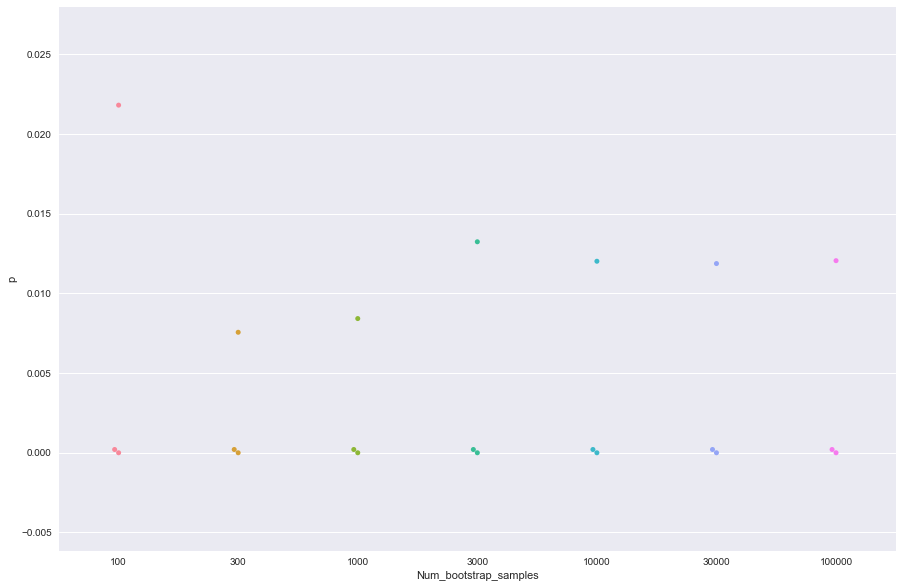

V


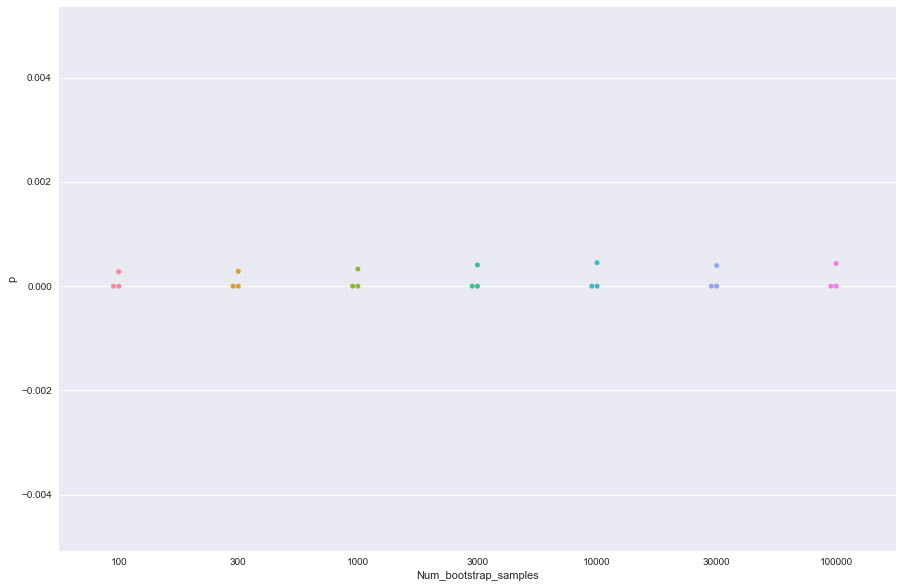

In [378]:
iterate_bootstrap_conf_limits(
    int_barrel_df, 'z_coords', run_ks_2samp_test, [100, 300, 1000, 3000, 10000, 30000, 100000], aa_dict_no_cys
)

Are the differences I observe between individual amino acid and overall amino acid distributions significant?

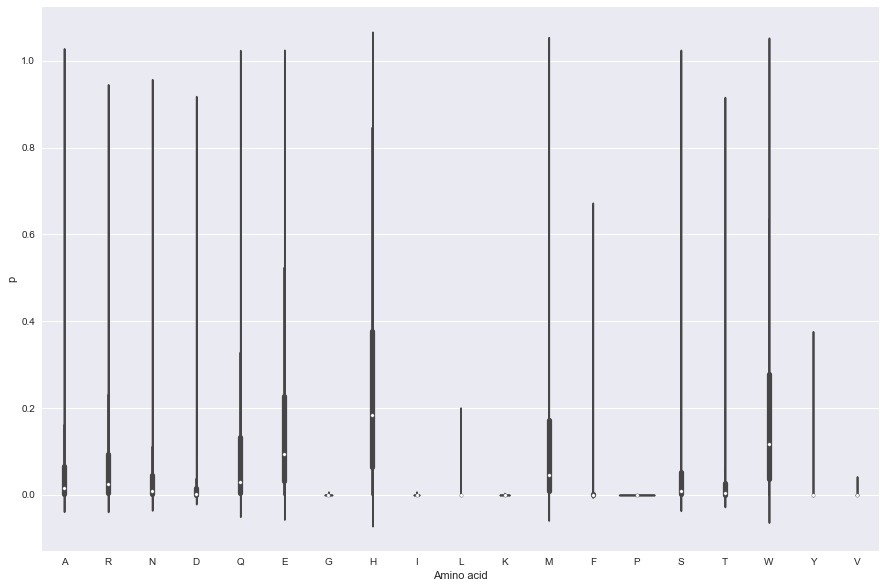

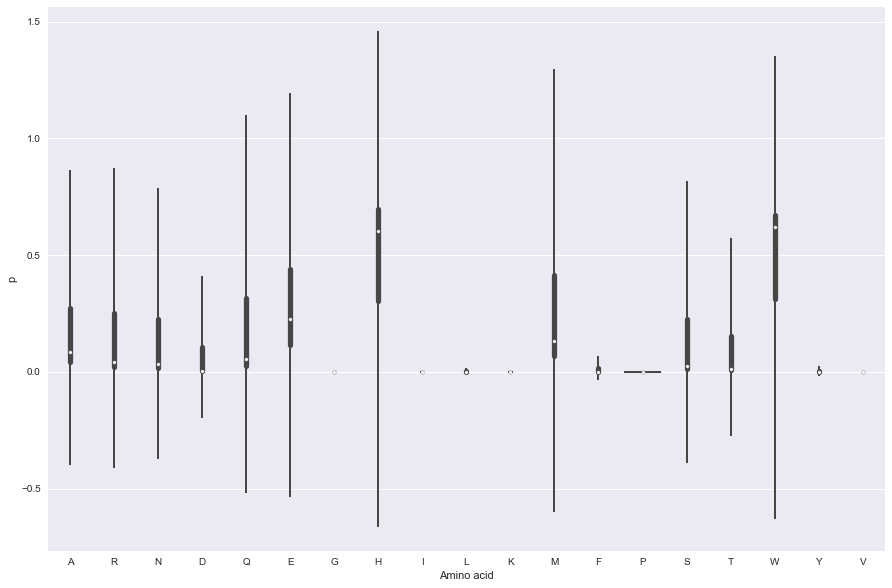

In [383]:
initial_D_dict_int, initial_p_dict_int = initial_ks_test(int_barrel_df, 'z_coords', run_ks_2samp_test, aa_dict_no_cys)

D_dict_bootstrap_int, p_dict_bootstrap_int = bootstrap_ks_test(
    int_barrel_df, 'z_coords', 10000, run_ks_2samp_test, aa_dict_no_cys
)
draw_plot(sns.violinplot, p_dict_bootstrap_int, list(aa_dict_no_cys.keys()), 'Amino acid', 'p')

barrel_conf_intv_p_dict_int = calc_95_conf_limits(initial_p_dict_int, p_dict_bootstrap_int)
draw_plot(sns.violinplot, barrel_conf_intv_p_dict_int, list(aa_dict_no_cys.keys()), 'Amino acid', 'p')

How many bootstrap samples should I use (exterior residues)?

100
300
1000
3000
10000
30000
100000
A


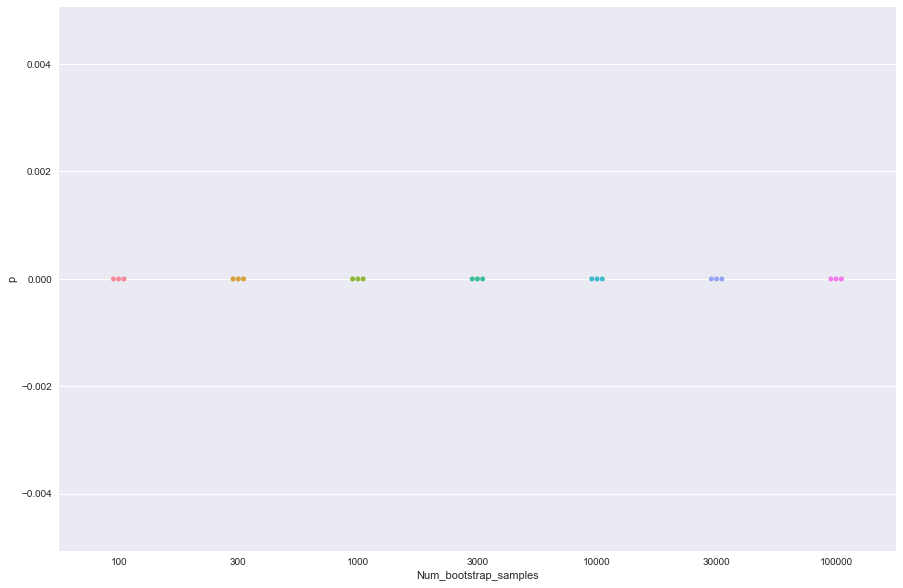

R


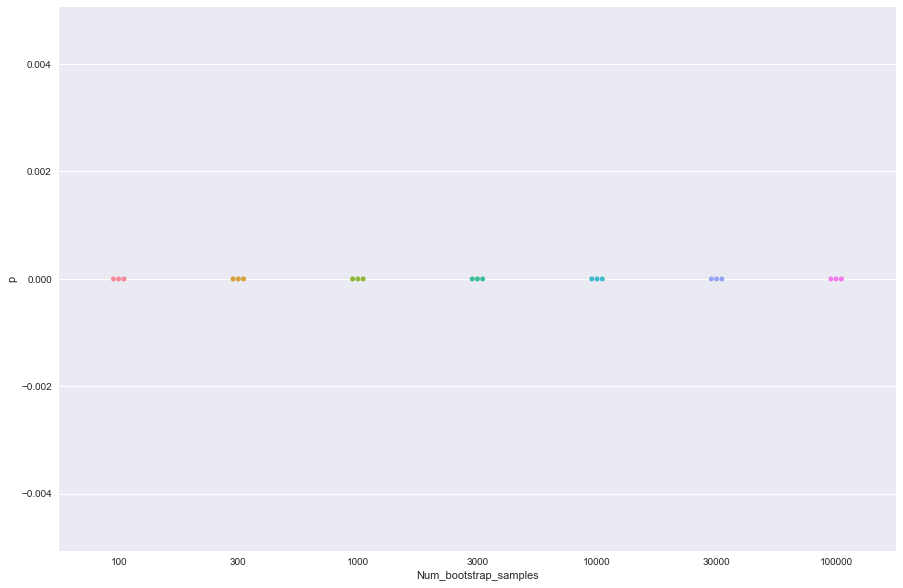

N


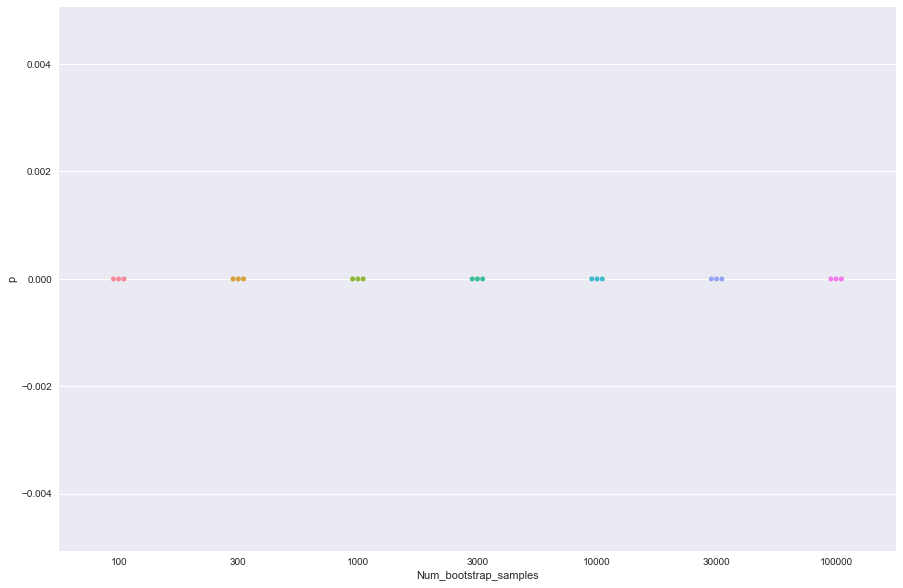

D


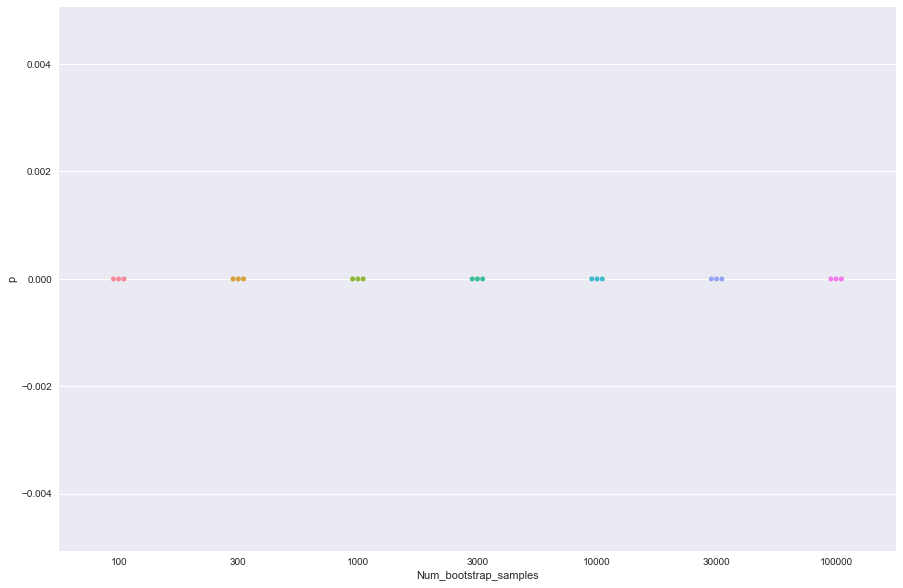

Q


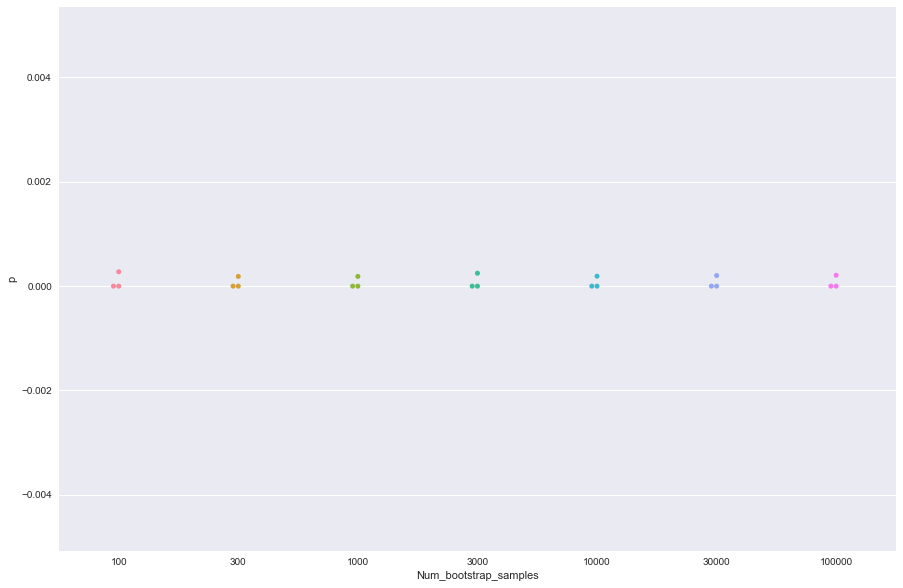

E


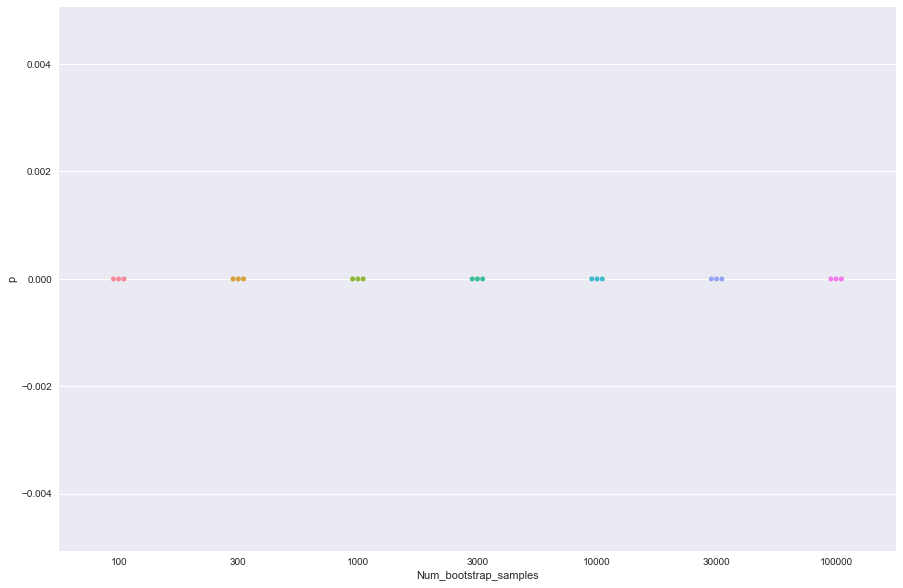

G


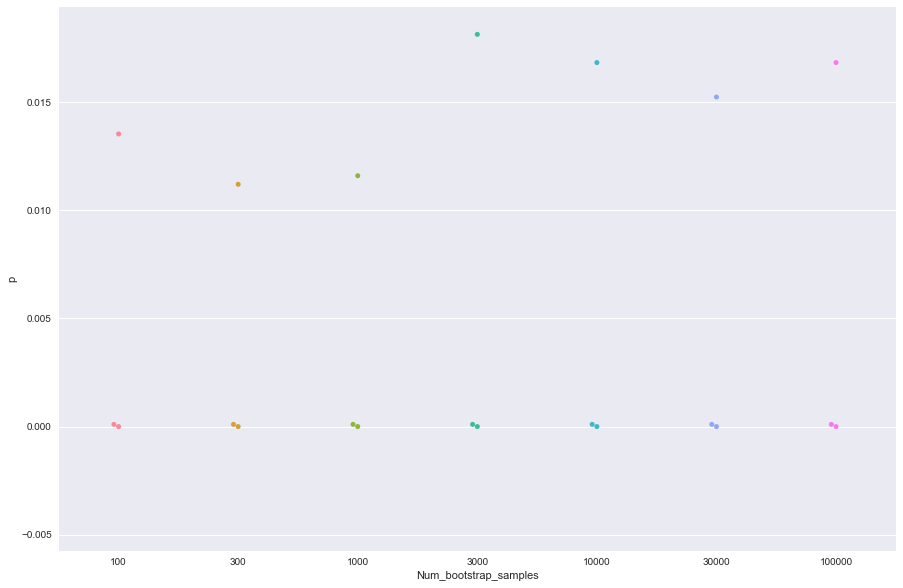

H


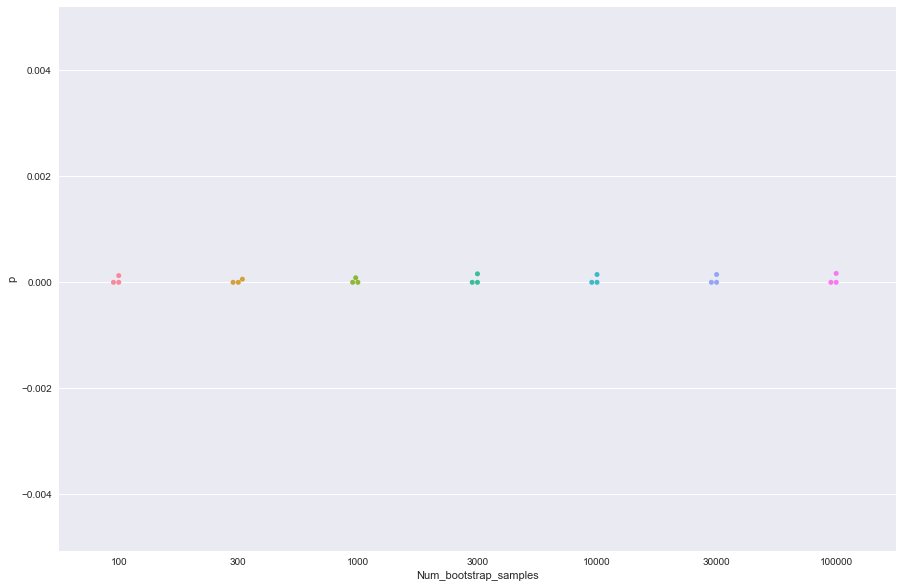

I


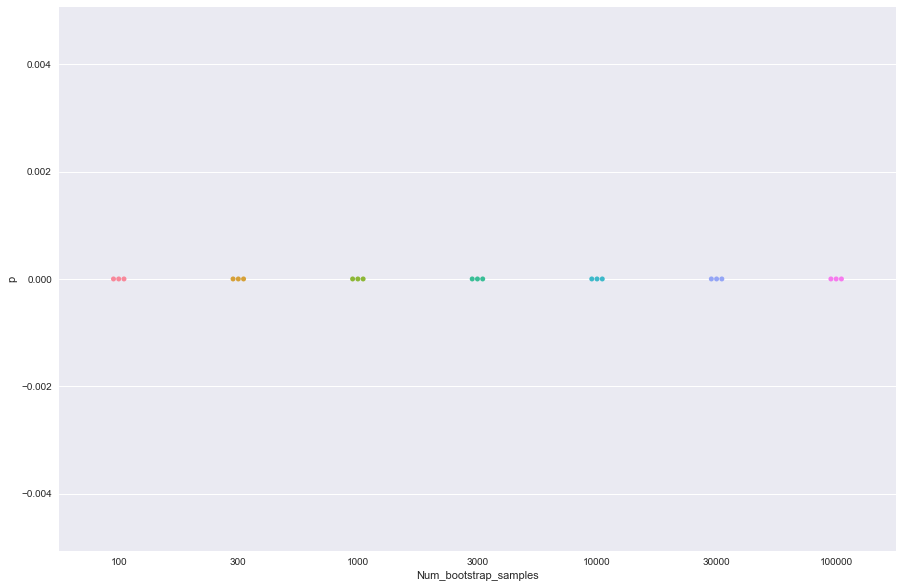

L


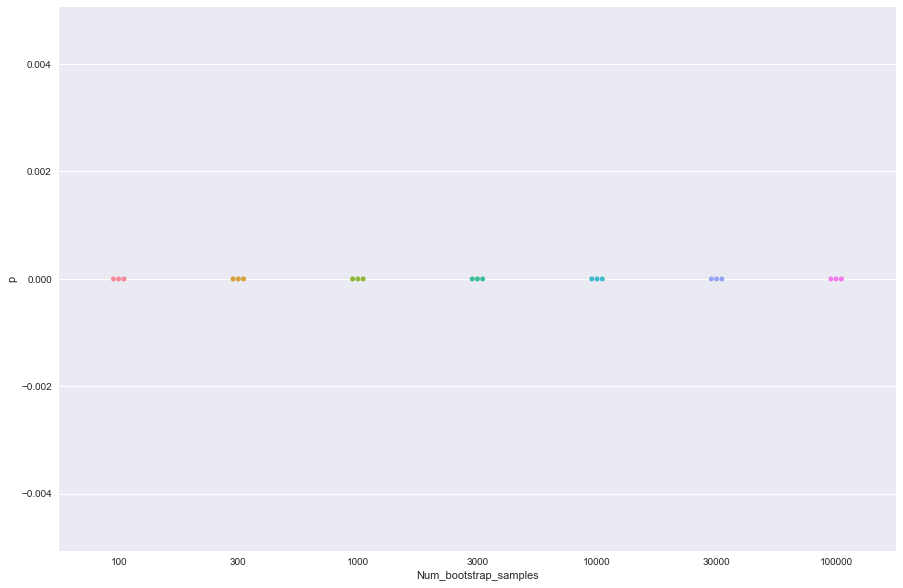

K


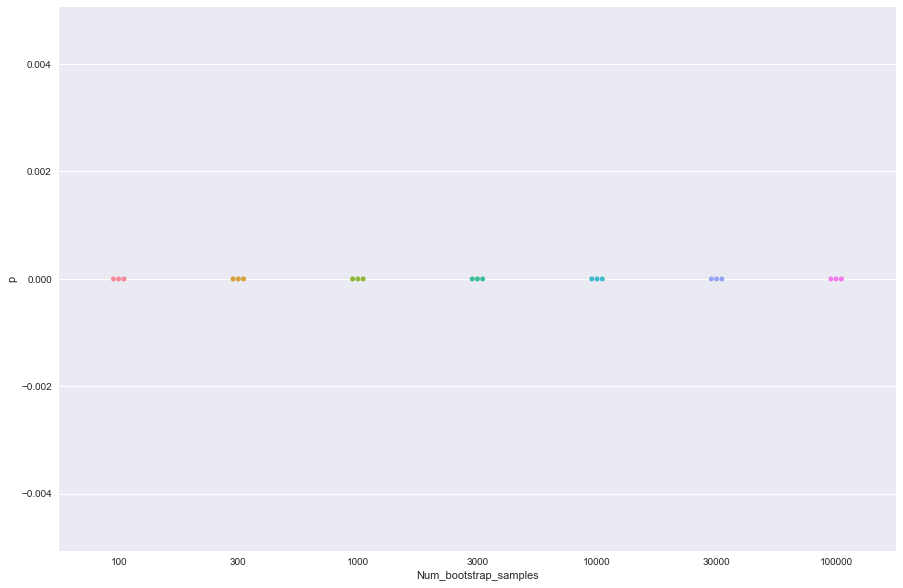

M


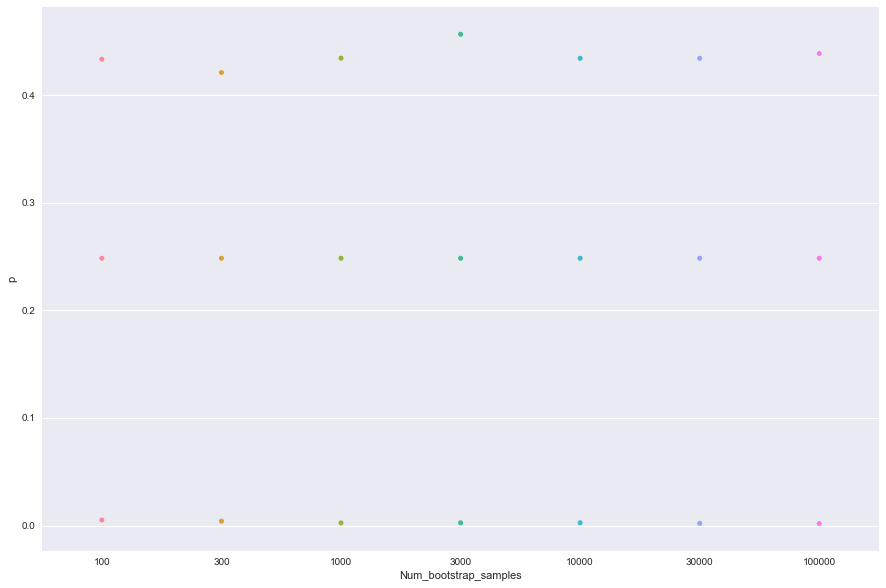

F


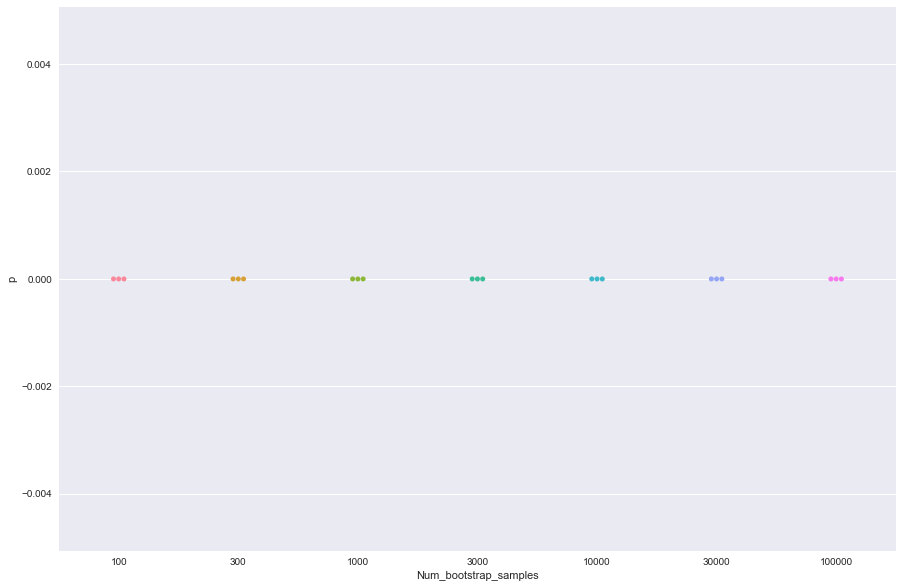

P


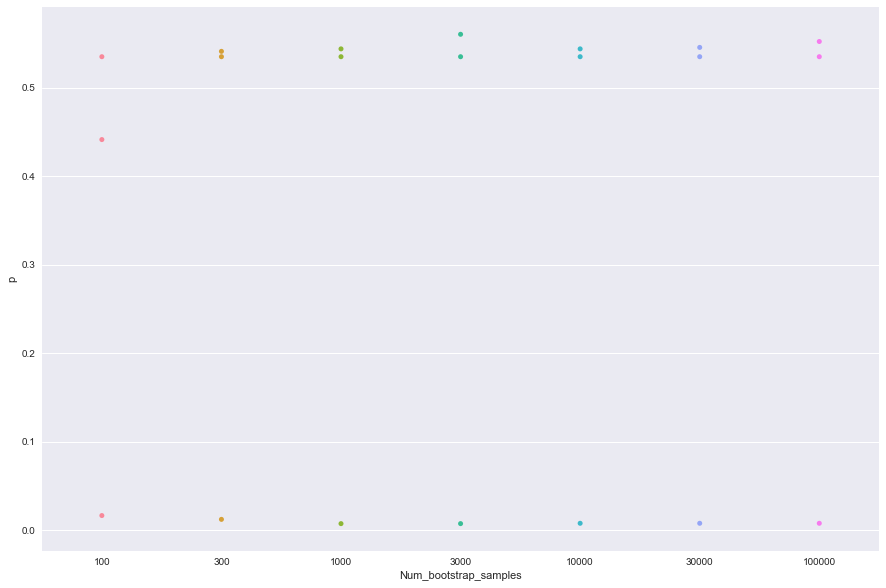

S


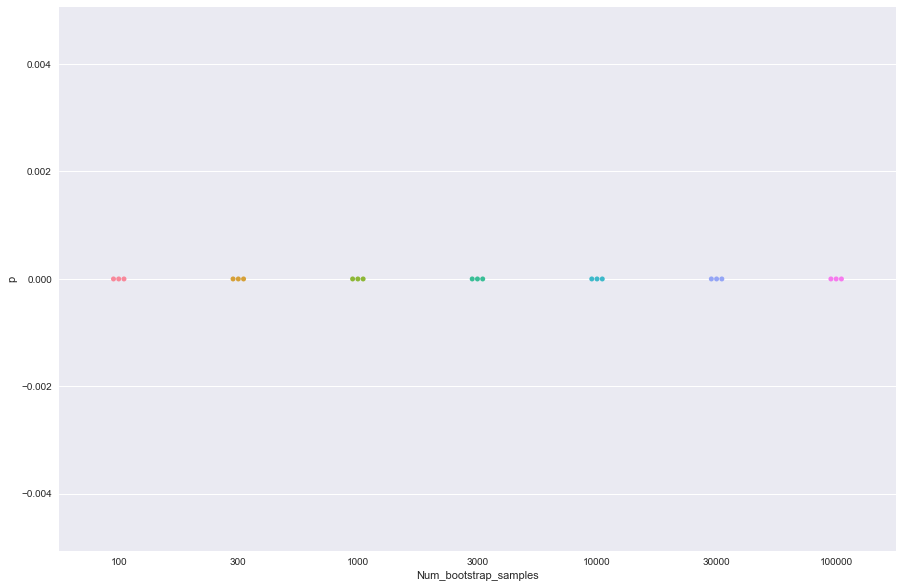

T


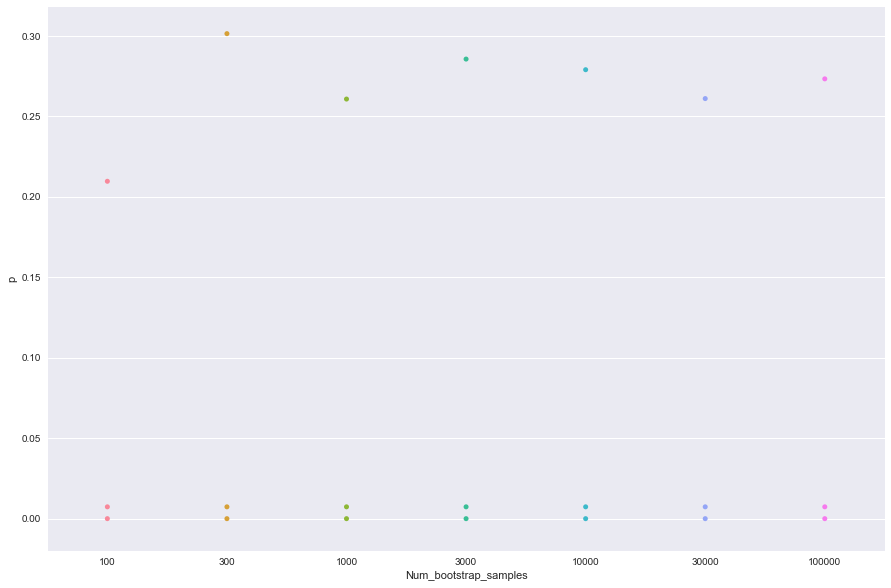

W


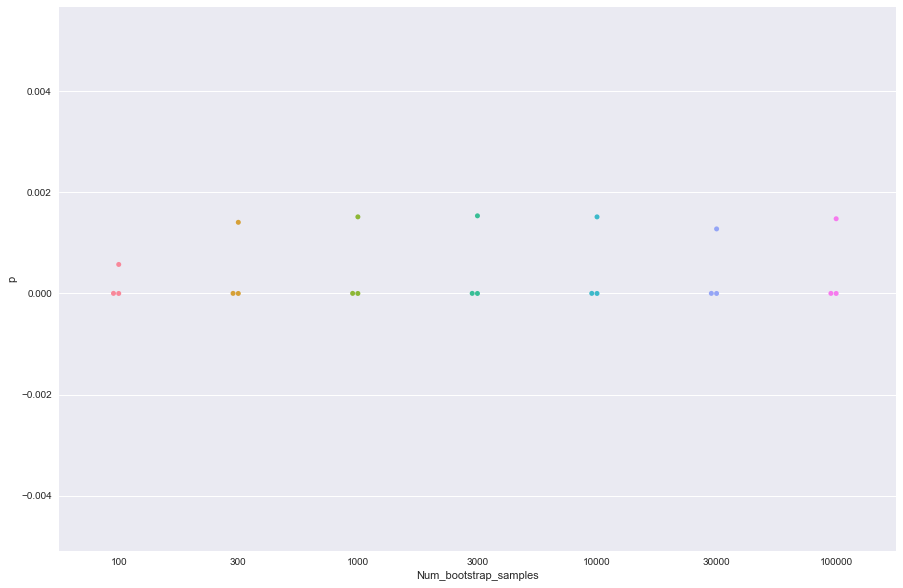

Y


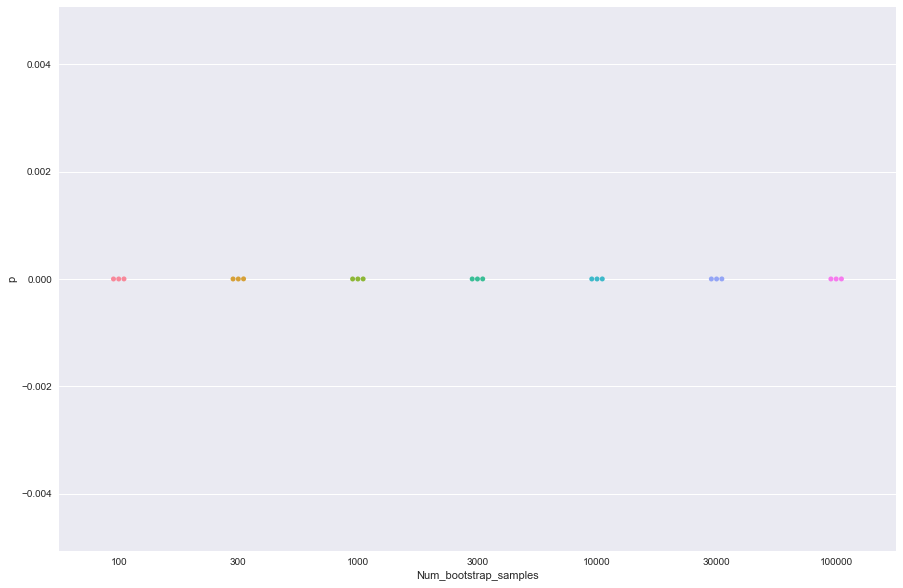

V


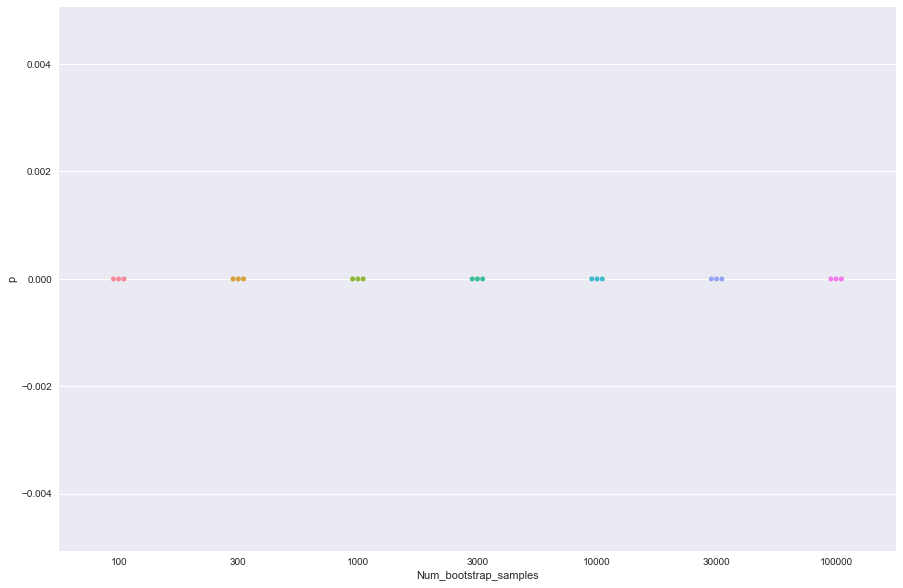

In [379]:
iterate_bootstrap_conf_limits(
    ext_barrel_df, 'z_coords', run_ks_2samp_test, [100, 300, 1000, 3000, 10000, 30000, 100000], aa_dict_no_cys
)

Are the differences I observe between individual amino acid and overall amino acid distributions significant?

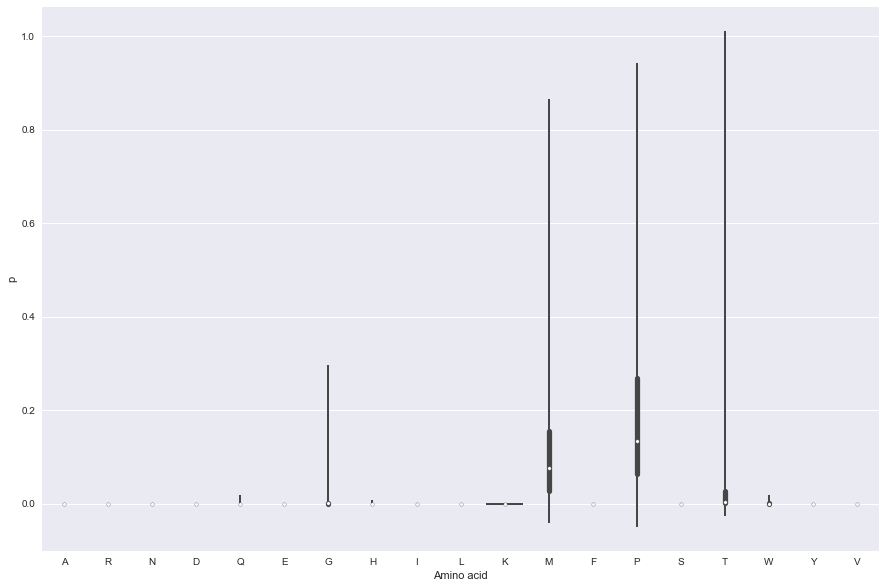

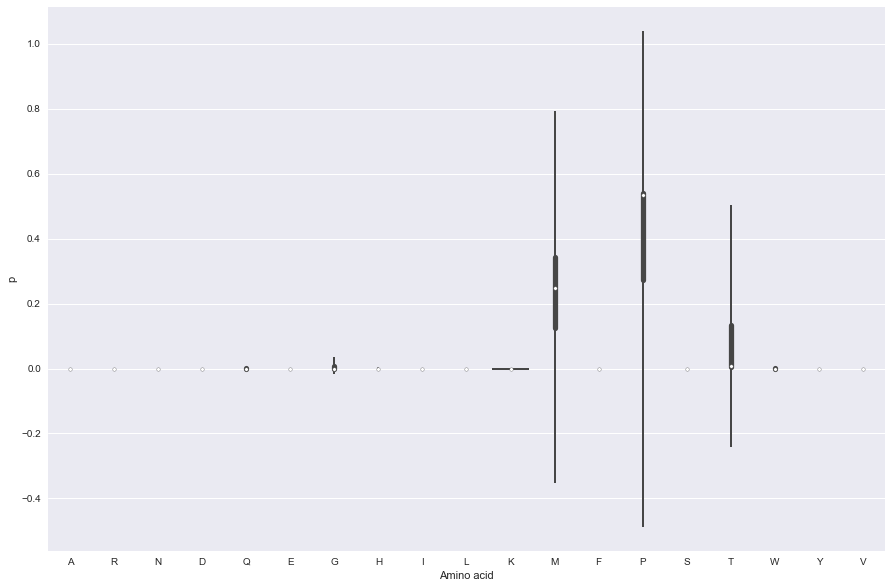

In [384]:
initial_D_dict_ext, initial_p_dict_ext = initial_ks_test(ext_barrel_df, 'z_coords', run_ks_2samp_test, aa_dict_no_cys)

D_dict_bootstrap_ext, p_dict_bootstrap_ext = bootstrap_ks_test(
    ext_barrel_df, 'z_coords', 10000, run_ks_2samp_test, aa_dict_no_cys
)
draw_plot(sns.violinplot, p_dict_bootstrap_ext, list(aa_dict_no_cys.keys()), 'Amino acid', 'p')

barrel_conf_intv_p_dict_ext = calc_95_conf_limits(initial_p_dict_ext, p_dict_bootstrap_ext)
draw_plot(sns.violinplot, barrel_conf_intv_p_dict_ext, list(aa_dict_no_cys.keys()), 'Amino acid', 'p')

### Z-coordinate interaction type KDEs

van_der_waals


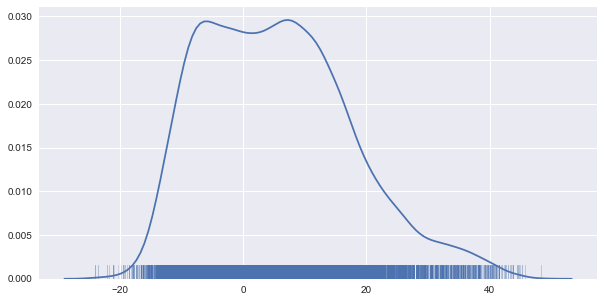

h_bonds


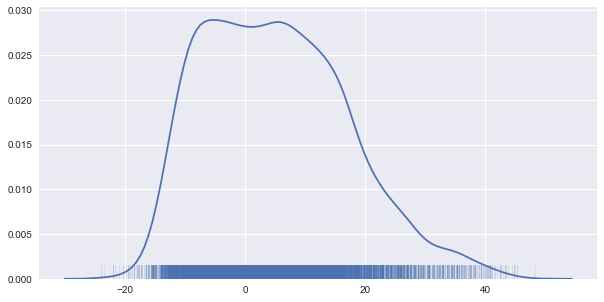

ionic


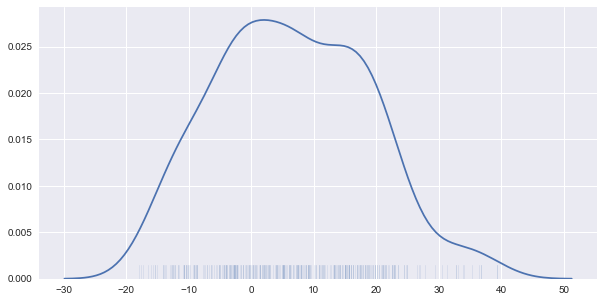

ss_bonds


/Users/ks17361/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:195: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/Users/ks17361/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


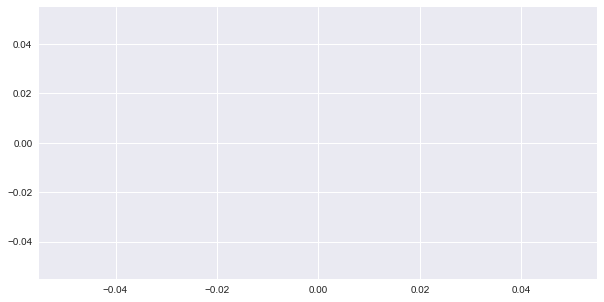

pi_pi_stacking


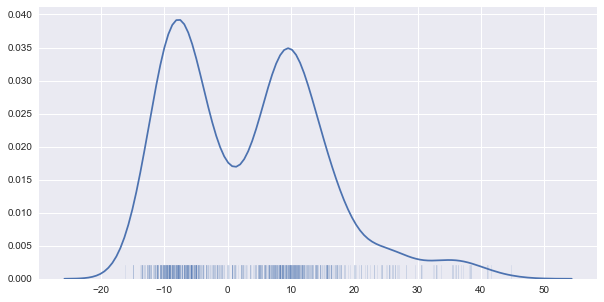

pi_pi_stacking_p


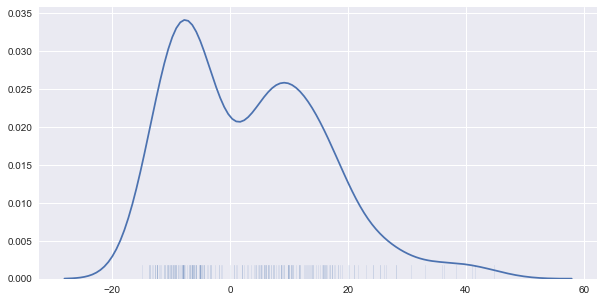

pi_pi_stacking_l


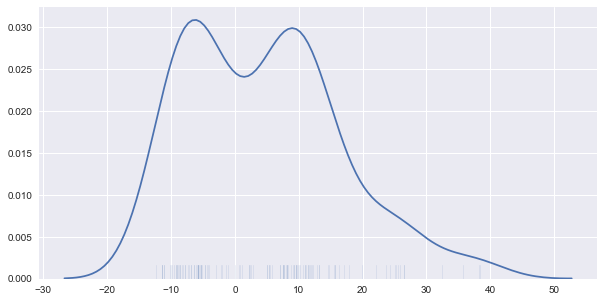

pi_pi_stacking_n


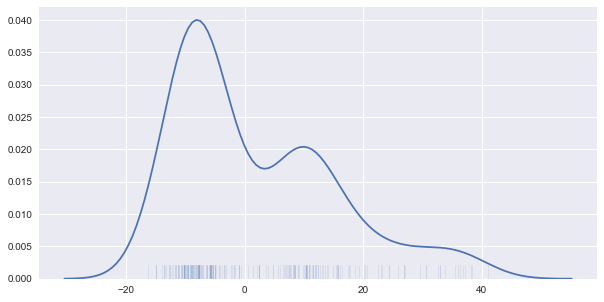

pi_pi_stacking_t


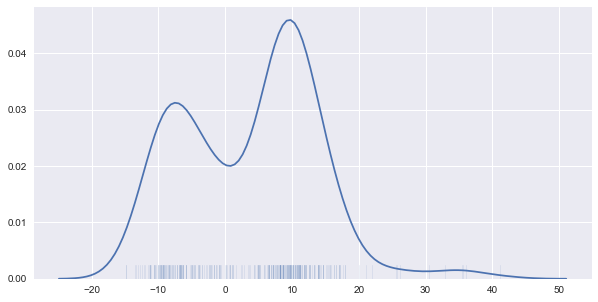

cation_pi


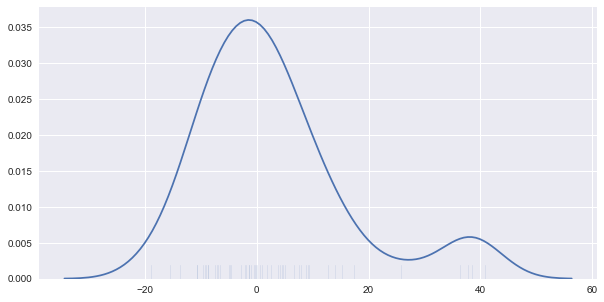

In [69]:
plot_discrete_prop_frequency_kdes(
    barrel_df, 'z_coords', ['van_der_waals', 'h_bonds', 'ionic', 'ss_bonds', 'pi_pi_stacking', 'pi_pi_stacking_p',
                            'pi_pi_stacking_l', 'pi_pi_stacking_n', 'pi_pi_stacking_t', 'cation_pi']
)

van_der_waals


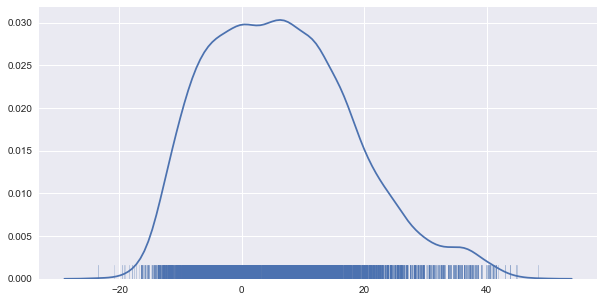

h_bonds


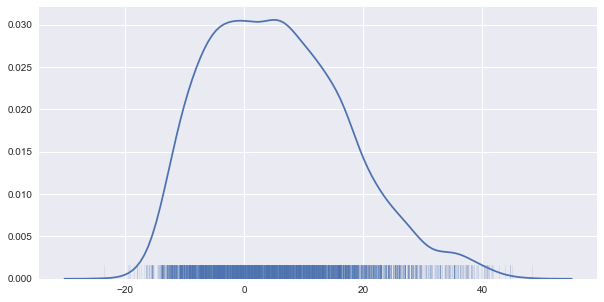

ionic


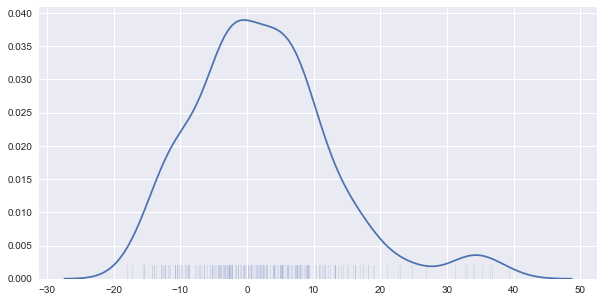

ss_bonds


/Users/ks17361/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:195: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/Users/ks17361/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


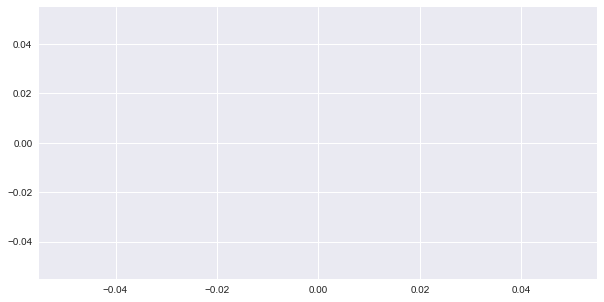

pi_pi_stacking


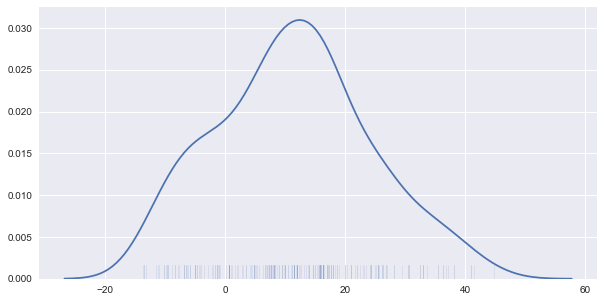

pi_pi_stacking_p


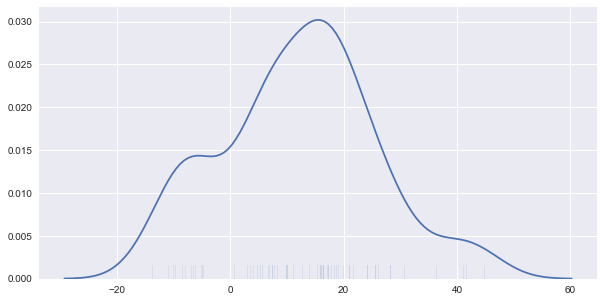

pi_pi_stacking_l


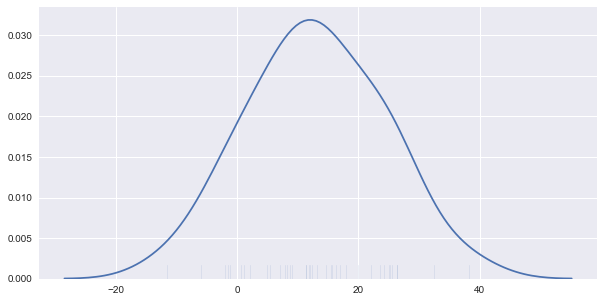

pi_pi_stacking_n


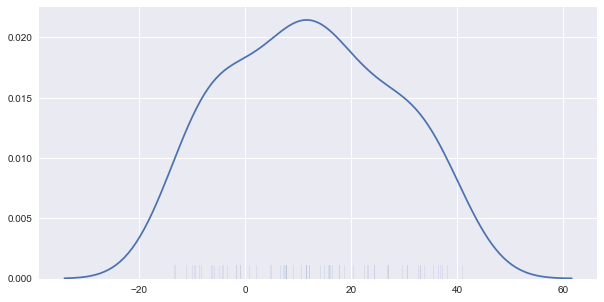

pi_pi_stacking_t


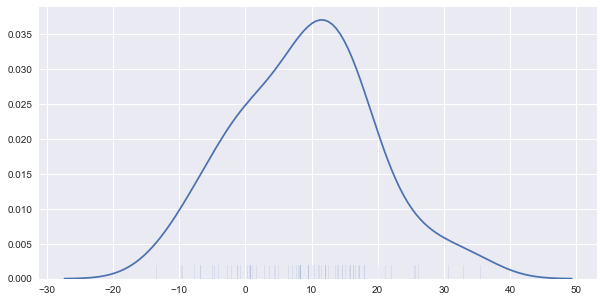

cation_pi


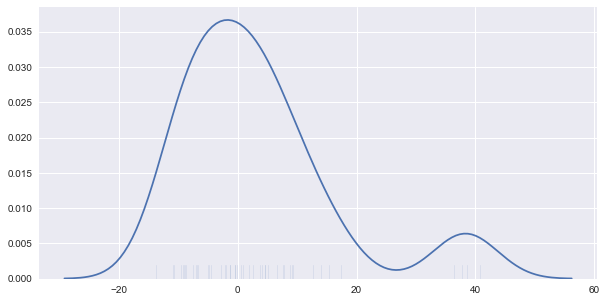

In [70]:
plot_discrete_prop_frequency_kdes(
    int_barrel_df, 'z_coords', ['van_der_waals', 'h_bonds', 'ionic', 'ss_bonds', 'pi_pi_stacking', 'pi_pi_stacking_p',
                                'pi_pi_stacking_l', 'pi_pi_stacking_n', 'pi_pi_stacking_t', 'cation_pi']
)

van_der_waals


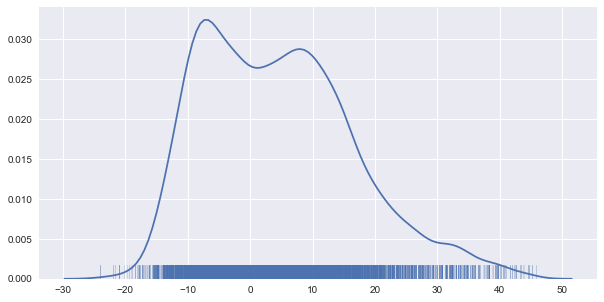

h_bonds


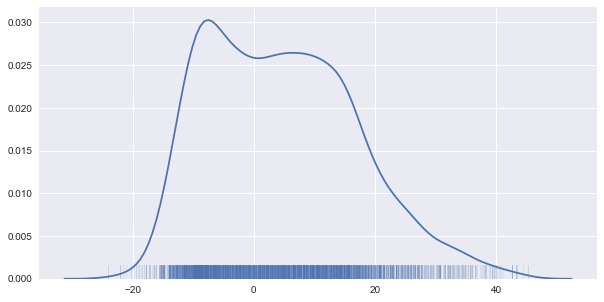

ionic


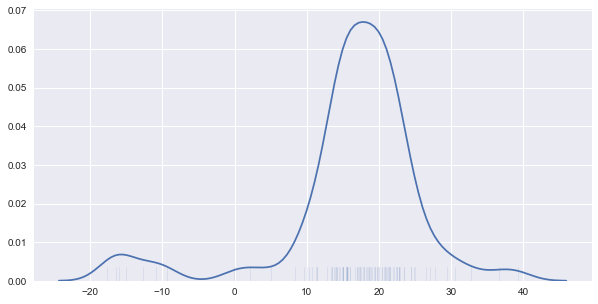

ss_bonds


/Users/ks17361/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:195: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/Users/ks17361/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


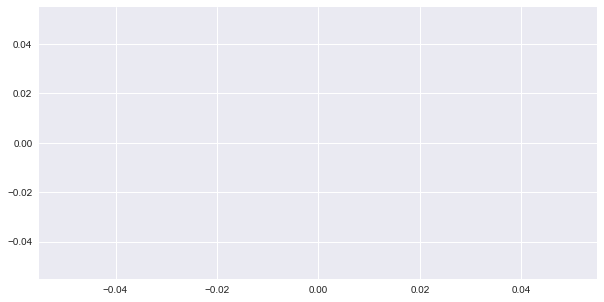

pi_pi_stacking


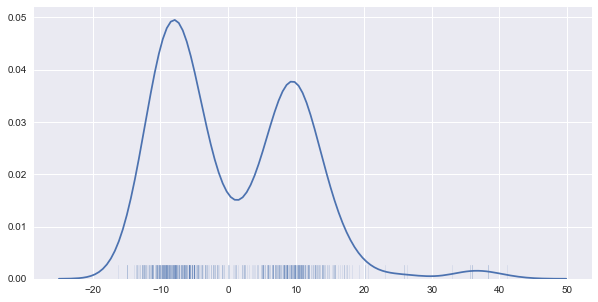

pi_pi_stacking_p


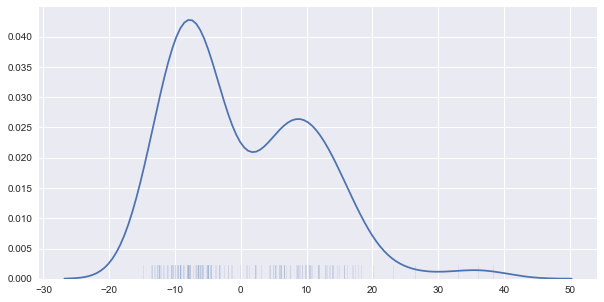

pi_pi_stacking_l


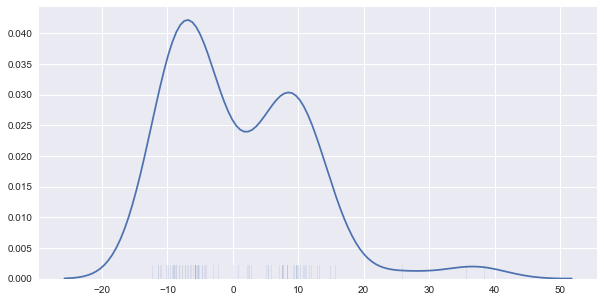

pi_pi_stacking_n


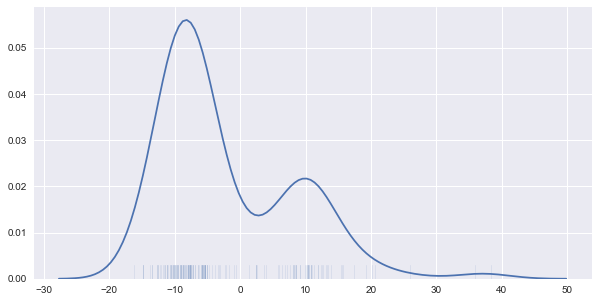

pi_pi_stacking_t


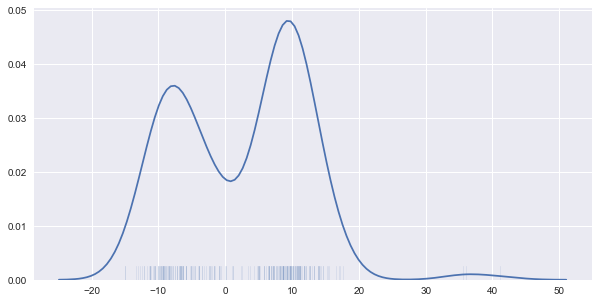

cation_pi


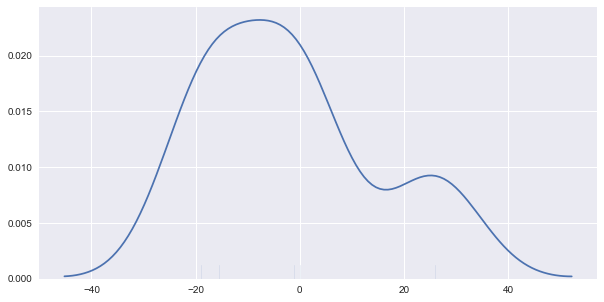

In [71]:
plot_discrete_prop_frequency_kdes(
    ext_barrel_df, 'z_coords', ['van_der_waals', 'h_bonds', 'ionic', 'ss_bonds', 'pi_pi_stacking', 'pi_pi_stacking_p',
                                'pi_pi_stacking_l', 'pi_pi_stacking_n', 'pi_pi_stacking_t', 'cation_pi']
)

### Residue mass KDEs

In [72]:
# Average residue mass (Burlingame and Carr, 1996)
mass_list = [71.0788, 156.1876, 114.1039, 115.0886, 103.1448, 128.1308, 129.1155, 57.0520, 137.1412, 113.1595,
             113.1595, 128.1742, 131.1986, 147.1766, 97.1167, 87.0782, 101.1051, 186.2133, 163.1760, 99.1326]
mass_dict = define_dict(mass_list)

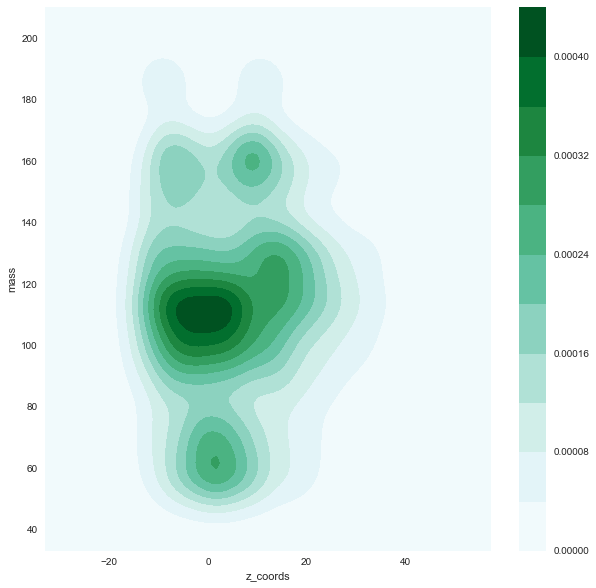

In [73]:
plot_prop_vs_prop(barrel_df, 'z_coords', mass_dict, 'mass', 3, 8)

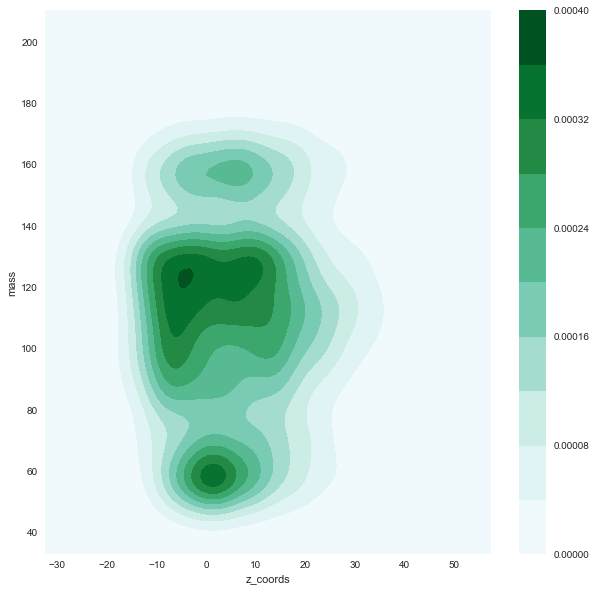

In [74]:
plot_prop_vs_prop(int_barrel_df, 'z_coords', mass_dict, 'mass', 3, 8)

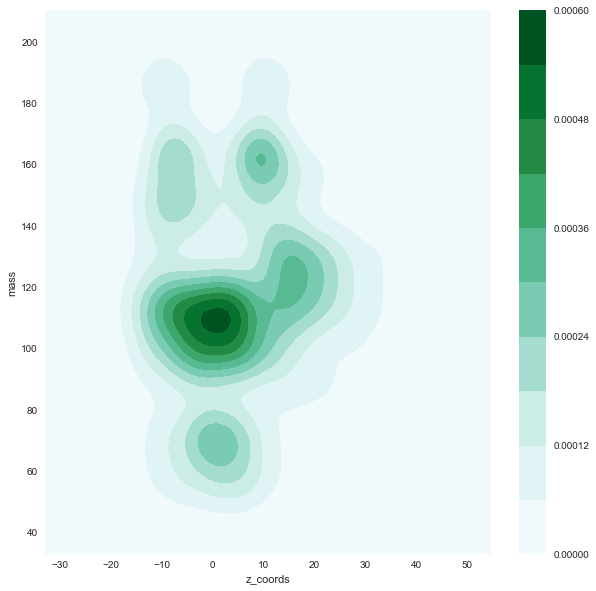

In [75]:
plot_prop_vs_prop(ext_barrel_df, 'z_coords', mass_dict, 'mass', 3, 8)

### Hydrophobicity KDEs

In [76]:
# Kyte and Doolittle scale
hydrophobicity_list = [1.8, -4.5, -3.5, -3.5, 2.5, -3.5, -3.5, -0.4, -3.2, 4.5, 3.8, -3.9, 1.9, 2.8, -1.6, -0.8,
                       -0.7, -0.9, -1.3, 4.2]
hydrophobicity_dict = define_dict(hydrophobicity_list)

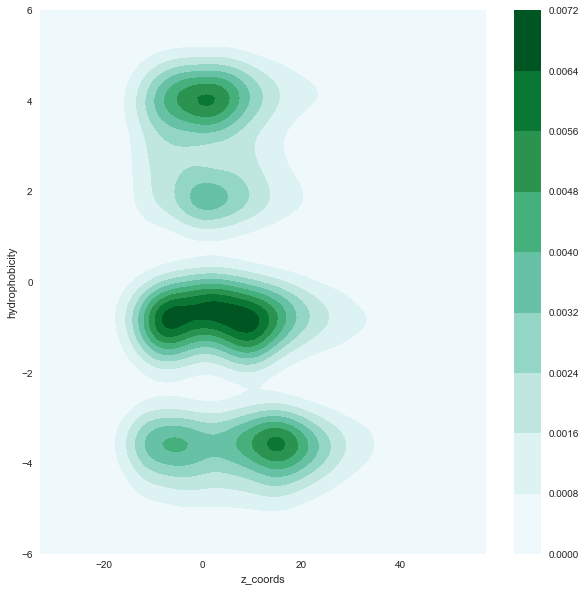

In [77]:
plot_prop_vs_prop(barrel_df, 'z_coords', hydrophobicity_dict, 'hydrophobicity', 3, 0.5)

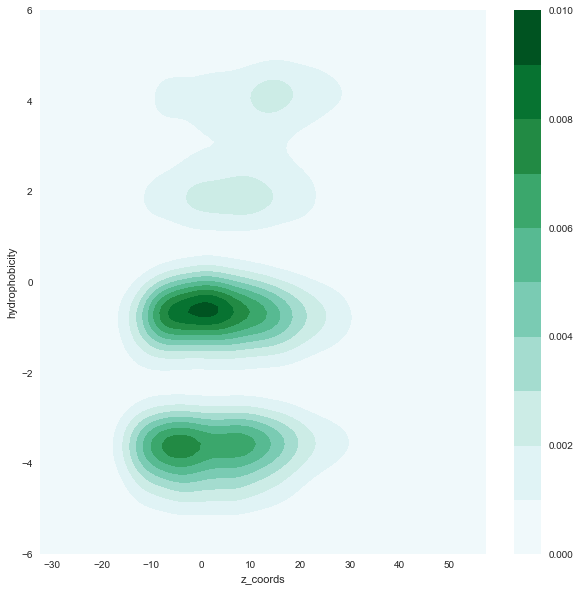

In [78]:
plot_prop_vs_prop(int_barrel_df, 'z_coords', hydrophobicity_dict, 'hydrophobicity', 3, 0.5)

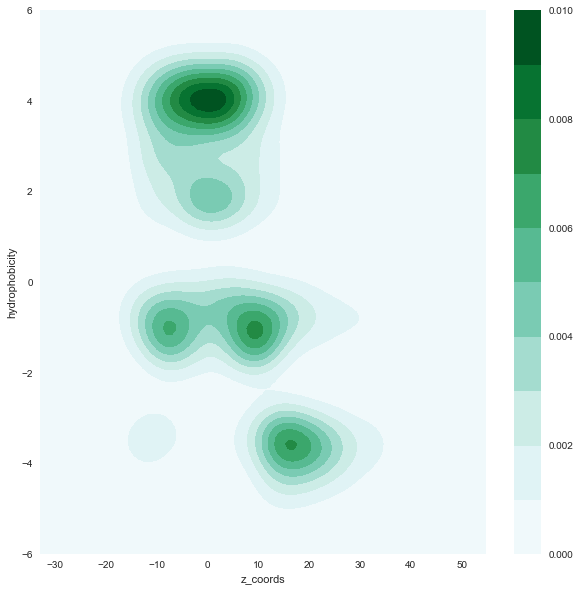

In [79]:
plot_prop_vs_prop(ext_barrel_df, 'z_coords', hydrophobicity_dict, 'hydrophobicity', 3, 0.5)

### Side chain volume KDEs

In [80]:
# Side chain volume (Krigbaum-Komoriya, 1979)
side_chain_volume_list = [27.5, 105.0, 58.7, 40.0, 44.6, 80.7, 62.0, 0.0, 79.0, 93.5, 93.5, 100.0, 94.1, 115.5, 41.9,
                          29.3, 51.3, 145.5, 117.3, 71.5]
side_chain_volume_dict = define_dict(side_chain_volume_list)

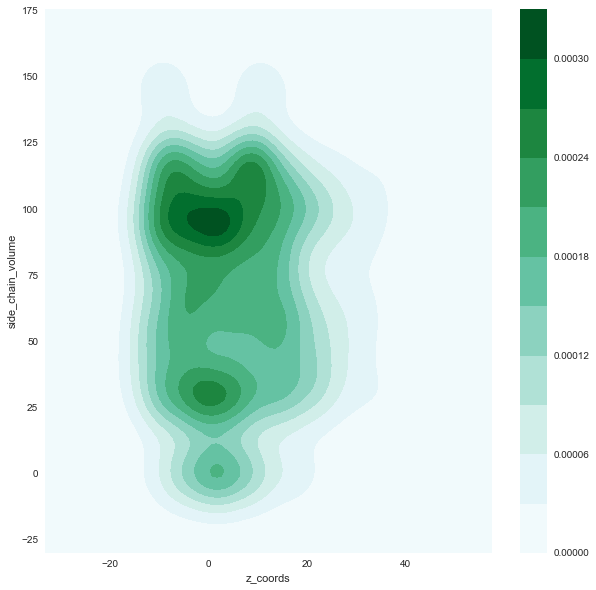

In [81]:
plot_prop_vs_prop(barrel_df, 'z_coords', side_chain_volume_dict, 'side_chain_volume', 3, 10)

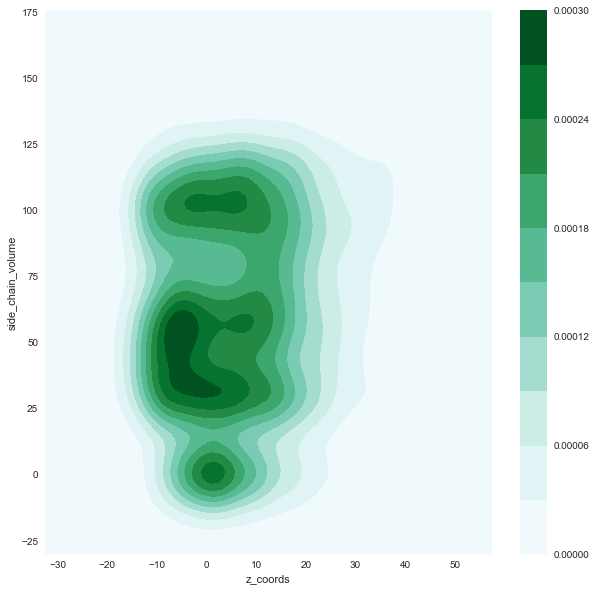

In [82]:
plot_prop_vs_prop(int_barrel_df, 'z_coords', side_chain_volume_dict, 'side_chain_volume', 3, 10)

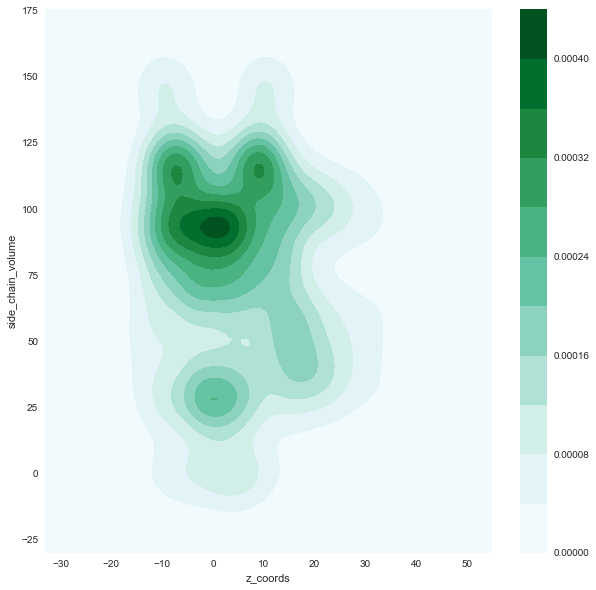

In [83]:
plot_prop_vs_prop(ext_barrel_df, 'z_coords', side_chain_volume_dict, 'side_chain_volume', 3, 10)

### Side chain solvent accessible surface area KDEs

In [84]:
# Side chain solvent accessible surface area (Miller et al, 1987)
side_chain_sasa_list = [67, 196, 113, 106, 104, 144, 138, 0, 151, 140, 137, 167, 160, 175, 105, 80, 102, 217, 187,
                        117]
sasa_dict = define_dict(side_chain_sasa_list)

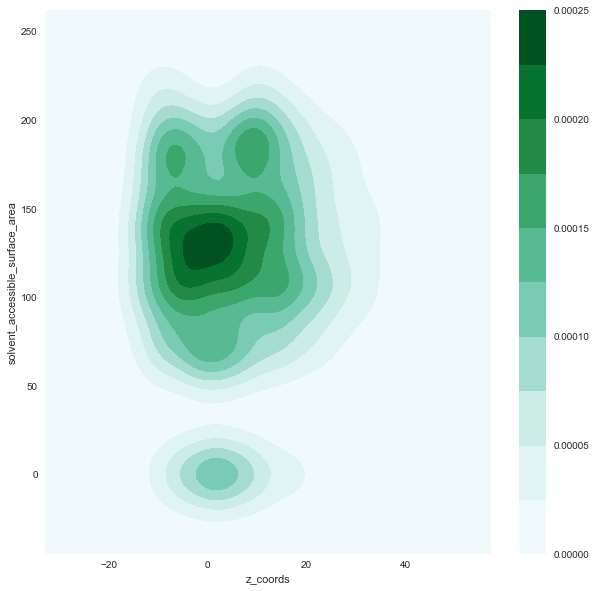

In [85]:
plot_prop_vs_prop(barrel_df, 'z_coords', sasa_dict, 'solvent_accessible_surface_area', 3, 15)

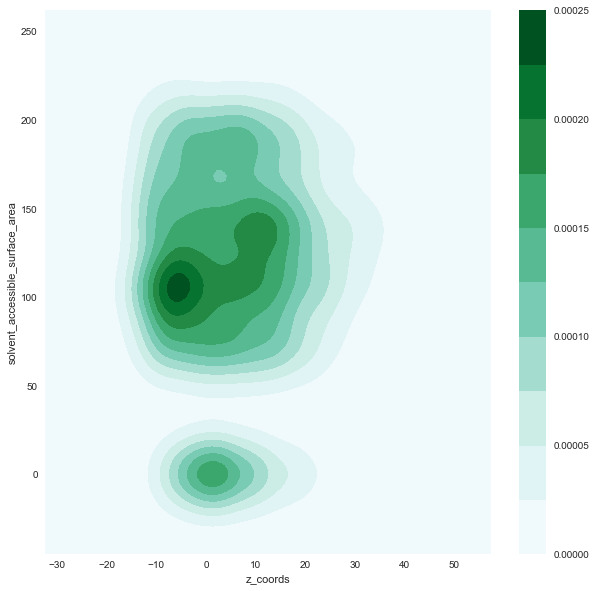

In [86]:
plot_prop_vs_prop(int_barrel_df, 'z_coords', sasa_dict, 'solvent_accessible_surface_area', 3, 15)

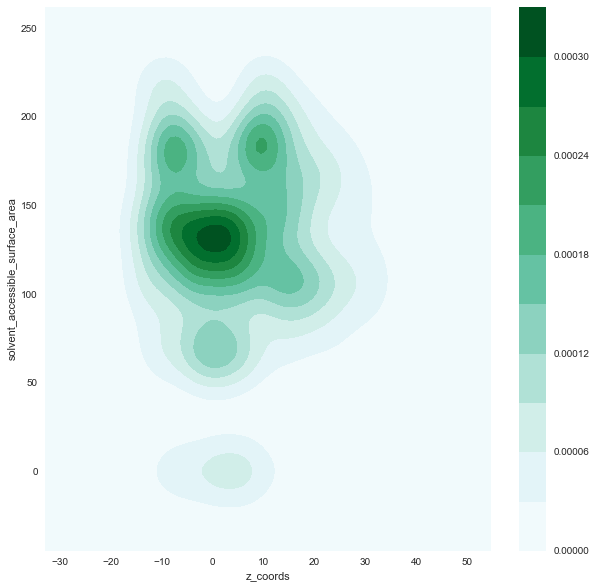

In [87]:
plot_prop_vs_prop(ext_barrel_df, 'z_coords', sasa_dict, 'solvent_accessible_surface_area', 3, 15)

### Charge KDEs

In [88]:
# From pKa values of Cantor and Schimmel (1980)
"""
pka_dict = {'A': '',
            'R': 12,
            'N': '',
            'D': 4.5,
            'C': 8.65,
            'Q': '',
            'E': 4.5,
            'G': '',
            'H': 6.75,
            'I': '',
            'L': '',
            'K': 10.1,
            'M': '',
            'F': '',
            'P': '',
            'S': '',
            'T': '',
            'W': '',
            'Y': 9.8,
            'V': ''}
"""

charge_at_ph_7_list = [0, 1, 0, -1, -0.02, 0, -1, 0, 0.36, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
charge_at_ph_7_dict = define_dict(charge_at_ph_7_list)

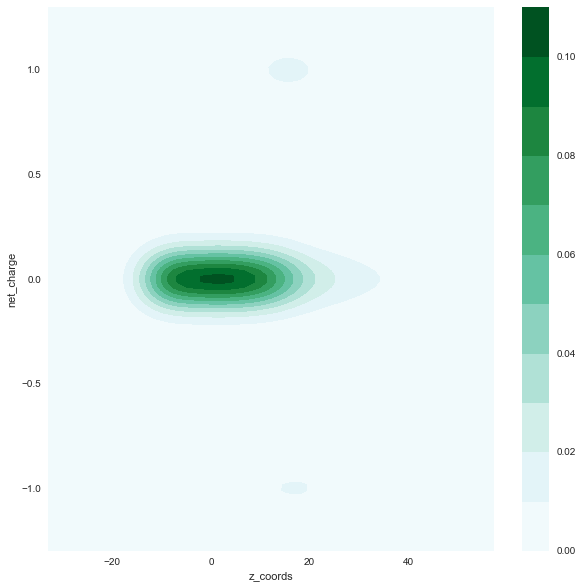

In [89]:
plot_prop_vs_prop(barrel_df, 'z_coords', charge_at_ph_7_dict, 'net_charge', 3, 0.1)

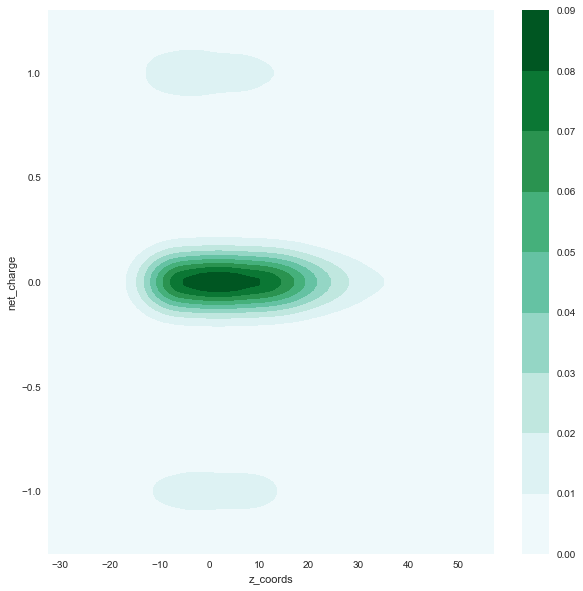

In [90]:
plot_prop_vs_prop(int_barrel_df, 'z_coords', charge_at_ph_7_dict, 'net_charge', 3, 0.1)

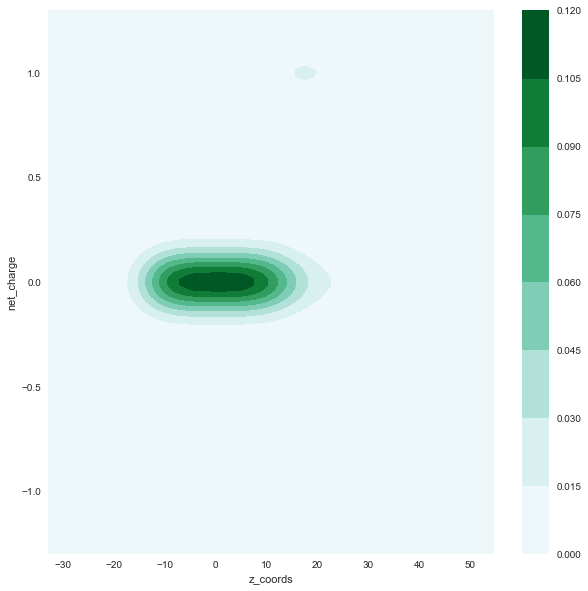

In [91]:
plot_prop_vs_prop(ext_barrel_df, 'z_coords', charge_at_ph_7_dict, 'net_charge', 3, 0.1)

### Positive charge KDEs

In [92]:
posi_charge_at_ph_7_list = [0, 1, 0, 0, 0, 0, 0, 0, 0.36, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
posi_charge_at_ph_7_dict = define_dict(posi_charge_at_ph_7_list)

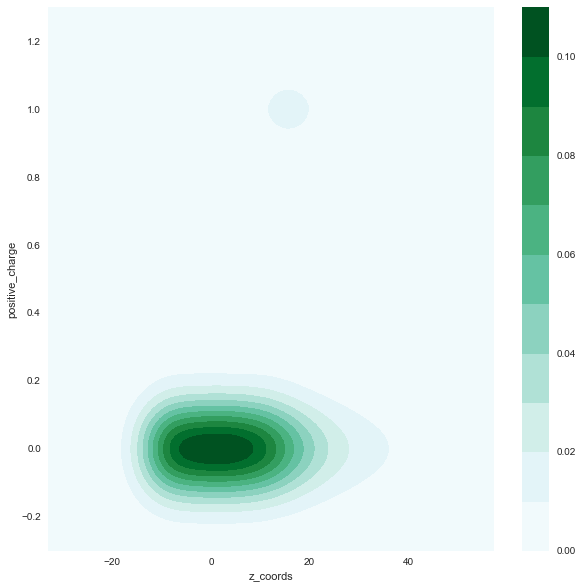

In [93]:
plot_prop_vs_prop(barrel_df, 'z_coords', posi_charge_at_ph_7_dict, 'positive_charge', 3, 0.1)

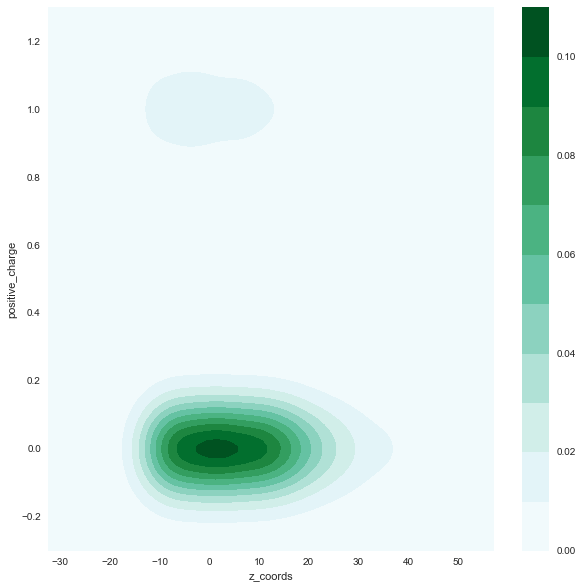

In [94]:
plot_prop_vs_prop(int_barrel_df, 'z_coords', posi_charge_at_ph_7_dict, 'positive_charge', 3, 0.1)

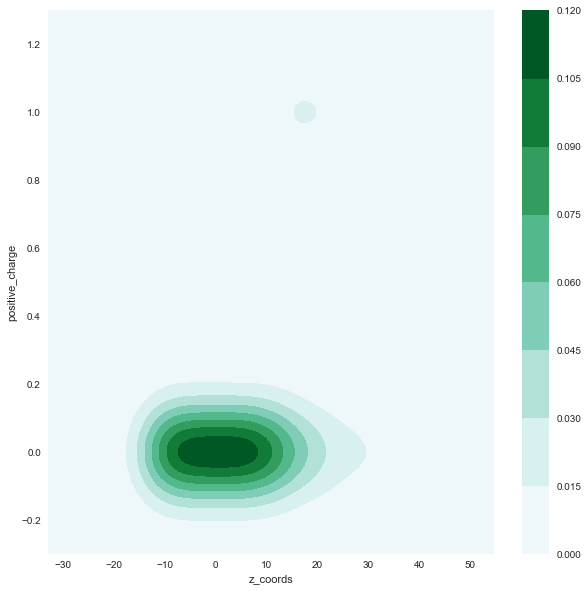

In [95]:
plot_prop_vs_prop(ext_barrel_df, 'z_coords', posi_charge_at_ph_7_dict, 'positive_charge', 3, 0.1)

### Negative KDEs

In [96]:
neg_charge_at_ph_7_list = [0, 0, 0, -1, -0.02, 0, -1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
neg_charge_at_ph_7_dict = define_dict(neg_charge_at_ph_7_list)

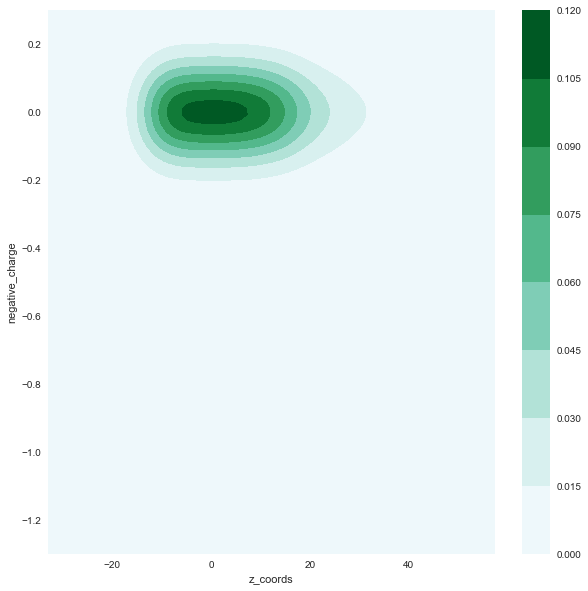

In [97]:
plot_prop_vs_prop(barrel_df, 'z_coords', neg_charge_at_ph_7_dict, 'negative_charge', 3, 0.1)

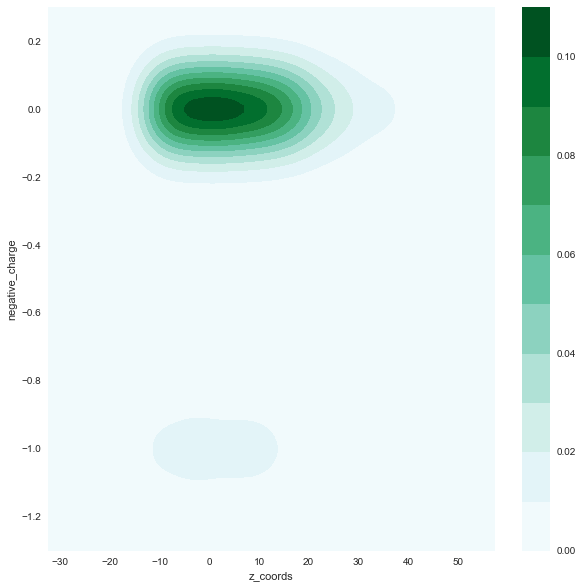

In [98]:
plot_prop_vs_prop(int_barrel_df, 'z_coords', neg_charge_at_ph_7_dict, 'negative_charge', 3, 0.1)

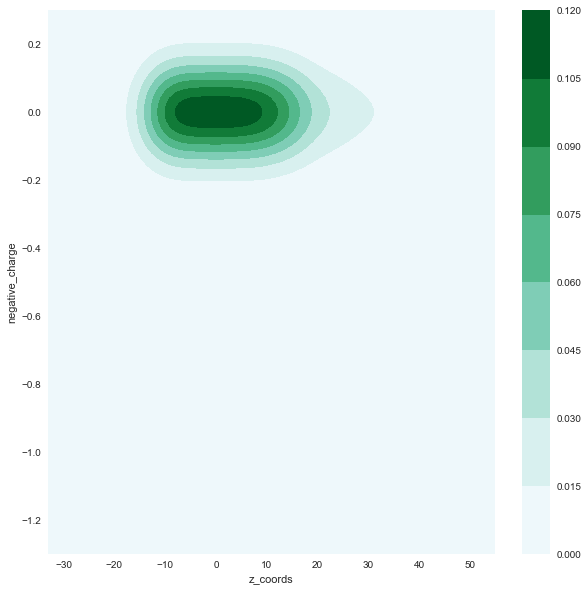

In [99]:
plot_prop_vs_prop(ext_barrel_df, 'z_coords', neg_charge_at_ph_7_dict, 'negative_charge', 3, 0.1)

### Polarity KDEs

In [100]:
# Mean polarity (Radzicka-Wolfenden, 1988)
polarity_list = [-0.06, -0.84, -0.48, -0.80, 1.36, -0.73, -0.77, -0.41, 0.49, 1.31, 1.21, -1.18, 1.27, 1.27, 0.0,
                 -0.50, -0.27, 0.88, 0.33,  1.09]
polarity_dict = define_dict(polarity_list)

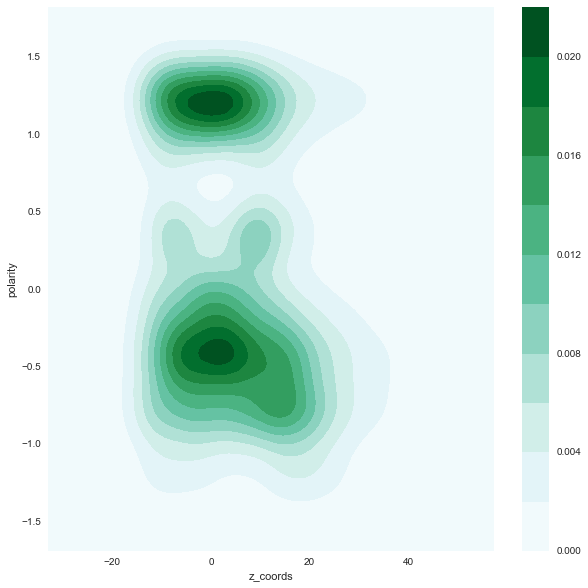

In [101]:
plot_prop_vs_prop(barrel_df, 'z_coords', polarity_dict, 'polarity', 3, 0.17)

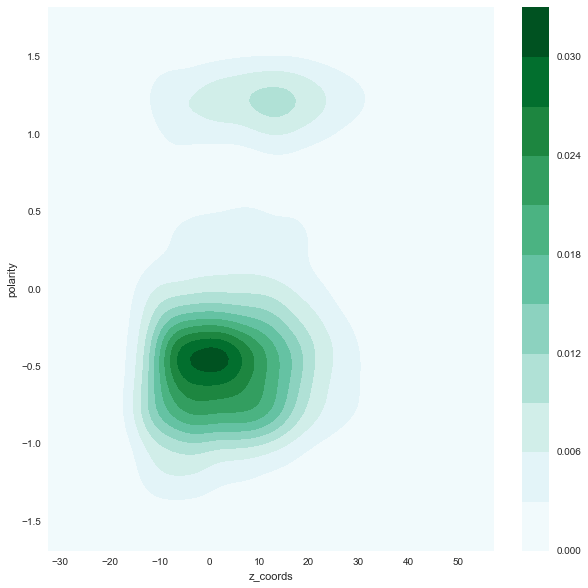

In [102]:
plot_prop_vs_prop(int_barrel_df, 'z_coords', polarity_dict, 'polarity', 3, 0.17)

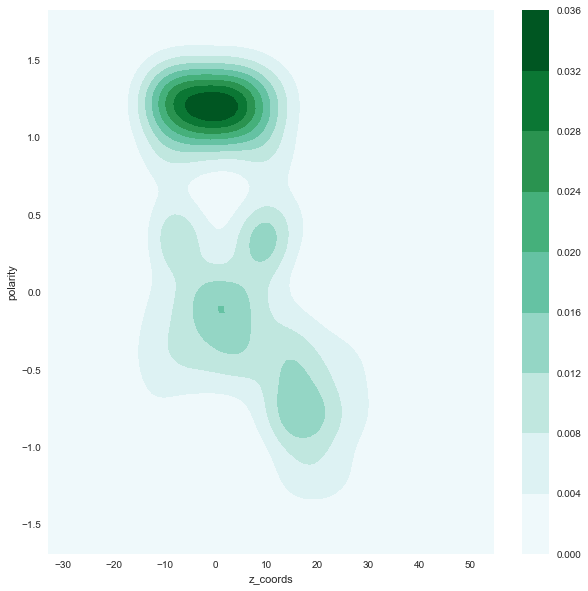

In [103]:
plot_prop_vs_prop(ext_barrel_df, 'z_coords', polarity_dict, 'polarity', 3, 0.17)

### Aromaticity KDEs

In [104]:
# 1 = aromatic, 0 = not aromatic
aromaticity_list = [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0]
aromaticity_dict = define_dict(aromaticity_list)

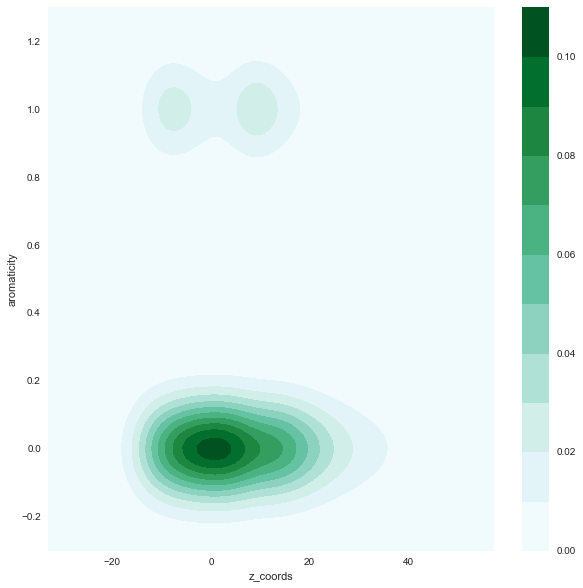

In [105]:
plot_prop_vs_prop(barrel_df, 'z_coords', aromaticity_dict, 'aromaticity', 3, 0.1)

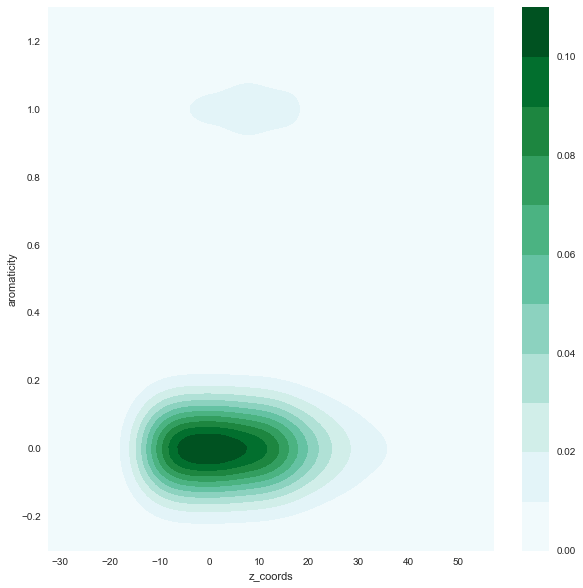

In [106]:
plot_prop_vs_prop(int_barrel_df, 'z_coords', aromaticity_dict, 'aromaticity', 3, 0.1)

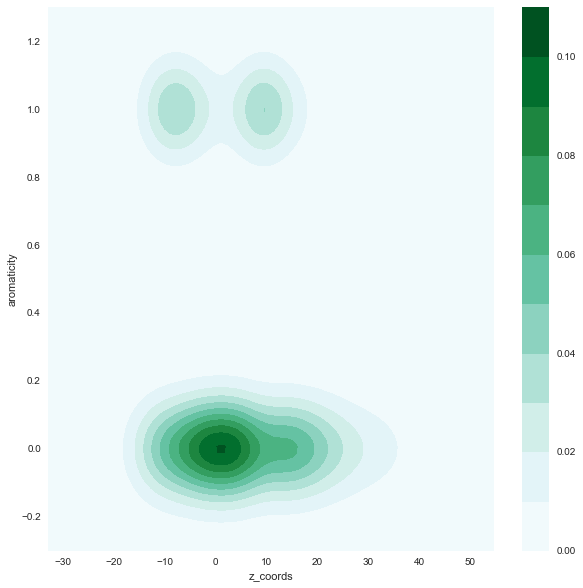

In [107]:
plot_prop_vs_prop(ext_barrel_df, 'z_coords', aromaticity_dict, 'aromaticity', 3, 0.1)

### Flexibility KDEs

In [108]:
# Average flexibility indices in globular proteins (Bhaskaran-Ponnuswamy, 1988)
flexibility_list = [52.6, 109.1, 75.7, 68.4, 68.3, 89.7, 84.7, 36.3, 91.9, 102.0, 102.0, 105.1, 97.7, 113.9, 73.6,
                    54.9, 71.2, 135.4, 116.2, 85.1]
flexibility_dict = define_dict(flexibility_list)

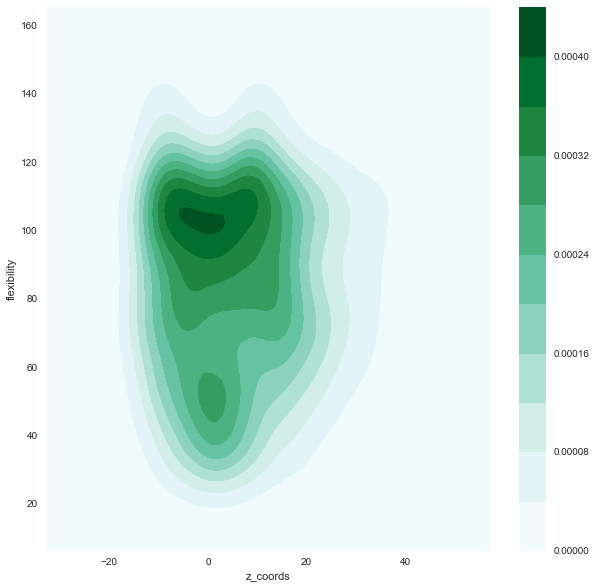

In [109]:
plot_prop_vs_prop(barrel_df, 'z_coords', flexibility_dict, 'flexibility', 3, 10)

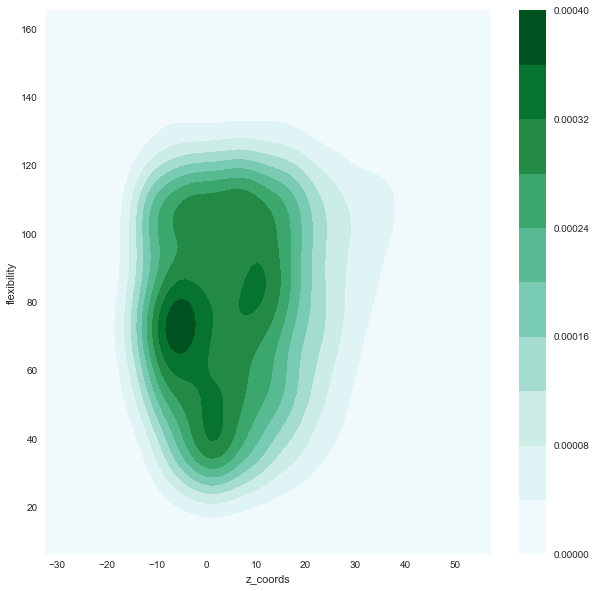

In [110]:
plot_prop_vs_prop(int_barrel_df, 'z_coords', flexibility_dict, 'flexibility', 3, 10)

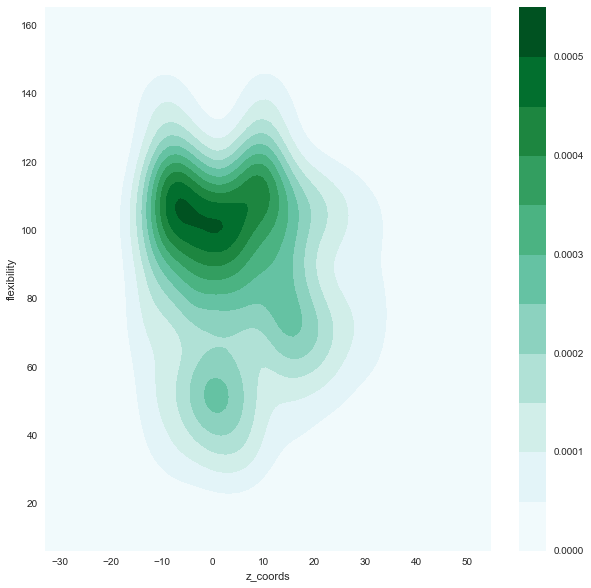

In [111]:
plot_prop_vs_prop(ext_barrel_df, 'z_coords', flexibility_dict, 'flexibility', 3, 10)

### Dihedral angle KDEs

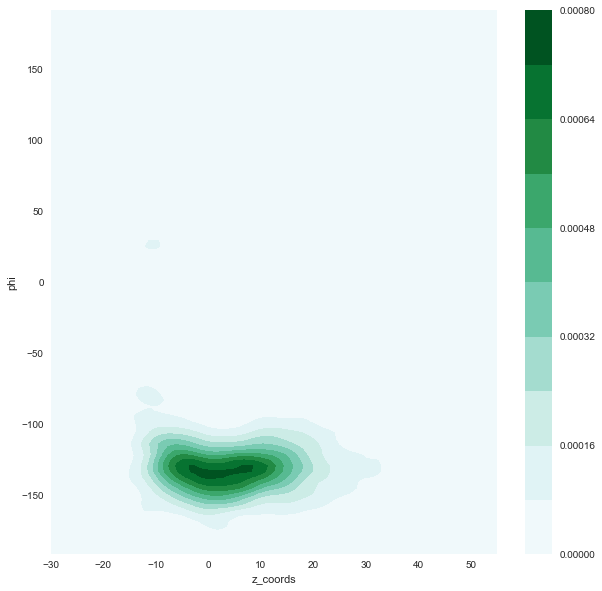

In [112]:
plot_prop_vs_dihedral(barrel_df, 'z_coords', 'phi')

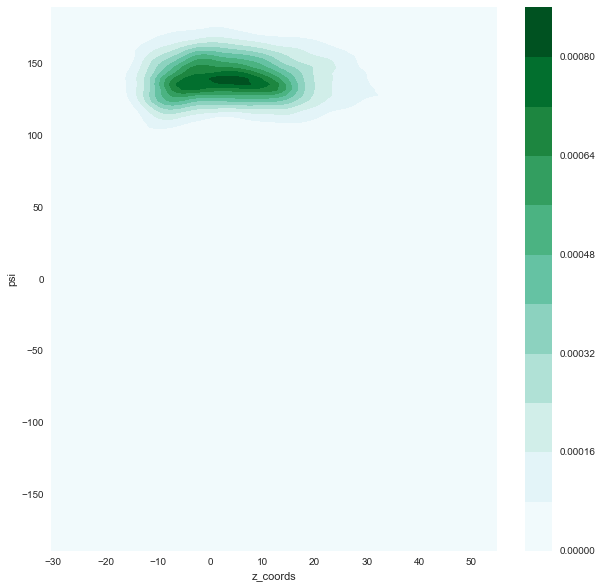

In [113]:
plot_prop_vs_dihedral(barrel_df, 'z_coords', 'psi')

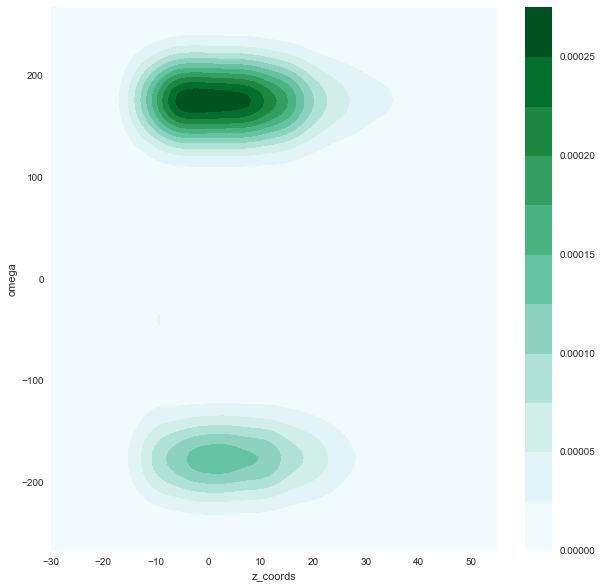

In [114]:
plot_prop_vs_dihedral(barrel_df, 'z_coords', 'omega')

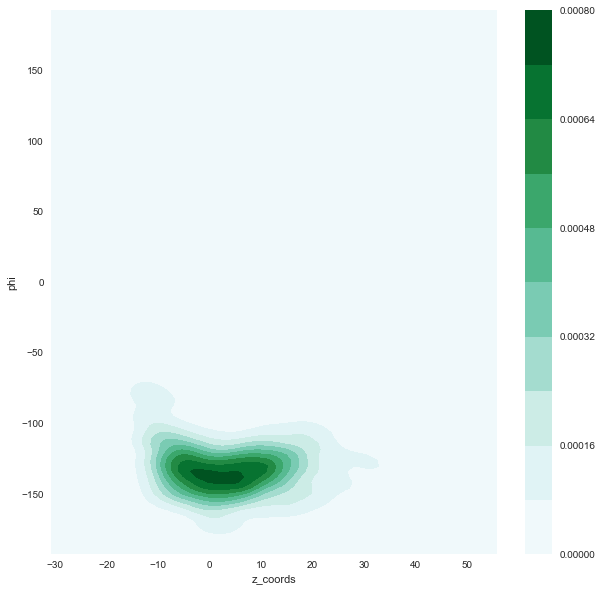

In [115]:
plot_prop_vs_dihedral(int_barrel_df, 'z_coords', 'phi')

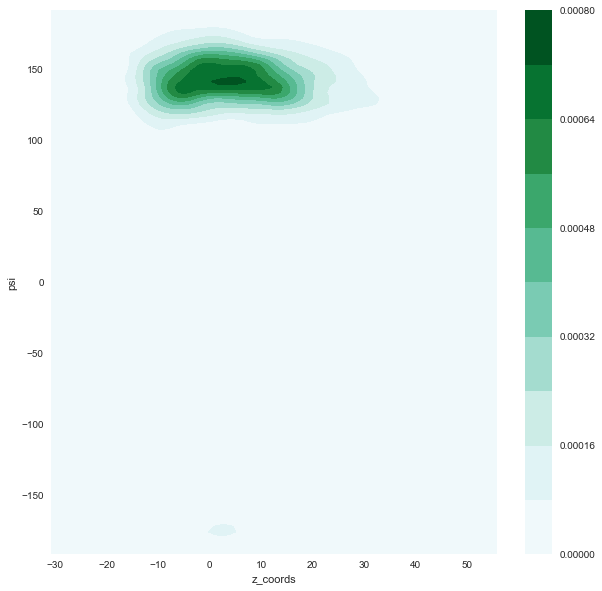

In [116]:
plot_prop_vs_dihedral(int_barrel_df, 'z_coords', 'psi')

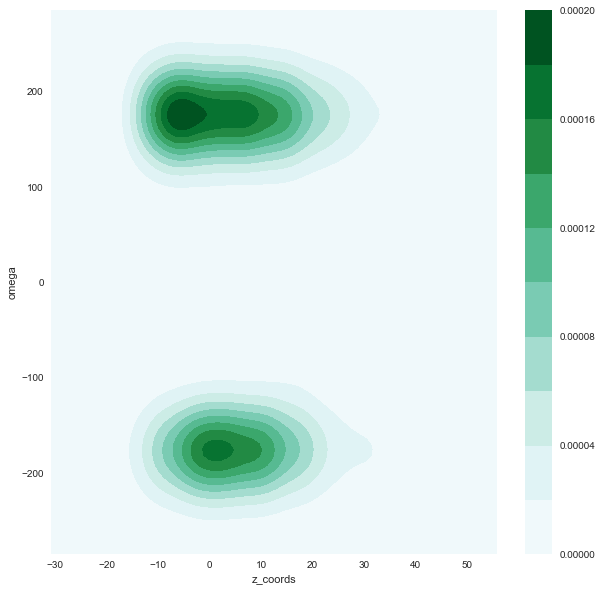

In [117]:
plot_prop_vs_dihedral(int_barrel_df, 'z_coords', 'omega')

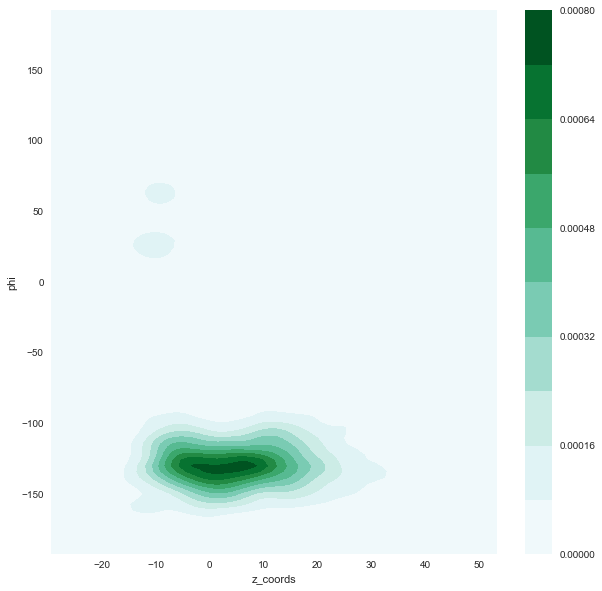

In [118]:
plot_prop_vs_dihedral(ext_barrel_df, 'z_coords', 'phi')

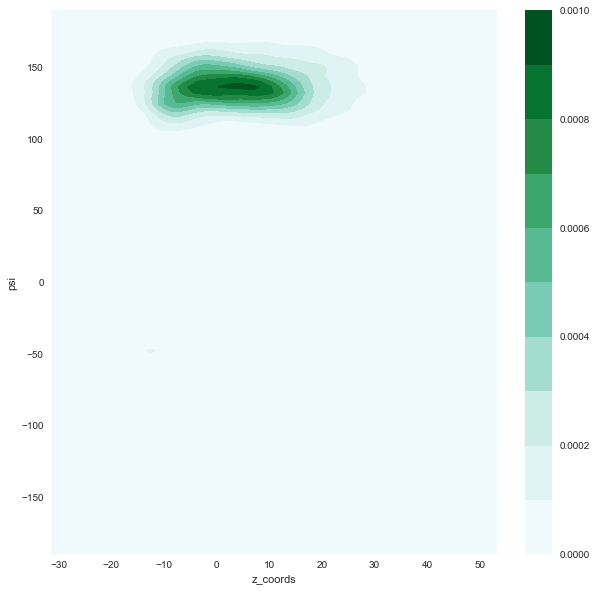

In [119]:
plot_prop_vs_dihedral(ext_barrel_df, 'z_coords', 'psi')

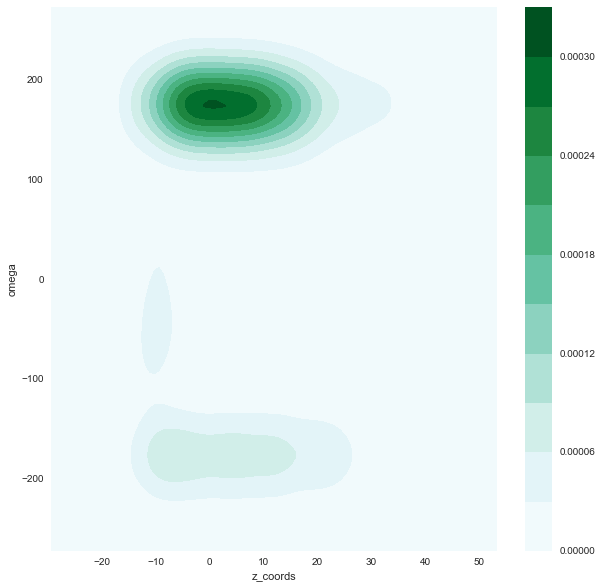

In [120]:
plot_prop_vs_dihedral(ext_barrel_df, 'z_coords', 'omega')

### Van der Waals interactions amino acid pair propensities

In [121]:
(barrel_vdw_propensity, barrel_vdw_frequency, barrel_vdw_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'van_der_waals_fasta_intra', aa_dict_no_cys)

In [122]:
barrel_vdw_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.041209,0.866436,0.780804,0.902063,0.771300,0.974540,1.312873,0.861698,0.897912,0.995360,0.978971,0.864456,1.260602,0.964794,1.177785,0.966934,0.941586,1.033526,0.966304
1,R,0.858475,1.316722,1.160438,1.237194,1.386786,1.309970,0.574797,1.015383,1.155487,0.797553,0.779599,1.075223,1.080965,0.672783,0.796304,0.950890,0.911577,1.154865,0.811812
2,N,0.720749,1.169257,1.484236,1.252561,1.107633,0.968582,0.703765,1.302406,0.976026,0.926927,1.105232,0.861151,0.980148,0.605194,1.021399,0.843604,1.020442,1.009988,1.016550
3,D,0.785387,1.264656,1.390913,0.979947,1.006531,0.637776,0.621528,1.311996,1.276452,0.847198,1.255680,0.969827,0.868034,1.176518,0.731075,0.947997,1.171666,1.263748,0.903409
4,Q,0.796718,1.518100,1.096190,0.843294,0.927438,0.899958,0.579172,0.852592,0.745424,0.821887,1.395353,1.247342,1.002056,0.726325,0.849726,1.247046,1.243821,1.175408,0.917915
5,E,0.952920,1.231256,1.150757,0.682163,0.880738,0.501448,0.673479,1.652369,1.176375,0.965370,1.542435,1.243242,0.810590,0.914977,0.907098,1.220385,1.023574,0.931133,1.094404
6,G,1.209005,0.589561,0.703604,0.644899,0.671699,0.711286,1.023697,0.686102,1.016091,1.282701,0.831759,0.835790,1.239620,1.001986,0.845536,1.021981,0.857943,1.282004,1.370478
7,H,0.846540,0.977595,1.201014,1.487479,0.836126,1.563543,0.734271,1.040879,0.720034,0.711029,1.164789,1.445829,0.957405,0.409259,1.161657,1.252277,0.603809,1.241814,0.707076
8,I,0.941600,1.096509,0.916031,1.339366,0.813764,1.107931,1.063038,0.648855,0.648338,1.177389,1.166027,0.918963,1.029807,1.820861,1.197314,0.915333,1.048537,0.805077,0.848894
9,L,1.038427,0.862162,0.940742,0.991167,0.813331,0.914134,1.199887,0.737405,1.199470,1.174226,0.956322,1.273083,1.067352,1.110301,1.136431,1.138418,0.822133,0.755362,0.947915


In [123]:
barrel_vdw_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,132,98,74,71,72,75,157,35,73,173,82,35,167,23,122,113,71,203,120
1,R,95,130,96,85,113,88,60,36,82,121,57,38,125,14,72,97,60,198,88
2,N,76,110,117,82,86,62,70,44,66,134,77,29,108,12,88,82,64,165,105
3,D,71,102,94,55,67,35,53,38,74,105,75,28,82,20,54,79,63,177,80
4,Q,70,119,72,46,60,48,48,24,42,99,81,35,92,12,61,101,65,160,79
5,E,72,83,65,32,49,23,48,40,57,100,77,30,64,13,56,85,46,109,81
6,G,154,67,67,51,63,55,123,28,83,224,70,34,165,24,88,120,65,253,171
7,H,33,34,35,36,24,37,27,13,18,38,30,18,39,3,37,45,14,75,27
8,I,77,80,56,68,49,55,82,17,34,132,63,24,88,28,80,69,51,102,68
9,L,189,140,128,112,109,101,206,43,140,293,115,74,203,38,169,191,89,213,169


In [124]:
barrel_vdw_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.067450,0.056128,0.050581,0.058436,0.049965,0.063131,0.085049,0.055821,0.058167,0.064480,0.063418,0.0560,0.081663,0.062500,0.076298,0.062639,0.060997,0.066953,0.062598
1,R,0.048544,0.074456,0.065619,0.069959,0.078418,0.074074,0.032503,0.057416,0.065339,0.045099,0.044084,0.0608,0.061125,0.038043,0.045028,0.053769,0.051546,0.065303,0.045905
2,N,0.038835,0.063001,0.079973,0.067490,0.059681,0.052189,0.037920,0.070175,0.052590,0.049944,0.059551,0.0464,0.052812,0.032609,0.055034,0.045455,0.054983,0.054420,0.054773
3,D,0.036280,0.058419,0.064252,0.045267,0.046495,0.029461,0.028711,0.060606,0.058964,0.039135,0.058005,0.0448,0.040098,0.054348,0.033771,0.043792,0.054124,0.058377,0.041732
4,Q,0.035769,0.068156,0.049214,0.037860,0.041638,0.040404,0.026002,0.038278,0.033466,0.036899,0.062645,0.0560,0.044988,0.032609,0.038149,0.055987,0.055842,0.052770,0.041210
5,E,0.036791,0.047537,0.044429,0.026337,0.034004,0.019360,0.026002,0.063796,0.045418,0.037272,0.059551,0.0480,0.031296,0.035326,0.035022,0.047118,0.039519,0.035950,0.042254
6,G,0.078692,0.038373,0.045796,0.041975,0.043720,0.046296,0.066631,0.044657,0.066135,0.083489,0.054138,0.0544,0.080685,0.065217,0.055034,0.066519,0.055842,0.083443,0.089202
7,H,0.016863,0.019473,0.023923,0.029630,0.016655,0.031145,0.014626,0.020734,0.014343,0.014163,0.023202,0.0288,0.019071,0.008152,0.023139,0.024945,0.012027,0.024736,0.014085
8,I,0.039346,0.045819,0.038278,0.055967,0.034004,0.046296,0.044420,0.027113,0.027092,0.049199,0.048724,0.0384,0.043032,0.076087,0.050031,0.038248,0.043814,0.033641,0.035472
9,L,0.096576,0.080183,0.087491,0.092181,0.075642,0.085017,0.111593,0.068581,0.111554,0.109206,0.088940,0.1184,0.099267,0.103261,0.105691,0.105876,0.076460,0.070251,0.088159


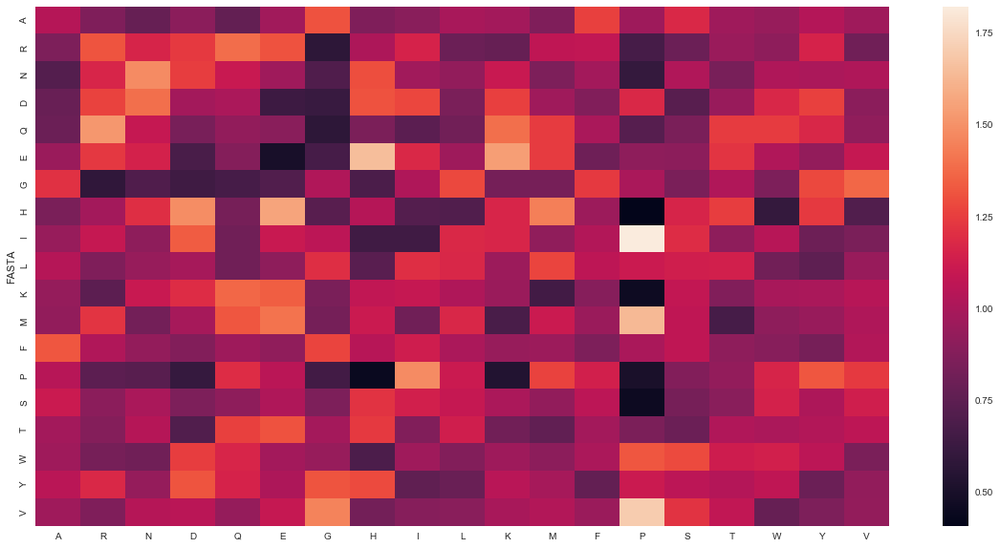

In [125]:
plot_heat_map(barrel_vdw_propensity)

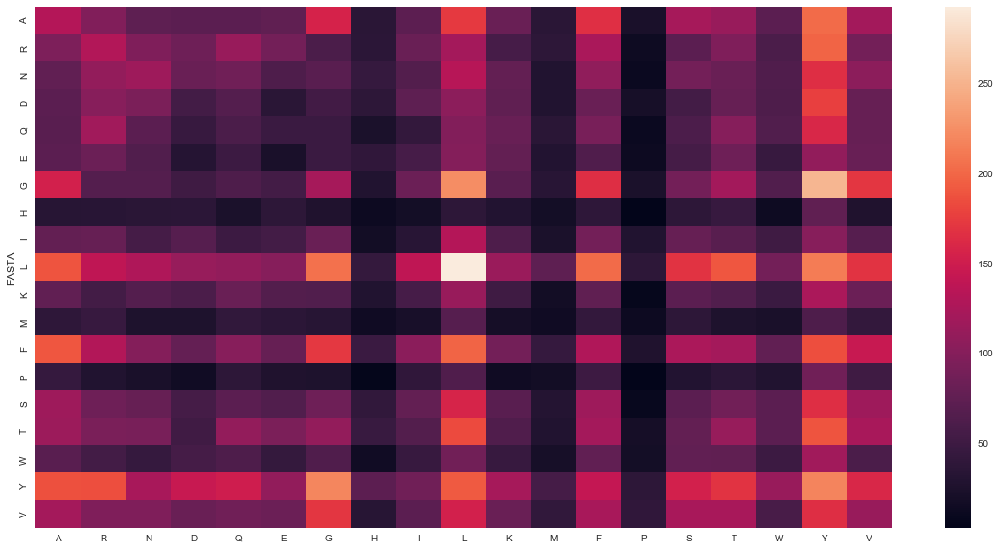

In [126]:
plot_heat_map(barrel_vdw_frequency)

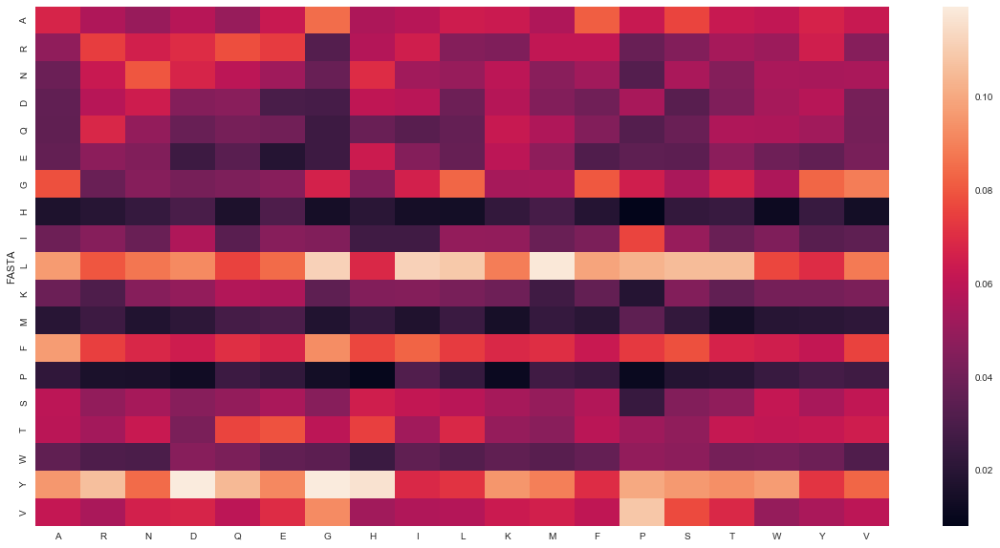

In [127]:
plot_heat_map(barrel_vdw_normed_frequencies)

In [128]:
(int_barrel_vdw_propensity, int_barrel_vdw_frequency, int_barrel_vdw_normed_frequencies
 ) = calc_aa_pair_propensities(int_barrel_df, 'van_der_waals_fasta_intra', aa_dict_no_cys)

In [129]:
int_barrel_vdw_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.053183,0.789968,0.841847,0.936481,0.711609,0.867314,1.454375,0.939421,0.812010,0.958914,0.991500,0.902436,1.263527,0.881610,1.226555,0.873547,1.088063,1.086345,1.039635
1,R,0.828835,1.201024,0.901519,1.001606,1.414147,1.427333,0.315244,1.054090,1.214835,0.918154,0.605457,1.080097,1.578993,0.527586,0.689972,0.881224,1.302268,1.246036,0.871014
2,N,0.658545,1.103554,1.606086,1.310759,1.081539,1.039642,0.676474,0.945904,1.401622,1.184385,0.950802,0.959145,0.923002,0.739745,0.938615,0.686906,0.852112,0.941919,1.060767
3,D,0.753584,1.250392,1.472773,0.693843,1.083859,0.612866,0.616295,0.929346,1.744310,1.244602,0.928821,1.249860,0.941158,2.790897,0.679504,0.849364,1.148154,1.146340,0.954434
4,Q,0.892316,1.535105,0.913474,0.616182,0.892713,0.862122,0.478095,0.907858,1.076198,0.978591,1.345374,1.104680,1.120516,1.022388,0.739656,1.196348,1.612310,1.102337,1.028818
5,E,0.882931,1.390932,1.107966,0.550698,0.901216,0.519783,0.452155,1.622754,1.431290,0.946529,1.438082,1.039244,1.063796,0.435112,0.847500,1.207171,1.521515,1.005295,1.272498
6,G,0.619962,0.764558,0.803906,0.599354,0.807752,0.820830,0.967805,1.093319,0.830800,0.961481,1.043428,0.700183,1.623561,1.262815,1.071717,0.983137,1.298782,1.977513,0.774368
7,H,1.348869,0.850219,1.073997,1.103942,0.697400,1.287137,0.753445,1.423192,0.702953,0.929743,1.331299,1.302058,0.772115,0.000000,1.146770,1.253174,0.941932,0.626963,1.224010
8,I,1.043632,1.077898,0.845799,1.261177,0.748674,1.026990,1.242598,0.796358,0.568162,0.924879,1.250277,0.793339,0.840083,2.325092,1.109083,1.053178,0.956525,0.920906,0.783387
9,L,1.114414,0.867623,0.972193,1.070679,0.793627,0.894653,1.330720,0.946497,0.896043,0.940373,1.073722,1.363851,1.023429,1.332377,1.153409,1.123210,0.487227,0.843699,0.768142


In [130]:
int_barrel_vdw_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,73,74,57,47,53,56,127,16,28,50,49,24,68,8,100,70,24,96,50
1,R,48,94,51,42,88,77,23,15,35,40,25,24,71,4,47,59,24,92,35
2,N,34,77,81,49,60,50,44,12,36,46,35,19,37,5,57,41,14,62,38
3,D,33,74,63,22,51,25,34,10,38,41,29,21,32,16,35,43,16,64,29
4,Q,40,93,40,20,43,36,27,10,24,33,43,19,39,6,39,62,23,63,32
5,E,31,66,38,14,34,17,20,14,25,25,36,14,29,2,35,49,17,45,31
6,G,30,50,38,21,42,37,59,13,20,35,36,13,61,8,61,55,20,122,26
7,H,27,23,21,16,15,24,19,7,7,14,19,10,12,0,27,29,6,16,17
8,I,48,67,38,42,37,44,72,9,13,32,41,14,30,14,60,56,14,54,25
9,L,115,121,98,80,88,86,173,24,46,73,79,54,82,18,140,134,16,111,55


In [131]:
int_barrel_vdw_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.073515,0.055142,0.058763,0.065369,0.049672,0.060541,0.101519,0.065574,0.056680,0.066934,0.069209,0.062992,0.088197,0.061538,0.085616,0.060976,0.075949,0.075829,0.072569
1,R,0.048338,0.070045,0.052577,0.058414,0.082474,0.083243,0.018385,0.061475,0.070850,0.053548,0.035311,0.062992,0.092088,0.030769,0.040240,0.051394,0.075949,0.072670,0.050798
2,N,0.034240,0.057377,0.083505,0.068150,0.056232,0.054054,0.035172,0.049180,0.072874,0.061580,0.049435,0.049869,0.047990,0.038462,0.048801,0.035714,0.044304,0.048973,0.055152
3,D,0.033233,0.055142,0.064948,0.030598,0.047798,0.027027,0.027178,0.040984,0.076923,0.054886,0.040960,0.055118,0.041505,0.123077,0.029966,0.037456,0.050633,0.050553,0.042090
4,Q,0.040282,0.069300,0.041237,0.027816,0.040300,0.038919,0.021583,0.040984,0.048583,0.044177,0.060734,0.049869,0.050584,0.046154,0.033390,0.054007,0.072785,0.049763,0.046444
5,E,0.031219,0.049180,0.039175,0.019471,0.031865,0.018378,0.015987,0.057377,0.050607,0.033467,0.050847,0.036745,0.037613,0.015385,0.029966,0.042683,0.053797,0.035545,0.044993
6,G,0.030211,0.037258,0.039175,0.029207,0.039363,0.040000,0.047162,0.053279,0.040486,0.046854,0.050847,0.034121,0.079118,0.061538,0.052226,0.047909,0.063291,0.096367,0.037736
7,H,0.027190,0.017139,0.021649,0.022253,0.014058,0.025946,0.015188,0.028689,0.014170,0.018742,0.026836,0.026247,0.015564,0.000000,0.023116,0.025261,0.018987,0.012638,0.024673
8,I,0.048338,0.049925,0.039175,0.058414,0.034677,0.047568,0.057554,0.036885,0.026316,0.042838,0.057910,0.036745,0.038911,0.107692,0.051370,0.048780,0.044304,0.042654,0.036284
9,L,0.115811,0.090164,0.101031,0.111266,0.082474,0.092973,0.138289,0.098361,0.093117,0.097724,0.111582,0.141732,0.106355,0.138462,0.119863,0.116725,0.050633,0.087678,0.079826


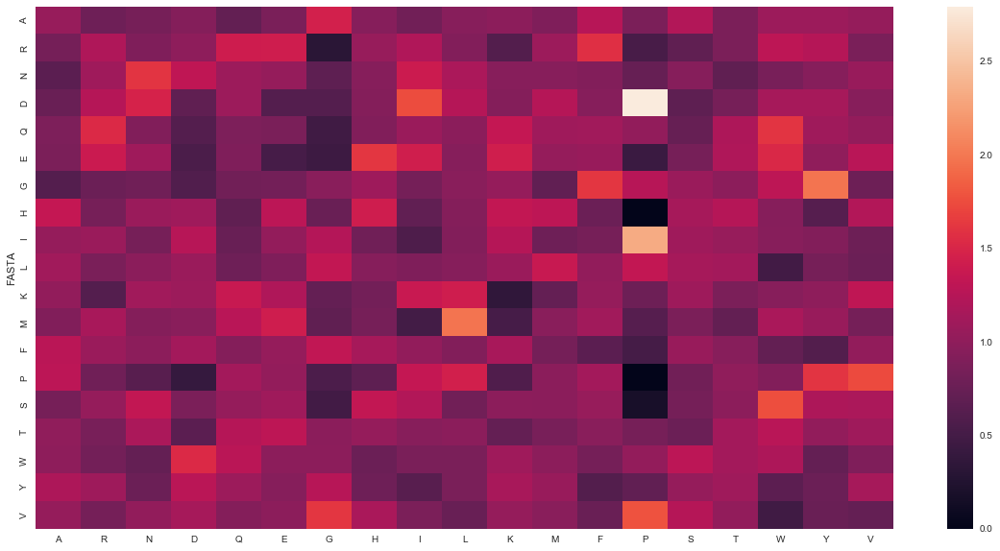

In [132]:
plot_heat_map(int_barrel_vdw_propensity)

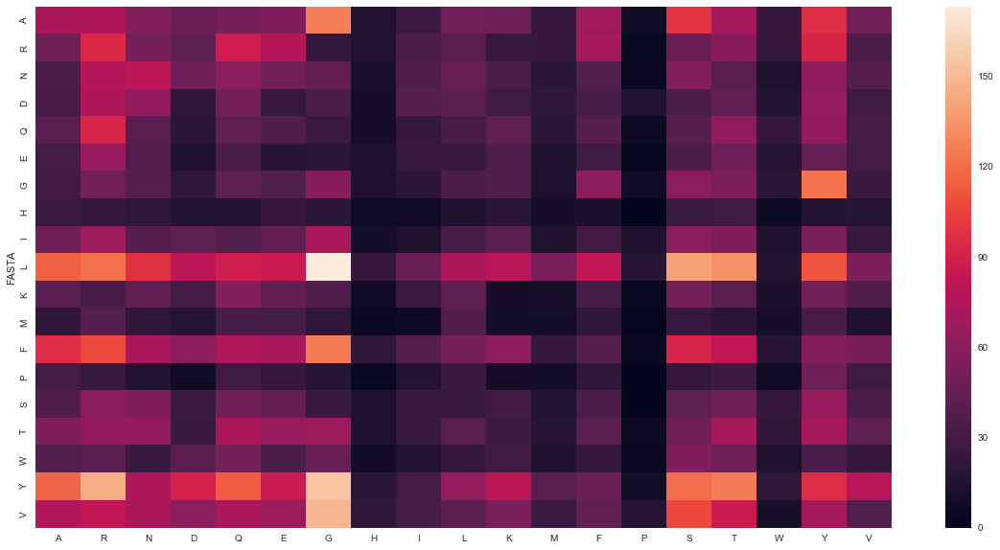

In [133]:
plot_heat_map(int_barrel_vdw_frequency)

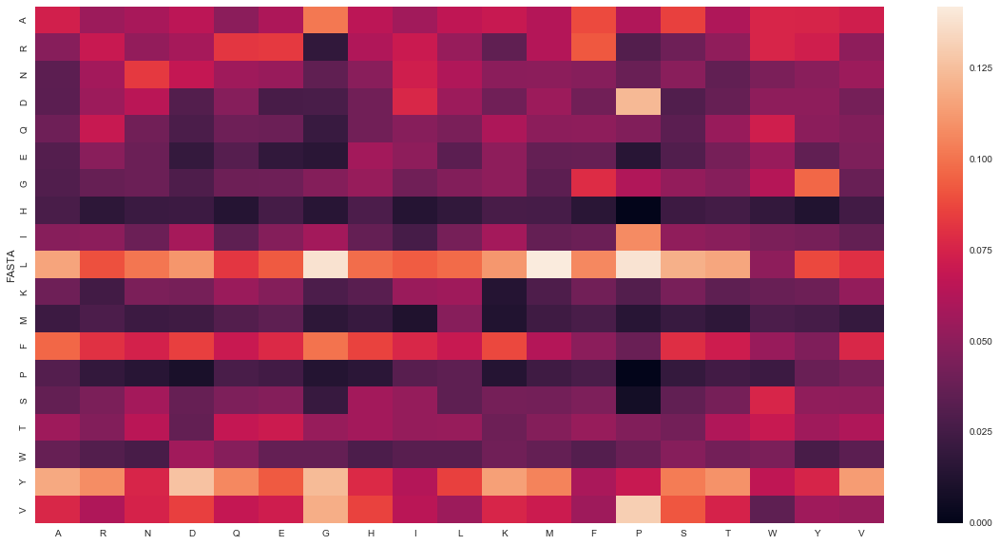

In [134]:
plot_heat_map(int_barrel_vdw_normed_frequencies)

In [135]:
(ext_barrel_vdw_propensity, ext_barrel_vdw_frequency, ext_barrel_vdw_normed_frequencies
 ) = calc_aa_pair_propensities(ext_barrel_df, 'van_der_waals_fasta_intra', aa_dict_no_cys)

In [136]:
ext_barrel_vdw_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.032825,1.002493,0.581907,0.816547,0.857301,1.219128,0.850856,0.837156,0.997883,1.072140,0.951940,0.760772,1.311346,1.063569,0.861384,1.106156,0.935306,1.022456,0.961947
1,R,0.893034,1.632180,1.671909,1.587939,1.224378,0.766097,1.139021,1.004309,1.131254,0.766349,1.001939,1.050958,0.776375,0.769609,1.062453,1.061028,0.777595,1.099416,0.790541
2,N,0.778591,1.459720,1.304946,1.188966,1.242335,0.815385,0.780896,1.493098,0.704488,0.812296,1.283011,0.732398,0.995923,0.525603,1.285350,1.116907,1.053686,1.042278,0.975020
3,D,0.812815,1.429097,1.296581,1.371883,0.882131,0.784024,0.658448,1.507454,0.975445,0.681647,1.621388,0.591552,0.809255,0.346552,0.908994,1.131576,1.142844,1.319388,0.856361
4,Q,0.697406,1.442226,1.454602,1.174716,1.018635,1.022508,0.790940,0.819163,0.530065,0.763976,1.455690,1.469506,0.932283,0.564957,1.143896,1.332300,1.109928,1.230899,0.857710
5,E,1.008233,0.997521,1.298288,0.860290,0.950767,0.540816,1.115566,1.609270,0.996827,0.918354,1.661431,1.554478,0.651258,1.095645,1.155038,1.300927,0.810693,0.859100,0.965219
6,G,1.548345,0.506513,0.708067,0.728052,0.675882,0.823834,1.294750,0.471428,0.996504,1.175113,0.699594,1.035983,0.982623,0.809219,0.754066,1.192704,0.638763,0.892902,1.421323
7,H,0.316632,1.385136,1.444648,2.051301,1.224199,2.514599,0.683997,0.796955,0.735342,0.630648,0.956572,1.667943,1.078141,0.641247,1.180331,1.240787,0.479927,1.699583,0.414269
8,I,0.817401,0.874332,0.992064,1.424315,0.871814,1.136452,0.456665,0.567552,0.749806,1.403489,1.021836,1.113588,1.237009,1.598326,1.260860,0.538460,1.185551,0.738524,0.951446
9,L,0.947747,0.580644,0.751298,0.796537,0.693243,0.704163,0.684754,0.612481,1.525039,1.402991,0.759774,1.011994,1.172610,1.037506,0.830727,1.072775,1.062832,0.713095,1.146157


In [137]:
ext_barrel_vdw_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,59,24,17,24,19,19,30,19,45,123,33,11,99,15,22,43,47,107,70
1,R,47,36,45,43,25,11,37,21,47,81,32,14,54,10,25,38,36,106,53
2,N,42,33,36,33,26,12,26,32,30,88,42,10,71,7,31,41,50,103,67
3,D,38,28,31,33,16,10,19,28,36,64,46,7,50,4,19,36,47,113,51
4,Q,30,26,32,26,17,12,21,14,18,66,38,16,53,6,22,39,42,97,47
5,E,41,17,27,18,15,6,28,26,32,75,41,16,35,11,21,36,29,64,50
6,G,124,17,29,30,21,18,64,15,63,189,34,21,104,16,27,65,45,131,145
7,H,6,11,14,20,9,13,8,6,11,24,11,8,27,3,10,16,8,59,10
8,I,29,13,18,26,12,11,10,8,21,100,22,10,58,14,20,13,37,48,43
9,L,74,19,30,32,21,15,33,19,94,220,36,20,121,20,29,57,73,102,114


In [138]:
ext_barrel_vdw_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.061203,0.059406,0.034483,0.048387,0.050802,0.072243,0.050420,0.049608,0.059133,0.063533,0.056410,0.045082,0.077708,0.063025,0.051044,0.065549,0.055425,0.060589,0.057003
1,R,0.048755,0.089109,0.091278,0.086694,0.066845,0.041825,0.062185,0.054830,0.061761,0.041839,0.054701,0.057377,0.042386,0.042017,0.058005,0.057927,0.042453,0.060023,0.043160
2,N,0.043568,0.081683,0.073022,0.066532,0.069519,0.045627,0.043697,0.083551,0.039422,0.045455,0.071795,0.040984,0.055730,0.029412,0.071926,0.062500,0.058962,0.058324,0.054560
3,D,0.039419,0.069307,0.062880,0.066532,0.042781,0.038023,0.031933,0.073107,0.047306,0.033058,0.078632,0.028689,0.039246,0.016807,0.044084,0.054878,0.055425,0.063986,0.041531
4,Q,0.031120,0.064356,0.064909,0.052419,0.045455,0.045627,0.035294,0.036554,0.023653,0.034091,0.064957,0.065574,0.041601,0.025210,0.051044,0.059451,0.049528,0.054926,0.038274
5,E,0.042531,0.042079,0.054767,0.036290,0.040107,0.022814,0.047059,0.067885,0.042050,0.038740,0.070085,0.065574,0.027473,0.046218,0.048724,0.054878,0.034198,0.036240,0.040717
6,G,0.128631,0.042079,0.058824,0.060484,0.056150,0.068441,0.107563,0.039164,0.082786,0.097624,0.058120,0.086066,0.081633,0.067227,0.062645,0.099085,0.053066,0.074179,0.118078
7,H,0.006224,0.027228,0.028398,0.040323,0.024064,0.049430,0.013445,0.015666,0.014455,0.012397,0.018803,0.032787,0.021193,0.012605,0.023202,0.024390,0.009434,0.033409,0.008143
8,I,0.030083,0.032178,0.036511,0.052419,0.032086,0.041825,0.016807,0.020888,0.027595,0.051653,0.037607,0.040984,0.045526,0.058824,0.046404,0.019817,0.043632,0.027180,0.035016
9,L,0.076763,0.047030,0.060852,0.064516,0.056150,0.057034,0.055462,0.049608,0.123522,0.113636,0.061538,0.081967,0.094976,0.084034,0.067285,0.086890,0.086085,0.057758,0.092834


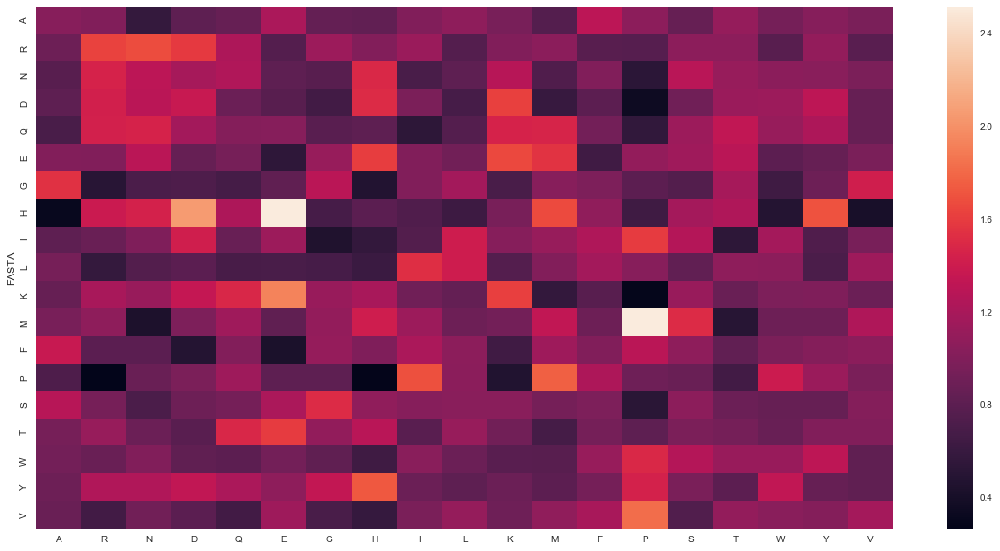

In [139]:
plot_heat_map(ext_barrel_vdw_propensity)

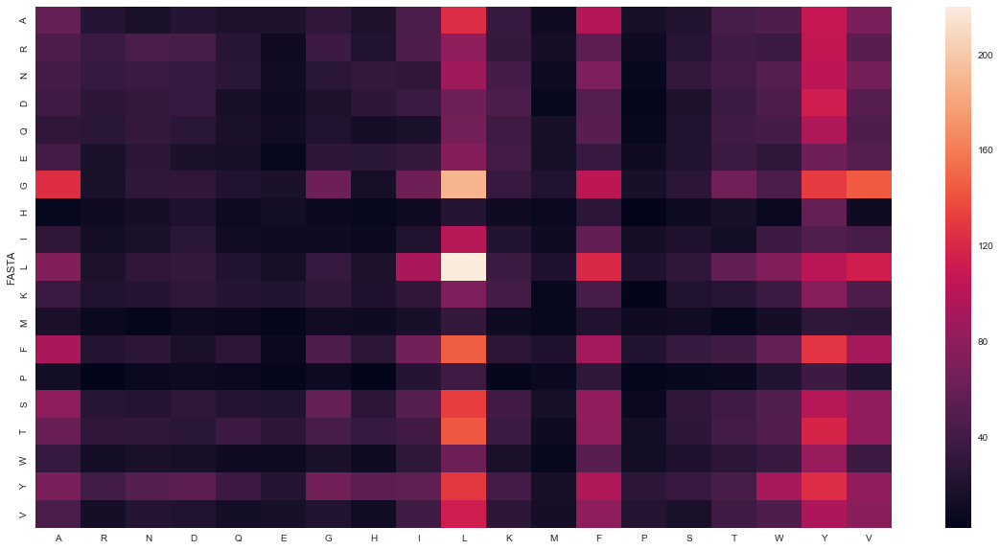

In [140]:
plot_heat_map(ext_barrel_vdw_frequency)

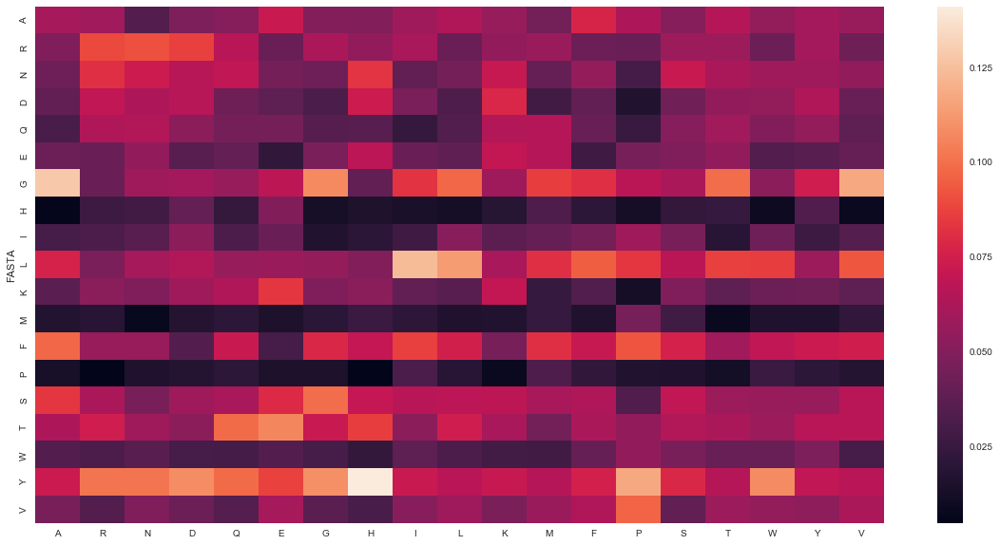

In [141]:
plot_heat_map(ext_barrel_vdw_normed_frequencies)

### Hydrogen bonding interaction amino acid pair propensities

In [142]:
(barrel_hbonds_propensity, barrel_hbonds_frequency, barrel_hbonds_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'h_bonds_fasta_intra', aa_dict_no_cys)

In [143]:
barrel_hbonds_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.390027,0.511699,0.492785,0.716547,0.990796,0.596530,1.188411,0.574436,1.368510,1.540568,0.415440,1.084600,1.348676,0.633052,1.130921,0.823845,0.704990,1.262201,1.836312
1,R,0.576970,0.909480,1.051944,2.519530,1.867609,3.192357,0.595703,0.701115,0.642425,0.211095,0.538260,0.733173,0.479834,1.069834,1.109186,0.862600,0.516276,0.953418,0.238715
2,N,0.435031,1.206604,1.670770,1.397372,1.170771,0.957174,0.898310,1.265110,0.452091,0.495176,1.344970,0.859921,0.773831,1.254783,1.260910,1.064971,1.350793,0.777083,0.531968
3,D,0.626407,2.517980,1.529820,0.945575,0.797587,0.378343,0.594047,1.518042,0.241101,0.376311,2.266002,1.031844,0.371417,0.602260,1.114337,1.124543,0.804838,0.745956,0.241891
4,Q,0.880922,1.999090,1.235006,0.872926,0.625717,0.513065,0.760693,0.943210,1.081917,0.786219,1.637143,1.602797,1.282075,0.519728,0.895312,0.735181,1.080404,0.785039,0.649423
5,E,0.614280,2.866778,1.175965,0.378455,0.623939,0.894418,0.761068,1.125421,0.319184,0.340863,2.616173,0.683010,0.312903,0.000000,1.068271,1.060164,1.065496,0.650333,0.320231
6,G,1.070248,0.669377,1.061087,0.842487,0.793694,0.993104,1.228606,0.712155,0.754047,1.022062,0.968277,0.887455,1.610416,0.706342,1.036520,0.852612,0.769128,1.379877,1.008692
7,H,0.727219,0.841886,1.082802,1.447502,1.022752,1.016508,0.660730,1.903338,0.604590,1.117477,0.660730,1.293738,1.058378,0.943900,1.144233,1.174971,0.140155,1.311684,0.842461
8,I,1.192425,0.552178,0.405823,0.497300,1.043474,0.555591,0.709137,0.499346,1.487024,1.954489,0.595872,2.121349,2.013097,0.000000,0.710983,0.665555,1.378877,1.608406,1.436644
9,L,1.608655,0.346037,0.554879,0.288465,0.747337,0.405150,1.059375,1.081025,1.852468,1.911478,0.419710,0.966835,1.170600,1.128632,0.684086,0.670532,1.927224,1.466108,1.813211


In [144]:
barrel_hbonds_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,57,29,19,31,26,21,59,9,27,74,15,10,38,2,56,46,15,66,65
1,R,28,61,48,129,58,133,35,13,15,12,23,8,16,4,65,57,13,59,10
2,N,18,69,65,61,31,34,45,20,9,24,49,8,22,4,63,60,29,41,19
3,D,27,150,62,43,22,14,31,25,5,19,86,10,11,2,58,66,18,41,9
4,Q,22,69,29,23,10,11,23,9,13,23,36,9,22,1,27,25,14,25,14
5,E,20,129,36,13,13,25,30,14,5,13,75,5,7,0,42,47,18,27,9
6,G,59,51,55,49,28,47,82,15,20,66,47,11,61,3,69,64,22,97,48
7,H,10,16,14,21,9,12,11,10,4,18,8,4,10,1,19,22,1,23,10
8,I,25,16,8,11,14,10,18,4,15,48,11,10,29,0,18,19,15,43,26
9,L,74,22,24,14,22,16,59,19,41,103,17,10,37,4,38,42,46,86,72


In [145]:
barrel_hbonds_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.089623,0.032992,0.031773,0.046200,0.063882,0.038462,0.076623,0.037037,0.088235,0.099329,0.026786,0.069930,0.086957,0.040816,0.072917,0.053118,0.045455,0.081381,0.118397
1,R,0.044025,0.069397,0.080268,0.192250,0.142506,0.243590,0.045455,0.053498,0.049020,0.016107,0.041071,0.055944,0.036613,0.081633,0.084635,0.065820,0.039394,0.072750,0.018215
2,N,0.028302,0.078498,0.108696,0.090909,0.076167,0.062271,0.058442,0.082305,0.029412,0.032215,0.087500,0.055944,0.050343,0.081633,0.082031,0.069284,0.087879,0.050555,0.034608
3,D,0.042453,0.170648,0.103679,0.064083,0.054054,0.025641,0.040260,0.102881,0.016340,0.025503,0.153571,0.069930,0.025172,0.040816,0.075521,0.076212,0.054545,0.050555,0.016393
4,Q,0.034591,0.078498,0.048495,0.034277,0.024570,0.020147,0.029870,0.037037,0.042484,0.030872,0.064286,0.062937,0.050343,0.020408,0.035156,0.028868,0.042424,0.030826,0.025501
5,E,0.031447,0.146758,0.060201,0.019374,0.031941,0.045788,0.038961,0.057613,0.016340,0.017450,0.133929,0.034965,0.016018,0.000000,0.054688,0.054273,0.054545,0.033292,0.016393
6,G,0.092767,0.058020,0.091973,0.073025,0.068796,0.086081,0.106494,0.061728,0.065359,0.088591,0.083929,0.076923,0.139588,0.061224,0.089844,0.073903,0.066667,0.119605,0.087432
7,H,0.015723,0.018203,0.023411,0.031297,0.022113,0.021978,0.014286,0.041152,0.013072,0.024161,0.014286,0.027972,0.022883,0.020408,0.024740,0.025404,0.003030,0.028360,0.018215
8,I,0.039308,0.018203,0.013378,0.016393,0.034398,0.018315,0.023377,0.016461,0.049020,0.064430,0.019643,0.069930,0.066362,0.000000,0.023438,0.021940,0.045455,0.053021,0.047359
9,L,0.116352,0.025028,0.040134,0.020864,0.054054,0.029304,0.076623,0.078189,0.133987,0.138255,0.030357,0.069930,0.084668,0.081633,0.049479,0.048499,0.139394,0.106042,0.131148


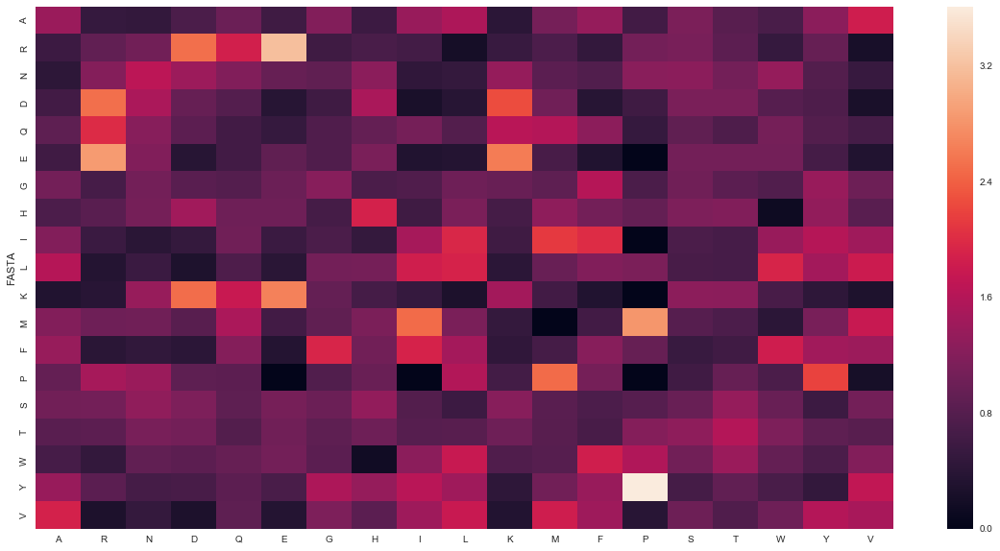

In [146]:
plot_heat_map(barrel_hbonds_propensity)

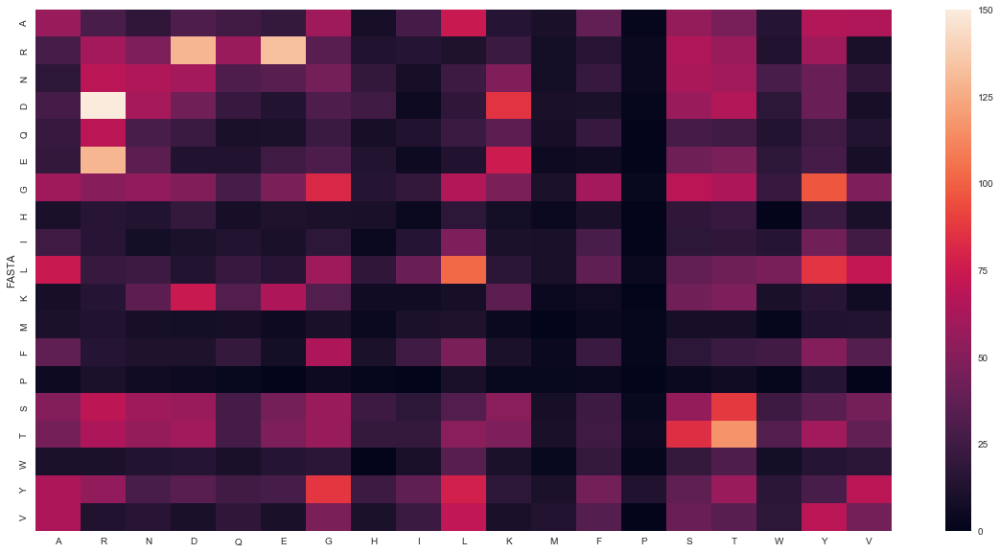

In [147]:
plot_heat_map(barrel_hbonds_frequency)

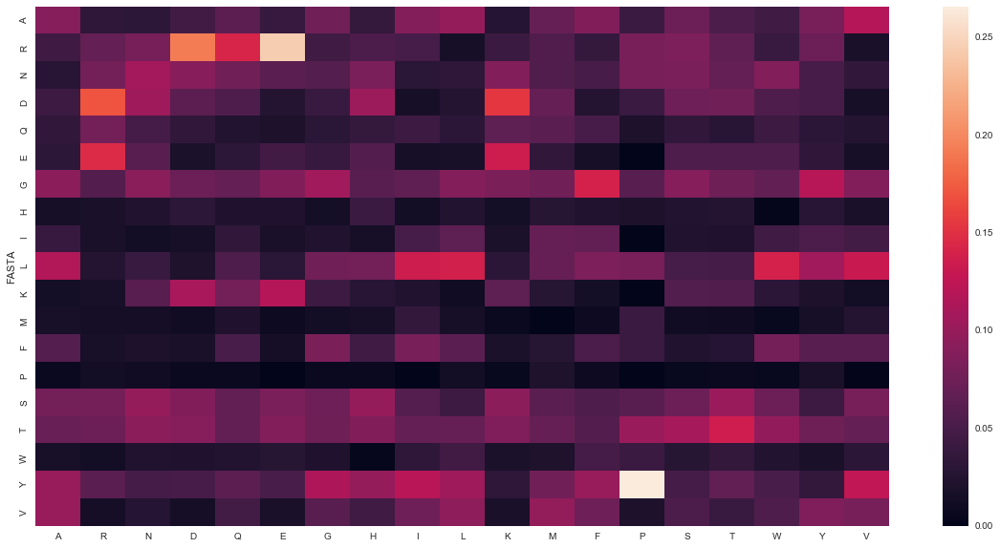

In [148]:
plot_heat_map(barrel_hbonds_normed_frequencies)

In [149]:
(int_barrel_hbonds_propensity, int_barrel_hbonds_frequency, int_barrel_hbonds_normed_frequencies
 ) = calc_aa_pair_propensities(int_barrel_df, 'h_bonds_fasta_intra', aa_dict_no_cys)

In [150]:
int_barrel_hbonds_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.367202,0.688445,0.593498,1.114625,1.255554,0.710922,1.001633,1.044494,1.189904,0.783034,0.569327,1.125884,1.832536,0.000000,1.473625,0.919472,0.753853,0.935536,1.965042
1,R,0.786888,0.659748,0.770158,1.909059,1.546996,2.543963,0.570436,0.460014,0.748651,0.369495,0.341921,0.991719,0.776040,1.363614,0.932090,0.759285,0.415013,1.270417,0.509082
2,N,0.518029,1.004754,1.734745,1.345192,1.177987,0.838028,0.968419,1.108116,0.644073,0.593378,1.098192,0.853188,0.427287,3.754025,1.164223,0.970501,0.571265,0.661681,0.262782
3,D,0.984361,2.160744,1.342966,0.457728,0.662916,0.281518,0.656502,1.819881,0.269252,0.442962,1.475659,1.426684,0.781486,1.961690,1.067755,0.858239,0.995060,0.740926,0.457728
4,Q,1.052035,1.640247,1.052550,0.559082,0.674754,0.445737,0.779596,0.707272,1.342892,1.009954,1.577111,2.287152,1.590883,0.000000,0.849238,0.630026,1.985145,1.055820,0.913167
5,E,0.734588,2.250433,1.002201,0.325318,0.518265,0.529104,0.707663,0.987711,0.401863,0.705205,2.161663,0.709784,0.666504,0.000000,0.815353,0.905714,1.980194,0.638933,0.819800
6,G,1.043880,0.575525,0.956863,0.888463,0.690446,0.850010,0.779596,0.986891,1.249202,1.526675,1.113894,0.709194,2.885787,0.000000,0.921654,0.689495,1.187130,2.357179,1.516888
7,H,1.745599,0.626683,0.744227,1.594418,0.839693,0.832043,0.970164,2.933869,1.193682,0.785520,0.908624,2.371861,0.494941,0.000000,0.880691,1.383586,0.000000,0.656954,0.405852
8,I,0.811487,0.532718,0.664269,0.754683,1.249131,0.722020,1.172615,1.091108,1.331794,3.213490,1.216504,2.352259,1.840691,0.000000,0.900707,1.029113,1.312493,0.651525,1.207493
9,L,0.773911,0.754136,0.989859,0.578360,0.744556,0.860734,1.451661,0.650365,2.646093,1.567170,0.725108,1.402086,0.877728,0.000000,1.073749,0.766766,1.173485,1.165042,2.339146


In [151]:
int_barrel_hbonds_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,22,27,14,27,21,18,29,5,7,7,11,5,13,0,47,28,3,15,17
1,R,23,47,33,84,47,117,30,4,8,6,12,8,10,1,54,42,3,37,8
2,N,11,52,54,43,26,28,37,7,5,7,28,5,4,2,49,39,3,14,3
3,D,20,107,40,14,14,9,24,11,2,5,36,8,7,1,43,33,5,15,5
4,Q,15,57,22,12,10,10,20,3,7,8,27,9,10,0,24,17,7,15,7
5,E,15,112,30,10,11,17,26,6,3,8,53,4,6,0,33,35,10,13,9
6,G,32,43,43,41,22,41,43,9,14,26,41,6,39,0,56,40,9,72,25
7,H,8,7,5,11,4,6,8,4,2,2,5,3,1,0,8,12,0,3,1
8,I,5,8,6,7,8,7,13,2,3,11,9,4,5,0,11,12,2,4,4
9,L,8,19,15,9,8,14,27,2,10,9,9,4,4,0,22,15,3,12,13


In [152]:
int_barrel_hbonds_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.078853,0.039706,0.034230,0.064286,0.072414,0.041002,0.057769,0.060241,0.068627,0.045161,0.032836,0.064935,0.105691,0.000000,0.084991,0.053030,0.043478,0.053957,0.113333
1,R,0.082437,0.069118,0.080685,0.200000,0.162069,0.266515,0.059761,0.048193,0.078431,0.038710,0.035821,0.103896,0.081301,0.142857,0.097649,0.079545,0.043478,0.133094,0.053333
2,N,0.039427,0.076471,0.132029,0.102381,0.089655,0.063781,0.073705,0.084337,0.049020,0.045161,0.083582,0.064935,0.032520,0.285714,0.088608,0.073864,0.043478,0.050360,0.020000
3,D,0.071685,0.157353,0.097800,0.033333,0.048276,0.020501,0.047809,0.132530,0.019608,0.032258,0.107463,0.103896,0.056911,0.142857,0.077758,0.062500,0.072464,0.053957,0.033333
4,Q,0.053763,0.083824,0.053790,0.028571,0.034483,0.022779,0.039841,0.036145,0.068627,0.051613,0.080597,0.116883,0.081301,0.000000,0.043400,0.032197,0.101449,0.053957,0.046667
5,E,0.053763,0.164706,0.073350,0.023810,0.037931,0.038724,0.051793,0.072289,0.029412,0.051613,0.158209,0.051948,0.048780,0.000000,0.059675,0.066288,0.144928,0.046763,0.060000
6,G,0.114695,0.063235,0.105134,0.097619,0.075862,0.093394,0.085657,0.108434,0.137255,0.167742,0.122388,0.077922,0.317073,0.000000,0.101266,0.075758,0.130435,0.258993,0.166667
7,H,0.028674,0.010294,0.012225,0.026190,0.013793,0.013667,0.015936,0.048193,0.019608,0.012903,0.014925,0.038961,0.008130,0.000000,0.014467,0.022727,0.000000,0.010791,0.006667
8,I,0.017921,0.011765,0.014670,0.016667,0.027586,0.015945,0.025896,0.024096,0.029412,0.070968,0.026866,0.051948,0.040650,0.000000,0.019892,0.022727,0.028986,0.014388,0.026667
9,L,0.028674,0.027941,0.036675,0.021429,0.027586,0.031891,0.053785,0.024096,0.098039,0.058065,0.026866,0.051948,0.032520,0.000000,0.039783,0.028409,0.043478,0.043165,0.086667


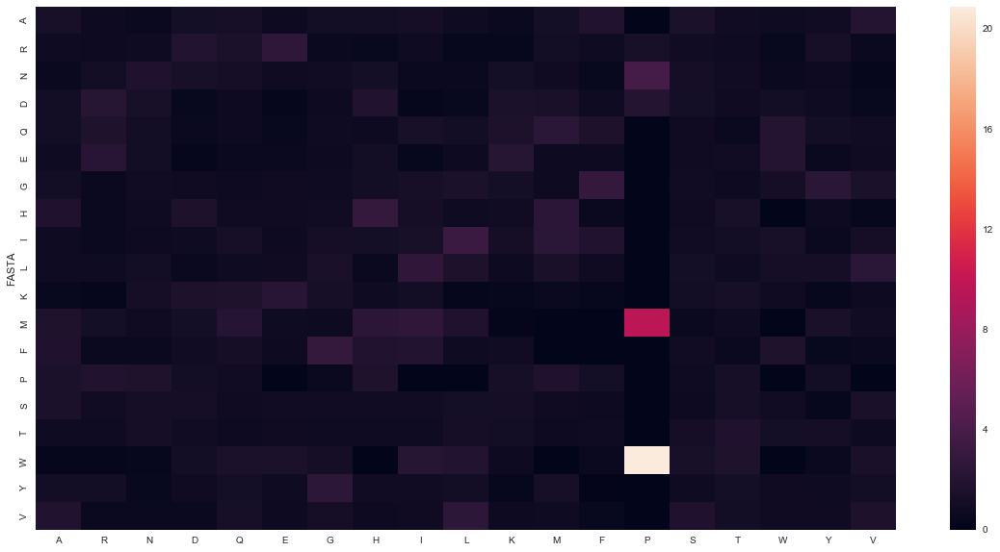

In [153]:
plot_heat_map(int_barrel_hbonds_propensity)

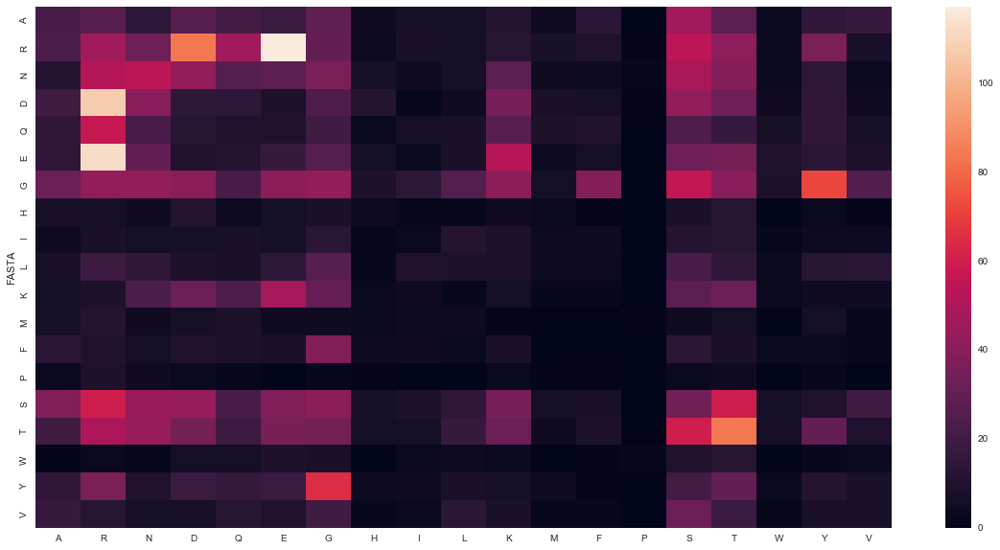

In [154]:
plot_heat_map(int_barrel_hbonds_frequency)

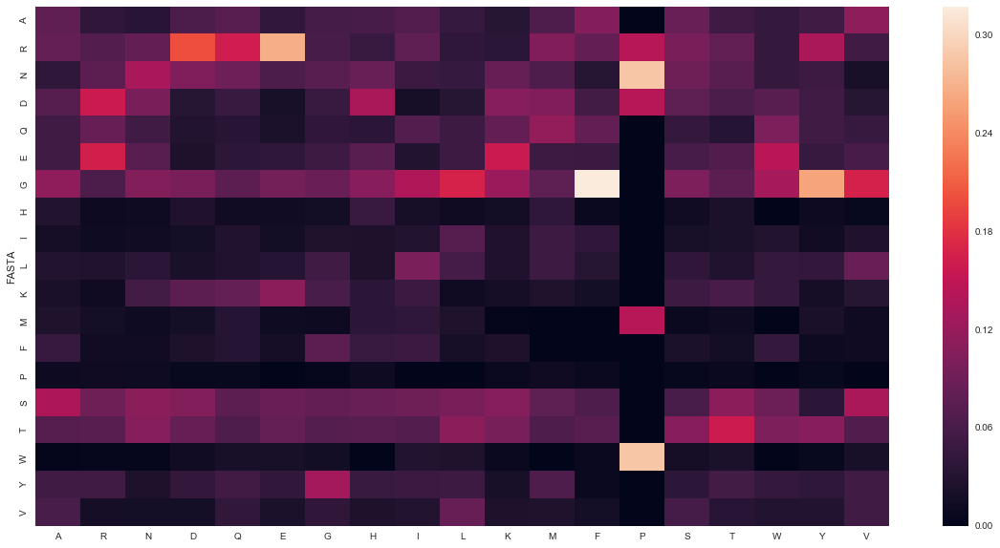

In [155]:
plot_heat_map(int_barrel_hbonds_normed_frequencies)

In [156]:
(ext_barrel_hbonds_propensity, ext_barrel_hbonds_frequency, ext_barrel_hbonds_normed_frequencies
 ) = calc_aa_pair_propensities(ext_barrel_df, 'h_bonds_fasta_intra', aa_dict_no_cys)

In [157]:
ext_barrel_hbonds_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.358222,0.139235,0.366504,0.220779,0.592046,0.388426,1.550806,0.346347,1.358222,1.573236,0.246291,1.049535,1.103015,0.659708,0.579929,0.737780,0.636959,1.325605,1.666631
1,R,0.317921,1.596952,1.801550,4.069637,2.134144,3.394322,0.423499,1.276849,0.778905,0.230843,1.109755,0.000000,0.433749,1.621395,1.161371,1.007376,0.869714,0.936941,0.113782
2,N,0.373244,1.626143,1.107882,1.365091,0.813480,1.067407,0.568222,1.546629,0.373244,0.548479,1.776640,0.865247,1.091203,0.906449,1.239517,1.182675,1.896250,0.964271,0.763326
3,D,0.316013,3.482496,1.876014,1.862085,1.101994,0.753115,0.420958,1.410208,0.237010,0.382429,3.581481,0.488384,0.205308,0.383730,1.124419,1.573521,0.802746,0.786179,0.161571
4,Q,0.758431,2.332462,1.432593,1.695139,0.000000,0.361495,0.432985,1.450500,1.137647,0.983390,1.547200,0.000000,1.478217,0.920952,0.539721,0.915503,1.037395,0.725704,0.678596
5,E,0.533205,3.252285,1.208599,0.455030,0.650784,2.846420,0.568222,1.903543,0.373244,0.322634,3.722485,0.576831,0.121245,0.000000,1.593664,1.351628,1.166923,0.999985,0.000000
6,G,1.252302,0.665657,1.051316,0.527752,0.849139,0.928498,2.409592,0.620933,0.487006,1.122591,0.441553,1.254411,1.160130,1.182730,1.001195,1.175732,0.824739,0.776652,0.954484
7,H,0.203660,1.644123,1.731113,1.448342,1.553563,2.038507,0.406941,1.363252,0.356406,0.985854,0.484712,0.550809,1.041976,0.865557,1.859941,1.075544,0.139285,1.364104,0.820001
8,I,1.236842,0.887543,0.233626,0.351835,1.132186,0.618999,0.411896,0.275970,1.298684,1.384529,0.196246,2.007057,1.687462,0.000000,0.718806,0.457229,1.099652,1.615436,1.217313
9,L,1.646161,0.134235,0.424011,0.177375,1.065464,0.166434,1.063192,0.946075,1.353095,1.418641,0.316595,0.809476,0.935795,0.848022,0.662641,0.711285,1.466981,1.236235,1.316666


In [158]:
ext_barrel_hbonds_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,35,2,5,4,5,3,30,4,20,67,4,5,25,2,9,18,12,51,48
1,R,5,14,15,45,11,16,5,9,7,6,11,0,6,3,11,15,10,22,2
2,N,7,17,11,18,5,6,8,13,4,17,21,3,18,2,14,21,26,27,16
3,D,7,43,22,29,8,5,7,14,3,14,50,2,4,1,15,33,13,26,4
4,Q,7,12,7,11,0,1,3,6,6,15,9,0,12,1,3,8,7,10,7
5,E,5,17,6,3,2,8,4,8,2,5,22,1,1,0,9,12,8,14,0
6,G,27,8,12,8,6,6,39,6,6,40,6,5,22,3,13,24,13,25,23
7,H,2,9,9,10,5,6,3,6,2,16,3,1,9,1,11,10,1,20,9
8,I,20,8,2,4,6,3,5,2,12,37,2,6,24,0,7,7,13,39,22
9,L,66,3,9,5,14,2,32,17,31,94,8,6,33,4,16,27,43,74,59


In [159]:
ext_barrel_hbonds_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.098039,0.010050,0.026455,0.015936,0.042735,0.028037,0.111940,0.02500,0.098039,0.113559,0.017778,0.075758,0.079618,0.047619,0.041860,0.053254,0.045977,0.095685,0.120301
1,R,0.014006,0.070352,0.079365,0.179283,0.094017,0.149533,0.018657,0.05625,0.034314,0.010169,0.048889,0.000000,0.019108,0.071429,0.051163,0.044379,0.038314,0.041276,0.005013
2,N,0.019608,0.085427,0.058201,0.071713,0.042735,0.056075,0.029851,0.08125,0.019608,0.028814,0.093333,0.045455,0.057325,0.047619,0.065116,0.062130,0.099617,0.050657,0.040100
3,D,0.019608,0.216080,0.116402,0.115538,0.068376,0.046729,0.026119,0.08750,0.014706,0.023729,0.222222,0.030303,0.012739,0.023810,0.069767,0.097633,0.049808,0.048780,0.010025
4,Q,0.019608,0.060302,0.037037,0.043825,0.000000,0.009346,0.011194,0.03750,0.029412,0.025424,0.040000,0.000000,0.038217,0.023810,0.013953,0.023669,0.026820,0.018762,0.017544
5,E,0.014006,0.085427,0.031746,0.011952,0.017094,0.074766,0.014925,0.05000,0.009804,0.008475,0.097778,0.015152,0.003185,0.000000,0.041860,0.035503,0.030651,0.026266,0.000000
6,G,0.075630,0.040201,0.063492,0.031873,0.051282,0.056075,0.145522,0.03750,0.029412,0.067797,0.026667,0.075758,0.070064,0.071429,0.060465,0.071006,0.049808,0.046904,0.057644
7,H,0.005602,0.045226,0.047619,0.039841,0.042735,0.056075,0.011194,0.03750,0.009804,0.027119,0.013333,0.015152,0.028662,0.023810,0.051163,0.029586,0.003831,0.037523,0.022556
8,I,0.056022,0.040201,0.010582,0.015936,0.051282,0.028037,0.018657,0.01250,0.058824,0.062712,0.008889,0.090909,0.076433,0.000000,0.032558,0.020710,0.049808,0.073171,0.055138
9,L,0.184874,0.015075,0.047619,0.019920,0.119658,0.018692,0.119403,0.10625,0.151961,0.159322,0.035556,0.090909,0.105096,0.095238,0.074419,0.079882,0.164751,0.138837,0.147870


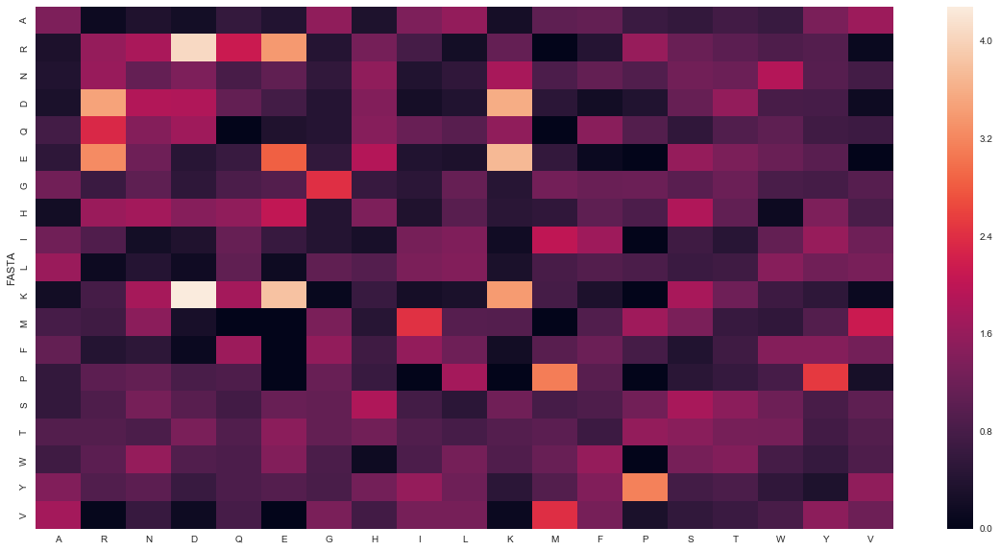

In [160]:
plot_heat_map(ext_barrel_hbonds_propensity)

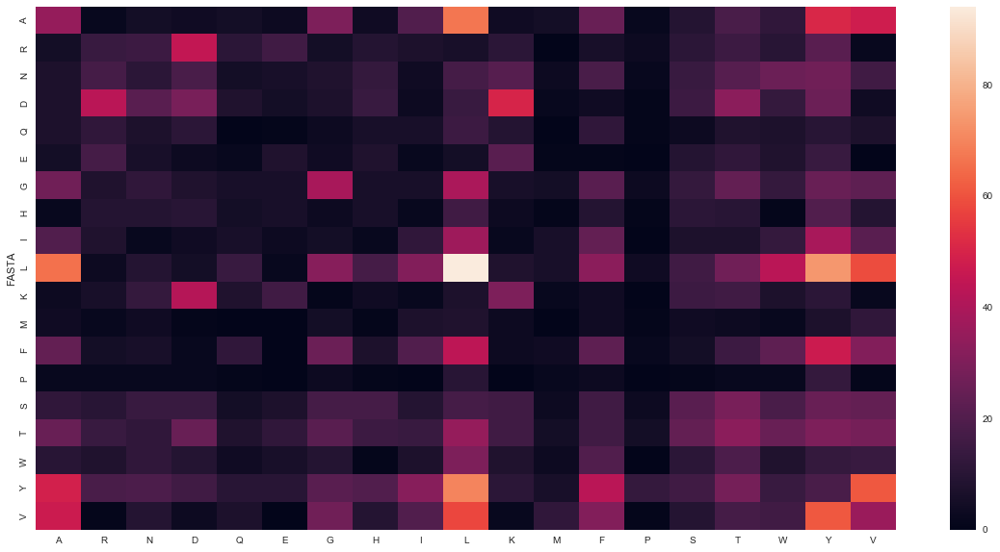

In [161]:
plot_heat_map(ext_barrel_hbonds_frequency)

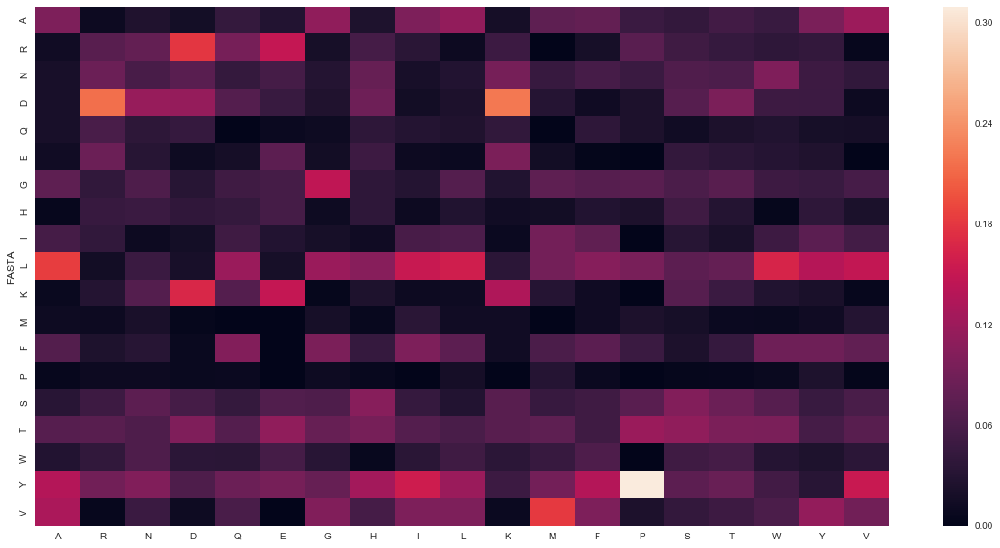

In [162]:
plot_heat_map(ext_barrel_hbonds_normed_frequencies)

### Ionic interactions amino acid propensities

In [163]:
(barrel_ionic_propensity, barrel_ionic_frequency, barrel_ionic_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'ionic_fasta_intra', aa_dict_no_cys)

In [164]:
barrel_ionic_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.000000,NaN,2.055797,NaN,1.718423,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,2.265455,NaN,0.000000,NaN,0.000000,NaN,2.696970,NaN,NaN,1.716253,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,1.722581,NaN,0.000000,NaN,0.000000,NaN,0.956989,NaN,NaN,2.696970,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,0.000000,NaN,2.011299,NaN,1.797980,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [165]:
barrel_ionic_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.0,NaN,77.0,NaN,36.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,70.0,NaN,0.0,NaN,0.0,NaN,5.0,NaN,NaN,35.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,30.0,NaN,0.0,NaN,0.0,NaN,1.0,NaN,NaN,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,0.0,NaN,6.0,NaN,3.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [166]:
barrel_ionic_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.0,NaN,0.652542,NaN,0.545455,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,0.7,NaN,0.000000,NaN,0.000000,NaN,0.833333,NaN,NaN,0.530303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,0.3,NaN,0.000000,NaN,0.000000,NaN,0.166667,NaN,NaN,0.469697,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,0.0,NaN,0.050847,NaN,0.045455,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


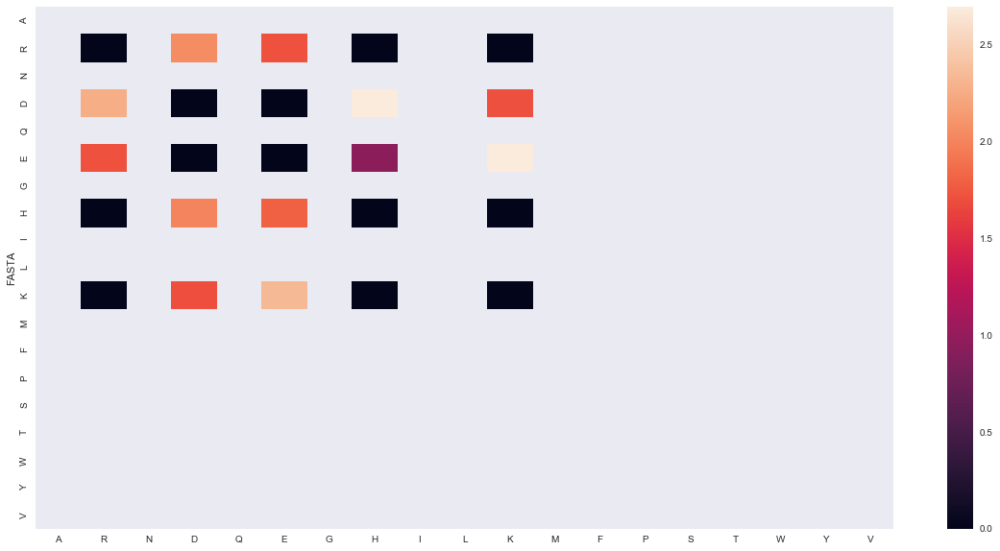

In [167]:
plot_heat_map(barrel_ionic_propensity)

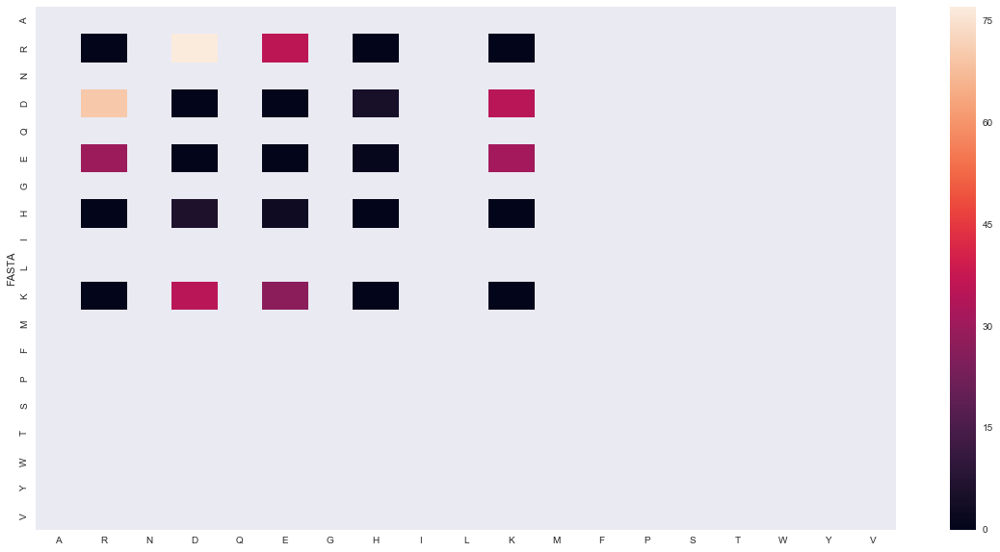

In [168]:
plot_heat_map(barrel_ionic_frequency)

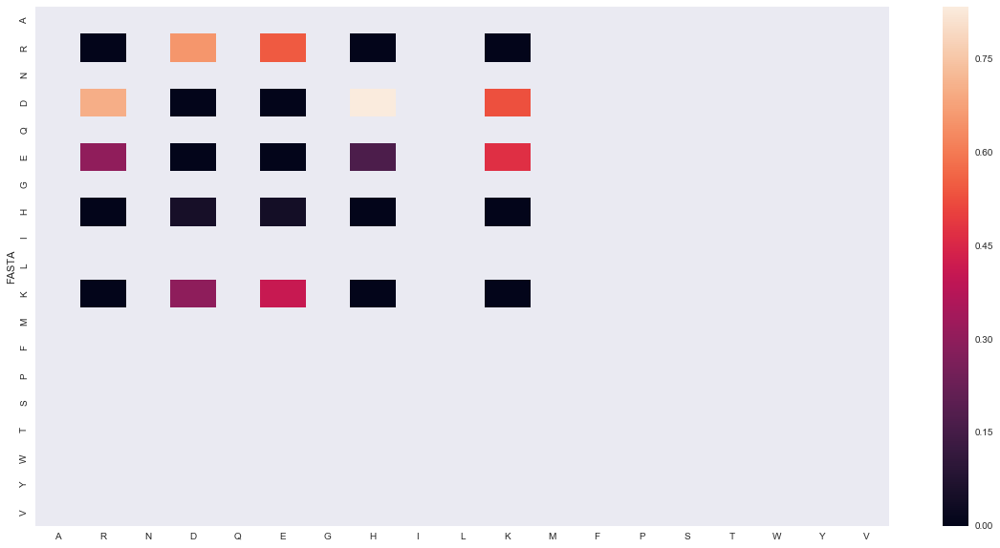

In [169]:
plot_heat_map(barrel_ionic_normed_frequencies)

In [170]:
(int_barrel_ionic_propensity, int_barrel_ionic_frequency, int_barrel_ionic_normed_frequencies
 ) = calc_aa_pair_propensities(int_barrel_df, 'ionic_fasta_intra', aa_dict_no_cys)

In [171]:
int_barrel_ionic_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.000000,NaN,2.016234,NaN,1.714912,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,2.330263,NaN,0.000000,NaN,0.000000,NaN,3.614286,NaN,NaN,1.674913,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,1.834318,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,NaN,2.770533,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,0.000000,NaN,1.642857,NaN,2.219298,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [172]:
int_barrel_ionic_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.0,NaN,54.0,NaN,34.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,49.0,NaN,0.0,NaN,0.0,NaN,2.0,NaN,NaN,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,27.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,0.0,NaN,2.0,NaN,2.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [173]:
int_barrel_ionic_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.000000,NaN,0.701299,NaN,0.596491,NaN,0.0,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,0.644737,NaN,0.000000,NaN,0.000000,NaN,1.0,NaN,NaN,0.463415,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,0.355263,NaN,0.000000,NaN,0.000000,NaN,0.0,NaN,NaN,0.536585,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,0.000000,NaN,0.025974,NaN,0.035088,NaN,0.0,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


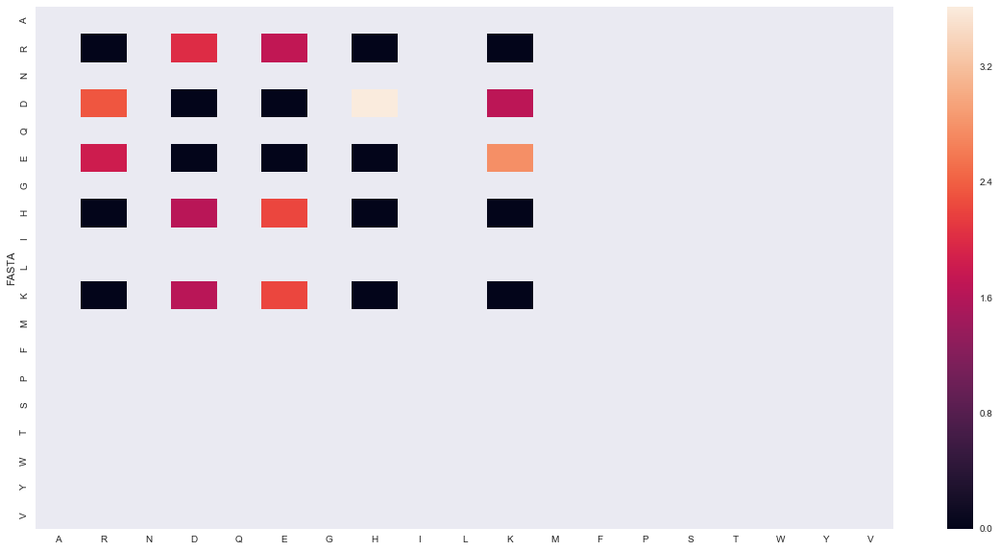

In [174]:
plot_heat_map(int_barrel_ionic_propensity)

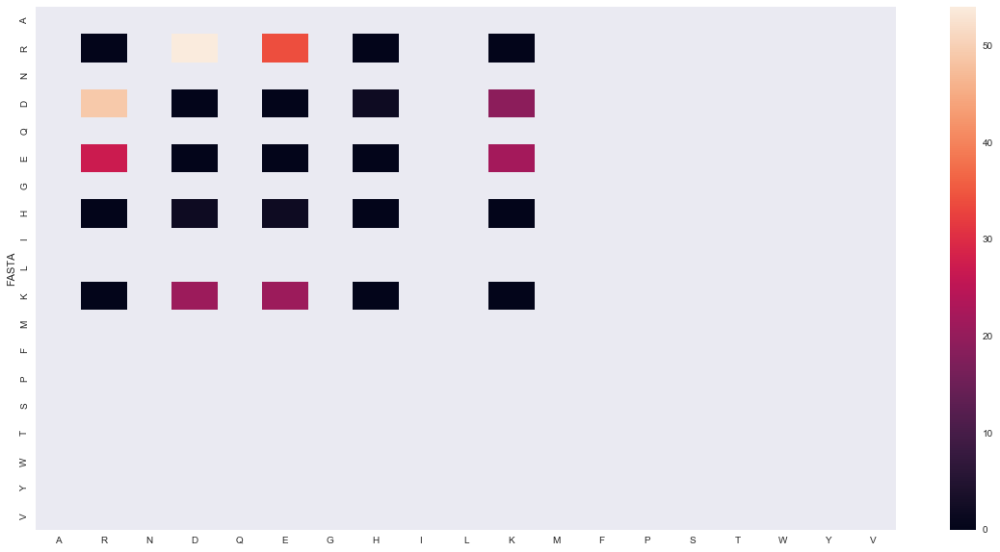

In [175]:
plot_heat_map(int_barrel_ionic_frequency)

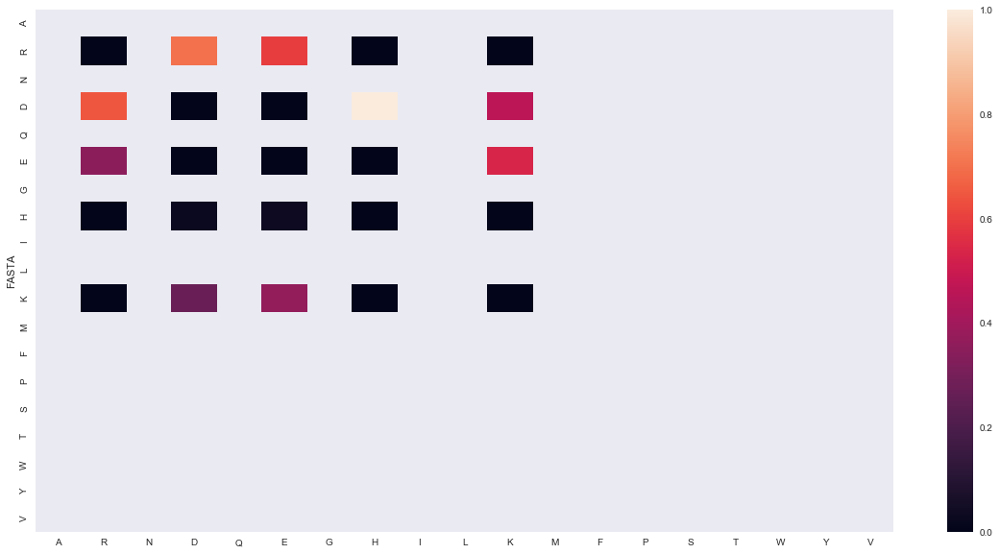

In [176]:
plot_heat_map(int_barrel_ionic_normed_frequencies)

In [177]:
(ext_barrel_ionic_propensity, ext_barrel_ionic_frequency, ext_barrel_ionic_normed_frequencies
 ) = calc_aa_pair_propensities(ext_barrel_df, 'ionic_fasta_intra', aa_dict_no_cys)

In [178]:
ext_barrel_ionic_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.000000,NaN,2.311220,NaN,0.915556,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,2.253125,NaN,0.000000,NaN,0.000000,NaN,1.931250,NaN,NaN,1.648000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,0.990385,NaN,0.000000,NaN,0.000000,NaN,1.980769,NaN,NaN,2.852308,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,0.000000,NaN,2.009756,NaN,2.288889,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [179]:
ext_barrel_ionic_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.0,NaN,23.0,NaN,2.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,21.0,NaN,0.0,NaN,0.0,NaN,3.0,NaN,NaN,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,3.0,NaN,0.0,NaN,0.0,NaN,1.0,NaN,NaN,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,0.0,NaN,4.0,NaN,1.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [180]:
ext_barrel_ionic_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.000,NaN,0.560976,NaN,0.222222,NaN,0.00,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,0.875,NaN,0.000000,NaN,0.000000,NaN,0.75,NaN,NaN,0.64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,0.125,NaN,0.000000,NaN,0.000000,NaN,0.25,NaN,NaN,0.36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,0.000,NaN,0.097561,NaN,0.111111,NaN,0.00,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


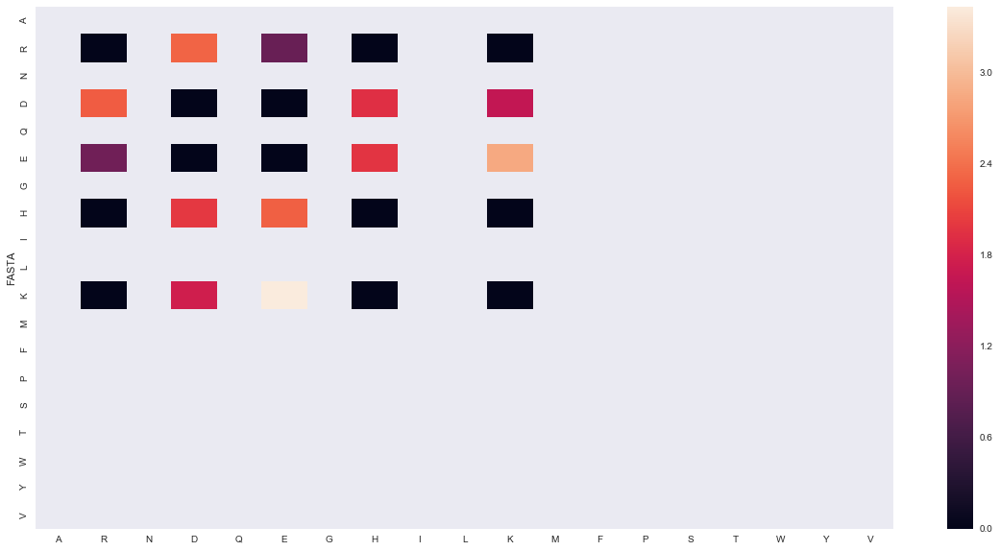

In [181]:
plot_heat_map(ext_barrel_ionic_propensity)

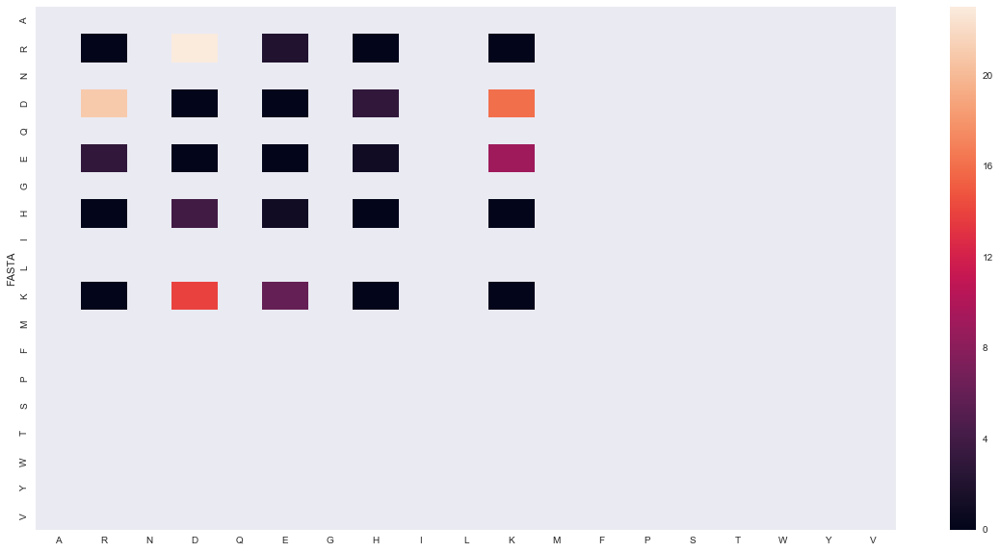

In [182]:
plot_heat_map(ext_barrel_ionic_frequency)

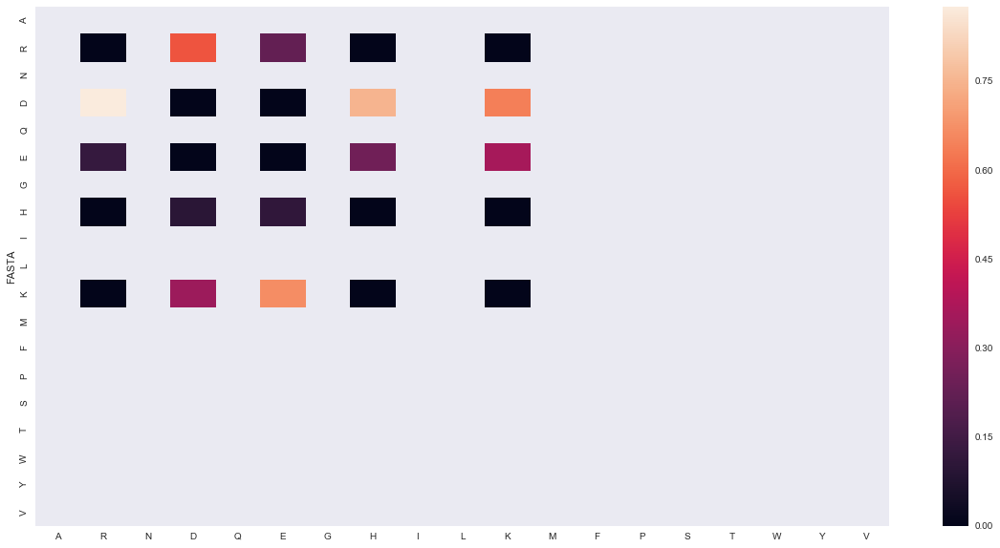

In [183]:
plot_heat_map(ext_barrel_ionic_normed_frequencies)

### Disulphide bonds amino acid propensities

In [184]:
(barrel_ss_propensity, barrel_ss_frequency, barrel_ss_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'ss_bonds_fasta_intra', aa_dict_no_cys)

In [185]:
barrel_ss_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [186]:
barrel_ss_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [187]:
barrel_ss_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Pi-pi stacking interactions amino acid propensities

In [188]:
(barrel_pipi_propensity, barrel_pipi_frequency, barrel_pipi_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'pi_pi_stacking_fasta_intra', aa_dict_no_cys)

In [189]:
barrel_pipi_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.174268,NaN,NaN,NaN,NaN,0.691106,NaN,NaN,NaN,0.497596,1.357466,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [190]:
barrel_pipi_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,NaN,NaN,NaN,NaN,20.0,NaN,NaN,NaN,9.0,60.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [191]:
barrel_pipi_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.132743,NaN,NaN,NaN,NaN,0.078125,NaN,NaN,NaN,0.05625,0.153453,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


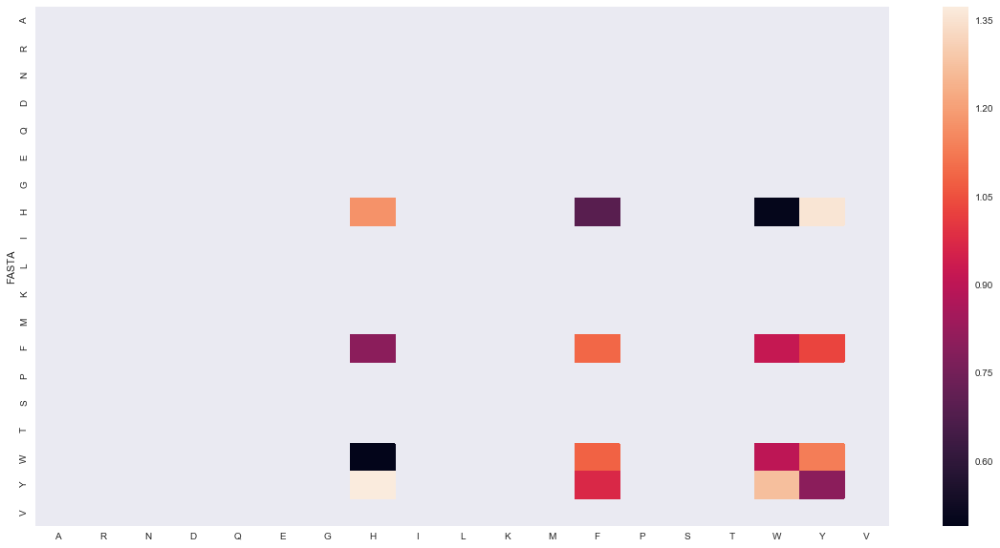

In [192]:
plot_heat_map(barrel_pipi_propensity)

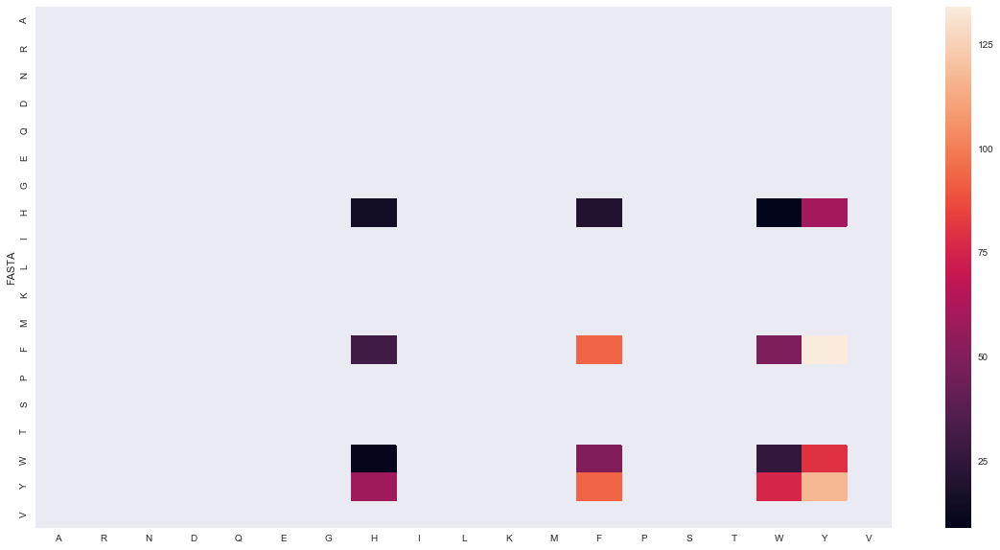

In [193]:
plot_heat_map(barrel_pipi_frequency)

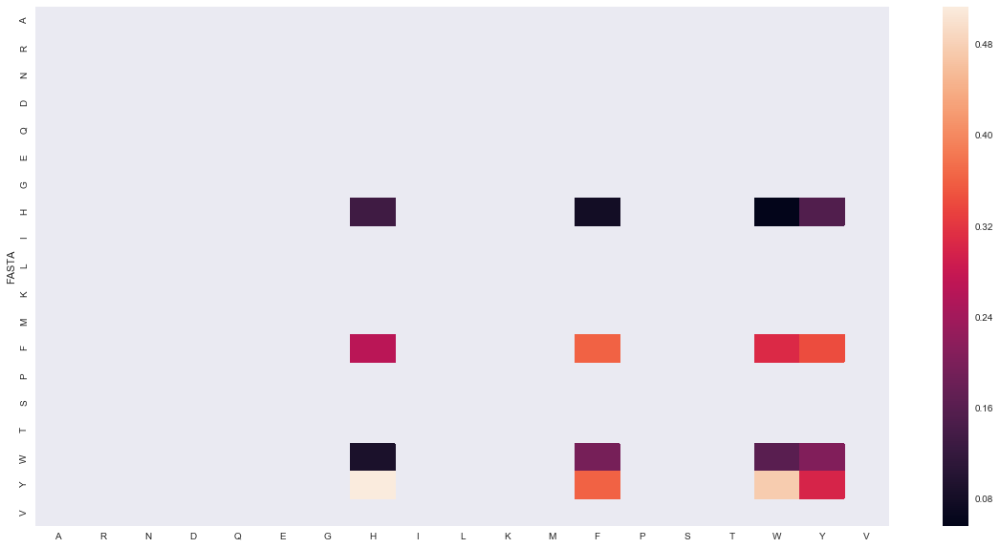

In [194]:
plot_heat_map(barrel_pipi_normed_frequencies)

In [195]:
(int_barrel_pipi_propensity, int_barrel_pipi_frequency, int_barrel_pipi_normed_frequencies
 ) = calc_aa_pair_propensities(int_barrel_df, 'pi_pi_stacking_fasta_intra', aa_dict_no_cys)

In [196]:
int_barrel_pipi_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.286290,NaN,NaN,NaN,NaN,0.880435,NaN,NaN,NaN,1.633065,0.542411,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [197]:
int_barrel_pipi_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,5.0,6.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [198]:
int_barrel_pipi_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.225806,NaN,NaN,NaN,NaN,0.086957,NaN,NaN,NaN,0.161290,0.053571,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


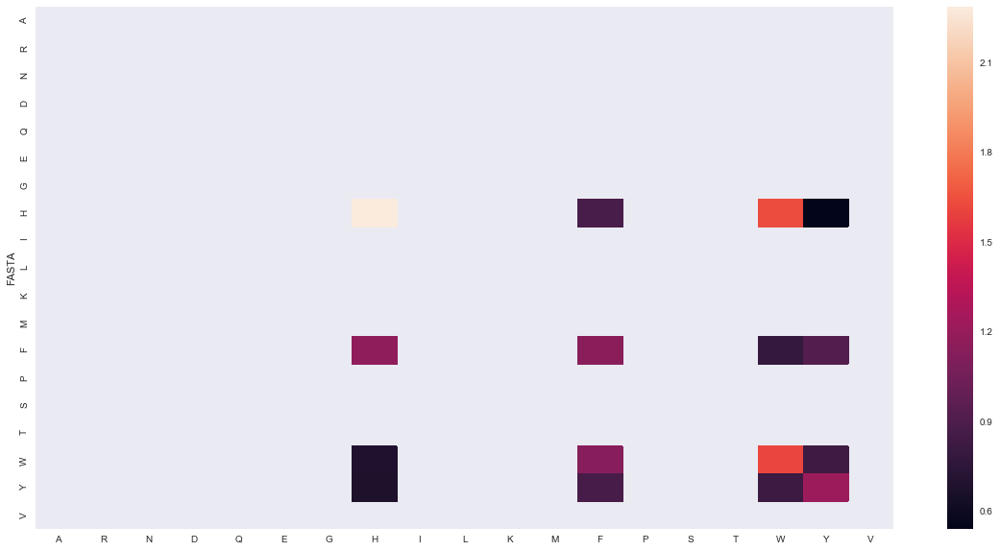

In [199]:
plot_heat_map(int_barrel_pipi_propensity)

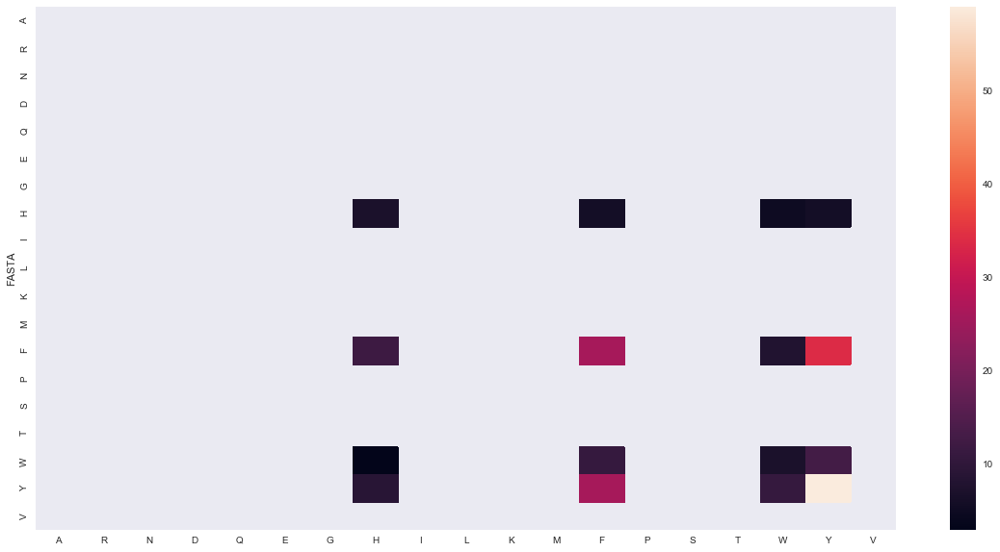

In [200]:
plot_heat_map(int_barrel_pipi_frequency)

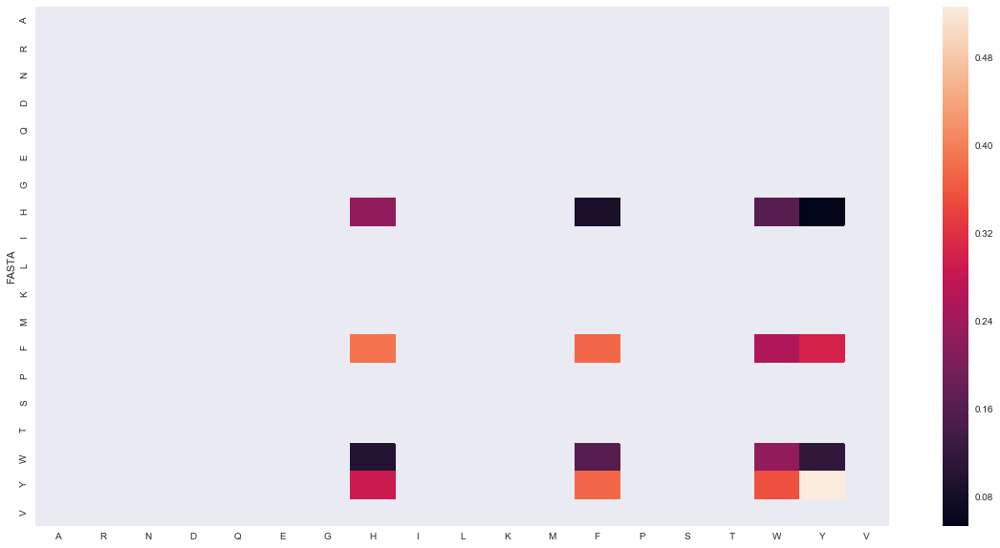

In [201]:
plot_heat_map(int_barrel_pipi_normed_frequencies)

In [202]:
(ext_barrel_pipi_propensity, ext_barrel_pipi_frequency, ext_barrel_pipi_normed_frequencies
 ) = calc_aa_pair_propensities(ext_barrel_df, 'pi_pi_stacking_fasta_intra', aa_dict_no_cys)

In [203]:
ext_barrel_pipi_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.825610,NaN,NaN,NaN,NaN,0.633556,NaN,NaN,NaN,0.262403,1.637903,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [204]:
ext_barrel_pipi_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.0,NaN,NaN,NaN,NaN,14.0,NaN,NaN,NaN,4.0,54.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [205]:
ext_barrel_pipi_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.097561,NaN,NaN,NaN,NaN,0.074866,NaN,NaN,NaN,0.031008,0.193548,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


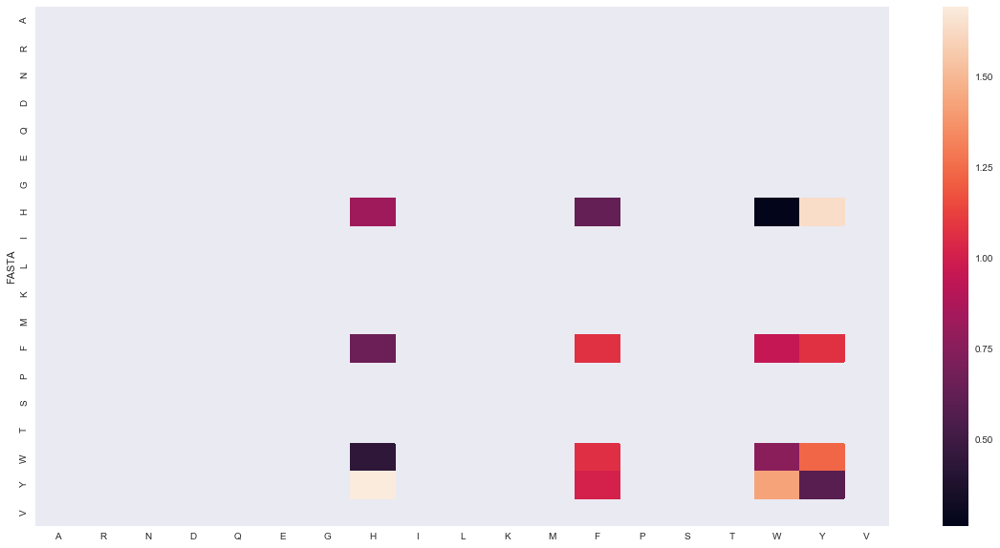

In [206]:
plot_heat_map(ext_barrel_pipi_propensity)

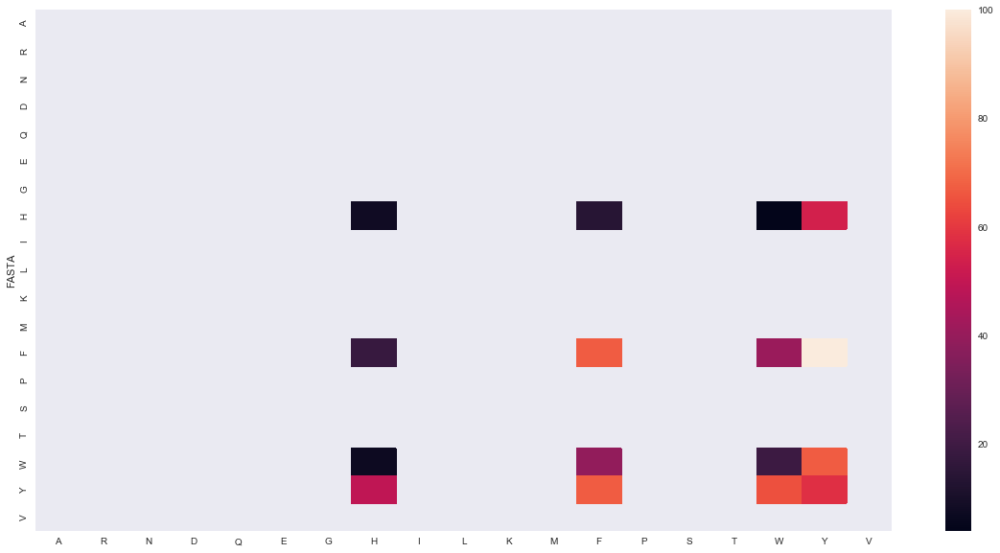

In [207]:
plot_heat_map(ext_barrel_pipi_frequency)

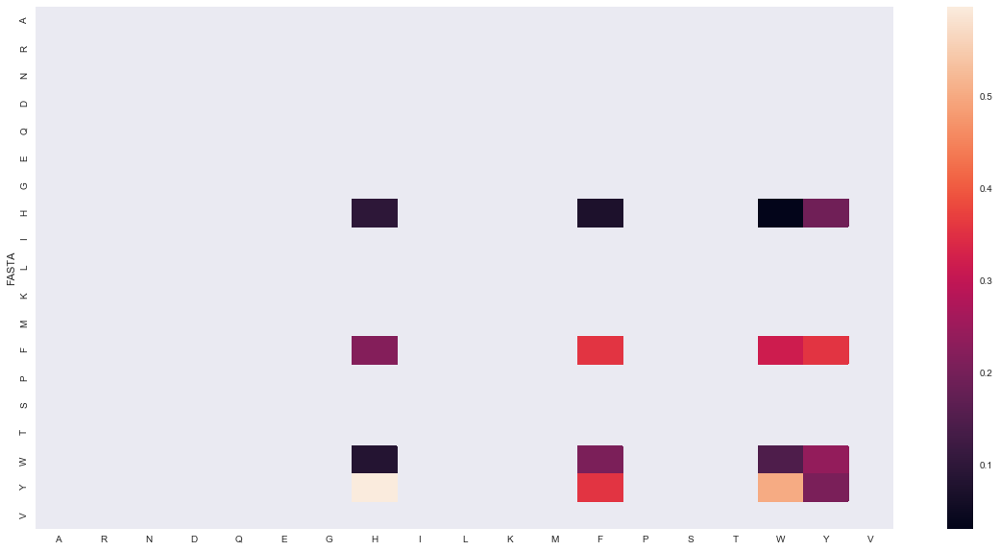

In [208]:
plot_heat_map(ext_barrel_pipi_normed_frequencies)

### Pi-pi stacking P interactions amino acid propensities

In [209]:
(barrel_pipi_p_propensity, barrel_pipi_p_frequency, barrel_pipi_p_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'pi_pi_stacking_fasta_intra_p', aa_dict_no_cys)

In [210]:
barrel_pipi_p_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.735135,NaN,NaN,NaN,NaN,0.877150,NaN,NaN,NaN,0.136860,1.643844,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [211]:
barrel_pipi_p_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,9.0,NaN,NaN,NaN,1.0,23.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [212]:
barrel_pipi_p_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.114286,NaN,NaN,NaN,NaN,0.136364,NaN,NaN,NaN,0.021277,0.255556,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


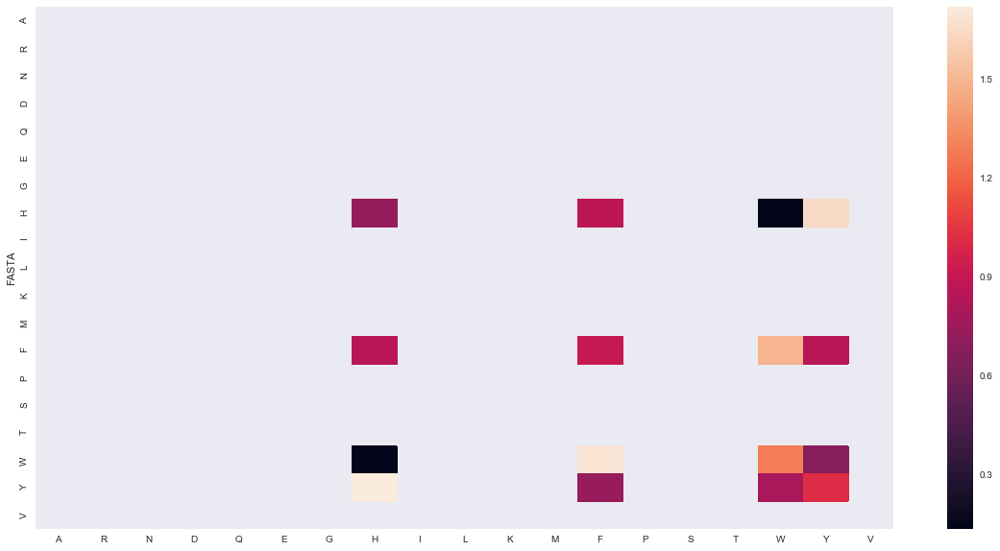

In [213]:
plot_heat_map(barrel_pipi_p_propensity)

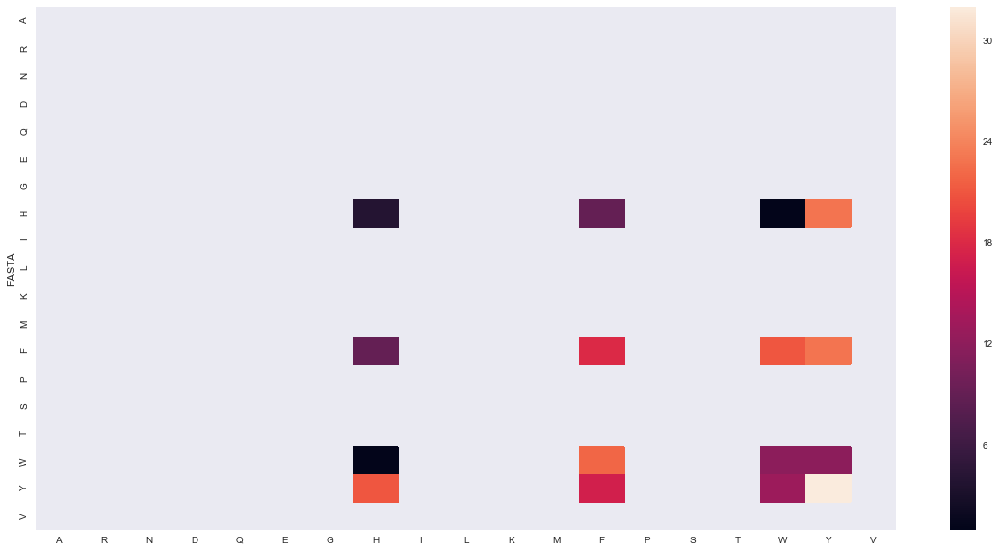

In [214]:
plot_heat_map(barrel_pipi_p_frequency)

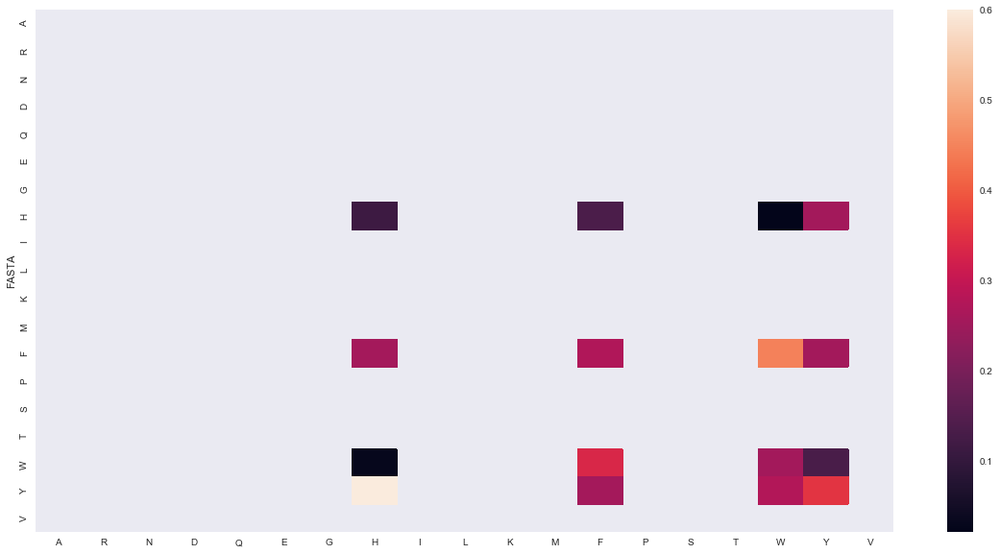

In [215]:
plot_heat_map(barrel_pipi_p_normed_frequencies)

In [216]:
(int_barrel_pipi_p_propensity, int_barrel_pipi_p_frequency, int_barrel_pipi_p_normed_frequencies
 ) = calc_aa_pair_propensities(int_barrel_df, 'pi_pi_stacking_fasta_intra_p', aa_dict_no_cys)

In [217]:
int_barrel_pipi_p_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,2.400000,NaN,NaN,NaN,0.000000,0.870968,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [218]:
int_barrel_pipi_p_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,0.0,3.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [219]:
int_barrel_pipi_p_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,0.266667,NaN,NaN,NaN,0.000,0.096774,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


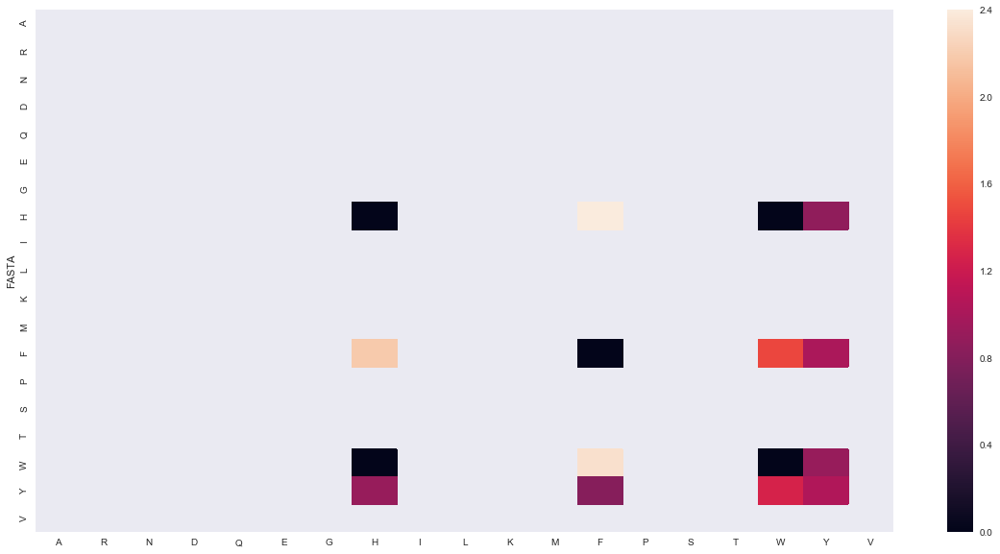

In [220]:
plot_heat_map(int_barrel_pipi_p_propensity)

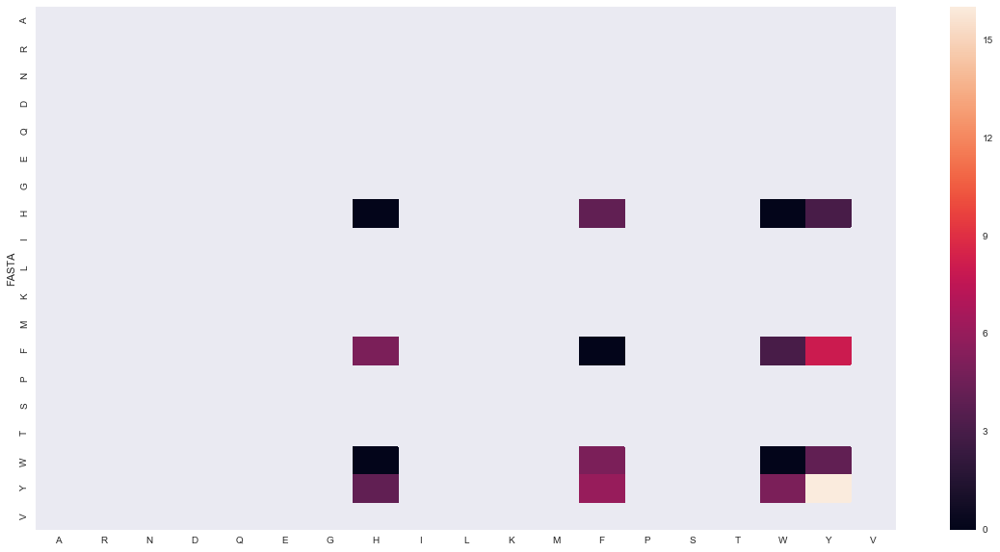

In [221]:
plot_heat_map(int_barrel_pipi_p_frequency)

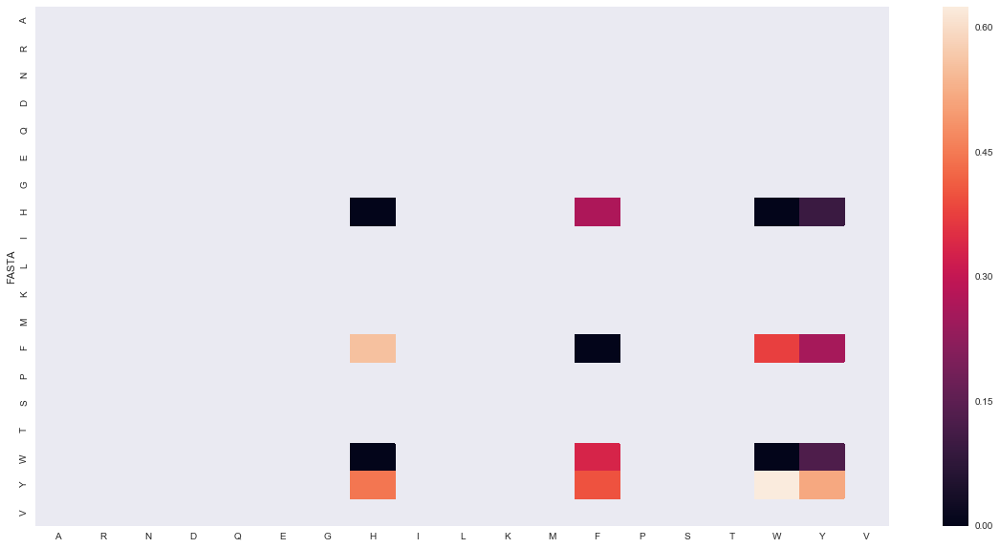

In [222]:
plot_heat_map(int_barrel_pipi_p_normed_frequencies)

In [223]:
(ext_barrel_pipi_p_propensity, ext_barrel_pipi_p_frequency, ext_barrel_pipi_p_normed_frequencies
 ) = calc_aa_pair_propensities(ext_barrel_df, 'pi_pi_stacking_fasta_intra_p', aa_dict_no_cys)

In [224]:
ext_barrel_pipi_p_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.897436,NaN,NaN,NaN,NaN,0.571895,NaN,NaN,NaN,0.149573,1.977401,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [225]:
ext_barrel_pipi_p_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,1.0,20.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [226]:
ext_barrel_pipi_p_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.153846,NaN,NaN,NaN,NaN,0.098039,NaN,NaN,NaN,0.025641,0.338983,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


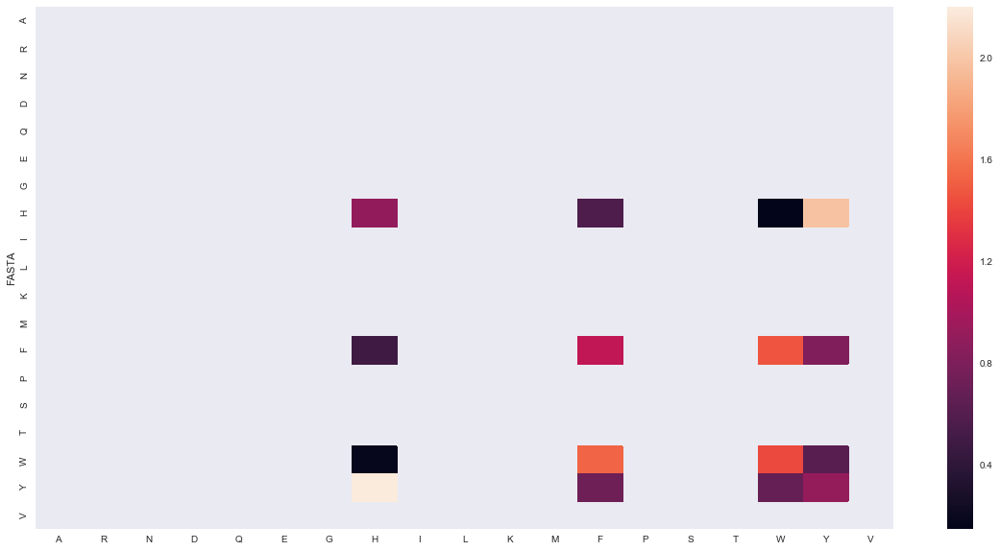

In [227]:
plot_heat_map(ext_barrel_pipi_p_propensity)

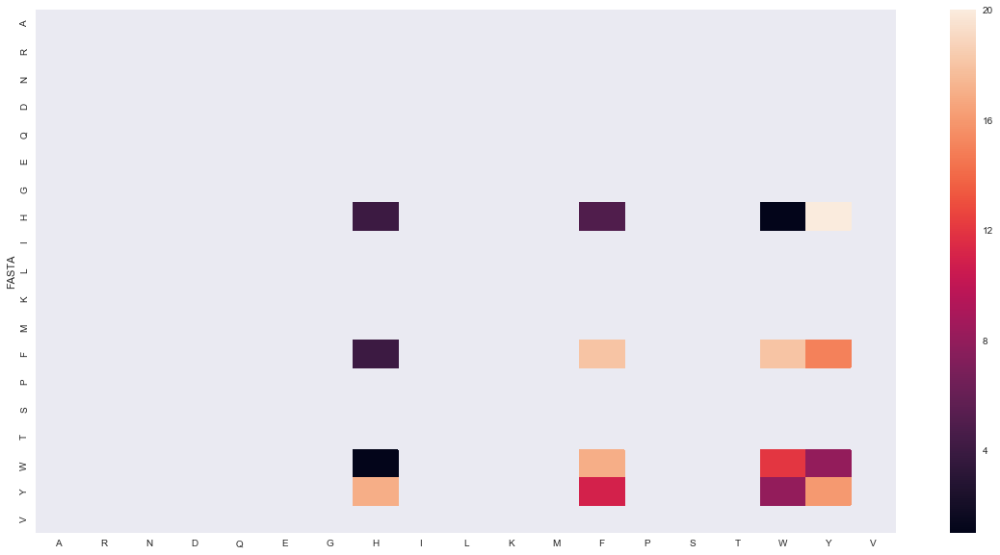

In [228]:
plot_heat_map(ext_barrel_pipi_p_frequency)

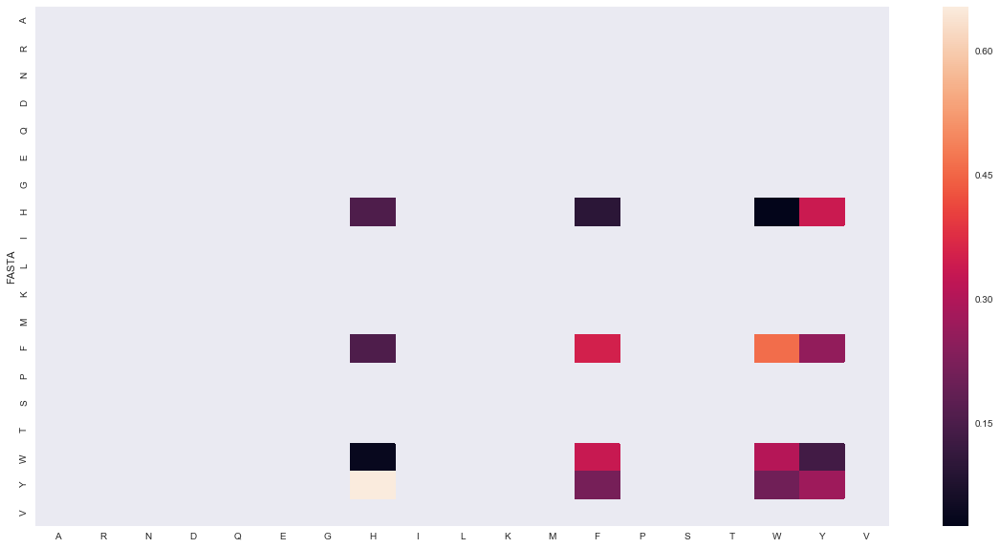

In [229]:
plot_heat_map(ext_barrel_pipi_p_normed_frequencies)

### Pi-pi stacking L interactions amino acid propensities

In [230]:
(barrel_pipi_l_propensity, barrel_pipi_l_frequency, barrel_pipi_l_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'pi_pi_stacking_fasta_intra_l', aa_dict_no_cys)

In [231]:
barrel_pipi_l_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.950413,NaN,NaN,NaN,NaN,0.784091,NaN,NaN,NaN,0.696970,1.280148,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [232]:
barrel_pipi_l_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,1.0,6.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [233]:
barrel_pipi_l_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.090909,NaN,NaN,NaN,NaN,0.075,NaN,NaN,NaN,0.066667,0.122449,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


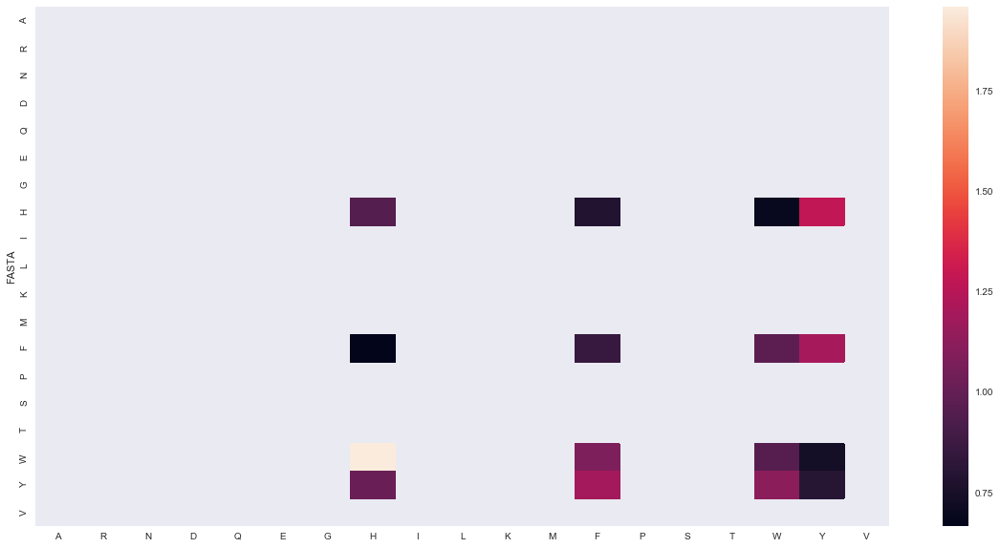

In [234]:
plot_heat_map(barrel_pipi_l_propensity)

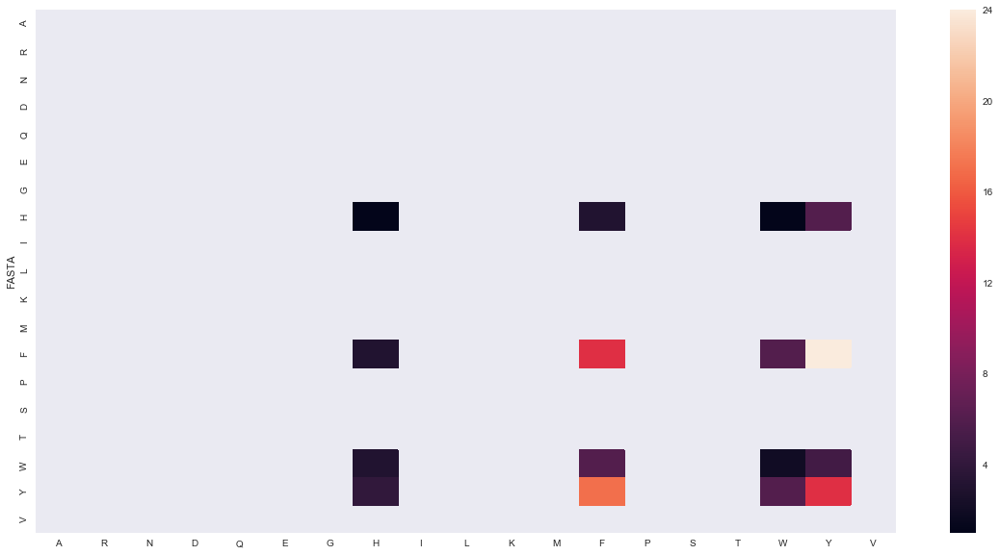

In [235]:
plot_heat_map(barrel_pipi_l_frequency)

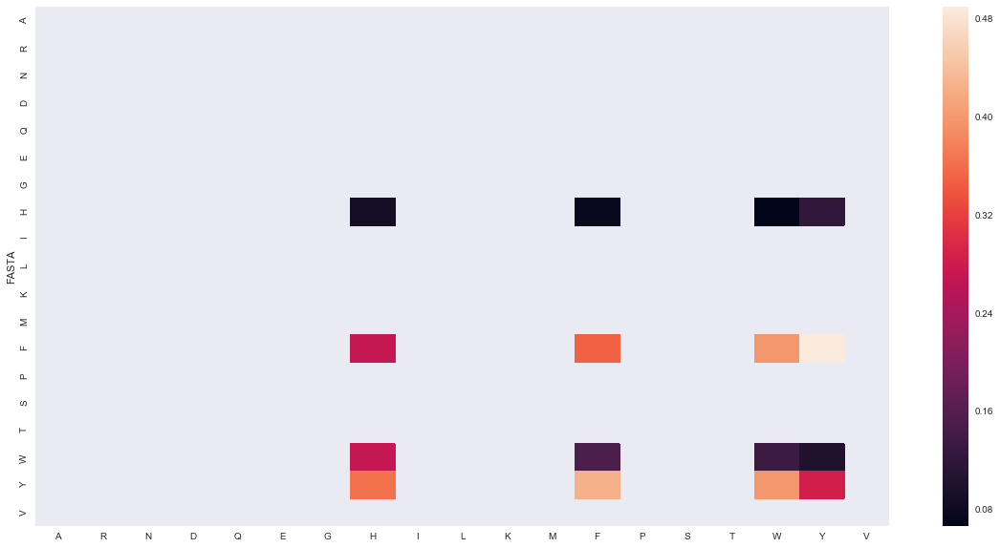

In [236]:
plot_heat_map(barrel_pipi_l_normed_frequencies)

In [237]:
(int_barrel_pipi_l_propensity, int_barrel_pipi_l_frequency, int_barrel_pipi_l_normed_frequencies
 ) = calc_aa_pair_propensities(int_barrel_df, 'pi_pi_stacking_fasta_intra_l', aa_dict_no_cys)

In [238]:
int_barrel_pipi_l_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.500000,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,1.117647,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [239]:
int_barrel_pipi_l_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,1.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [240]:
int_barrel_pipi_l_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.5,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.0,0.058824,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


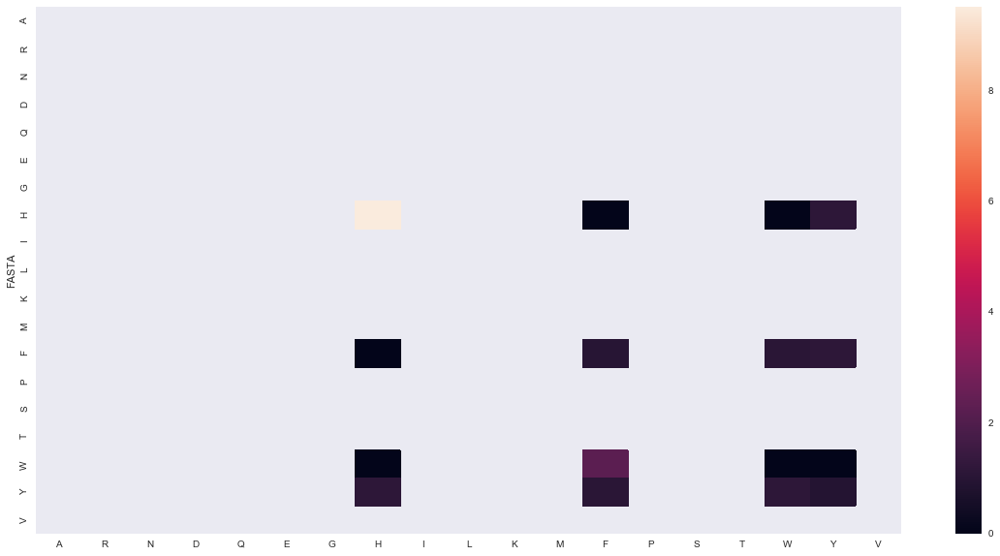

In [241]:
plot_heat_map(int_barrel_pipi_l_propensity)

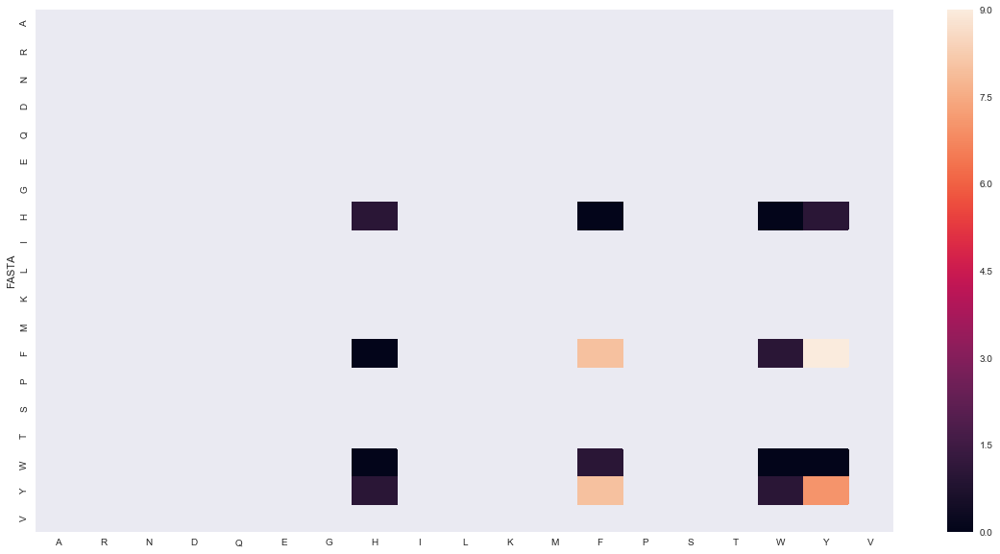

In [242]:
plot_heat_map(int_barrel_pipi_l_frequency)

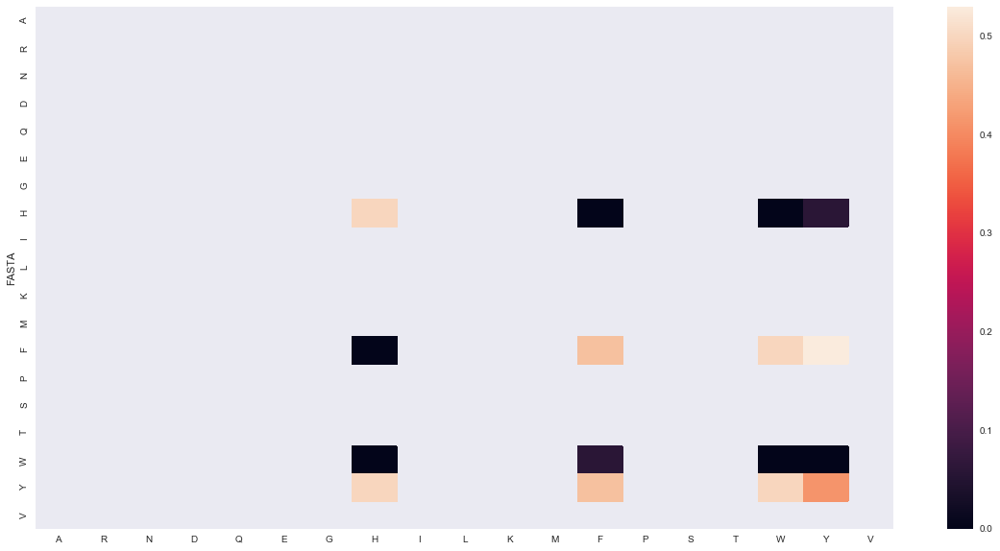

In [243]:
plot_heat_map(int_barrel_pipi_l_normed_frequencies)

In [244]:
(ext_barrel_pipi_l_propensity, ext_barrel_pipi_l_frequency, ext_barrel_pipi_l_normed_frequencies
 ) = calc_aa_pair_propensities(ext_barrel_df, 'pi_pi_stacking_fasta_intra_l', aa_dict_no_cys)

In [245]:
ext_barrel_pipi_l_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,1.115942,NaN,NaN,NaN,0.658120,1.336806,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [246]:
ext_barrel_pipi_l_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,1.0,5.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [247]:
ext_barrel_pipi_l_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,0.130435,NaN,NaN,NaN,0.076923,0.15625,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


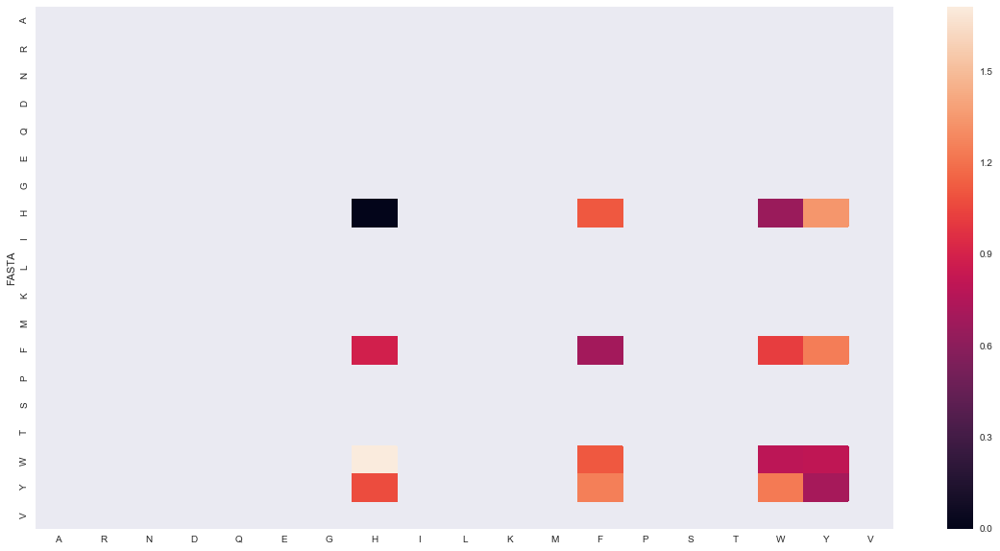

In [248]:
plot_heat_map(ext_barrel_pipi_l_propensity)

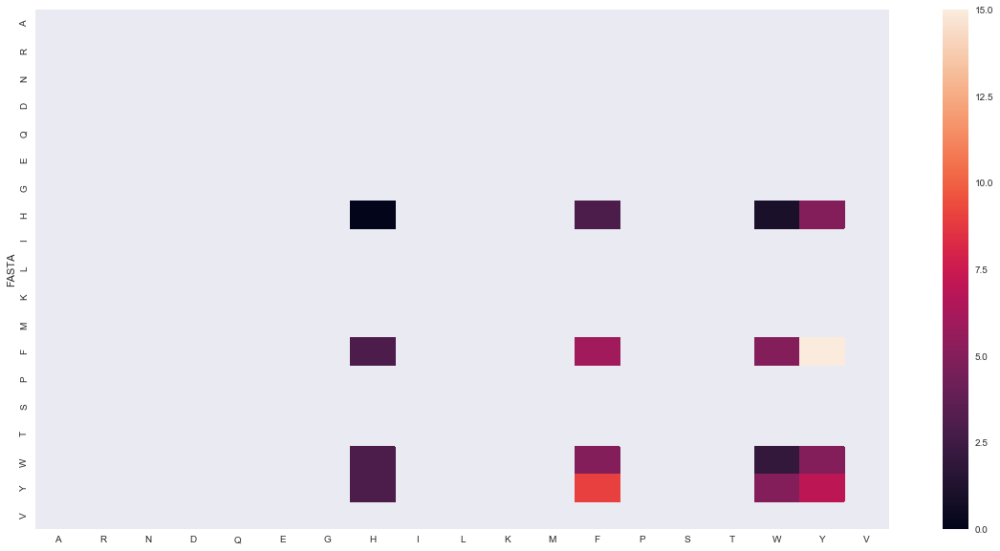

In [249]:
plot_heat_map(ext_barrel_pipi_l_frequency)

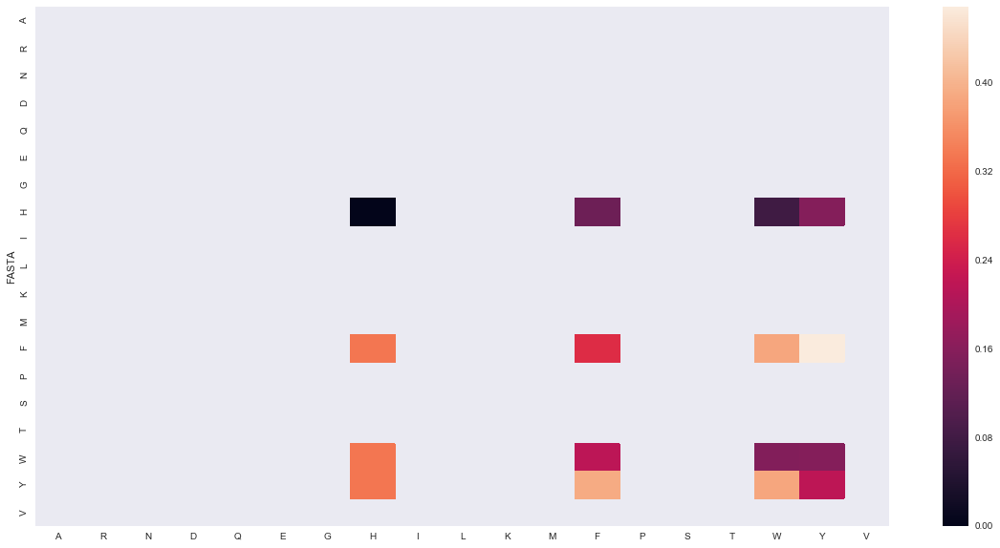

In [250]:
plot_heat_map(ext_barrel_pipi_l_normed_frequencies)

### Pi-pi stacking N interactions amino acid propensities

In [251]:
(barrel_pipi_n_propensity, barrel_pipi_n_frequency, barrel_pipi_n_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'pi_pi_stacking_fasta_intra_n', aa_dict_no_cys)

In [252]:
barrel_pipi_n_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.109091,NaN,NaN,NaN,NaN,0.659091,NaN,NaN,NaN,1.387560,0.738182,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [253]:
barrel_pipi_n_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,5.0,7.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [254]:
barrel_pipi_n_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.200000,NaN,NaN,NaN,NaN,0.06250,NaN,NaN,NaN,0.131579,0.07,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


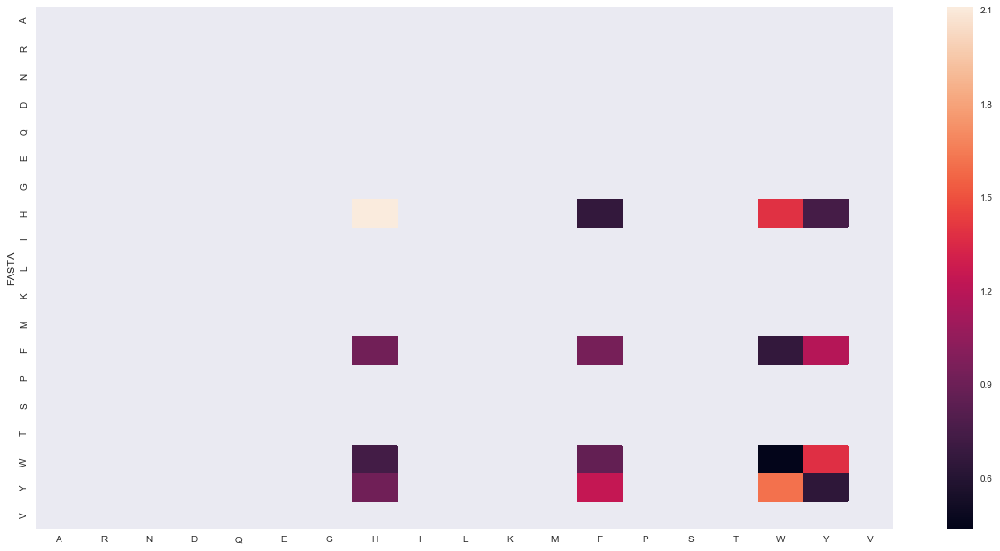

In [255]:
plot_heat_map(barrel_pipi_n_propensity)

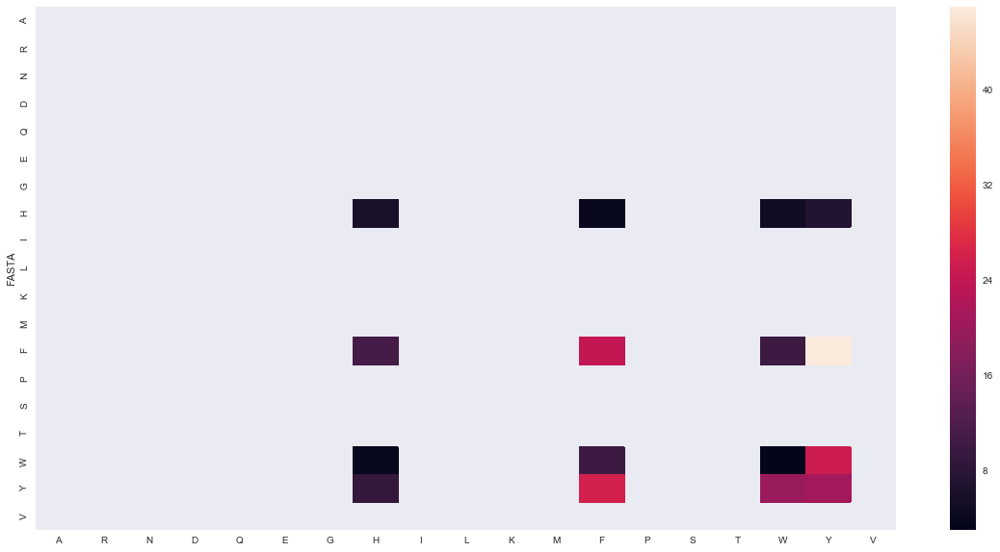

In [256]:
plot_heat_map(barrel_pipi_n_frequency)

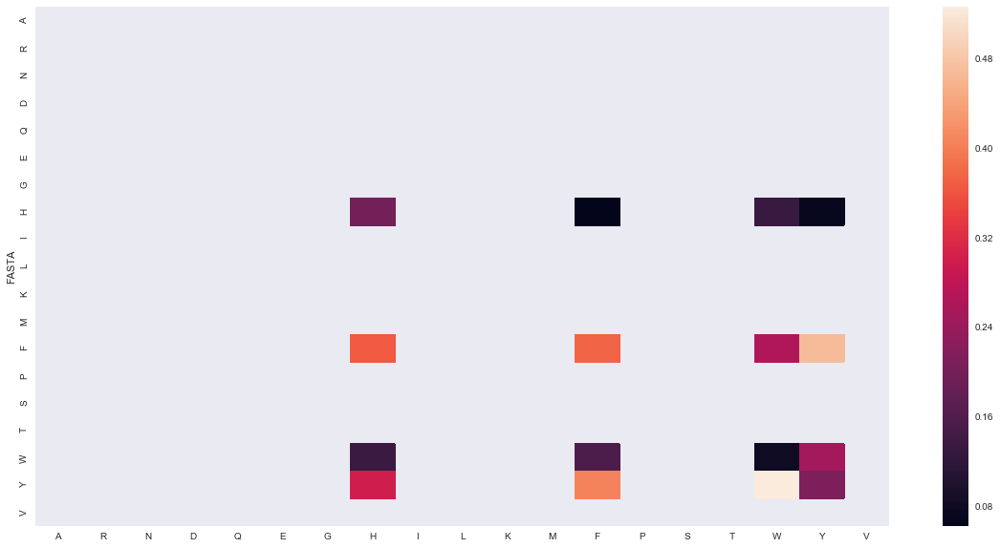

In [257]:
plot_heat_map(barrel_pipi_n_normed_frequencies)

In [258]:
(int_barrel_pipi_n_propensity, int_barrel_pipi_n_frequency, int_barrel_pipi_n_normed_frequencies
 ) = calc_aa_pair_propensities(int_barrel_df, 'pi_pi_stacking_fasta_intra_n', aa_dict_no_cys)

In [259]:
int_barrel_pipi_n_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.533333,NaN,NaN,NaN,NaN,0.638889,NaN,NaN,NaN,2.300000,0.442308,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [260]:
int_barrel_pipi_n_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,4.0,2.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [261]:
int_barrel_pipi_n_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.266667,NaN,NaN,NaN,NaN,0.111111,NaN,NaN,NaN,0.4,0.076923,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


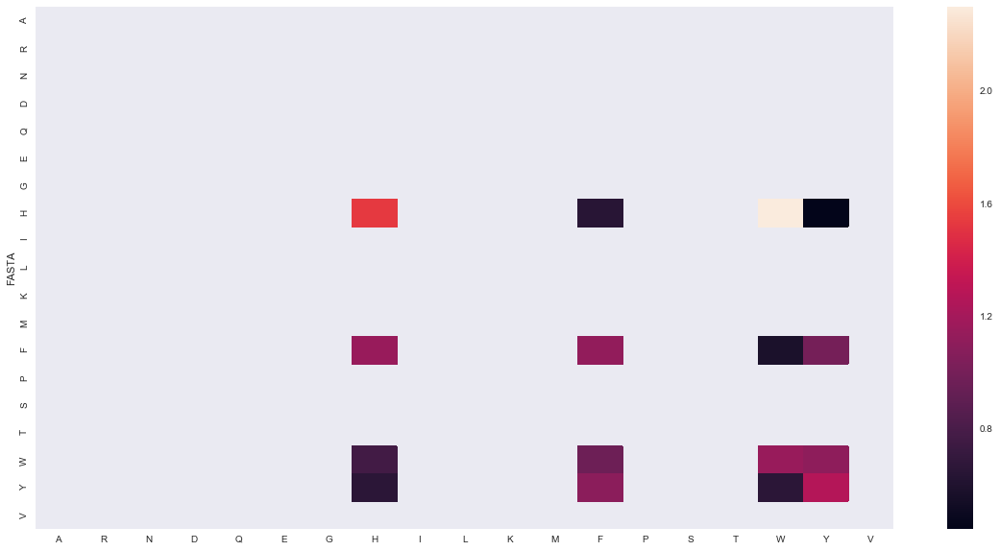

In [262]:
plot_heat_map(int_barrel_pipi_n_propensity)

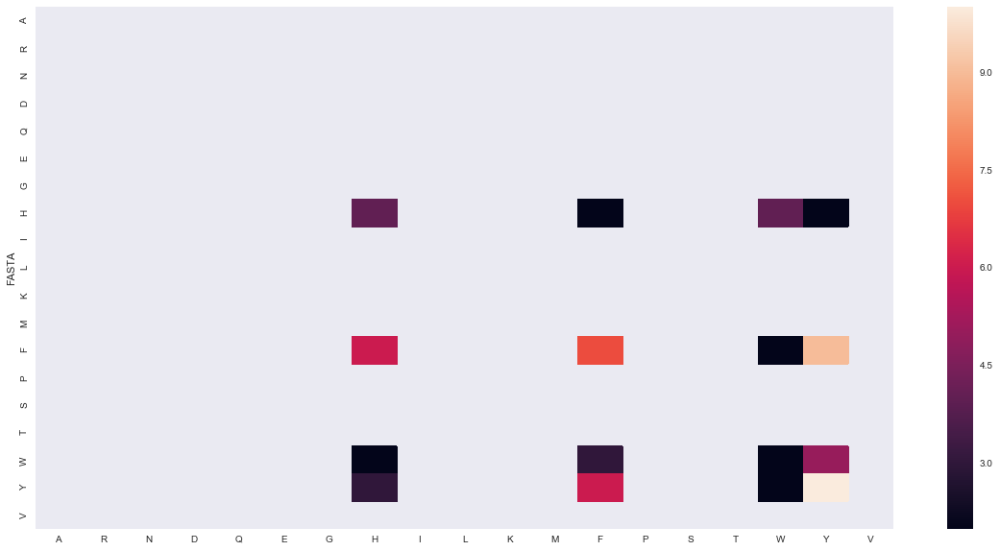

In [263]:
plot_heat_map(int_barrel_pipi_n_frequency)

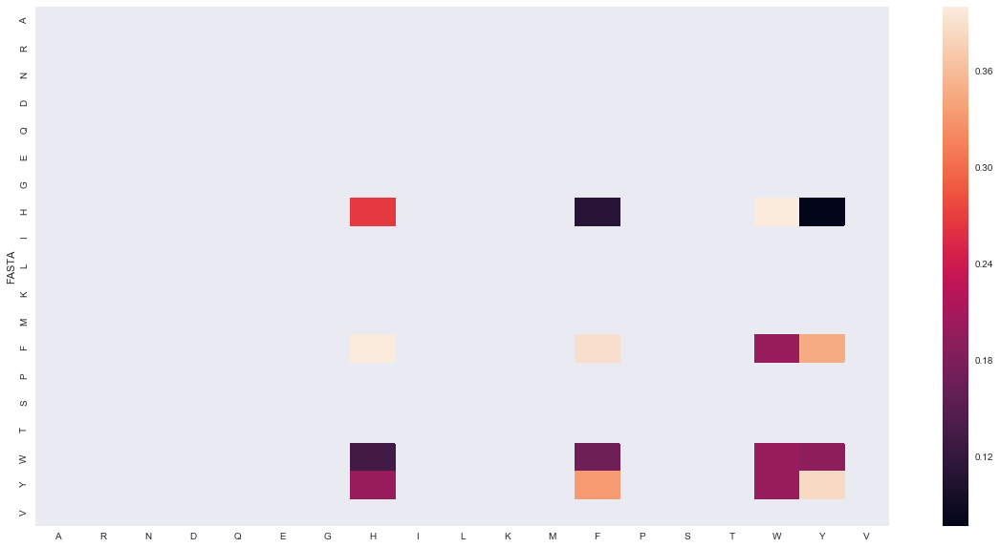

In [264]:
plot_heat_map(int_barrel_pipi_n_normed_frequencies)

In [265]:
(ext_barrel_pipi_n_propensity, ext_barrel_pipi_n_frequency, ext_barrel_pipi_n_normed_frequencies
 ) = calc_aa_pair_propensities(ext_barrel_df, 'pi_pi_stacking_fasta_intra_n', aa_dict_no_cys)

In [266]:
ext_barrel_pipi_n_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.173333,NaN,NaN,NaN,NaN,0.708696,NaN,NaN,NaN,0.582143,1.101351,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [267]:
ext_barrel_pipi_n_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,1.0,5.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [268]:
ext_barrel_pipi_n_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.133333,NaN,NaN,NaN,NaN,0.043478,NaN,NaN,NaN,0.035714,0.067568,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


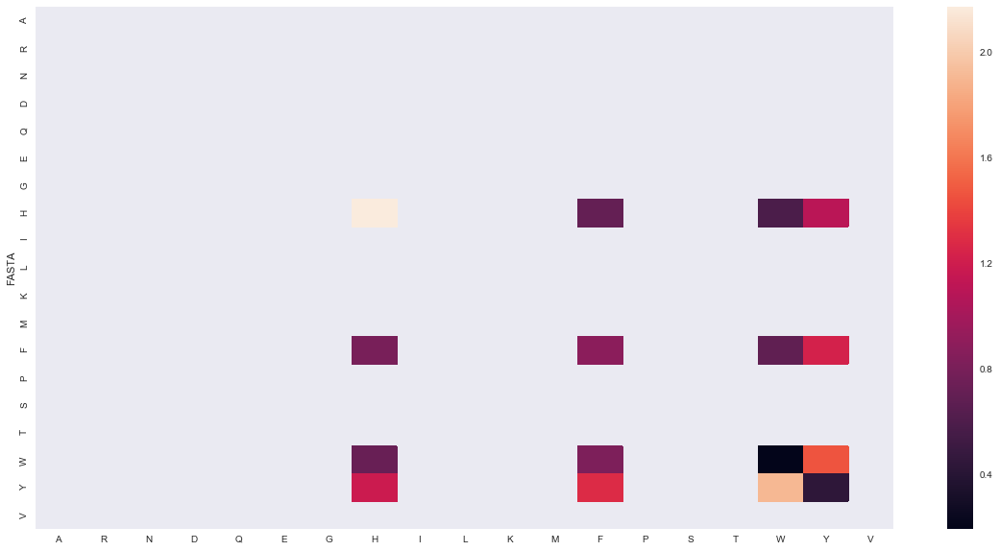

In [269]:
plot_heat_map(ext_barrel_pipi_n_propensity)

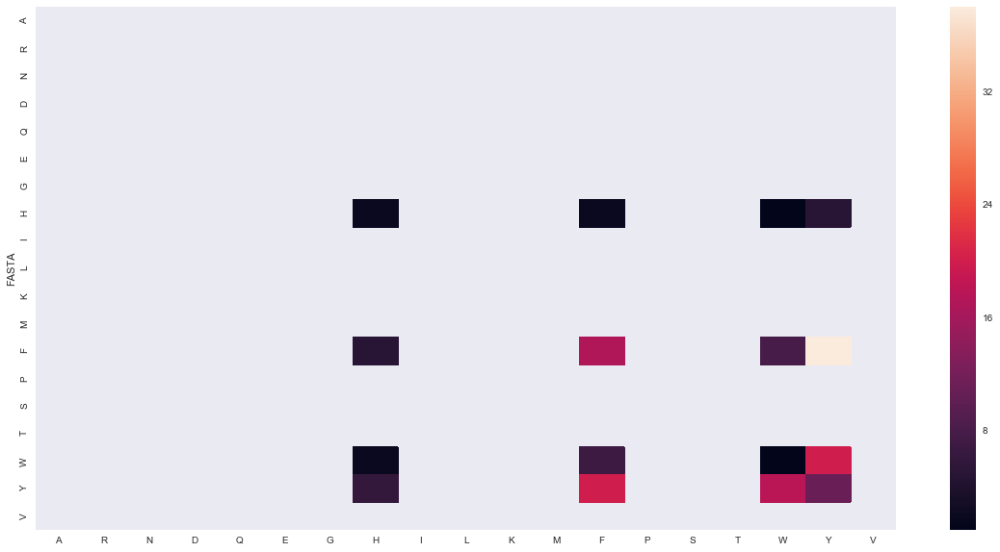

In [270]:
plot_heat_map(ext_barrel_pipi_n_frequency)

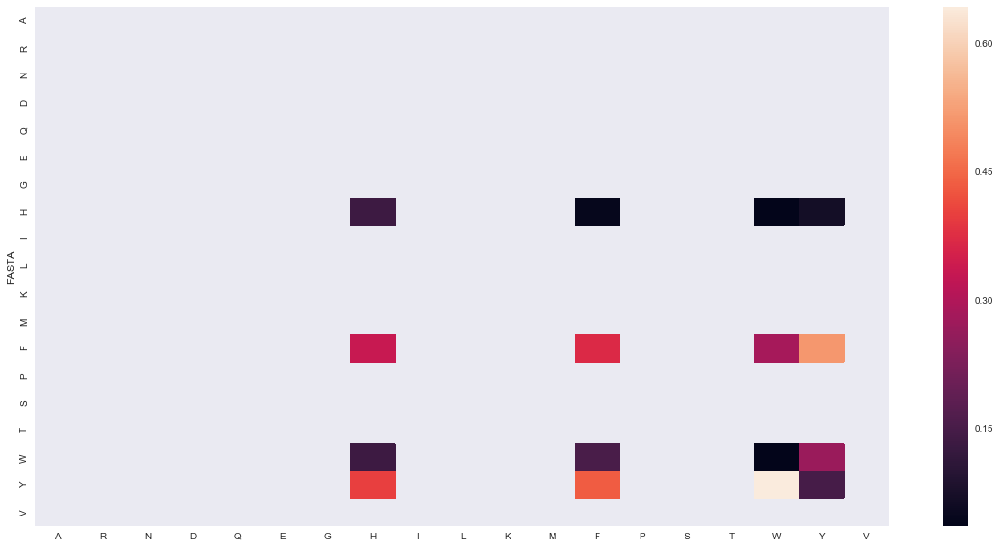

In [271]:
plot_heat_map(ext_barrel_pipi_n_normed_frequencies)

### Pi-pi stacking T interactions amino acid propensities

In [272]:
(barrel_pipi_t_propensity, barrel_pipi_t_frequency, barrel_pipi_t_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'pi_pi_stacking_fasta_intra_t', aa_dict_no_cys)

In [273]:
barrel_pipi_t_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.065183,NaN,NaN,NaN,NaN,0.458276,NaN,NaN,NaN,0.328431,1.555728,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [274]:
barrel_pipi_t_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,2.0,24.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [275]:
barrel_pipi_t_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.108108,NaN,NaN,NaN,NaN,0.046512,NaN,NaN,NaN,0.033333,0.157895,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


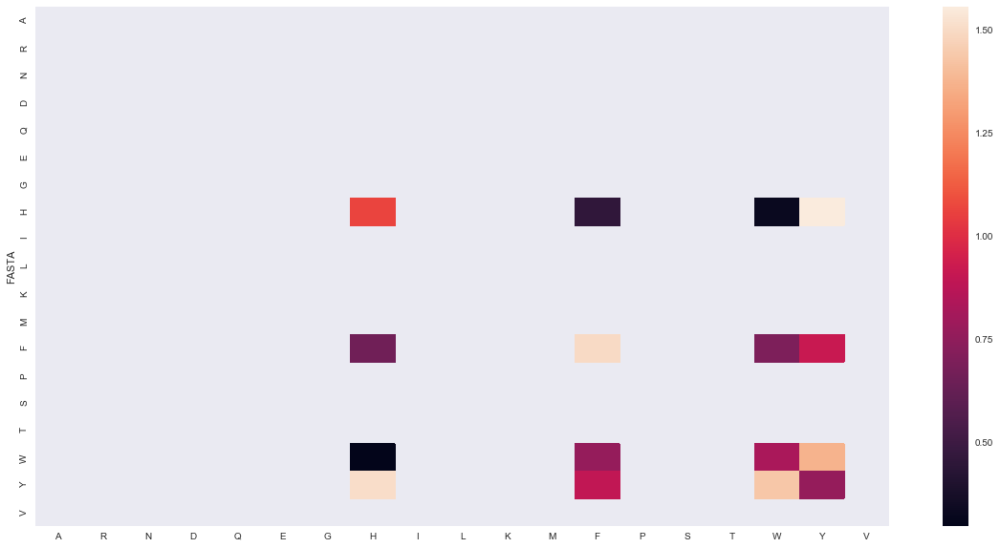

In [276]:
plot_heat_map(barrel_pipi_t_propensity)

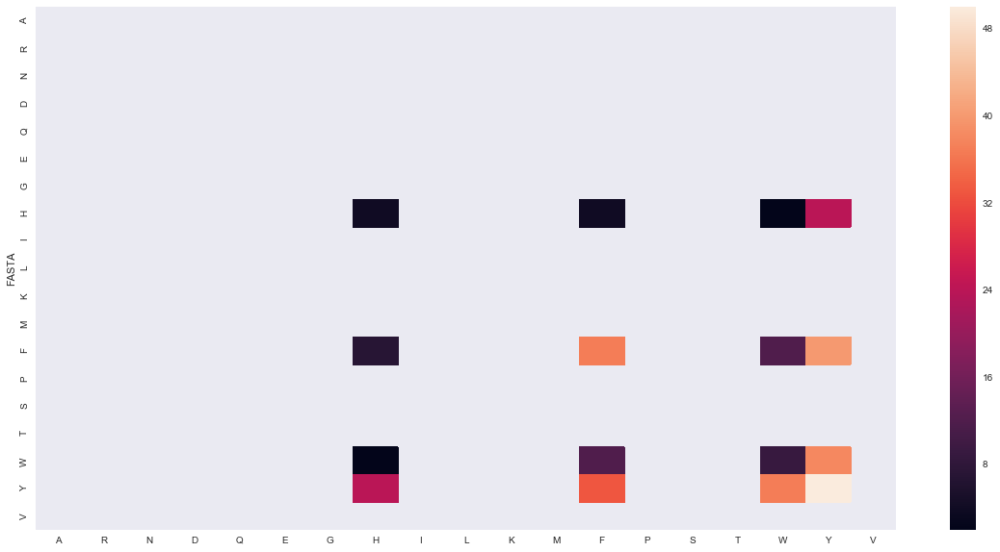

In [277]:
plot_heat_map(barrel_pipi_t_frequency)

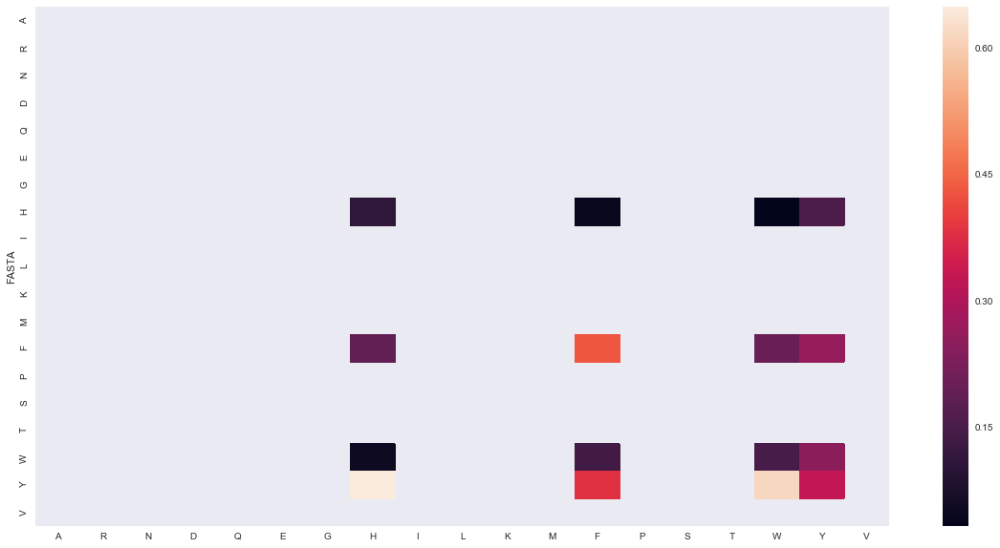

In [278]:
plot_heat_map(barrel_pipi_t_normed_frequencies)

In [279]:
(int_barrel_pipi_t_propensity, int_barrel_pipi_t_frequency, int_barrel_pipi_t_normed_frequencies
 ) = calc_aa_pair_propensities(int_barrel_df, 'pi_pi_stacking_fasta_intra_t', aa_dict_no_cys)

In [280]:
int_barrel_pipi_t_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.733333,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,2.212121,0.000000,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [281]:
int_barrel_pipi_t_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,1.0,0.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [282]:
int_barrel_pipi_t_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.4,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.090909,0.000000,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


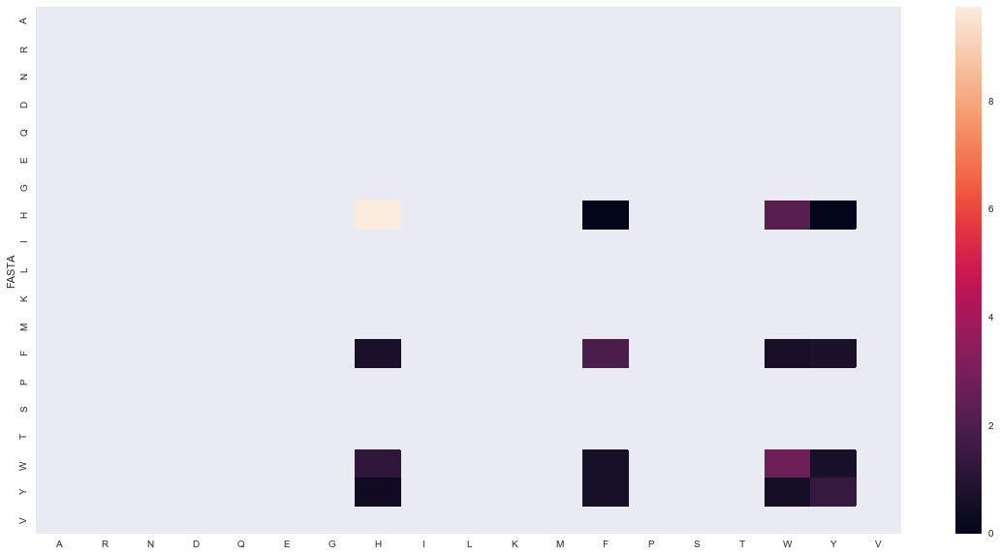

In [283]:
plot_heat_map(int_barrel_pipi_t_propensity)

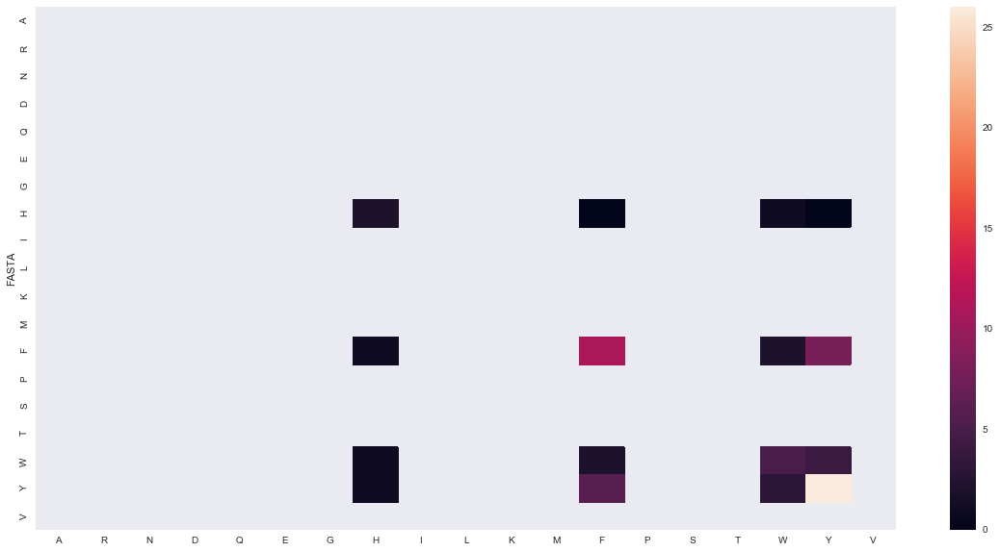

In [284]:
plot_heat_map(int_barrel_pipi_t_frequency)

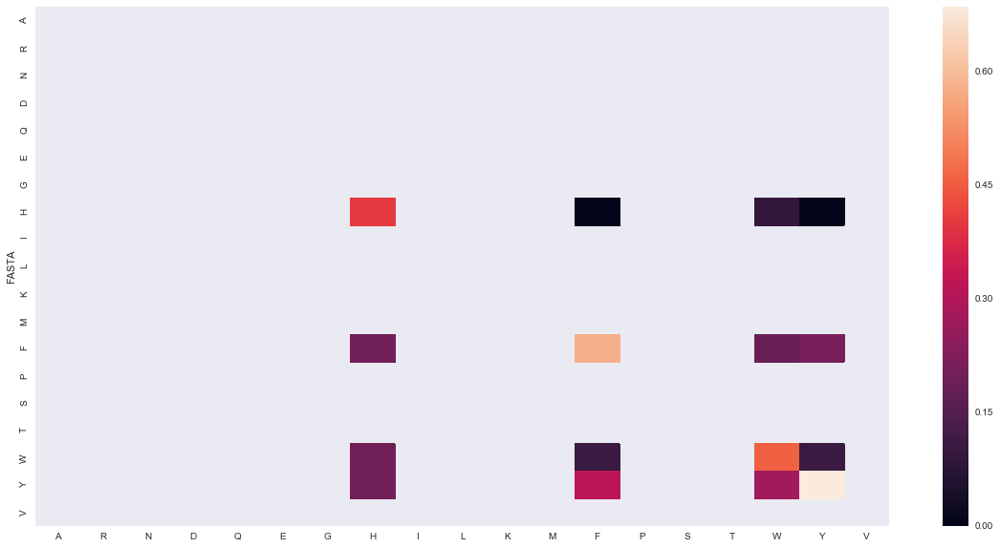

In [285]:
plot_heat_map(int_barrel_pipi_t_normed_frequencies)

In [286]:
(ext_barrel_pipi_t_propensity, ext_barrel_pipi_t_frequency, ext_barrel_pipi_t_normed_frequencies
 ) = calc_aa_pair_propensities(ext_barrel_df, 'pi_pi_stacking_fasta_intra_t', aa_dict_no_cys)

In [287]:
ext_barrel_pipi_t_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.528226,NaN,NaN,NaN,NaN,0.504574,NaN,NaN,NaN,0.172482,1.779287,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [288]:
ext_barrel_pipi_t_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,1.0,24.0,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [289]:
ext_barrel_pipi_t_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06250,NaN,NaN,NaN,NaN,0.059701,NaN,NaN,NaN,0.020408,0.210526,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


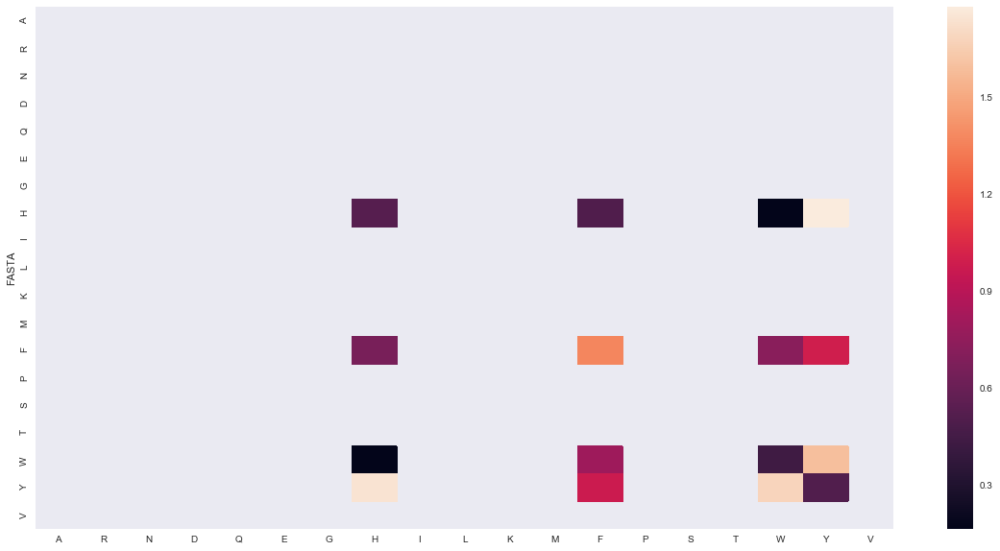

In [290]:
plot_heat_map(ext_barrel_pipi_t_propensity)

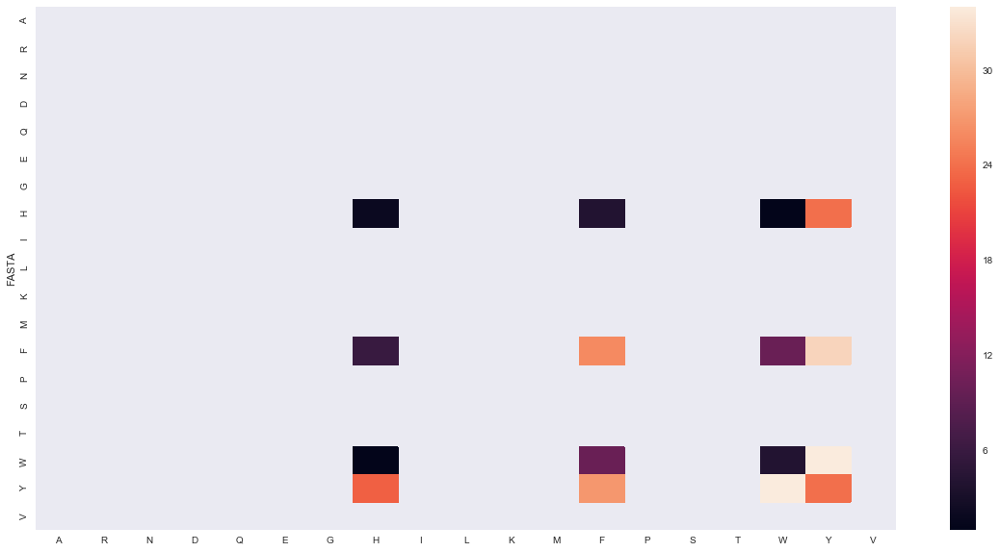

In [291]:
plot_heat_map(ext_barrel_pipi_t_frequency)

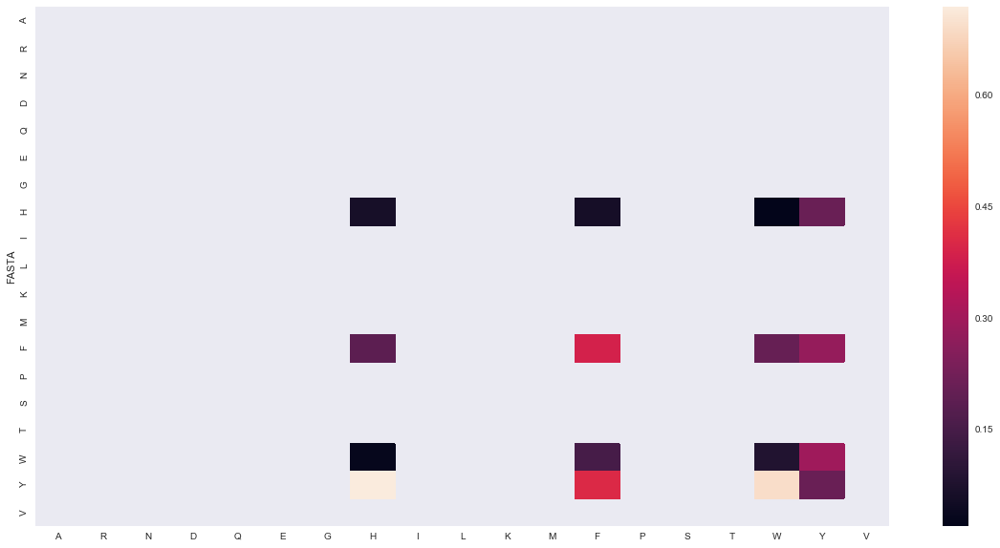

In [292]:
plot_heat_map(ext_barrel_pipi_t_normed_frequencies)

### Cation-pi interactions amino acid propensities

In [293]:
(barrel_cationpi_propensity, barrel_cationpi_frequency, barrel_cationpi_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'cation_pi_fasta_intra', aa_dict_no_cys)

In [294]:
barrel_cationpi_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,2.125,NaN,NaN,NaN,2.479167,1.180556,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [295]:
barrel_cationpi_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,6.0,NaN,NaN,NaN,7.0,5.0,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [296]:
barrel_cationpi_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,0.75,NaN,NaN,NaN,0.875,0.416667,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


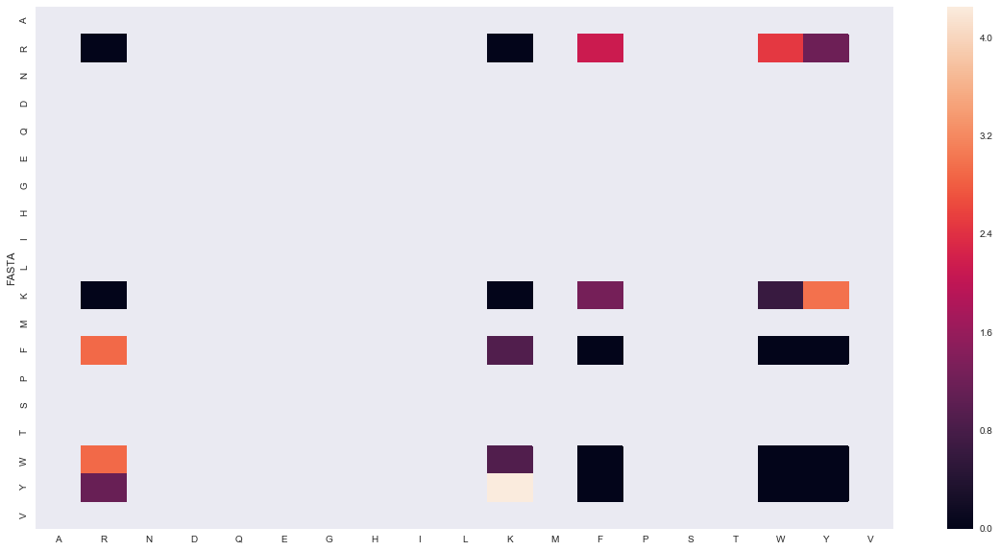

In [297]:
plot_heat_map(barrel_cationpi_propensity)

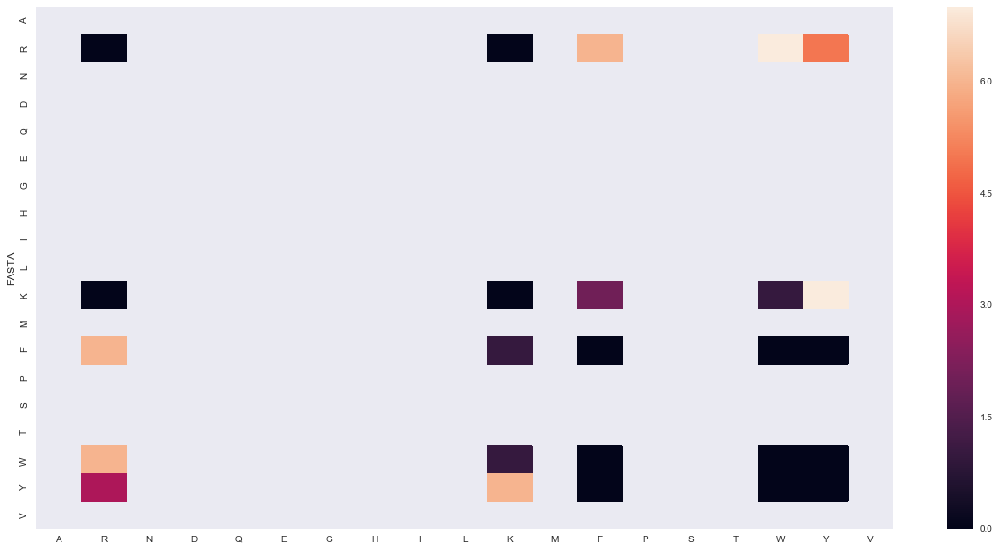

In [298]:
plot_heat_map(barrel_cationpi_frequency)

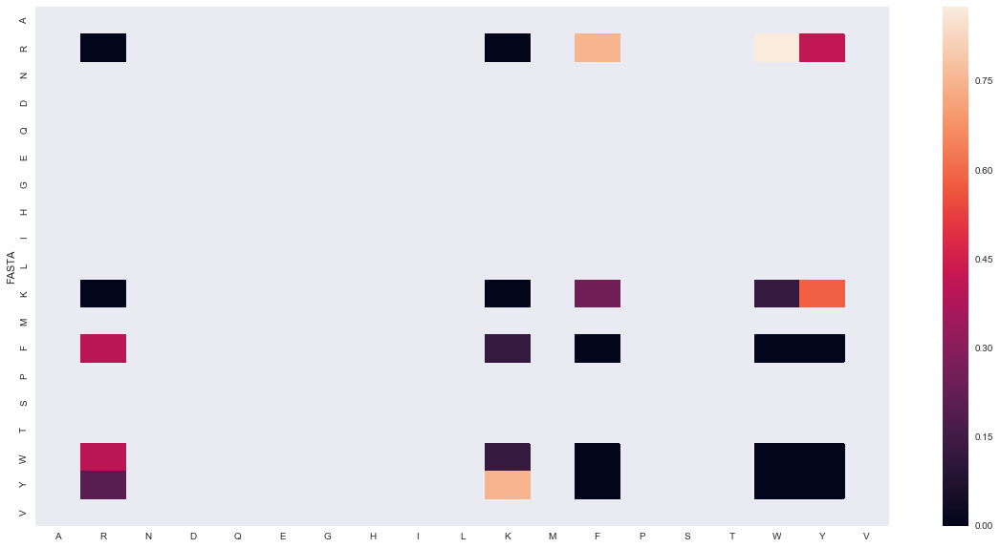

In [299]:
plot_heat_map(barrel_cationpi_normed_frequencies)

In [300]:
(int_barrel_cationpi_propensity, int_barrel_cationpi_frequency, int_barrel_cationpi_normed_frequencies
 ) = calc_aa_pair_propensities(int_barrel_df, 'cation_pi_fasta_intra', aa_dict_no_cys)

In [301]:
int_barrel_cationpi_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,2.15625,NaN,NaN,NaN,2.464286,1.045455,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [302]:
int_barrel_cationpi_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,6.0,NaN,NaN,NaN,6.0,4.0,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [303]:
int_barrel_cationpi_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,0.75,NaN,NaN,NaN,0.857143,0.363636,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


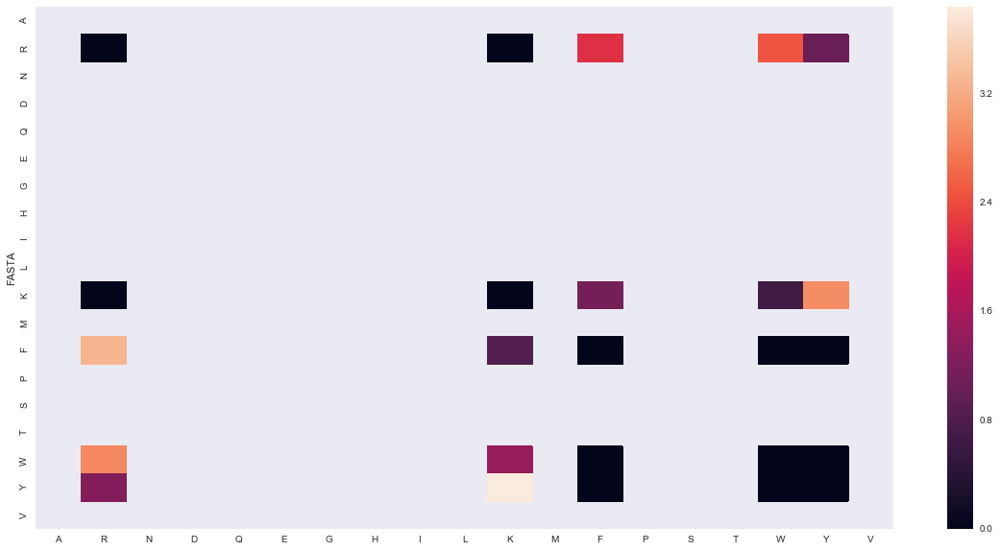

In [304]:
plot_heat_map(int_barrel_cationpi_propensity)

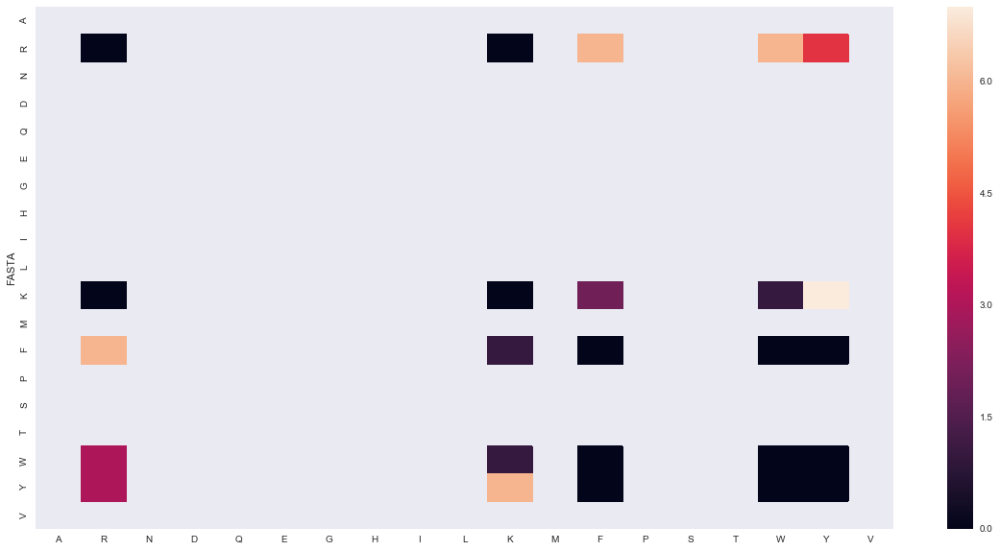

In [305]:
plot_heat_map(int_barrel_cationpi_frequency)

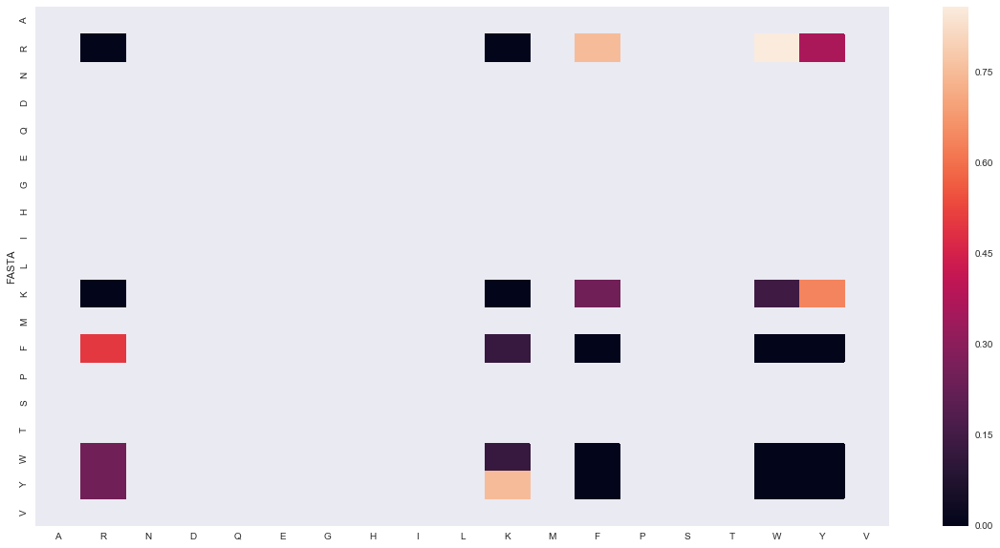

In [306]:
plot_heat_map(int_barrel_cationpi_normed_frequencies)

In [307]:
(ext_barrel_cationpi_propensity, ext_barrel_cationpi_frequency, ext_barrel_cationpi_normed_frequencies
 ) = calc_aa_pair_propensities(ext_barrel_df, 'cation_pi_fasta_intra', aa_dict_no_cys)

In [308]:
ext_barrel_cationpi_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.5,2.5,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [309]:
ext_barrel_cationpi_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [310]:
ext_barrel_cationpi_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,R,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN
2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,G,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


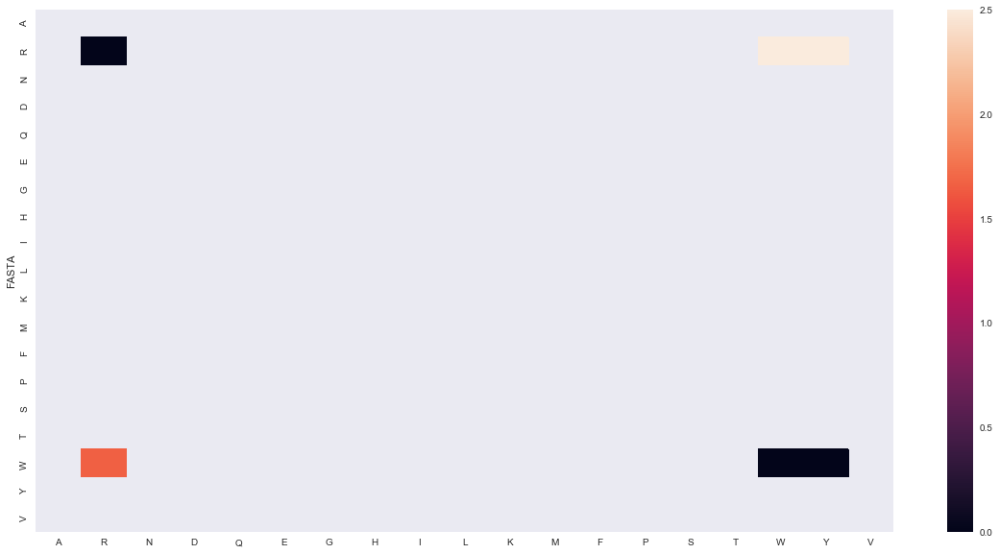

In [311]:
plot_heat_map(ext_barrel_cationpi_propensity)

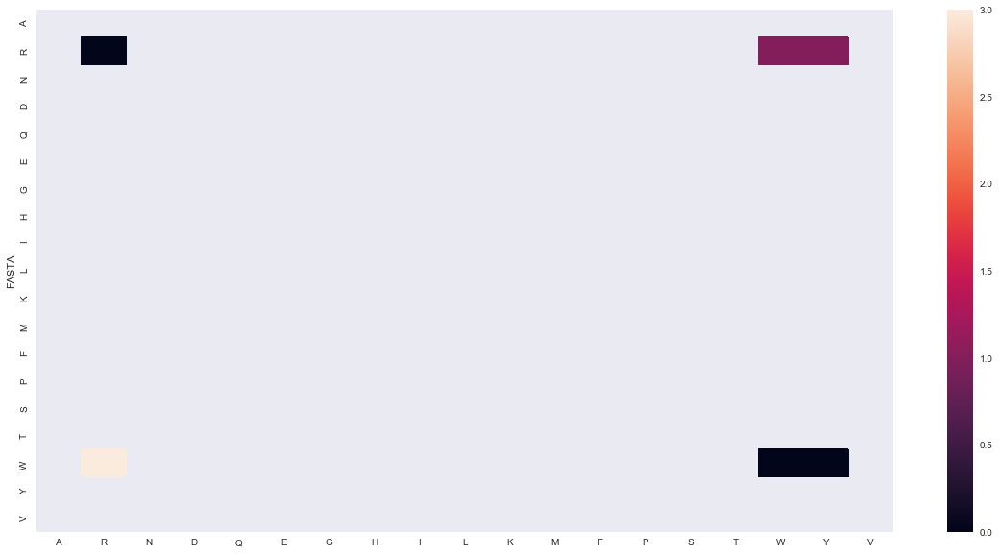

In [312]:
plot_heat_map(ext_barrel_cationpi_frequency)

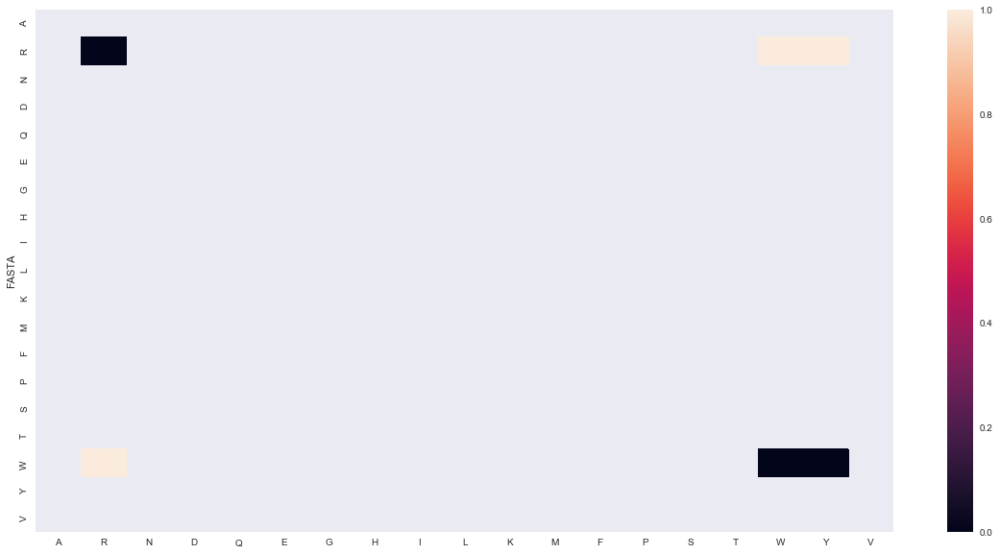

In [313]:
plot_heat_map(ext_barrel_cationpi_normed_frequencies)

### NHB pairs

In [314]:
(barrel_nhb_propensity, barrel_nhb_frequency, barrel_nhb_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'nhb_pairs_fasta_intra', aa_dict_no_cys)

In [315]:
barrel_nhb_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.286873,0.477134,0.733481,0.611499,0.673231,0.630288,1.093726,0.389473,1.309060,1.838862,0.482521,1.606574,1.316761,1.424143,0.792726,0.731448,0.445788,0.777811,1.489315
1,R,0.475652,1.331553,1.965536,2.151261,2.141108,2.238683,0.759423,0.481700,0.431746,0.141042,1.989274,0.529870,0.457143,1.281005,1.081869,1.421603,0.315058,0.792233,0.438568
2,N,0.733481,1.971660,2.273221,1.263447,1.589709,1.302269,1.308306,2.011770,0.540942,0.353429,1.246199,1.327768,0.143191,0.267499,1.807325,0.971538,0.526322,0.378135,0.274745
3,D,0.609390,2.150521,1.259090,1.940771,1.408811,1.686732,0.983758,1.961129,0.479387,0.508968,1.767024,0.784451,0.253793,1.422357,1.551612,0.908816,0.349823,0.460770,0.389570
4,Q,0.673231,2.147778,1.589709,1.413685,0.833786,0.630486,1.206036,1.055153,0.453950,0.741479,1.307237,0.928534,0.675918,0.280601,0.947924,1.585303,1.794330,0.694147,0.230562
5,E,0.632893,2.174403,1.307650,1.699562,0.633092,0.851070,1.136781,1.068233,0.804261,0.234585,2.293967,1.175056,0.912397,1.136318,0.659776,1.547635,0.698682,0.702752,0.466840
6,G,1.097301,0.764278,1.312581,0.955017,1.209977,1.135802,1.198697,0.929293,1.226667,1.205888,0.383769,0.836364,0.721569,0.786325,1.280742,0.929293,0.773574,0.615318,1.130675
7,H,0.389473,0.483201,2.011770,1.967914,1.055153,1.063837,0.926266,0.854586,0.689366,0.750671,0.705836,0.940045,0.912397,0.000000,1.199593,1.375676,0.558946,1.606291,0.816969
8,I,1.309060,0.433091,0.540942,0.481046,0.453950,0.800951,1.222671,0.689366,1.482904,1.564315,0.284687,1.263838,1.472000,0.611087,0.516092,0.739808,0.751471,1.079784,1.757392
9,L,1.842205,0.106304,0.354071,0.511658,0.742827,0.280853,1.204146,0.752036,1.567160,1.816624,0.232926,1.137455,1.304727,1.874925,0.422257,0.453973,0.614840,1.435622,1.181104


In [316]:
barrel_nhb_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,58,13,16,15,14,13,57,4,25,86,12,15,38,11,29,28,7,34,56
1,R,13,22,26,32,27,28,24,3,5,4,30,3,8,6,24,33,3,21,10
2,N,16,26,24,15,16,13,33,10,5,8,15,6,2,1,32,18,4,8,5
3,D,15,32,15,26,16,19,28,11,5,13,24,4,4,6,31,19,3,11,8
4,Q,14,27,16,16,8,6,29,5,4,16,15,4,9,1,16,28,13,14,4
5,E,13,27,13,19,6,8,27,5,7,5,26,5,12,4,11,27,5,14,8
6,G,57,24,33,27,29,27,72,11,27,65,11,9,24,7,54,41,14,31,49
7,H,4,3,10,11,5,5,11,2,3,8,4,2,6,0,10,12,2,16,7
8,I,25,5,5,5,4,7,27,3,12,31,3,5,18,2,8,12,5,20,28
9,L,86,3,8,13,16,6,65,8,31,88,6,11,39,15,16,18,10,65,46


In [317]:
barrel_nhb_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.109228,0.040498,0.062257,0.051903,0.057143,0.053498,0.092834,0.033058,0.111111,0.156080,0.040956,0.136364,0.111765,0.120879,0.067285,0.062084,0.037838,0.066019,0.126411
1,R,0.024482,0.068536,0.101167,0.110727,0.110204,0.115226,0.039088,0.024793,0.022222,0.007260,0.102389,0.027273,0.023529,0.065934,0.055684,0.073171,0.016216,0.040777,0.022573
2,N,0.030132,0.080997,0.093385,0.051903,0.065306,0.053498,0.053746,0.082645,0.022222,0.014519,0.051195,0.054545,0.005882,0.010989,0.074246,0.039911,0.021622,0.015534,0.011287
3,D,0.028249,0.099688,0.058366,0.089965,0.065306,0.078189,0.045603,0.090909,0.022222,0.023593,0.081911,0.036364,0.011765,0.065934,0.071926,0.042129,0.016216,0.021359,0.018059
4,Q,0.026365,0.084112,0.062257,0.055363,0.032653,0.024691,0.047231,0.041322,0.017778,0.029038,0.051195,0.036364,0.026471,0.010989,0.037123,0.062084,0.070270,0.027184,0.009029
5,E,0.024482,0.084112,0.050584,0.065744,0.024490,0.032922,0.043974,0.041322,0.031111,0.009074,0.088737,0.045455,0.035294,0.043956,0.025522,0.059867,0.027027,0.027184,0.018059
6,G,0.107345,0.074766,0.128405,0.093426,0.118367,0.111111,0.117264,0.090909,0.120000,0.117967,0.037543,0.081818,0.070588,0.076923,0.125290,0.090909,0.075676,0.060194,0.110609
7,H,0.007533,0.009346,0.038911,0.038062,0.020408,0.020576,0.017915,0.016529,0.013333,0.014519,0.013652,0.018182,0.017647,0.000000,0.023202,0.026608,0.010811,0.031068,0.015801
8,I,0.047081,0.015576,0.019455,0.017301,0.016327,0.028807,0.043974,0.024793,0.053333,0.056261,0.010239,0.045455,0.052941,0.021978,0.018561,0.026608,0.027027,0.038835,0.063205
9,L,0.161959,0.009346,0.031128,0.044983,0.065306,0.024691,0.105863,0.066116,0.137778,0.159710,0.020478,0.100000,0.114706,0.164835,0.037123,0.039911,0.054054,0.126214,0.103837


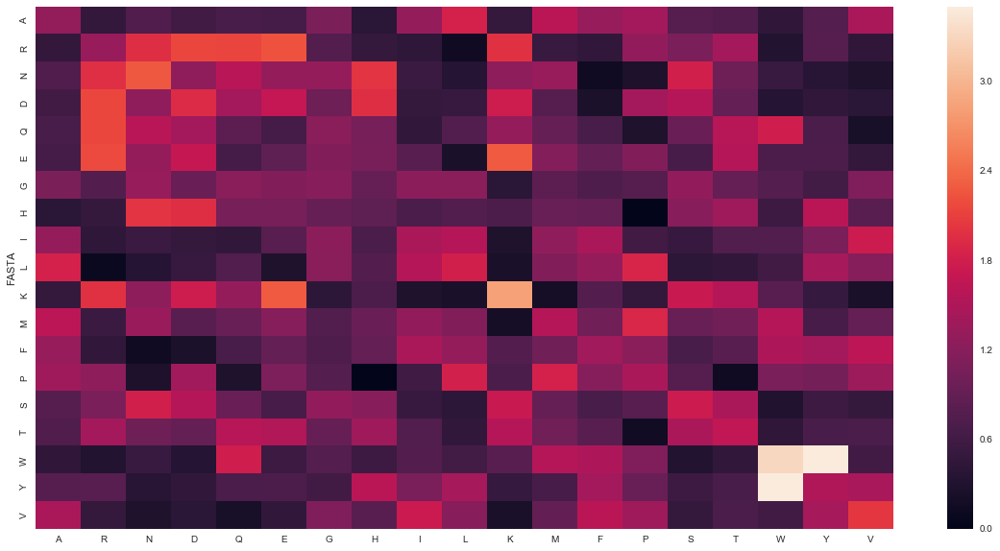

In [318]:
plot_heat_map(barrel_nhb_propensity)

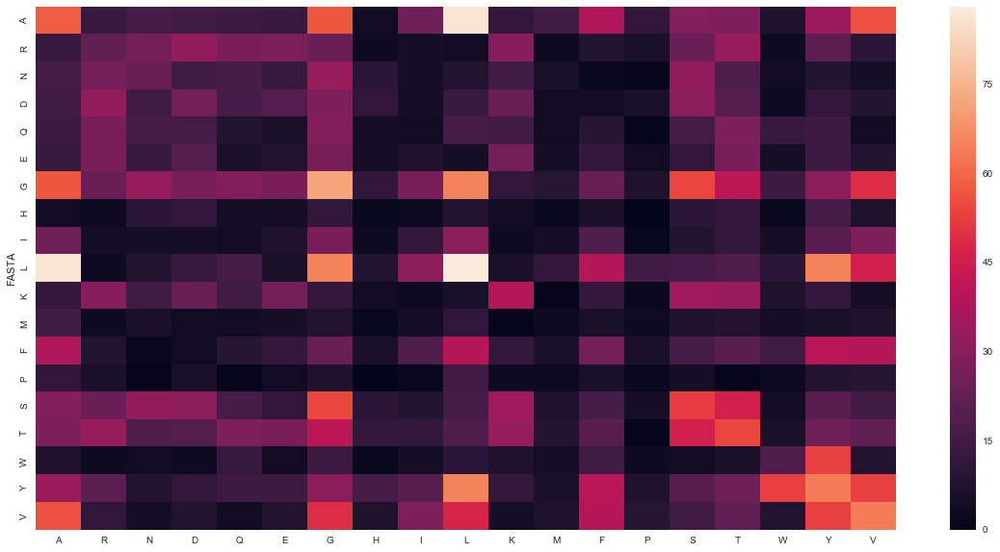

In [319]:
 plot_heat_map(barrel_nhb_frequency)

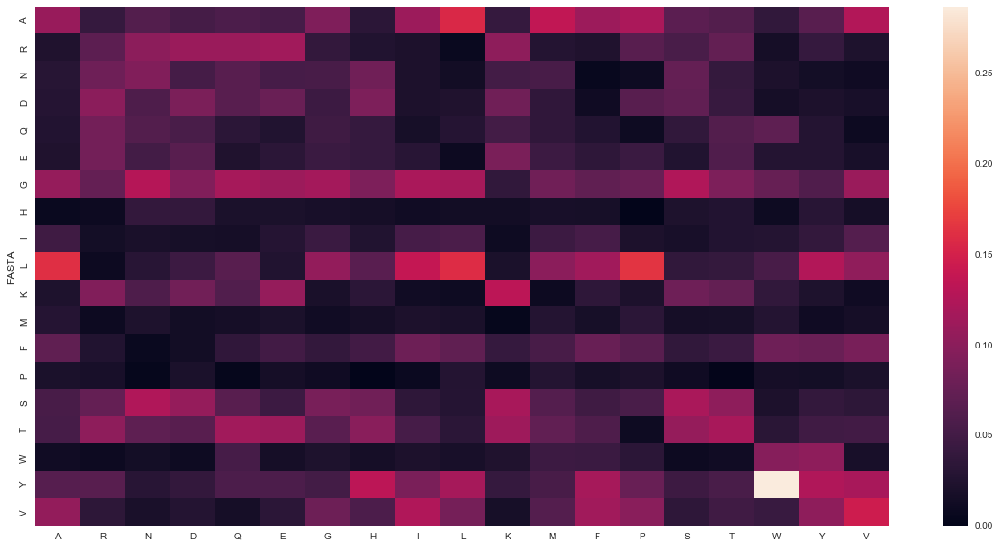

In [320]:
 plot_heat_map(barrel_nhb_normed_frequencies)

In [321]:
(int_barrel_nhb_propensity, int_barrel_nhb_frequency, int_barrel_nhb_normed_frequencies
 ) = calc_aa_pair_propensities(int_barrel_df, 'nhb_pairs_fasta_intra', aa_dict_no_cys)

In [322]:
int_barrel_nhb_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.417021,0.684288,1.086108,0.909792,0.909792,0.802075,1.090584,1.213056,0.847213,1.796256,0.679929,1.872788,1.752192,0.860878,0.968149,0.807265,0.000000,1.019894,0.489674
1,R,0.630039,0.995726,1.204134,1.176768,1.470960,1.768367,0.684562,0.000000,0.821869,0.373397,1.236730,0.454191,1.046016,0.835125,0.816684,1.243772,0.681287,1.154282,1.068807
2,N,1.155401,1.115900,1.416934,1.285822,0.791275,0.951259,1.088003,1.055033,0.828955,1.004310,0.997913,1.527022,0.351678,0.561550,1.372874,0.619503,0.458106,0.665276,0.479121
3,D,0.837666,1.176768,1.300773,0.782283,1.173425,0.846405,0.992898,0.000000,1.092713,1.323864,0.876954,0.905801,0.521522,1.110337,1.248692,0.857449,0.905801,1.096193,0.947352
4,Q,0.924321,1.487867,0.809677,1.186912,0.593456,0.285378,1.046157,1.055033,0.828955,1.841236,1.219672,0.916213,0.879194,0.000000,0.768810,1.239007,2.748639,0.997913,0.638827
5,E,0.869361,1.749249,0.951917,0.930283,0.279085,0.715758,0.944595,0.992301,1.039554,0.787162,1.355724,1.436226,1.819219,2.112642,0.413198,1.048803,1.292603,1.251437,1.201686
6,G,1.114235,0.676432,1.129412,0.940226,1.062864,0.904261,1.020413,1.526164,1.370433,1.037708,0.458266,0.757345,1.380815,1.160447,1.112126,0.819334,1.136017,0.916532,1.650178
7,H,1.148799,0.000000,1.006312,0.000000,0.983442,0.945824,1.456250,0.000000,2.747392,0.832143,0.551228,1.518296,0.874170,0.000000,1.092023,0.923945,2.277444,0.551228,3.175885
8,I,0.850962,0.821869,0.559062,1.092713,0.819535,1.313644,1.386905,2.913901,0.000000,0.924603,0.612476,1.686995,0.971300,0.000000,0.910020,1.197707,0.000000,1.224952,0.882190
9,L,1.643722,0.244235,0.996819,1.298885,1.785967,0.780751,1.236439,0.865923,0.907158,2.198113,0.910047,2.005296,1.154565,2.765368,0.540861,0.305076,0.000000,0.910047,0.524321


In [323]:
int_barrel_nhb_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,24,12,14,12,12,11,34,3,4,14,8,8,13,2,23,17,0,12,4
1,R,11,18,16,16,20,25,22,0,4,3,15,2,8,2,20,27,2,14,9
2,N,15,15,14,13,8,10,26,2,3,6,9,5,2,1,25,10,1,6,3
3,D,11,16,13,8,12,9,24,0,4,8,8,3,3,2,23,14,2,10,6
4,Q,12,20,8,12,6,3,25,2,3,11,11,3,5,0,14,20,6,9,4
5,E,12,25,10,10,3,8,24,2,4,5,13,5,11,4,8,18,3,12,8
6,G,35,22,27,23,26,23,59,7,12,15,10,6,19,5,49,32,6,20,25
7,H,3,0,2,0,2,2,7,0,2,1,1,1,1,0,4,3,1,1,4
8,I,4,4,2,4,3,5,12,2,0,2,2,2,2,0,6,7,0,4,2
9,L,13,2,6,8,11,5,18,1,2,8,5,4,4,3,6,3,0,5,2


In [324]:
int_barrel_nhb_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.106195,0.051282,0.081395,0.068182,0.068182,0.060109,0.081731,0.090909,0.063492,0.134615,0.050955,0.140351,0.131313,0.064516,0.072555,0.060498,0.000000,0.076433,0.036697
1,R,0.048673,0.076923,0.093023,0.090909,0.113636,0.136612,0.052885,0.000000,0.063492,0.028846,0.095541,0.035088,0.080808,0.064516,0.063091,0.096085,0.052632,0.089172,0.082569
2,N,0.066372,0.064103,0.081395,0.073864,0.045455,0.054645,0.062500,0.060606,0.047619,0.057692,0.057325,0.087719,0.020202,0.032258,0.078864,0.035587,0.026316,0.038217,0.027523
3,D,0.048673,0.068376,0.075581,0.045455,0.068182,0.049180,0.057692,0.000000,0.063492,0.076923,0.050955,0.052632,0.030303,0.064516,0.072555,0.049822,0.052632,0.063694,0.055046
4,Q,0.053097,0.085470,0.046512,0.068182,0.034091,0.016393,0.060096,0.060606,0.047619,0.105769,0.070064,0.052632,0.050505,0.000000,0.044164,0.071174,0.157895,0.057325,0.036697
5,E,0.053097,0.106838,0.058140,0.056818,0.017045,0.043716,0.057692,0.060606,0.063492,0.048077,0.082803,0.087719,0.111111,0.129032,0.025237,0.064057,0.078947,0.076433,0.073394
6,G,0.154867,0.094017,0.156977,0.130682,0.147727,0.125683,0.141827,0.212121,0.190476,0.144231,0.063694,0.105263,0.191919,0.161290,0.154574,0.113879,0.157895,0.127389,0.229358
7,H,0.013274,0.000000,0.011628,0.000000,0.011364,0.010929,0.016827,0.000000,0.031746,0.009615,0.006369,0.017544,0.010101,0.000000,0.012618,0.010676,0.026316,0.006369,0.036697
8,I,0.017699,0.017094,0.011628,0.022727,0.017045,0.027322,0.028846,0.060606,0.000000,0.019231,0.012739,0.035088,0.020202,0.000000,0.018927,0.024911,0.000000,0.025478,0.018349
9,L,0.057522,0.008547,0.034884,0.045455,0.062500,0.027322,0.043269,0.030303,0.031746,0.076923,0.031847,0.070175,0.040404,0.096774,0.018927,0.010676,0.000000,0.031847,0.018349


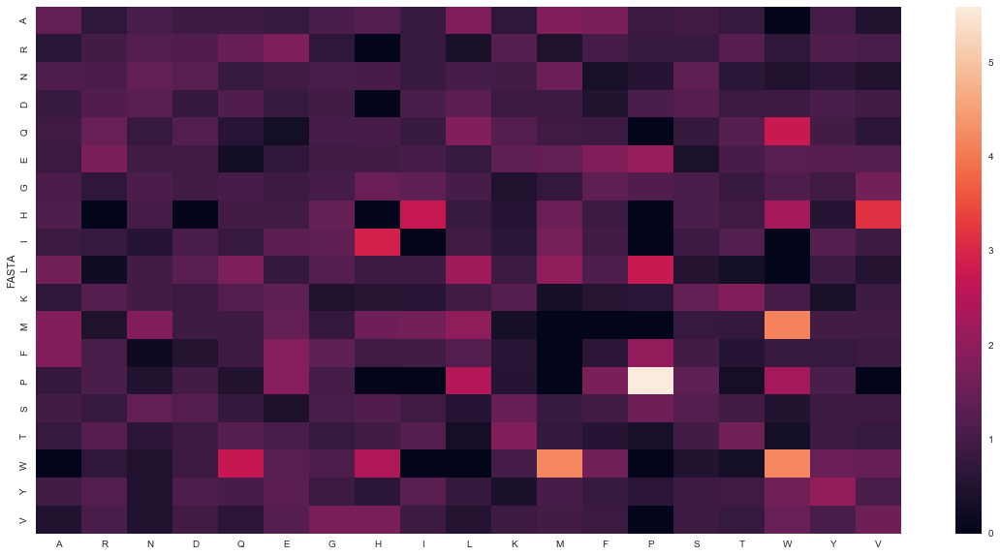

In [325]:
plot_heat_map(int_barrel_nhb_propensity)

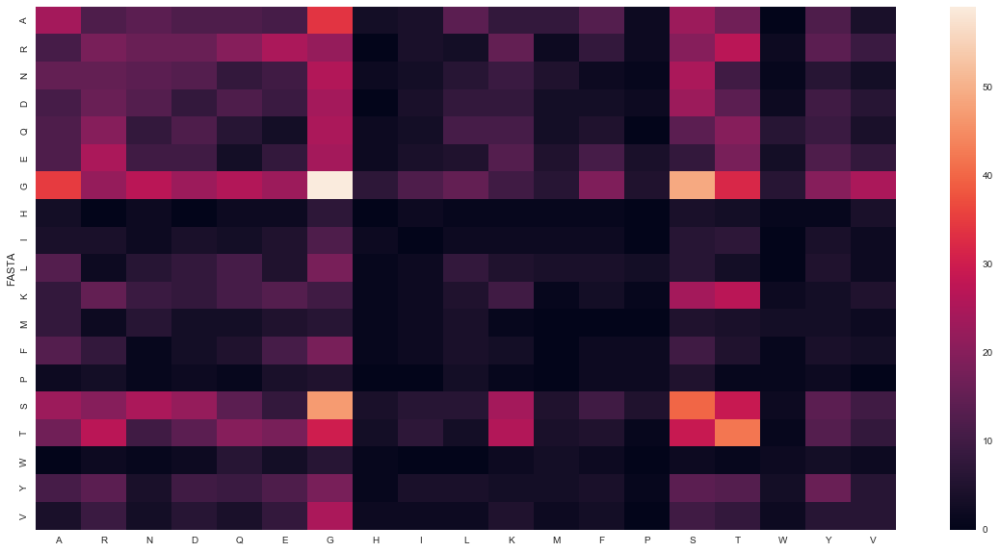

In [326]:
 plot_heat_map(int_barrel_nhb_frequency)

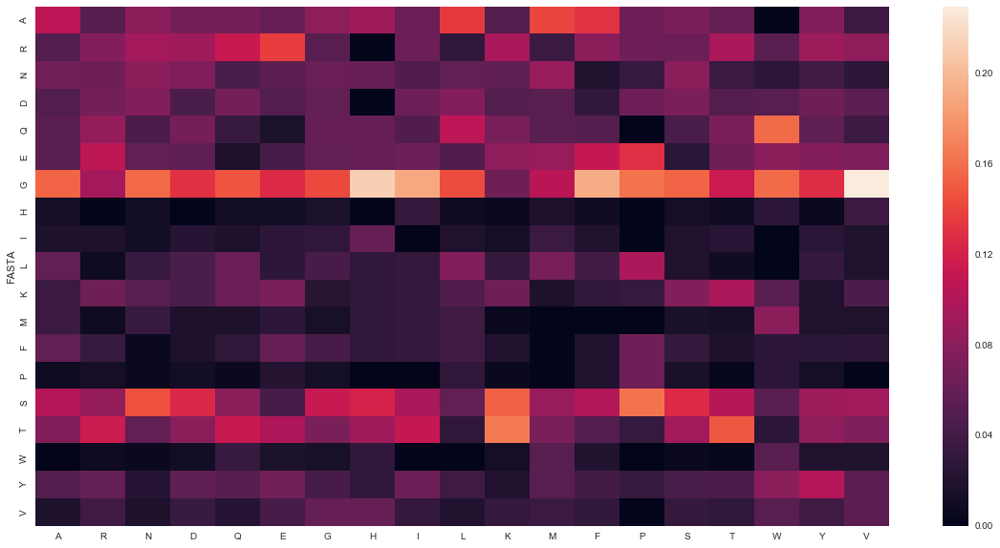

In [327]:
 plot_heat_map(int_barrel_nhb_normed_frequencies)

In [328]:
(ext_barrel_nhb_propensity, ext_barrel_nhb_frequency, ext_barrel_nhb_normed_frequencies
 ) = calc_aa_pair_propensities(ext_barrel_df, 'nhb_pairs_fasta_intra', aa_dict_no_cys)

In [329]:
ext_barrel_nhb_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.183326,0.122013,0.249768,0.281818,0.307685,0.353838,1.233071,0.120626,1.376036,1.709820,0.312210,1.401999,1.101155,1.592270,0.558691,0.686861,0.505482,0.652327,1.652655
1,R,0.240462,1.685998,4.314171,5.192277,3.720191,1.833523,0.370409,1.250129,0.226361,0.082037,4.044535,0.691895,0.000000,2.444697,1.286683,1.294251,0.249459,0.717020,0.109792
2,N,0.127474,4.915801,4.574061,0.688133,4.507770,1.943976,1.374528,3.534502,0.479994,0.173958,1.715273,0.733576,0.000000,0.000000,2.387339,1.829624,0.793460,0.217204,0.232811
3,D,0.371240,5.205888,0.666047,4.509082,1.640987,4.717836,0.571859,3.538377,0.174735,0.316633,3.330237,0.534095,0.117457,1.887135,1.986457,0.832559,0.192565,0.079070,0.169503
4,Q,0.298037,3.656953,4.277713,1.608874,1.317412,2.272535,0.918196,1.549456,0.280560,0.508397,1.336785,0.857560,0.754369,0.757512,0.797381,2.138857,2.164319,0.634786,0.000000
5,E,0.185620,1.301472,1.998142,4.509082,2.461480,0.000000,0.857788,1.930024,1.048408,0.000000,5.411636,0.000000,0.234913,0.000000,1.489843,2.997214,0.770259,0.316280,0.000000
6,G,1.218677,0.388397,1.192609,0.598063,0.734578,1.126353,1.109287,0.767968,1.564379,1.889853,0.124230,0.956337,0.350525,0.563176,0.741021,0.894456,0.919471,0.519129,1.214033
7,H,0.123027,1.293905,3.531601,3.652706,1.631446,1.876163,0.758046,0.852801,0.231625,0.587613,0.827719,0.707986,0.778491,0.000000,1.974908,1.986525,0.255260,1.572203,0.337035
8,I,1.371524,0.228963,0.703050,0.176281,0.288692,0.663992,1.509072,0.226361,1.475537,1.292333,0.146469,1.127533,1.322473,0.663992,0.349469,0.585875,0.677543,0.890268,1.550639
9,L,1.739558,0.083540,0.171012,0.321594,0.526668,0.121134,1.725237,0.578138,1.301065,1.300764,0.053441,0.959927,1.055521,1.453604,0.637545,0.641296,0.494423,1.218104,0.957463


In [330]:
ext_barrel_nhb_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,34,1,2,3,2,2,23,1,21,72,4,7,25,9,6,11,7,22,52
1,R,2,4,10,16,7,3,2,3,1,1,15,1,0,4,4,6,1,7,1
2,N,1,11,10,2,8,3,7,8,2,2,6,1,0,0,7,8,3,2,2
3,D,4,16,2,18,4,10,4,11,1,5,16,1,1,4,8,5,1,1,2
4,Q,2,7,8,4,2,3,4,3,1,5,4,1,4,1,2,8,7,5,0
5,E,1,2,3,9,3,0,3,3,3,0,13,0,1,0,3,9,2,2,0
6,G,22,2,6,4,3,4,13,4,15,50,1,3,5,2,5,9,8,11,24
7,H,1,3,8,11,3,3,4,2,1,7,3,1,5,0,6,9,1,15,3
8,I,21,1,3,1,1,2,15,1,12,29,1,3,16,2,2,5,5,16,26
9,L,73,1,2,5,5,1,47,7,29,80,1,7,35,12,10,15,10,60,44


In [331]:
ext_barrel_nhb_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.111475,0.011494,0.023529,0.026549,0.028986,0.033333,0.116162,0.011364,0.129630,0.161074,0.029412,0.132075,0.103734,0.150000,0.052632,0.064706,0.047619,0.061453,0.155689
1,R,0.006557,0.045977,0.117647,0.141593,0.101449,0.050000,0.010101,0.034091,0.006173,0.002237,0.110294,0.018868,0.000000,0.066667,0.035088,0.035294,0.006803,0.019553,0.002994
2,N,0.003279,0.126437,0.117647,0.017699,0.115942,0.050000,0.035354,0.090909,0.012346,0.004474,0.044118,0.018868,0.000000,0.000000,0.061404,0.047059,0.020408,0.005587,0.005988
3,D,0.013115,0.183908,0.023529,0.159292,0.057971,0.166667,0.020202,0.125000,0.006173,0.011186,0.117647,0.018868,0.004149,0.066667,0.070175,0.029412,0.006803,0.002793,0.005988
4,Q,0.006557,0.080460,0.094118,0.035398,0.028986,0.050000,0.020202,0.034091,0.006173,0.011186,0.029412,0.018868,0.016598,0.016667,0.017544,0.047059,0.047619,0.013966,0.000000
5,E,0.003279,0.022989,0.035294,0.079646,0.043478,0.000000,0.015152,0.034091,0.018519,0.000000,0.095588,0.000000,0.004149,0.000000,0.026316,0.052941,0.013605,0.005587,0.000000
6,G,0.072131,0.022989,0.070588,0.035398,0.043478,0.066667,0.065657,0.045455,0.092593,0.111857,0.007353,0.056604,0.020747,0.033333,0.043860,0.052941,0.054422,0.030726,0.071856
7,H,0.003279,0.034483,0.094118,0.097345,0.043478,0.050000,0.020202,0.022727,0.006173,0.015660,0.022059,0.018868,0.020747,0.000000,0.052632,0.052941,0.006803,0.041899,0.008982
8,I,0.068852,0.011494,0.035294,0.008850,0.014493,0.033333,0.075758,0.011364,0.074074,0.064877,0.007353,0.056604,0.066390,0.033333,0.017544,0.029412,0.034014,0.044693,0.077844
9,L,0.239344,0.011494,0.023529,0.044248,0.072464,0.016667,0.237374,0.079545,0.179012,0.178971,0.007353,0.132075,0.145228,0.200000,0.087719,0.088235,0.068027,0.167598,0.131737


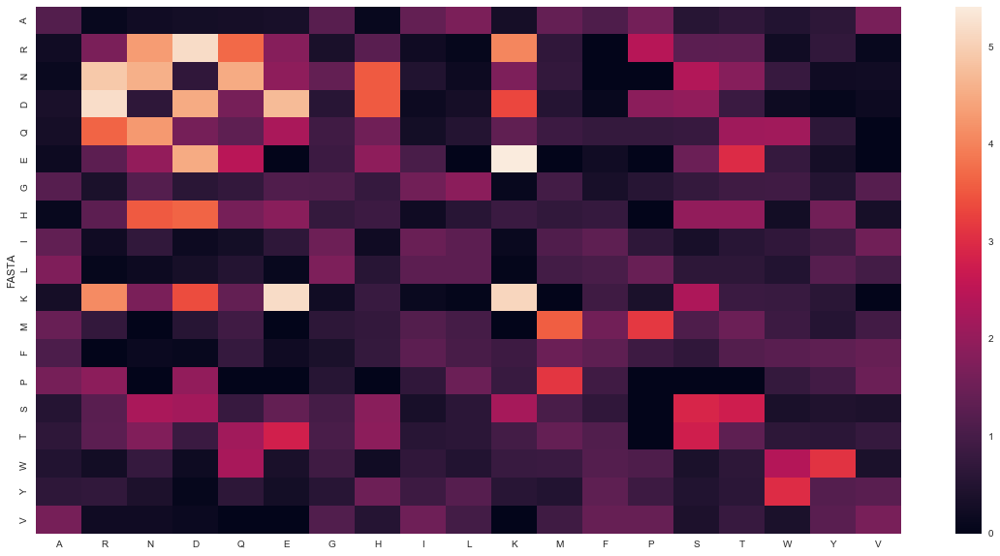

In [332]:
plot_heat_map(ext_barrel_nhb_propensity)

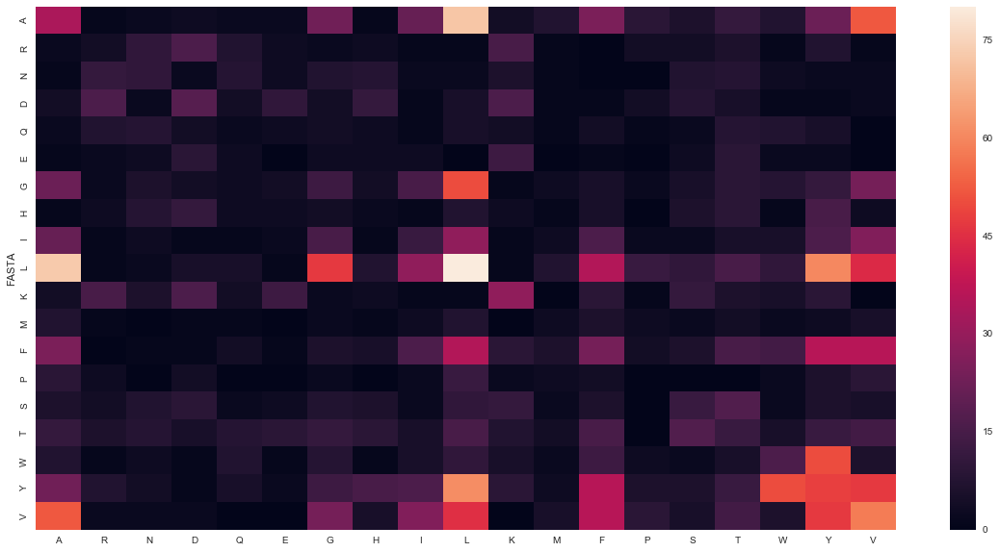

In [333]:
 plot_heat_map(ext_barrel_nhb_frequency)

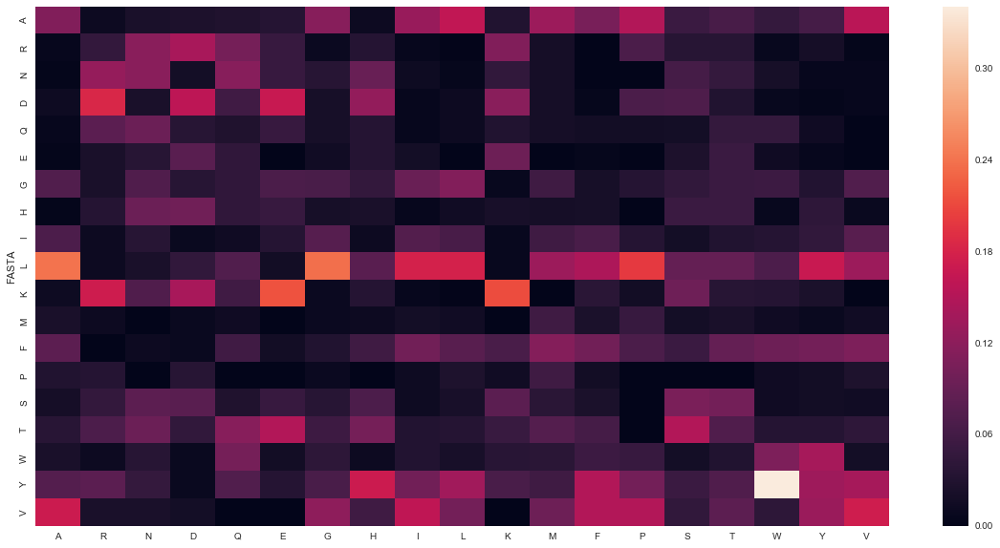

In [334]:
 plot_heat_map(ext_barrel_nhb_normed_frequencies)

### HB pairs

In [335]:
(barrel_hb_propensity, barrel_hb_frequency, barrel_hb_normed_frequencies
 ) = calc_aa_pair_propensities(barrel_df, 'hb_pairs_fasta_intra', aa_dict_no_cys)

In [336]:
barrel_hb_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.154058,0.802150,0.393563,0.766997,0.962749,0.784111,0.968389,0.593197,1.206570,1.337601,0.315822,0.930240,1.069242,NaN,1.072604,0.747298,0.768217,1.331182,1.437241
1,R,0.803658,2.508939,1.358424,1.475314,1.873887,1.780551,0.938244,1.454788,0.606986,0.307538,0.737657,0.675962,0.640999,NaN,1.271415,1.047265,1.004808,0.677908,0.293731
2,N,0.394303,1.358424,3.406509,1.849817,0.751861,1.071618,1.176413,1.216054,0.475667,0.385605,1.017399,0.635664,0.438389,NaN,1.594158,1.531961,0.944906,0.492101,0.420906
3,D,0.768439,1.475314,1.849817,1.908541,1.357527,0.829228,0.758600,1.254658,0.392614,0.442052,3.053666,1.530303,0.301538,NaN,1.417902,1.411245,0.974903,0.369253,0.271418
4,Q,0.964559,1.873887,0.751861,1.357527,0.788241,0.936225,0.809377,1.062412,0.997367,0.718691,1.454493,1.777126,1.455405,NaN,1.267879,0.745684,0.990628,0.656616,0.717068
5,E,0.782586,1.773755,1.067528,0.826063,0.932652,1.772396,0.948540,0.201128,0.377629,0.467698,2.937114,0.630812,0.435043,NaN,1.418335,1.846038,0.781411,0.532739,0.417693
6,G,0.970209,0.938244,1.176413,0.758600,0.809377,0.952174,1.055339,0.831162,0.663233,0.966378,1.062040,0.868942,1.558103,NaN,0.969362,0.650686,0.775002,1.486041,0.906210
7,H,0.594312,1.454788,1.216054,1.254658,1.062412,0.201899,0.831162,1.832892,0.860337,1.549872,1.254658,1.437154,1.321521,NaN,1.242822,0.494795,0.356052,0.606860,1.189518
8,I,1.171911,0.611982,0.479582,0.395846,1.005575,0.382196,0.668692,0.867418,1.221466,1.512800,0.593768,2.267116,1.798057,NaN,0.646983,0.702487,1.011011,1.579583,1.125881
9,L,1.340115,0.307538,0.385605,0.442052,0.718691,0.469490,0.966378,1.549872,1.500450,1.433418,0.176821,0.911430,1.082542,NaN,0.578004,0.653739,1.806439,1.603604,1.533910


In [337]:
barrel_hb_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,54.0,23.0,9.0,17.0,21.0,18.0,54.0,6.0,26.0,64.0,7.0,9.0,30.0,NaN,40.0,28.0,10.0,61.0,56.0
1,R,23.0,44.0,19.0,20.0,25.0,25.0,32.0,9.0,8.0,9.0,10.0,4.0,11.0,NaN,29.0,24.0,8.0,19.0,7.0
2,N,9.0,19.0,38.0,20.0,8.0,12.0,32.0,6.0,5.0,9.0,11.0,3.0,6.0,NaN,29.0,28.0,6.0,11.0,8.0
3,D,17.0,20.0,20.0,20.0,14.0,9.0,20.0,6.0,4.0,10.0,32.0,7.0,4.0,NaN,25.0,25.0,6.0,8.0,5.0
4,Q,21.0,25.0,8.0,14.0,8.0,10.0,21.0,5.0,10.0,16.0,15.0,8.0,19.0,NaN,22.0,13.0,6.0,14.0,13.0
5,E,18.0,25.0,12.0,9.0,10.0,20.0,26.0,1.0,4.0,11.0,32.0,3.0,6.0,NaN,26.0,34.0,5.0,12.0,8.0
6,G,54.0,32.0,32.0,20.0,21.0,26.0,70.0,10.0,17.0,55.0,28.0,10.0,52.0,NaN,43.0,29.0,12.0,81.0,42.0
7,H,6.0,9.0,6.0,6.0,5.0,1.0,10.0,4.0,4.0,16.0,6.0,3.0,8.0,NaN,10.0,4.0,1.0,6.0,10.0
8,I,25.0,8.0,5.0,4.0,10.0,4.0,17.0,4.0,12.0,33.0,6.0,10.0,23.0,NaN,11.0,12.0,6.0,33.0,20.0
9,L,64.0,9.0,9.0,10.0,16.0,11.0,55.0,16.0,33.0,70.0,4.0,9.0,31.0,NaN,22.0,25.0,24.0,75.0,61.0


In [338]:
barrel_hb_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.101504,0.070552,0.034615,0.067460,0.084677,0.068966,0.085174,0.052174,0.106122,0.117647,0.027778,0.081818,0.094044,NaN,0.094340,0.065728,0.067568,0.117083,0.126411
1,R,0.043233,0.134969,0.073077,0.079365,0.100806,0.095785,0.050473,0.078261,0.032653,0.016544,0.039683,0.036364,0.034483,NaN,0.068396,0.056338,0.054054,0.036468,0.015801
2,N,0.016917,0.058282,0.146154,0.079365,0.032258,0.045977,0.050473,0.052174,0.020408,0.016544,0.043651,0.027273,0.018809,NaN,0.068396,0.065728,0.040541,0.021113,0.018059
3,D,0.031955,0.061350,0.076923,0.079365,0.056452,0.034483,0.031546,0.052174,0.016327,0.018382,0.126984,0.063636,0.012539,NaN,0.058962,0.058685,0.040541,0.015355,0.011287
4,Q,0.039474,0.076687,0.030769,0.055556,0.032258,0.038314,0.033123,0.043478,0.040816,0.029412,0.059524,0.072727,0.059561,NaN,0.051887,0.030516,0.040541,0.026871,0.029345
5,E,0.033835,0.076687,0.046154,0.035714,0.040323,0.076628,0.041009,0.008696,0.016327,0.020221,0.126984,0.027273,0.018809,NaN,0.061321,0.079812,0.033784,0.023033,0.018059
6,G,0.101504,0.098160,0.123077,0.079365,0.084677,0.099617,0.110410,0.086957,0.069388,0.101103,0.111111,0.090909,0.163009,NaN,0.101415,0.068075,0.081081,0.155470,0.094808
7,H,0.011278,0.027607,0.023077,0.023810,0.020161,0.003831,0.015773,0.034783,0.016327,0.029412,0.023810,0.027273,0.025078,NaN,0.023585,0.009390,0.006757,0.011516,0.022573
8,I,0.046992,0.024540,0.019231,0.015873,0.040323,0.015326,0.026814,0.034783,0.048980,0.060662,0.023810,0.090909,0.072100,NaN,0.025943,0.028169,0.040541,0.063340,0.045147
9,L,0.120301,0.027607,0.034615,0.039683,0.064516,0.042146,0.086751,0.139130,0.134694,0.128676,0.015873,0.081818,0.097179,NaN,0.051887,0.058685,0.162162,0.143954,0.137698


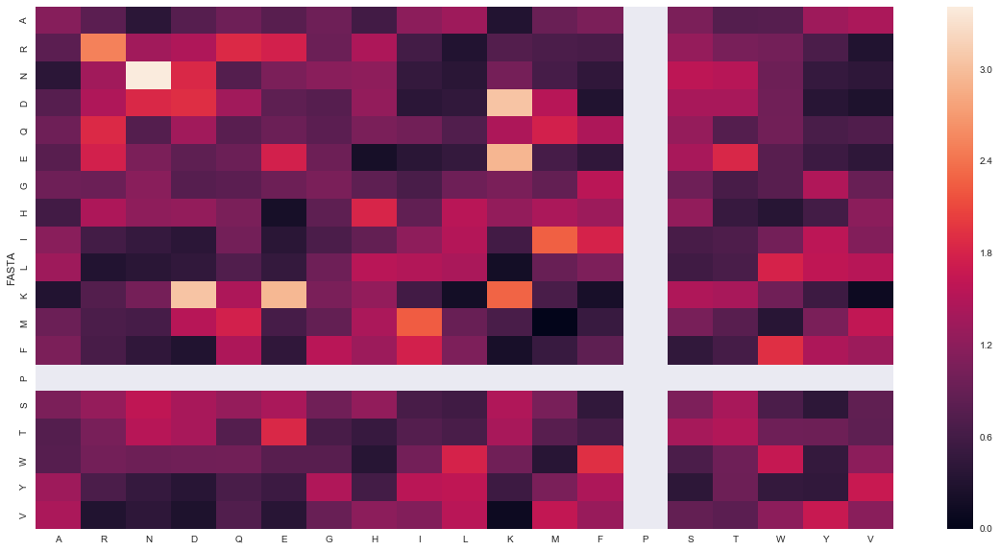

In [339]:
plot_heat_map(barrel_hb_propensity)

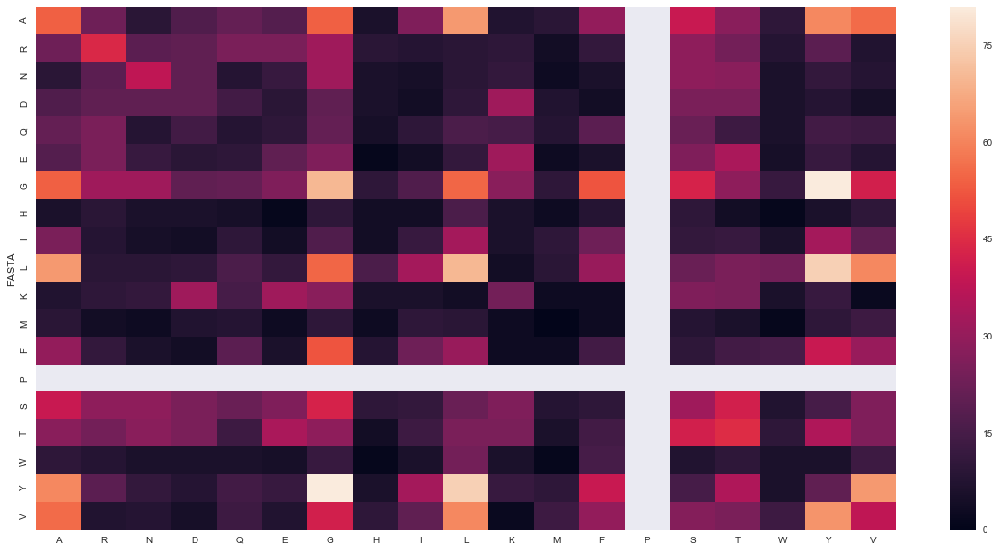

In [340]:
plot_heat_map(barrel_hb_frequency)

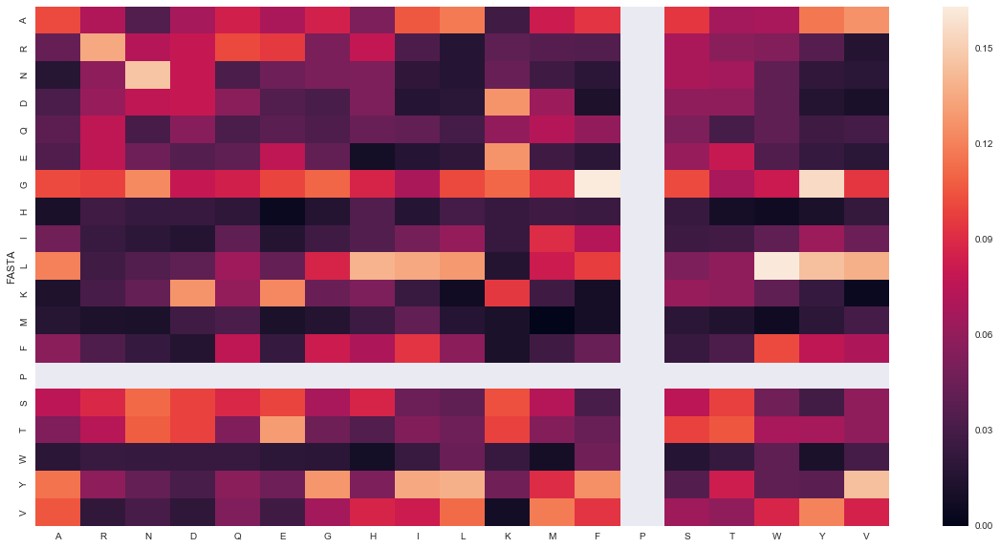

In [341]:
plot_heat_map(barrel_hb_normed_frequencies)

In [342]:
(int_barrel_hb_propensity, int_barrel_hb_frequency, int_barrel_hb_normed_frequencies
 ) = calc_aa_pair_propensities(int_barrel_df, 'hb_pairs_fasta_intra', aa_dict_no_cys)

In [343]:
int_barrel_hb_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.087169,1.185961,0.508054,1.358606,1.187810,0.955270,0.791817,1.584350,1.012338,0.613780,0.382108,0.911696,1.484762,NaN,1.408735,0.742381,0.405990,0.976252,1.466801
1,R,1.096305,1.739531,0.878269,1.370023,1.347515,1.155957,0.798471,0.639065,0.680563,0.618937,0.385319,0.919357,0.873389,NaN,1.065430,0.982563,0.409401,0.984456,0.633912
2,N,0.510180,0.867336,2.919385,1.480045,0.597223,0.853872,1.179616,0.424854,0.678662,0.822945,0.640404,0.611193,0.331790,NaN,1.206738,1.306425,0.544344,0.503439,0.280952
3,D,1.364290,1.352968,1.480045,0.532787,0.931615,0.599385,0.782042,1.491153,0.529327,0.802326,1.198770,2.145167,0.776346,NaN,1.411804,1.091737,0.636846,0.353395,0.493042
4,Q,1.118231,1.330741,0.597223,0.931615,0.814498,0.786050,0.723947,0.869129,1.156957,0.982047,1.310084,2.500652,1.527184,NaN,1.126988,0.636327,2.227143,1.029893,1.005806
5,E,0.949953,1.130484,0.930140,0.593566,0.778419,0.890348,0.854172,0.000000,0.393141,0.953444,2.225871,0.796627,0.864910,NaN,1.048573,1.567649,1.418993,0.699927,0.976511
6,G,0.846386,0.810419,1.169060,0.775043,0.717469,0.820634,0.629832,1.361052,1.087074,1.263260,1.436110,0.611876,2.524427,NaN,0.798388,0.498242,1.743848,2.459531,1.125063
7,H,1.630753,0.646888,0.435475,1.528431,0.890857,0.000000,1.231716,0.000000,2.024675,1.227559,1.719485,2.735088,0.742381,NaN,1.173946,0.556786,0.000000,0.901156,0.628629
8,I,0.836284,0.829344,0.669961,0.522541,1.142125,0.391905,1.173062,1.949969,1.038295,2.203311,1.469646,2.805218,1.522833,NaN,0.602023,0.999359,1.249199,0.924263,0.644748
9,L,0.593001,0.588080,0.791772,0.771935,0.944848,1.042112,1.333026,1.152254,2.147383,1.301957,0.347371,1.243222,0.674892,NaN,0.853779,0.759253,1.476326,1.228849,2.285924


In [344]:
int_barrel_hb_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,20.0,22.0,7.0,16.0,16.0,15.0,27.0,5.0,6.0,6.0,4.0,4.0,12.0,NaN,36.0,16.0,1.0,13.0,14.0
1,R,20.0,32.0,12.0,16.0,18.0,18.0,27.0,2.0,4.0,6.0,4.0,4.0,7.0,NaN,27.0,21.0,1.0,13.0,6.0
2,N,7.0,12.0,30.0,13.0,6.0,10.0,30.0,1.0,3.0,6.0,5.0,2.0,2.0,NaN,23.0,21.0,1.0,5.0,2.0
3,D,16.0,16.0,13.0,4.0,8.0,6.0,17.0,3.0,2.0,5.0,8.0,6.0,4.0,NaN,23.0,15.0,1.0,3.0,3.0
4,Q,15.0,18.0,6.0,8.0,8.0,9.0,18.0,2.0,5.0,7.0,10.0,8.0,9.0,NaN,21.0,10.0,4.0,10.0,7.0
5,E,15.0,18.0,11.0,6.0,9.0,12.0,25.0,0.0,2.0,8.0,20.0,3.0,6.0,NaN,23.0,29.0,3.0,8.0,8.0
6,G,29.0,28.0,30.0,17.0,18.0,24.0,40.0,8.0,12.0,23.0,28.0,5.0,38.0,NaN,38.0,20.0,8.0,61.0,20.0
7,H,5.0,2.0,1.0,3.0,2.0,0.0,7.0,0.0,2.0,2.0,3.0,2.0,1.0,NaN,5.0,2.0,0.0,2.0,1.0
8,I,5.0,5.0,3.0,2.0,5.0,2.0,13.0,2.0,2.0,7.0,5.0,4.0,4.0,NaN,5.0,7.0,1.0,4.0,2.0
9,L,6.0,6.0,6.0,5.0,7.0,9.0,25.0,2.0,7.0,7.0,2.0,3.0,3.0,NaN,12.0,9.0,2.0,9.0,12.0


In [345]:
int_barrel_hb_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.083682,0.091286,0.039106,0.104575,0.091429,0.073529,0.060948,0.121951,0.077922,0.047244,0.029412,0.070175,0.114286,NaN,0.108434,0.057143,0.03125,0.075145,0.112903
1,R,0.083682,0.132780,0.067039,0.104575,0.102857,0.088235,0.060948,0.048780,0.051948,0.047244,0.029412,0.070175,0.066667,NaN,0.081325,0.075000,0.03125,0.075145,0.048387
2,N,0.029289,0.049793,0.167598,0.084967,0.034286,0.049020,0.067720,0.024390,0.038961,0.047244,0.036765,0.035088,0.019048,NaN,0.069277,0.075000,0.03125,0.028902,0.016129
3,D,0.066946,0.066390,0.072626,0.026144,0.045714,0.029412,0.038375,0.073171,0.025974,0.039370,0.058824,0.105263,0.038095,NaN,0.069277,0.053571,0.03125,0.017341,0.024194
4,Q,0.062762,0.074689,0.033520,0.052288,0.045714,0.044118,0.040632,0.048780,0.064935,0.055118,0.073529,0.140351,0.085714,NaN,0.063253,0.035714,0.12500,0.057803,0.056452
5,E,0.062762,0.074689,0.061453,0.039216,0.051429,0.058824,0.056433,0.000000,0.025974,0.062992,0.147059,0.052632,0.057143,NaN,0.069277,0.103571,0.09375,0.046243,0.064516
6,G,0.121339,0.116183,0.167598,0.111111,0.102857,0.117647,0.090293,0.195122,0.155844,0.181102,0.205882,0.087719,0.361905,NaN,0.114458,0.071429,0.25000,0.352601,0.161290
7,H,0.020921,0.008299,0.005587,0.019608,0.011429,0.000000,0.015801,0.000000,0.025974,0.015748,0.022059,0.035088,0.009524,NaN,0.015060,0.007143,0.00000,0.011561,0.008065
8,I,0.020921,0.020747,0.016760,0.013072,0.028571,0.009804,0.029345,0.048780,0.025974,0.055118,0.036765,0.070175,0.038095,NaN,0.015060,0.025000,0.03125,0.023121,0.016129
9,L,0.025105,0.024896,0.033520,0.032680,0.040000,0.044118,0.056433,0.048780,0.090909,0.055118,0.014706,0.052632,0.028571,NaN,0.036145,0.032143,0.06250,0.052023,0.096774


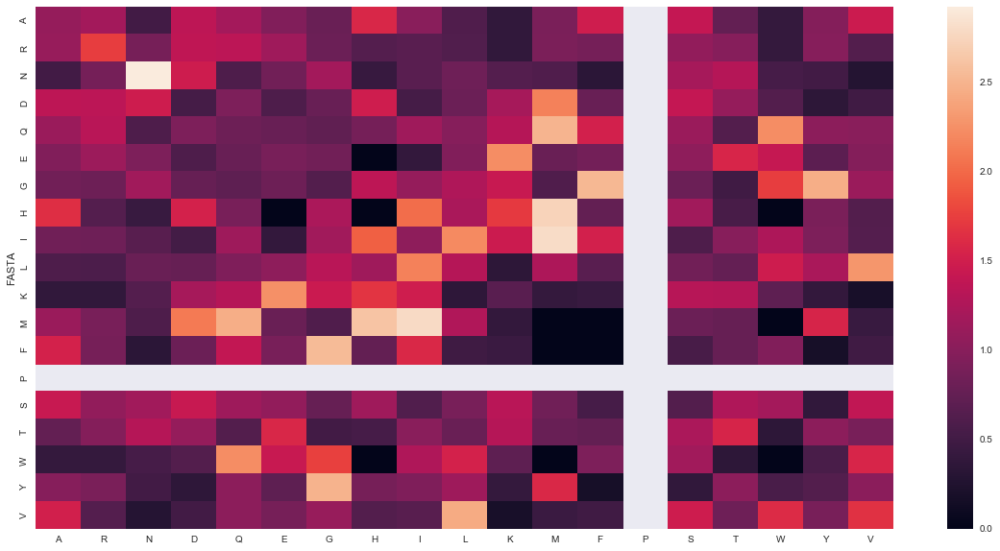

In [346]:
plot_heat_map(int_barrel_hb_propensity)

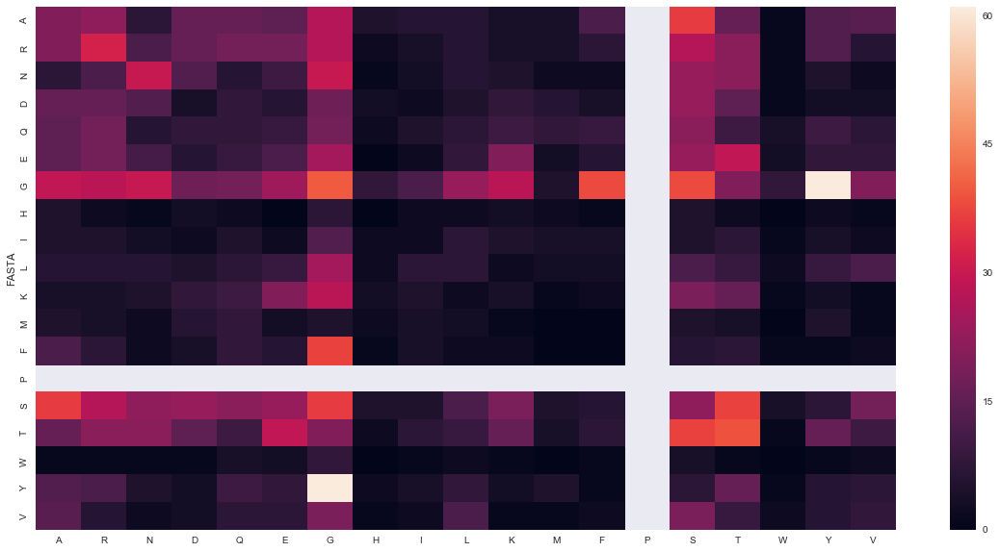

In [347]:
plot_heat_map(int_barrel_hb_frequency)

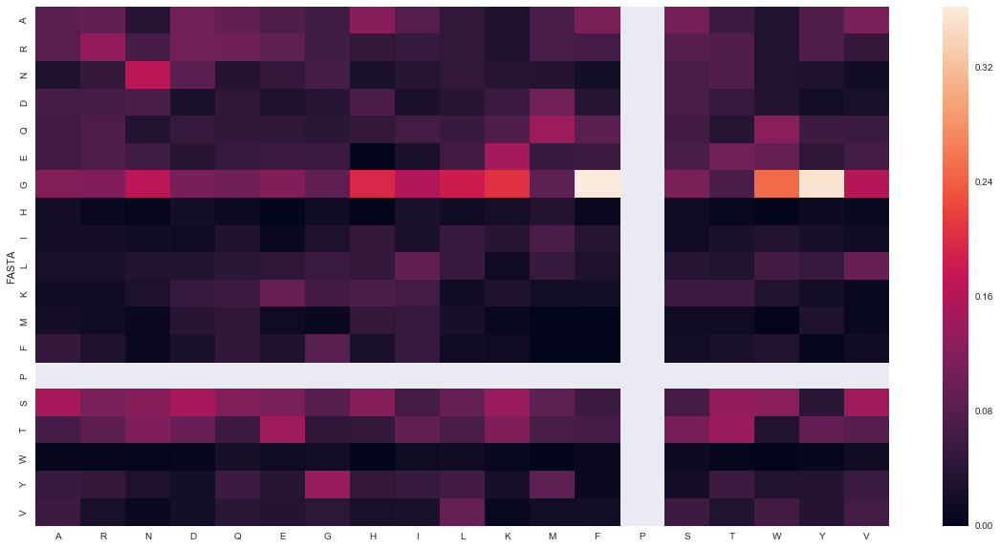

In [348]:
plot_heat_map(int_barrel_hb_normed_frequencies)

In [349]:
(ext_barrel_hb_propensity, ext_barrel_hb_frequency, ext_barrel_hb_normed_frequencies
 ) = calc_aa_pair_propensities(ext_barrel_df, 'hb_pairs_fasta_intra', aa_dict_no_cys)

In [350]:
ext_barrel_hb_propensity

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,1.165162,0.118129,0.247925,0.101424,0.687737,0.528471,1.419402,0.135689,1.195352,1.396584,0.259680,0.947260,0.844566,NaN,0.436563,0.825284,0.779040,1.384959,1.322007
1,R,0.342305,4.719786,2.889169,1.350781,3.205791,4.105662,0.875178,3.162469,0.795996,0.240517,1.729232,0.000000,0.624894,NaN,0.726779,0.686955,2.017437,0.576411,0.104802
2,N,0.247925,2.991140,3.587258,2.568151,0.995096,1.274421,0.380324,2.454121,0.432393,0.261302,1.878672,0.685302,0.678897,NaN,2.368760,1.741417,1.565560,0.626224,0.683153
3,D,0.101424,1.398455,2.568151,4.802775,2.442507,1.564062,0.466762,1.204750,0.353776,0.356321,6.148380,0.560701,0.000000,NaN,0.646025,2.035423,1.280913,0.426971,0.186315
4,Q,0.825284,3.318936,0.995096,2.442507,0.000000,0.707042,0.633006,1.633839,1.199446,0.869814,1.737128,0.000000,1.883242,NaN,0.438058,0.828110,0.694851,0.463234,0.758019
5,E,0.537908,4.326471,0.648589,1.591991,0.719667,7.373434,0.275056,0.709942,0.625425,0.377955,5.434729,0.000000,0.000000,NaN,1.713121,1.799168,0.905788,0.603859,0.000000
6,G,1.342374,0.740359,0.388460,0.476746,0.646546,0.552022,2.471092,0.425206,0.468233,1.207299,0.000000,1.484209,1.029237,NaN,0.855034,0.969819,0.542504,0.904174,1.085008
7,H,0.133879,3.230431,2.421399,1.188687,1.612055,0.688187,0.616126,2.120360,0.466984,1.316962,1.014483,0.740126,1.283115,NaN,2.131884,0.537352,0.338161,0.450881,1.106708
8,I,1.217086,0.629305,0.440254,0.360208,1.221254,0.625625,0.373409,0.481900,1.061328,1.111722,0.153710,2.018525,1.583064,NaN,1.162846,0.610627,0.768548,1.485859,1.006099
9,L,1.413533,0.252027,0.264473,0.360645,0.880370,0.250554,1.121588,1.350958,1.105120,1.078822,0.123117,0.808390,0.934307,NaN,0.776171,0.782551,1.354285,1.354285,1.096859


In [351]:
ext_barrel_hb_frequency

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,34.0,1.0,2.0,1.0,5.0,3.0,27.0,1.0,20.0,58.0,3.0,5.0,18.0,NaN,4.0,12.0,9.0,48.0,42.0
1,R,3.0,12.0,7.0,4.0,7.0,7.0,5.0,7.0,4.0,3.0,6.0,0.0,4.0,NaN,2.0,3.0,7.0,6.0,1.0
2,N,2.0,7.0,8.0,7.0,2.0,2.0,2.0,5.0,2.0,3.0,6.0,1.0,4.0,NaN,6.0,7.0,5.0,6.0,6.0
3,D,1.0,4.0,7.0,16.0,6.0,3.0,3.0,3.0,2.0,5.0,24.0,1.0,0.0,NaN,2.0,10.0,5.0,5.0,2.0
4,Q,6.0,7.0,2.0,6.0,0.0,1.0,3.0,3.0,5.0,9.0,5.0,0.0,10.0,NaN,1.0,3.0,2.0,4.0,6.0
5,E,3.0,7.0,1.0,3.0,1.0,8.0,1.0,1.0,2.0,3.0,12.0,0.0,0.0,NaN,3.0,5.0,2.0,4.0,0.0
6,G,25.0,4.0,2.0,3.0,3.0,2.0,30.0,2.0,5.0,32.0,0.0,5.0,14.0,NaN,5.0,9.0,4.0,20.0,22.0
7,H,1.0,7.0,5.0,3.0,3.0,1.0,3.0,4.0,2.0,14.0,3.0,1.0,7.0,NaN,5.0,2.0,1.0,4.0,9.0
8,I,20.0,3.0,2.0,2.0,5.0,2.0,4.0,2.0,10.0,26.0,1.0,6.0,19.0,NaN,6.0,5.0,5.0,29.0,18.0
9,L,58.0,3.0,3.0,5.0,9.0,2.0,30.0,14.0,26.0,63.0,2.0,6.0,28.0,NaN,10.0,16.0,22.0,66.0,49.0


In [352]:
ext_barrel_hb_normed_frequencies

,FASTA,A,R,N,D,Q,E,G,H,I,L,K,M,F,P,S,T,W,Y,V
0,A,0.116041,0.011765,0.024691,0.010101,0.068493,0.052632,0.141361,0.013514,0.119048,0.139089,0.025862,0.094340,0.084112,NaN,0.043478,0.082192,0.077586,0.137931,0.131661
1,R,0.010239,0.141176,0.086420,0.040404,0.095890,0.122807,0.026178,0.094595,0.023810,0.007194,0.051724,0.000000,0.018692,NaN,0.021739,0.020548,0.060345,0.017241,0.003135
2,N,0.006826,0.082353,0.098765,0.070707,0.027397,0.035088,0.010471,0.067568,0.011905,0.007194,0.051724,0.018868,0.018692,NaN,0.065217,0.047945,0.043103,0.017241,0.018809
3,D,0.003413,0.047059,0.086420,0.161616,0.082192,0.052632,0.015707,0.040541,0.011905,0.011990,0.206897,0.018868,0.000000,NaN,0.021739,0.068493,0.043103,0.014368,0.006270
4,Q,0.020478,0.082353,0.024691,0.060606,0.000000,0.017544,0.015707,0.040541,0.029762,0.021583,0.043103,0.000000,0.046729,NaN,0.010870,0.020548,0.017241,0.011494,0.018809
5,E,0.010239,0.082353,0.012346,0.030303,0.013699,0.140351,0.005236,0.013514,0.011905,0.007194,0.103448,0.000000,0.000000,NaN,0.032609,0.034247,0.017241,0.011494,0.000000
6,G,0.085324,0.047059,0.024691,0.030303,0.041096,0.035088,0.157068,0.027027,0.029762,0.076739,0.000000,0.094340,0.065421,NaN,0.054348,0.061644,0.034483,0.057471,0.068966
7,H,0.003413,0.082353,0.061728,0.030303,0.041096,0.017544,0.015707,0.054054,0.011905,0.033573,0.025862,0.018868,0.032710,NaN,0.054348,0.013699,0.008621,0.011494,0.028213
8,I,0.068259,0.035294,0.024691,0.020202,0.068493,0.035088,0.020942,0.027027,0.059524,0.062350,0.008621,0.113208,0.088785,NaN,0.065217,0.034247,0.043103,0.083333,0.056426
9,L,0.197952,0.035294,0.037037,0.050505,0.123288,0.035088,0.157068,0.189189,0.154762,0.151079,0.017241,0.113208,0.130841,NaN,0.108696,0.109589,0.189655,0.189655,0.153605


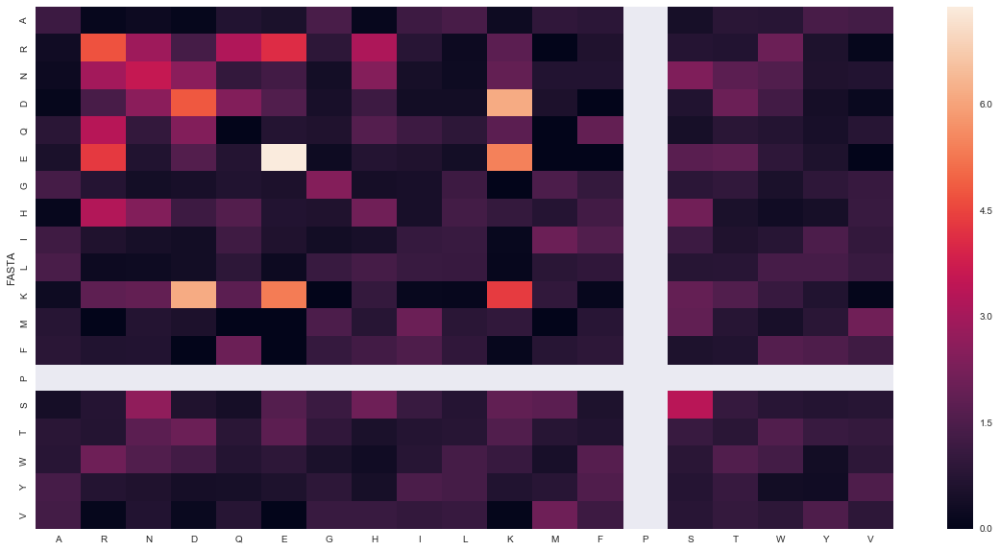

In [353]:
plot_heat_map(ext_barrel_hb_propensity)

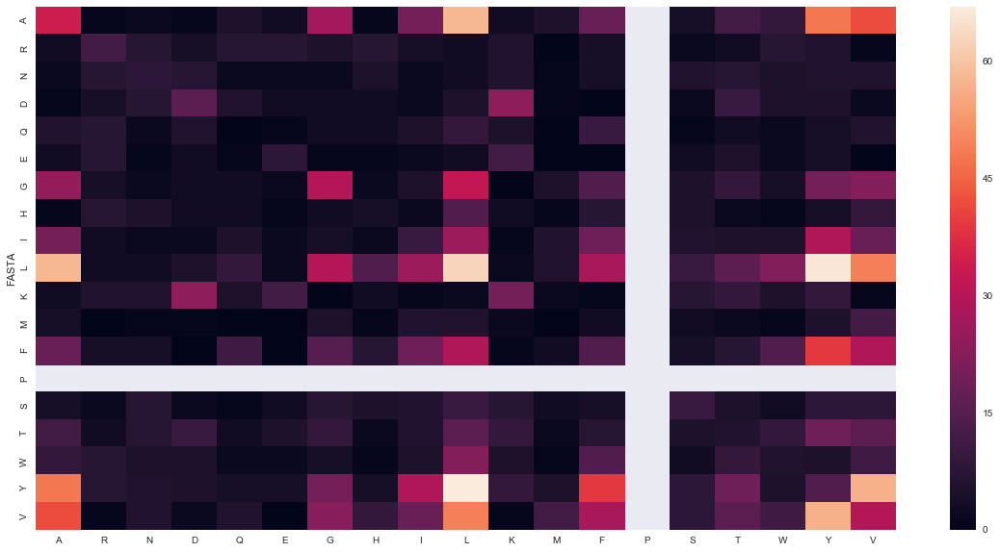

In [354]:
plot_heat_map(ext_barrel_hb_frequency)

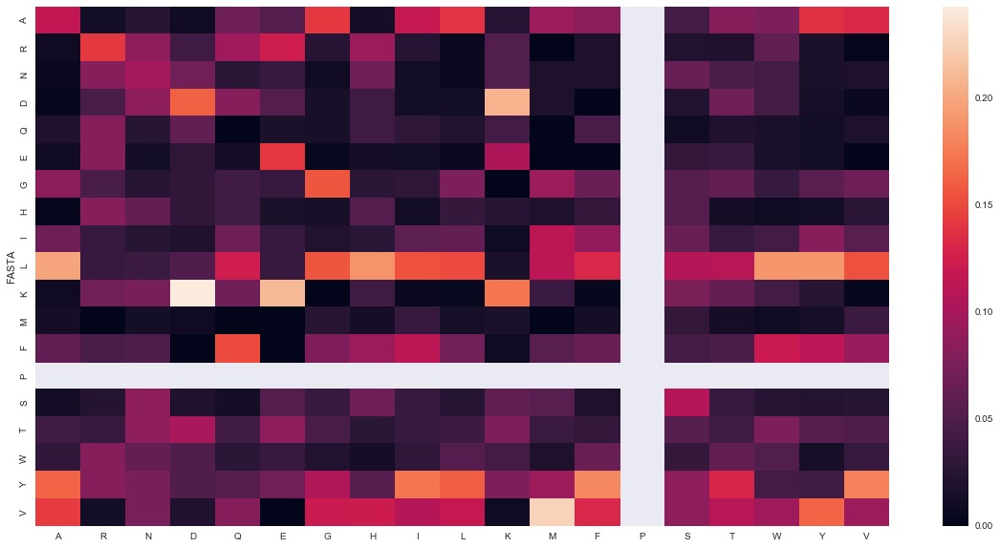

In [355]:
plot_heat_map(ext_barrel_hb_normed_frequencies)

### Standard error of proportion

Recalculate HB / NHB standard error of proportion z-scores from count data in Dek's 1998 paper

In [356]:
dek_sandwich_hb_pairs_dict, dek_sandwich_hb_pairs_total = gen_dek_sandwich_dicts(aa_dict, 'hb')
dek_sandwich_nhb_pairs_dict, dek_sandwich_nhb_pairs_total = gen_dek_sandwich_dicts(aa_dict, 'nhb')

dek_sandwich_hb_nhb_z_scores, dek_sandwich_hb_nhb_ratios = calc_std_error_proportion(
    aa_dict, dek_sandwich_hb_pairs_dict, dek_sandwich_nhb_pairs_dict, dek_sandwich_hb_pairs_total,
    dek_sandwich_nhb_pairs_total
)

In [357]:
dek_sandwich_hb_nhb_z_scores

OrderedDict([('A_A', -0.9917272290517626),
             ('A_R', 1.6861595589010434),
             ('A_N', 0.5328444971166847),
             ('A_D', -0.026693745633329703),
             ('A_C', 0.5958060967130397),
             ('A_Q', 0.3342758629156536),
             ('A_E', 0.7997221294470417),
             ('A_G', 3.0361812838032494),
             ('A_H', -0.2783801320320287),
             ('A_I', -0.21904628521908812),
             ('A_L', 0.5094448027492848),
             ('A_K', 1.469535216348092),
             ('A_M', -0.2783801320320287),
             ('A_F', -1.798811525346199),
             ('A_P', nan),
             ('A_S', 0.5818773607079629),
             ('A_T', -0.29877097837860317),
             ('A_W', 1.861450237884715),
             ('A_Y', 0.7976782751892455),
             ('A_V', 1.1992427906982426),
             ('R_R', 1.1746299321444729),
             ('R_N', -1.3729028313815383),
             ('R_D', -2.187819131947823),
             ('R_C', -0.2572890293212942

In [359]:
print_significant_z_scores(dek_sandwich_hb_nhb_z_scores)

Outside 99% confidence limit, favours HB: A_G
Outside 95% confidence limit, favours NHB: R_D
Outside 95% confidence limit, favours HB: R_S
Outside 99% confidence limit, favours NHB: N_F
Outside 95% confidence limit, favours HB: D_E
Outside 95% confidence limit, favours NHB: D_Y
Outside 99% confidence limit, favours NHB: C_C
Outside 95% confidence limit, favours NHB: Q_W
Outside 99% confidence limit, favours NHB: E_S
Outside 99% confidence limit, favours HB: G_F
Outside 99% confidence limit, favours HB: G_W
Outside 99% confidence limit, favours HB: G_V
Outside 95% confidence limit, favours HB: H_H
Outside 99% confidence limit, favours HB: F_V
Outside 99% confidence limit, favours NHB: T_T
Outside 95% confidence limit, favours HB: W_V
Outside 99% confidence limit, favours HB: Y_V
Outside 95% confidence limit, favours NHB: V_V


Calculate HB / NHB standard error of proportion z-scores for new data

In [360]:
barrel_df_hb_pairs_count_dict, barrel_df_hb_pairs_total = calc_pair_proportions(
    barrel_df, 'hb_pairs', aa_dict_no_cys
)
barrel_df_nhb_pairs_count_dict, barrel_df_nhb_pairs_total = calc_pair_proportions(
    barrel_df, 'nhb_pairs', aa_dict_no_cys
)

barrel_df_hb_nhb_z_scores, barrel_df_hb_nhb_ratios = calc_std_error_proportion(
    aa_dict_no_cys, barrel_df_hb_pairs_count_dict, barrel_df_nhb_pairs_count_dict, barrel_df_hb_pairs_total,
    barrel_df_nhb_pairs_total
)

In [361]:
barrel_df_hb_nhb_z_scores

OrderedDict([('A_A', -0.4155673938454873),
             ('A_R', 1.3198784990933594),
             ('A_N', -0.7729506125268815),
             ('A_D', 0.6387362340908418),
             ('A_Q', 1.1920356887176526),
             ('A_E', 1.3935383427436427),
             ('A_G', -0.014200713355683812),
             ('A_H', 0.6869725978725302),
             ('A_I', 0.26855485029674575),
             ('A_L', -2.000364188151297),
             ('A_K', -1.0760011727293393),
             ('A_M', -0.9625073722540104),
             ('A_F', -1.369253865260389),
             ('A_P', nan),
             ('A_S', 1.6262959684994747),
             ('A_T', 0.2684123127170227),
             ('A_W', 0.8417479726820237),
             ('A_Y', 3.2837297543984363),
             ('A_V', -0.007003326671061558),
             ('R_R', 1.8638567314600123),
             ('R_N', -0.6490911372522833),
             ('R_D', -1.4245214310572885),
             ('R_Q', -0.012603956562204695),
             ('R_E', -0.576107670

In [364]:
print_significant_z_scores(barrel_df_hb_nhb_z_scores)

Outside 95% confidence limit, favours NHB: A_L
Outside 99% confidence limit, favours HB: A_Y
Outside 99% confidence limit, favours NHB: R_K
Outside 95% confidence limit, favours NHB: Q_T
Outside 95% confidence limit, favours HB: Q_V
Outside 95% confidence limit, favours HB: E_E
Outside 95% confidence limit, favours HB: E_S
Outside 99% confidence limit, favours HB: G_K
Outside 99% confidence limit, favours HB: G_F
Outside 99% confidence limit, favours HB: G_Y
Outside 95% confidence limit, favours NHB: H_T
Outside 95% confidence limit, favours NHB: H_Y
Outside 95% confidence limit, favours HB: L_W
Outside 95% confidence limit, favours NHB: K_F
Outside 95% confidence limit, favours HB: S_V
Outside 99% confidence limit, favours NHB: W_Y
Outside 99% confidence limit, favours NHB: Y_Y


In [365]:
barrel_df_dek_sandwich_z_diff_dict = calc_z_diff(barrel_df_hb_nhb_z_scores, dek_sandwich_hb_nhb_z_scores)

In [366]:
barrel_df_dek_sandwich_z_diff_dict

OrderedDict([('A_A', 0.17819799284549842),
             ('A_R', 0.04755525817250672),
             ('A_N', 0.48315358087282995),
             ('A_D', 0.2491507308244031),
             ('A_Q', 0.2524620753425253),
             ('A_E', 0.1302073749349657),
             ('A_G', 0.5044670982522016),
             ('A_H', 0.3635897171361423),
             ('A_I', 0.19255687341445415),
             ('A_L', 0.6720492842506375),
             ('A_K', 0.7881927954431266),
             ('A_M', 0.2224628837876228),
             ('A_F', 0.04943571704775969),
             ('A_P', nan),
             ('A_S', 0.22838129090192116),
             ('A_T', 0.22325162053160347),
             ('A_W', 0.16862420890843288),
             ('A_Y', 0.2120163915294475),
             ('A_V', 0.3875771237551954),
             ('R_R', 0.08890048821753005),
             ('R_N', 0.1732484569006733),
             ('R_D', 0.06280640304248719),
             ('R_Q', 0.16449491725862575),
             ('R_E', 0.248770600383865

In [367]:
int_barrel_df_hb_pairs_count_dict, int_barrel_df_hb_pairs_total = calc_pair_proportions(
    int_barrel_df, 'hb_pairs', aa_dict_no_cys
)
int_barrel_df_nhb_pairs_count_dict, int_barrel_df_nhb_pairs_total = calc_pair_proportions(
    int_barrel_df, 'nhb_pairs', aa_dict_no_cys
)

int_barrel_df_hb_nhb_z_scores, int_barrel_df_hb_nhb_ratios = calc_std_error_proportion(
    aa_dict_no_cys, int_barrel_df_hb_pairs_count_dict, int_barrel_df_nhb_pairs_count_dict,
    int_barrel_df_hb_pairs_total, int_barrel_df_nhb_pairs_total
)

In [368]:
int_barrel_df_hb_nhb_z_scores

OrderedDict([('A_A', -0.5661411242208029),
             ('A_R', 1.261917298893472),
             ('A_N', -1.4664552814862726),
             ('A_D', 0.8157018892994585),
             ('A_Q', 0.8598074968369847),
             ('A_E', 0.8598074968369847),
             ('A_G', -1.1359987730898589),
             ('A_H', 0.6283265564939501),
             ('A_I', 0.5423956047496135),
             ('A_L', -1.722457252145198),
             ('A_K', -1.2477059430396142),
             ('A_M', -0.9346104666776766),
             ('A_F', -0.767819662936225),
             ('A_P', nan),
             ('A_S', 1.793458388636439),
             ('A_T', -0.16893331470244585),
             ('A_W', nan),
             ('A_Y', 0.7196737771314728),
             ('A_V', 2.276277560209813),
             ('R_R', 1.266954851496637),
             ('R_N', -0.5446900684902589),
             ('R_D', -0.16893331470244585),
             ('R_Q', -0.34689032348628257),
             ('R_E', -1.2652966913160653),
             

In [369]:
print_significant_z_scores(int_barrel_df_hb_nhb_z_scores)

Outside 95% confidence limit, favours HB: A_V
Outside 99% confidence limit, favours NHB: R_K
Outside 95% confidence limit, favours NHB: D_Y
Outside 99% confidence limit, favours HB: E_S
Outside 99% confidence limit, favours HB: G_K
Outside 95% confidence limit, favours HB: G_F
Outside 99% confidence limit, favours HB: G_Y
Outside 99% confidence limit, favours HB: L_V


In [370]:
int_barrel_df_dek_sandwich_z_diff_dict = calc_z_diff(int_barrel_df_hb_nhb_z_scores, dek_sandwich_hb_nhb_z_scores)

In [371]:
int_barrel_df_dek_sandwich_z_diff_dict

OrderedDict([('A_A', 0.12498362235871552),
             ('A_R', 0.05760673783747117),
             ('A_N', 0.6316672379800362),
             ('A_D', 0.30331267009248386),
             ('A_Q', 0.17413811822009762),
             ('A_E', 0.016988321254065575),
             ('A_G', 0.870823484794236),
             ('A_H', 0.34474469624997683),
             ('A_I', 0.29292000018897557),
             ('A_L', 0.6522864004073204),
             ('A_K', 0.8230867793575122),
             ('A_M', 0.21536574315191365),
             ('A_F', 0.18527291572245624),
             ('A_P', nan),
             ('A_S', 0.24387481613962003),
             ('A_T', 0.05036714923172936),
             ('A_W', nan),
             ('A_Y', 0.023334330641203493),
             ('A_V', 0.10380207536420638),
             ('R_R', 0.017485684441241434),
             ('R_N', 0.20809207014447956),
             ('R_D', 0.418583157366478),
             ('R_Q', 0.2951299409408239),
             ('R_E', 0.42815930791039886),
     

In [372]:
ext_barrel_df_hb_pairs_count_dict, ext_barrel_df_hb_pairs_total = calc_pair_proportions(
    ext_barrel_df, 'hb_pairs', aa_dict_no_cys
)
ext_barrel_df_nhb_pairs_count_dict, ext_barrel_df_nhb_pairs_total = calc_pair_proportions(
    ext_barrel_df, 'nhb_pairs', aa_dict_no_cys
)

ext_barrel_df_hb_nhb_z_scores, ext_barrel_df_hb_nhb_ratios = calc_std_error_proportion(
    aa_dict_no_cys, ext_barrel_df_hb_pairs_count_dict, ext_barrel_df_nhb_pairs_count_dict,
    ext_barrel_df_hb_pairs_total, ext_barrel_df_nhb_pairs_total
)

In [373]:
ext_barrel_df_hb_nhb_z_scores

OrderedDict([('A_A', 0.030567163384107154),
             ('A_R', 0.13550850263509584),
             ('A_N', 0.13550850263509584),
             ('A_D', -1.2396902282204412),
             ('A_Q', 1.275996622269744),
             ('A_E', 0.590217598756063),
             ('A_G', 0.45249766666716795),
             ('A_H', 0.09578663683557065),
             ('A_I', 0.2801214501465647),
             ('A_L', -1.050887348888776),
             ('A_K', -0.20012774016682972),
             ('A_M', -0.3460759159522666),
             ('A_F', -0.9902821798882323),
             ('A_P', nan),
             ('A_S', -0.8143651272152985),
             ('A_T', 0.5332970956812586),
             ('A_W', 0.5188581099473961),
             ('A_Y', 3.4002123717228274),
             ('A_V', -0.6135430758079478),
             ('R_R', 1.553799137090672),
             ('R_N', -0.6654195148396358),
             ('R_D', -2.3239521707575768),
             ('R_Q', 0.2539423737566076),
             ('R_E', 1.44083008611450

In [374]:
print_significant_z_scores(ext_barrel_df_hb_nhb_z_scores)

Outside 99% confidence limit, favours HB: A_Y
Outside 95% confidence limit, favours NHB: R_D
Outside 95% confidence limit, favours HB: R_W
Outside 95% confidence limit, favours NHB: D_H
Outside 95% confidence limit, favours HB: D_K
Outside 95% confidence limit, favours NHB: Q_W
Outside 99% confidence limit, favours HB: G_G
Outside 95% confidence limit, favours NHB: G_I
Outside 95% confidence limit, favours HB: G_F
Outside 95% confidence limit, favours NHB: H_T
Outside 95% confidence limit, favours NHB: H_Y
Outside 95% confidence limit, favours HB: I_Y
Outside 95% confidence limit, favours HB: L_W
Outside 95% confidence limit, favours NHB: K_F
Outside 95% confidence limit, favours NHB: S_T
Outside 99% confidence limit, favours NHB: W_Y
Outside 99% confidence limit, favours NHB: Y_Y


In [375]:
ext_barrel_df_dek_sandwich_z_diff_dict = calc_z_diff(ext_barrel_df_hb_nhb_z_scores, dek_sandwich_hb_nhb_z_scores)

In [376]:
ext_barrel_df_dek_sandwich_z_diff_dict

OrderedDict([('A_A', 0.351527332832559),
             ('A_R', 0.4002223856175562),
             ('A_N', 0.14903430674050666),
             ('A_D', 0.38180700438055815),
             ('A_Q', 0.26810734468998876),
             ('A_E', 0.06558648317883276),
             ('A_G', 0.3242572745889828),
             ('A_H', 0.147794699933676),
             ('A_I', 0.19700083942421975),
             ('A_L', 0.5481245947487747),
             ('A_K', 0.5084658220629994),
             ('A_M', 0.025717453324735073),
             ('A_F', 0.12499385731363606),
             ('A_P', nan),
             ('A_S', 0.511957449533631),
             ('A_T', 0.32052863310680985),
             ('A_W', 0.2705895349029791),
             ('A_Y', 0.21219193938113534),
             ('A_V', 0.6150245687315821),
             ('R_R', 0.05995523317035478),
             ('R_N', 0.1679998251417325),
             ('R_D', 0.004277361031173791),
             ('R_Q', 0.05923683820802117),
             ('R_E', 0.394141850240603

### Enough residues to split by int/tm, ext/tm, int/ext, ext/ext?

In [ ]:
int_tm_df = barrel_df[(barrel_df['int_ext'] == 'interior') & (barrel_df['tm_ext'] == 'transmembrane')]
int_tm_df = int_tm_df.reset_index(drop=True)

In [ ]:
ext_tm_df = barrel_df[(barrel_df['int_ext'] == 'exterior') & (barrel_df['tm_ext'] == 'transmembrane')]
ext_tm_df = ext_tm_df.reset_index(drop=True)

In [ ]:
int_ext_df = barrel_df[(barrel_df['int_ext'] == 'interior') & (barrel_df['tm_ext'] == 'external')]
int_ext_df = int_ext_df.reset_index(drop=True)

In [ ]:
ext_ext_df = barrel_df[(barrel_df['int_ext'] == 'exterior') & (barrel_df['tm_ext'] == 'external')]
ext_ext_df = ext_ext_df.reset_index(drop=True)